In [1]:
# section 1 load all the necessary modules and packages
import glob
import time
import geopandas as gpd
import netCDF4 as nc4
import numpy as np
import pandas as pd
import xarray as xr
from shapely.geometry import Polygon
# not neccessary for the function but for visualziation
import matplotlib.pyplot as plt
import warnings
import sys
import os


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
# constrcute the river network topology
folder_to_save = './shp_output/'
extension = ''
ll

shp_riv = gpd.read_file('/Volumes/F:/hydrography/HDMA/processed/hdma_global_stream.shp')
shp_int = gpd.read_file(folder_to_save+'river_lake_intersect_simplified'+extension+'_final.shp')


shp_cat = None

for i in np.array([1000000,2000000,3000000,4000000,5000000,6000000]):
# for i in np.array([1000000]):
    
    shp_temp = gpd.read_file(folder_to_save+'HDMA_corrected_basin_HydroLAKES_polys_v10__final_'+\
                             str(i)+'.shp')
    shp_temp = shp_temp.drop(columns=['geometry'])
    if shp_cat is None:
        shp_cat = shp_temp 
    else:
        shp_cat = shp_cat.append(shp_temp)



NameError: name 'll' is not defined

In [14]:
# combine all the IDs into one time
ID_seg = np.array(shp_riv['seg_id'])
ID_lake = np.unique(np.array(shp_int['b_Hylak_id']))
ID_lake_seg = np.unique(np.array(shp_int['a_seg_id']))
ID_cat = np.array(shp_cat['ID'])
args = (ID_seg,ID_lake,ID_cat)
ID_total = np.concatenate(args)
ID_total = ID_total.squeeze()
ID_total = np.unique(ID_total)

print(ID_total)
print(len(ID_total))



[1000000 1000001 1000002 ... 8426992 8427034 8427689]
299463


In [15]:
# preparing the field to create netwrok topology:
df = pd.DataFrame()
df ['ID'] = ID_total
df ['ID_next'] = -9999
df ['length'] = 0 # 
df ['area'] = 0 # 
df ['lake'] = 0
df ['endorheic'] = 0

number_of_lakes = 0
number_of_segs = 0
number_of_hillslopes = 0
number_of_underlake = 0


warnings.simplefilter('ignore') # silent the warning

for index, row in df.iterrows():
    
    print(index)
    
    if (row['ID'] in ID_lake) and (row['ID'] in ID_cat):

        # downstream ID
        shp_int_sub = shp_int[shp_int['b_Hylak_id'] == row['ID']] # find the slice of intersected lakes
        if shp_int_sub['outflow'].sum() == 0: # lake with no outflow
            df ['ID_next'].loc[index] = -9999
        elif shp_int_sub['outflow'].sum() == 1: # lake with outlfow
            # find the location of outflow
            shp_int_sub_temp = shp_int_sub [shp_int_sub['outflow'] == 1]
            if len(shp_int_sub_temp) > 1:
                sys.exit('there is more than one outflow for lake '+ str(row['ID']))
            df ['ID_next'].loc[index] = shp_int_sub_temp['a_seg_id'].iloc[0]
        else:
            sys.exit('there is more than one outflow for lake '+ str(row['ID']))

        # allocated area
        shp_cat_sub = shp_cat[shp_cat['ID']==row['ID']]
        if len(shp_cat_sub) > 1: 
            sys.exit('there is more than 1 elmenet with the same ID in cat_lake: '+ str(row['ID']))
        df['area'].loc[index] = shp_cat_sub['area_cor'].iloc[0]

        # lake flag
        df ['lake'].loc[index] = 1

        # endorheic lake
        if df ['ID_next'].loc[index] == -9999:
            df ['endorheic'].loc[index] = 1

        number_of_lakes = number_of_lakes + 1

    if (not (row['ID'] in ID_lake)) and (row['ID'] in ID_cat): # not a lake but exist in the cat

        # allocated area
        shp_cat_sub = shp_cat[shp_cat['ID']==row['ID']]
        if len(shp_cat_sub) > 1: 
            sys.exit('there is more than 1 elmenet with the same ID in cat_lake: '+ str(row['ID']))
        df['area'].loc[index] = shp_cat_sub['area_cor'].iloc[0]
        

        if (row['ID'] in ID_seg): # it exists in the segment

            if (row['ID'] in ID_lake_seg): # the ID is under lake and should be corrected
                shp_int_sub = shp_int[shp_int['a_seg_id'] == row['ID']]

                if len(shp_int_sub) > 1:
                    sys.exit('there is more than 1 elmenet with the same ID in cat_lake: '+ str(row['ID']))
                
                df ['length'].loc[index] = shp_int_sub ['corr_Len'].iloc[0]
                
                if shp_int_sub ['inflow'].iloc[0] == 1:
                    df ['ID_next'].loc[index] = shp_int_sub ['b_Hylak_id'].iloc[0]
                    
                elif shp_int_sub ['outflow'].iloc[0] == 1:
                    df ['ID_next'].loc[index] = shp_int_sub ['a_Tosegmen'].iloc[0]
                    # ensure the upstream of outflow are directly going to the lake
                    shp_riv_sub = shp_riv[shp_riv['Tosegment'] == row['ID']]
                    if not shp_riv_sub.empty:
                        up_IDs = np.array(shp_riv_sub['seg_id'])
                        temp = df [df['ID'].isin(up_IDs)]
                        indx = temp.index
                        df['ID_next'].loc[indx] = shp_int_sub ['b_Hylak_id'].iloc[0]
                else:
                    sys.exit('neither inflow or outflow to the lake: '+ str(row['ID']))
                    

            else:
                # allocate the doanstream
                shp_riv_sub = shp_riv[shp_riv['seg_id'] == row['ID']] # find the slice of intersected lakes

                if len(shp_riv_sub) >1:
                    sys.exit('there is more than 1 elmenet with the same ID in cat_lake: '+ str(row['ID']))

                df ['ID_next'].loc[index] = shp_riv_sub ['Tosegment'].iloc[0]
                df ['length'].loc[index] = shp_riv_sub ['Length'].iloc[0]

            #
            number_of_segs = number_of_segs + 1

        if not (row['ID'] in ID_seg): # it doesnt exists in the segment so it is hillslope

            #
            number_of_hillslopes = number_of_hillslopes + 1
            
    if (row['ID'] in ID_seg) and not (row['ID'] in ID_cat): # in segment but not in the corrected cat, meanign under lake
        print(row['ID']) 

        # downstream ID
        shp_int_sub = shp_int[shp_int['a_seg_id'] == row['ID']] # find the slice of intersected lakes
        if shp_int_sub['outflow'].sum() == 0: # lake with no outflow
            print(index)
            print(len(df))
            df ['ID_next'].loc[index] = shp_int_sub['b_Hylak_id'].iloc[0]
        else:
            sys.exit('there is more than one outflow for lake '+ str(row['ID']))
            
        number_of_underlake = number_of_underlake + 1


warnings.simplefilter('default') # silent the warning


df.to_csv('../data/Network_topology.csv')



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063


3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717


5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379


6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018


8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658


10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
1025

11475
11476
11477
11478
11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
11514
11515
11516
11517
11518
11519
11520
11521
11522
11523
11524
11525
11526
11527
11528
11529
11530
11531
11532
11533
11534
11535
11536
11537
11538
11539
11540
11541
11542
11543
11544
11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
11580
11581
11582
11583
11584
11585
11586
11587
11588
11589
11590
11591
11592
11593
11594
11595
11596
11597
11598
11599
11600
11601
11602
11603
11604
11605
11606
11607
11608
11609
11610
11611
11612
11613
11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
1164

12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
12894
12895
12896
12897
12898
12899
12900
12901
12902
12903
12904
12905
12906
12907
12908
12909
12910
12911
12912
12913
12914
12915
12916
12917
12918
12919
12920
12921
12922
12923
12924
12925
12926
12927
12928
12929
12930
12931
12932
12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
12945
12946
12947
12948
12949
12950
12951
12952
12953
12954
12955
12956
12957
12958
12959
12960
12961
12962
12963
12964
12965
12966
12967
12968
12969
12970
12971
12972
12973
12974
12975
12976
12977
12978
12979
12980
12981
12982
12983
12984
12985
12986
12987
12988
12989
12990
12991
12992
12993
12994
12995
12996
12997
12998
12999
13000
13001
13002
13003
13004
13005
13006
13007
13008
1300

14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
14251
14252
14253
14254
14255
14256
14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
14315
14316
14317
14318
14319
14320
14321
14322
14323
14324
14325
14326
14327
14328
14329
14330
14331
14332
14333
14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
14392
14393
14394
14395
14396
14397
14398
1439

15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15640
15641
15642
15643
15644
15645
15646
15647
15648
15649
15650
15651
15652
15653
15654
15655
15656
15657
15658
15659
15660
15661
15662
15663
15664
15665
15666
15667
15668
15669
15670
15671
15672
15673
15674
15675
15676
15677
15678
15679
15680
15681
15682
15683
15684
15685
15686
15687
15688
15689
15690
15691
15692
15693
15694
15695
15696
15697
15698
15699
15700
15701
15702
15703
15704
15705
15706
15707
15708
15709
15710
15711
15712
15713
15714
15715
15716
15717
15718
15719
15720
15721
15722
15723
15724
15725
15726
15727
15728
15729
15730
15731
15732
15733
15734
15735
15736
15737
15738
15739
15740
15741
15742
15743
15744
15745
15746
15747
15748
15749
15750
15751
15752
15753
15754
15755
15756
15757
15758
15759
15760
15761
15762
15763
15764
15765
15766
15767
15768
15769
15770
15771
15772
15773
15774
15775
15776
15777
15778
15779
15780
15781
15782
15783
15784
15785
15786
15787
1578

17002
17003
17004
17005
17006
17007
17008
17009
17010
17011
17012
17013
17014
17015
17016
17017
17018
17019
17020
17021
17022
17023
17024
17025
17026
17027
17028
17029
17030
17031
17032
17033
17034
17035
17036
17037
17038
17039
17040
17041
17042
17043
17044
17045
17046
17047
17048
17049
17050
17051
17052
17053
17054
17055
17056
17057
17058
17059
17060
17061
17062
17063
17064
17065
17066
17067
17068
17069
17070
17071
17072
17073
17074
17075
17076
17077
17078
17079
17080
17081
17082
17083
17084
17085
17086
17087
17088
17089
17090
17091
17092
17093
17094
17095
17096
17097
17098
17099
17100
17101
17102
17103
17104
17105
17106
17107
17108
17109
17110
17111
17112
17113
17114
17115
17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17127
17128
17129
17130
17131
17132
17133
17134
17135
17136
17137
17138
17139
17140
17141
17142
17143
17144
17145
17146
17147
17148
17149
17150
17151
17152
17153
17154
17155
17156
17157
17158
17159
17160
17161
17162
17163
17164
17165
17166
17167
1716

18388
18389
18390
18391
18392
18393
18394
18395
18396
18397
18398
18399
18400
18401
18402
18403
18404
18405
18406
18407
18408
18409
18410
18411
18412
18413
18414
18415
18416
18417
18418
18419
18420
18421
18422
18423
18424
18425
18426
18427
18428
18429
18430
18431
18432
18433
18434
18435
18436
18437
18438
18439
18440
18441
18442
18443
18444
18445
18446
18447
18448
18449
18450
18451
18452
18453
18454
18455
18456
18457
18458
18459
18460
18461
18462
18463
18464
18465
18466
18467
18468
18469
18470
18471
18472
18473
18474
18475
18476
18477
18478
18479
18480
18481
18482
18483
18484
18485
18486
18487
18488
18489
18490
18491
18492
18493
18494
18495
18496
18497
18498
18499
18500
18501
18502
18503
18504
18505
18506
18507
18508
18509
18510
18511
18512
18513
18514
18515
18516
18517
18518
18519
18520
18521
18522
18523
18524
18525
18526
18527
18528
18529
18530
18531
18532
18533
18534
18535
18536
18537
18538
18539
18540
18541
18542
18543
18544
18545
18546
18547
18548
18549
18550
18551
18552
18553
1855

19776
19777
19778
19779
19780
19781
19782
19783
19784
19785
19786
19787
19788
19789
19790
19791
19792
19793
19794
19795
19796
19797
19798
19799
19800
19801
19802
19803
19804
19805
19806
19807
19808
19809
19810
19811
19812
19813
19814
19815
19816
19817
19818
19819
19820
19821
19822
19823
19824
19825
19826
19827
19828
19829
19830
19831
19832
19833
19834
19835
19836
19837
19838
19839
19840
19841
19842
19843
19844
19845
19846
19847
19848
19849
19850
19851
19852
19853
19854
19855
19856
19857
19858
19859
19860
19861
19862
19863
19864
19865
19866
19867
19868
19869
19870
19871
19872
19873
19874
19875
19876
19877
19878
19879
19880
19881
19882
19883
19884
19885
19886
19887
19888
19889
19890
19891
19892
19893
19894
19895
19896
19897
19898
19899
19900
19901
19902
19903
19904
19905
19906
19907
19908
19909
19910
19911
19912
19913
19914
19915
19916
19917
19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
1994

21147
21148
21149
21150
21151
21152
21153
21154
21155
21156
21157
21158
21159
21160
21161
21162
21163
21164
21165
21166
21167
21168
21169
21170
21171
21172
21173
21174
21175
21176
21177
21178
21179
21180
21181
21182
21183
21184
21185
21186
21187
21188
21189
21190
21191
21192
21193
21194
21195
21196
21197
21198
21199
21200
21201
21202
21203
21204
21205
21206
21207
21208
21209
21210
21211
21212
21213
21214
21215
21216
21217
21218
21219
21220
21221
21222
21223
21224
21225
21226
21227
21228
21229
21230
21231
21232
21233
21234
21235
21236
21237
21238
21239
21240
21241
21242
21243
21244
21245
21246
21247
21248
21249
21250
21251
21252
21253
21254
21255
21256
21257
21258
21259
21260
21261
21262
21263
21264
21265
21266
21267
21268
21269
21270
21271
21272
21273
21274
21275
21276
21277
21278
21279
21280
21281
21282
21283
21284
21285
21286
21287
21288
21289
21290
21291
21292
21293
21294
21295
21296
21297
21298
21299
21300
21301
21302
21303
21304
21305
21306
21307
21308
21309
21310
21311
21312
2131

22545
22546
22547
22548
22549
22550
22551
22552
22553
22554
22555
22556
22557
22558
22559
22560
22561
22562
22563
22564
22565
22566
22567
22568
22569
22570
22571
22572
22573
22574
22575
22576
22577
22578
22579
22580
22581
22582
22583
22584
22585
22586
22587
22588
22589
22590
22591
22592
22593
22594
22595
22596
22597
22598
22599
22600
22601
22602
22603
22604
22605
22606
22607
22608
22609
22610
22611
22612
22613
22614
22615
22616
22617
22618
22619
22620
22621
22622
22623
22624
22625
22626
22627
22628
22629
22630
22631
22632
22633
22634
22635
22636
22637
22638
22639
22640
22641
22642
22643
22644
22645
22646
22647
22648
22649
22650
22651
22652
22653
22654
22655
22656
22657
22658
22659
22660
22661
22662
22663
22664
22665
22666
22667
22668
22669
22670
22671
22672
22673
22674
22675
22676
22677
22678
22679
22680
22681
22682
22683
22684
22685
22686
22687
22688
22689
22690
22691
22692
22693
22694
22695
22696
22697
22698
22699
22700
22701
22702
22703
22704
22705
22706
22707
22708
22709
22710
2271

23916
23917
23918
23919
23920
23921
23922
23923
23924
23925
23926
23927
23928
23929
23930
23931
23932
23933
23934
23935
23936
23937
23938
23939
23940
23941
23942
23943
23944
23945
23946
23947
23948
23949
23950
23951
23952
23953
23954
23955
23956
23957
23958
23959
23960
23961
23962
23963
23964
23965
23966
23967
23968
23969
23970
23971
23972
23973
23974
23975
23976
23977
23978
23979
23980
23981
23982
23983
23984
23985
23986
23987
23988
23989
23990
23991
23992
23993
23994
23995
23996
23997
23998
23999
24000
24001
24002
24003
24004
24005
24006
24007
24008
24009
24010
24011
24012
24013
24014
24015
24016
24017
24018
24019
24020
24021
24022
24023
24024
24025
24026
24027
24028
24029
24030
24031
24032
24033
24034
24035
24036
24037
24038
24039
24040
24041
24042
24043
24044
24045
24046
24047
24048
24049
24050
24051
24052
24053
24054
24055
24056
24057
24058
24059
24060
24061
24062
24063
24064
24065
24066
24067
24068
24069
24070
24071
24072
24073
24074
24075
24076
24077
24078
24079
24080
24081
2408

25298
25299
25300
25301
25302
25303
25304
25305
25306
25307
25308
25309
25310
25311
25312
25313
25314
25315
25316
25317
25318
25319
25320
25321
25322
25323
25324
25325
25326
25327
25328
25329
25330
25331
25332
25333
25334
25335
25336
25337
25338
25339
25340
25341
25342
25343
25344
25345
25346
25347
25348
25349
25350
25351
25352
25353
25354
25355
25356
25357
25358
25359
25360
25361
25362
25363
25364
25365
25366
25367
25368
25369
25370
25371
25372
25373
25374
25375
25376
25377
25378
25379
25380
25381
25382
25383
25384
25385
25386
25387
25388
25389
25390
25391
25392
25393
25394
25395
25396
25397
25398
25399
25400
25401
25402
25403
25404
25405
25406
25407
25408
25409
25410
25411
25412
25413
25414
25415
25416
25417
25418
25419
25420
25421
25422
25423
25424
25425
25426
25427
25428
25429
25430
25431
25432
25433
25434
25435
25436
25437
25438
25439
25440
25441
25442
25443
25444
25445
25446
25447
25448
25449
25450
25451
25452
25453
25454
25455
25456
25457
25458
25459
25460
25461
25462
25463
2546

26665
26666
26667
26668
26669
26670
26671
26672
26673
26674
26675
26676
26677
26678
26679
26680
26681
26682
26683
26684
26685
26686
26687
26688
26689
26690
26691
26692
26693
26694
26695
26696
26697
26698
26699
26700
26701
26702
26703
26704
26705
26706
26707
26708
26709
26710
26711
26712
26713
26714
26715
26716
26717
26718
26719
26720
26721
26722
26723
26724
26725
26726
26727
26728
26729
26730
26731
26732
26733
26734
26735
26736
26737
26738
26739
26740
26741
26742
26743
26744
26745
26746
26747
26748
26749
26750
26751
26752
26753
26754
26755
26756
26757
26758
26759
26760
26761
26762
26763
26764
26765
26766
26767
26768
26769
26770
26771
26772
26773
26774
26775
26776
26777
26778
26779
26780
26781
26782
26783
26784
26785
26786
26787
26788
26789
26790
26791
26792
26793
26794
26795
26796
26797
26798
26799
26800
1026800
26800
299463
26801
26802
26803
26804
26805
26806
26807
26808
26809
26810
26811
26812
26813
26814
26815
26816
26817
26818
26819
26820
26821
26822
26823
26824
26825
26826
26827
2

28028
28029
28030
28031
28032
28033
28034
28035
28036
28037
28038
28039
28040
28041
28042
28043
28044
28045
28046
28047
28048
28049
28050
28051
28052
28053
28054
28055
28056
28057
28058
28059
28060
28061
28062
28063
28064
28065
28066
28067
28068
28069
28070
28071
28072
28073
28074
28075
28076
28077
28078
28079
28080
28081
28082
28083
28084
28085
28086
28087
28088
28089
28090
28091
28092
28093
28094
28095
28096
28097
28098
28099
28100
28101
28102
28103
28104
28105
28106
28107
28108
28109
28110
28111
28112
28113
28114
28115
28116
28117
28118
28119
28120
28121
28122
28123
28124
28125
28126
28127
28128
28129
28130
28131
28132
28133
28134
28135
28136
28137
28138
28139
28140
28141
28142
28143
28144
28145
28146
28147
28148
28149
28150
28151
28152
28153
28154
28155
28156
28157
28158
28159
28160
28161
28162
28163
28164
28165
28166
28167
28168
28169
28170
28171
28172
28173
28174
28175
28176
28177
28178
28179
28180
28181
28182
28183
28184
28185
28186
28187
28188
28189
28190
28191
28192
28193
2819

29400
29401
29402
29403
29404
29405
29406
29407
29408
29409
29410
29411
29412
29413
29414
29415
29416
29417
29418
29419
29420
29421
29422
29423
29424
29425
29426
29427
29428
29429
29430
29431
29432
29433
29434
29435
29436
29437
29438
29439
29440
29441
29442
29443
29444
29445
29446
29447
29448
29449
29450
29451
29452
29453
29454
29455
29456
29457
29458
29459
29460
29461
29462
29463
29464
29465
29466
29467
29468
29469
29470
29471
29472
29473
29474
29475
29476
29477
29478
29479
29480
29481
29482
29483
29484
29485
29486
29487
29488
29489
29490
29491
29492
29493
29494
29495
29496
29497
29498
29499
29500
29501
29502
29503
29504
29505
29506
29507
29508
29509
29510
29511
29512
29513
29514
29515
29516
29517
29518
29519
29520
29521
29522
29523
29524
29525
29526
29527
29528
29529
29530
29531
29532
29533
1029533
29533
299463
29534
29535
29536
29537
29538
29539
29540
29541
29542
29543
29544
29545
29546
29547
29548
29549
29550
29551
29552
29553
29554
29555
29556
29557
29558
29559
29560
29561
29562
2

30774
30775
30776
30777
30778
30779
30780
30781
30782
30783
30784
30785
30786
30787
30788
30789
30790
30791
30792
30793
30794
30795
30796
30797
30798
30799
30800
30801
30802
30803
30804
30805
30806
30807
30808
30809
30810
30811
30812
30813
30814
30815
30816
30817
30818
30819
30820
30821
30822
30823
30824
30825
30826
30827
30828
30829
30830
30831
30832
30833
30834
30835
30836
30837
30838
30839
30840
30841
30842
30843
30844
30845
30846
30847
30848
30849
30850
30851
30852
30853
30854
30855
30856
30857
30858
30859
30860
30861
30862
30863
30864
30865
30866
30867
30868
30869
30870
30871
30872
30873
30874
30875
30876
30877
30878
30879
30880
30881
30882
30883
30884
30885
30886
30887
30888
30889
30890
30891
30892
30893
30894
30895
30896
30897
30898
30899
30900
30901
30902
30903
30904
30905
30906
30907
30908
30909
30910
30911
30912
30913
30914
30915
30916
30917
30918
30919
30920
30921
30922
30923
30924
30925
30926
30927
30928
30929
30930
30931
30932
30933
30934
30935
30936
30937
30938
30939
3094

32133
32134
32135
32136
32137
32138
1032138
32138
299463
32139
32140
32141
32142
32143
32144
32145
32146
32147
32148
32149
32150
32151
32152
32153
32154
32155
32156
32157
32158
32159
32160
32161
32162
32163
32164
32165
32166
32167
32168
32169
32170
32171
32172
32173
32174
32175
32176
32177
32178
32179
32180
32181
32182
32183
32184
32185
32186
32187
32188
32189
32190
32191
32192
32193
32194
32195
32196
32197
32198
32199
32200
32201
32202
32203
32204
32205
32206
32207
32208
32209
32210
32211
32212
32213
32214
32215
32216
32217
32218
32219
32220
32221
32222
32223
32224
32225
32226
32227
32228
32229
32230
32231
32232
32233
32234
32235
32236
32237
32238
32239
32240
32241
32242
32243
32244
32245
32246
32247
32248
32249
32250
32251
32252
32253
32254
32255
32256
32257
32258
32259
32260
32261
32262
32263
32264
32265
32266
32267
32268
32269
32270
32271
32272
32273
32274
32275
32276
32277
32278
32279
32280
32281
32282
32283
32284
32285
32286
32287
32288
32289
32290
32291
32292
32293
32294
32295
3

33496
33497
33498
33499
33500
33501
33502
33503
33504
33505
33506
33507
33508
33509
33510
33511
33512
33513
33514
33515
33516
33517
33518
33519
33520
33521
33522
33523
33524
33525
33526
33527
33528
33529
33530
33531
33532
33533
33534
33535
33536
33537
33538
33539
33540
33541
33542
33543
33544
33545
33546
33547
33548
33549
33550
33551
33552
33553
33554
33555
33556
33557
33558
33559
33560
33561
33562
33563
33564
33565
33566
33567
33568
33569
33570
33571
33572
33573
33574
33575
33576
33577
33578
33579
33580
33581
33582
33583
33584
33585
33586
33587
33588
33589
33590
33591
33592
33593
33594
33595
33596
33597
33598
33599
33600
33601
33602
33603
33604
33605
33606
33607
33608
33609
33610
33611
33612
33613
33614
33615
33616
33617
33618
33619
33620
33621
33622
33623
33624
33625
33626
33627
33628
33629
33630
33631
33632
33633
33634
33635
33636
33637
33638
33639
33640
33641
33642
33643
33644
33645
33646
33647
33648
33649
33650
33651
33652
33653
33654
33655
33656
33657
33658
33659
33660
33661
3366

1034874
34874
299463
34875
34876
34877
34878
34879
34880
34881
34882
34883
34884
34885
34886
34887
34888
34889
34890
34891
34892
34893
34894
34895
34896
34897
34898
34899
34900
34901
34902
34903
34904
34905
34906
34907
34908
34909
34910
34911
34912
34913
34914
34915
34916
34917
34918
34919
34920
34921
34922
34923
34924
34925
34926
34927
34928
34929
34930
34931
34932
34933
34934
34935
34936
34937
34938
34939
34940
34941
34942
34943
34944
34945
34946
34947
34948
34949
34950
34951
34952
34953
34954
34955
34956
34957
34958
34959
34960
34961
34962
34963
34964
34965
34966
34967
34968
34969
34970
34971
34972
34973
34974
34975
34976
34977
34978
34979
34980
34981
34982
34983
34984
34985
34986
34987
34988
34989
34990
34991
34992
34993
34994
34995
34996
34997
34998
34999
35000
35001
35002
35003
35004
35005
35006
35007
35008
35009
35010
35011
35012
35013
35014
35015
35016
35017
35018
35019
35020
35021
35022
35023
35024
35025
35026
35027
35028
35029
35030
35031
35032
35033
35034
35035
35036
35037
3

36236
36237
36238
36239
36240
36241
36242
36243
36244
36245
36246
36247
36248
36249
36250
36251
36252
36253
36254
36255
36256
36257
36258
36259
36260
36261
36262
36263
36264
36265
36266
36267
36268
36269
36270
36271
36272
36273
36274
36275
36276
36277
36278
36279
36280
36281
36282
36283
36284
36285
36286
36287
36288
36289
36290
36291
36292
36293
36294
36295
36296
36297
36298
36299
36300
36301
36302
36303
36304
36305
36306
36307
36308
36309
36310
36311
36312
36313
36314
36315
36316
36317
36318
36319
36320
36321
36322
36323
36324
36325
36326
36327
36328
36329
36330
36331
36332
36333
36334
36335
36336
36337
36338
36339
36340
36341
36342
36343
36344
36345
36346
36347
36348
36349
36350
36351
36352
36353
36354
36355
36356
36357
36358
36359
36360
36361
36362
36363
36364
36365
36366
36367
36368
36369
36370
36371
36372
36373
36374
36375
36376
36377
36378
36379
36380
36381
36382
36383
36384
36385
36386
36387
36388
36389
36390
36391
36392
36393
36394
36395
36396
36397
36398
36399
36400
36401
3640

37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
37639
37640
37641
37642
37643
37644
37645
37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
37688
37689
37690
37691
37692
37693
37694
37695
37696
37697
37698
37699
37700
37701
37702
37703
37704
37705
37706
37707
37708
37709
37710
37711
37712
37713
37714
37715
37716
37717
37718
37719
37720
37721
37722
37723
37724
37725
37726
37727
37728
37729
37730
37731
37732
37733
37734
37735
37736
37737
37738
37739
37740
37741
37742
37743
37744
37745
37746
37747
37748
37749
37750
37751
37752
37753
37754
37755
37756
37757
37758
37759
37760
37761
37762
37763
37764
37765
37766
37767
37768
37769
37770
37771
3777

38971
38972
38973
38974
38975
38976
38977
38978
38979
38980
38981
38982
38983
38984
38985
38986
38987
38988
38989
38990
38991
38992
38993
38994
38995
38996
38997
38998
38999
39000
39001
39002
39003
39004
39005
39006
39007
39008
39009
39010
39011
39012
39013
39014
39015
39016
39017
39018
39019
39020
39021
39022
39023
39024
39025
39026
39027
39028
39029
39030
39031
39032
39033
39034
39035
39036
39037
39038
39039
39040
39041
39042
39043
39044
39045
39046
39047
39048
39049
39050
39051
39052
39053
39054
39055
39056
39057
39058
39059
39060
39061
39062
39063
39064
39065
39066
39067
39068
39069
39070
39071
39072
39073
39074
39075
39076
1039076
39076
299463
39077
39078
39079
39080
39081
39082
39083
39084
39085
39086
39087
39088
39089
39090
39091
39092
39093
39094
39095
39096
39097
39098
39099
39100
39101
39102
39103
39104
39105
39106
39107
39108
39109
39110
39111
39112
39113
39114
39115
39116
39117
39118
39119
39120
39121
39122
39123
39124
39125
39126
39127
39128
39129
39130
39131
39132
39133
3

40334
40335
40336
40337
40338
40339
40340
40341
40342
40343
40344
40345
40346
40347
40348
40349
40350
40351
40352
40353
40354
40355
40356
40357
40358
40359
40360
40361
40362
40363
40364
40365
40366
40367
40368
40369
40370
40371
40372
40373
40374
40375
40376
40377
40378
40379
40380
40381
40382
40383
40384
40385
40386
40387
40388
40389
40390
40391
40392
40393
40394
40395
40396
40397
40398
40399
40400
40401
40402
40403
40404
40405
40406
40407
40408
40409
40410
40411
40412
40413
40414
40415
40416
40417
40418
40419
40420
40421
40422
40423
40424
40425
40426
40427
40428
40429
40430
40431
40432
40433
40434
40435
40436
40437
40438
40439
40440
40441
40442
40443
40444
40445
40446
40447
40448
40449
40450
40451
40452
40453
40454
40455
40456
40457
40458
40459
40460
40461
40462
40463
40464
40465
40466
40467
40468
40469
40470
40471
40472
40473
40474
40475
40476
40477
40478
40479
40480
40481
40482
40483
40484
40485
40486
40487
40488
40489
40490
40491
40492
40493
40494
40495
40496
40497
40498
40499
4050

41691
41692
41693
41694
41695
41696
41697
41698
41699
41700
41701
41702
41703
41704
41705
41706
41707
41708
41709
41710
41711
41712
41713
41714
41715
41716
41717
41718
41719
41720
41721
41722
41723
41724
41725
41726
41727
41728
41729
41730
41731
41732
41733
41734
41735
41736
41737
41738
41739
41740
41741
41742
41743
41744
41745
41746
41747
41748
41749
41750
41751
41752
41753
41754
41755
41756
41757
41758
41759
41760
41761
41762
41763
41764
41765
41766
41767
41768
41769
41770
41771
41772
41773
41774
41775
41776
41777
41778
41779
41780
41781
41782
41783
41784
41785
41786
41787
41788
41789
41790
41791
41792
41793
41794
41795
41796
41797
41798
41799
41800
41801
41802
41803
41804
41805
41806
1041806
41806
299463
41807
41808
41809
41810
41811
41812
41813
41814
41815
41816
41817
41818
41819
41820
41821
41822
41823
41824
41825
41826
41827
41828
41829
41830
41831
41832
41833
41834
41835
41836
41837
41838
41839
41840
41841
41842
41843
41844
41845
41846
41847
41848
41849
41850
41851
41852
41853
4

43054
43055
43056
43057
43058
43059
43060
43061
43062
43063
43064
43065
43066
43067
43068
43069
43070
43071
43072
43073
43074
43075
43076
43077
43078
43079
43080
43081
43082
43083
43084
43085
43086
43087
43088
43089
43090
43091
43092
43093
43094
43095
43096
43097
43098
43099
43100
43101
43102
43103
43104
43105
43106
43107
43108
43109
43110
43111
43112
43113
43114
43115
43116
43117
43118
43119
43120
43121
43122
43123
43124
43125
43126
43127
43128
43129
43130
43131
43132
43133
43134
43135
43136
43137
43138
43139
43140
43141
43142
43143
43144
43145
43146
43147
43148
43149
43150
43151
43152
43153
43154
43155
43156
43157
43158
43159
43160
43161
43162
43163
43164
43165
43166
43167
43168
43169
43170
43171
43172
43173
43174
43175
43176
43177
43178
43179
43180
43181
43182
43183
43184
43185
43186
43187
43188
43189
43190
43191
43192
43193
43194
43195
43196
43197
43198
43199
43200
43201
43202
43203
43204
43205
43206
43207
43208
43209
43210
43211
43212
43213
43214
43215
43216
43217
43218
43219
4322

44411
44412
44413
44414
44415
44416
44417
44418
44419
44420
44421
44422
44423
44424
44425
44426
44427
44428
44429
44430
44431
44432
44433
44434
44435
44436
44437
44438
44439
44440
44441
44442
44443
44444
44445
44446
44447
44448
44449
44450
44451
44452
44453
44454
44455
44456
44457
44458
44459
44460
44461
44462
44463
44464
44465
44466
44467
44468
44469
44470
44471
44472
44473
44474
44475
44476
44477
44478
44479
44480
44481
44482
44483
44484
44485
44486
44487
44488
44489
44490
44491
44492
44493
44494
44495
44496
44497
44498
44499
44500
44501
44502
44503
44504
44505
44506
44507
44508
44509
44510
44511
44512
44513
44514
44515
44516
44517
44518
44519
44520
44521
44522
44523
44524
44525
44526
44527
44528
44529
44530
44531
44532
44533
44534
44535
44536
44537
44538
44539
44540
44541
44542
44543
44544
44545
44546
44547
44548
44549
44550
44551
44552
44553
44554
44555
44556
44557
44558
44559
44560
44561
44562
44563
44564
44565
44566
44567
44568
44569
44570
44571
44572
44573
44574
44575
44576
4457

45773
45774
45775
45776
45777
45778
45779
45780
45781
45782
45783
45784
45785
45786
45787
45788
45789
45790
45791
45792
45793
45794
45795
45796
45797
45798
45799
45800
45801
45802
45803
45804
45805
45806
45807
45808
1045808
45808
299463
45809
45810
45811
45812
45813
45814
45815
45816
45817
45818
45819
45820
45821
45822
45823
45824
45825
45826
45827
45828
45829
45830
45831
45832
45833
45834
45835
45836
45837
45838
45839
45840
45841
45842
45843
45844
45845
45846
45847
45848
45849
45850
45851
45852
45853
45854
45855
45856
45857
45858
45859
45860
45861
45862
45863
45864
45865
45866
45867
45868
45869
45870
45871
45872
45873
45874
45875
45876
45877
45878
45879
45880
45881
45882
45883
45884
45885
45886
45887
45888
45889
45890
45891
45892
45893
45894
45895
45896
45897
45898
45899
45900
45901
45902
45903
45904
45905
45906
45907
45908
45909
45910
45911
45912
45913
45914
45915
45916
45917
45918
45919
45920
45921
45922
45923
45924
45925
45926
45927
45928
45929
45930
45931
45932
45933
45934
45935
4

47149
47150
47151
47152
47153
47154
47155
47156
47157
47158
47159
47160
47161
47162
47163
47164
47165
47166
47167
47168
47169
47170
47171
47172
47173
47174
47175
47176
47177
47178
47179
47180
47181
47182
47183
47184
47185
47186
47187
47188
47189
47190
47191
47192
47193
47194
47195
47196
47197
47198
47199
47200
47201
47202
47203
47204
47205
47206
47207
47208
47209
47210
47211
47212
47213
47214
47215
47216
47217
47218
47219
47220
47221
47222
47223
47224
47225
47226
47227
47228
47229
47230
47231
47232
47233
47234
47235
47236
47237
47238
47239
47240
47241
47242
47243
47244
47245
47246
47247
47248
47249
47250
47251
47252
47253
47254
47255
47256
47257
47258
47259
47260
47261
47262
47263
47264
47265
47266
47267
47268
47269
47270
47271
47272
47273
47274
47275
47276
47277
47278
47279
47280
47281
47282
47283
47284
47285
47286
47287
47288
47289
47290
47291
47292
47293
47294
47295
47296
47297
47298
47299
47300
47301
47302
47303
47304
47305
47306
47307
47308
47309
47310
47311
47312
47313
47314
4731

48509
48510
48511
48512
48513
48514
48515
48516
48517
48518
48519
48520
48521
48522
48523
48524
48525
48526
48527
48528
48529
48530
48531
48532
48533
48534
48535
48536
48537
48538
48539
48540
48541
48542
48543
48544
48545
48546
48547
48548
48549
48550
48551
48552
48553
48554
48555
48556
48557
48558
48559
48560
48561
48562
48563
48564
48565
48566
48567
48568
48569
48570
48571
48572
48573
48574
48575
48576
48577
48578
48579
48580
48581
48582
48583
48584
48585
48586
48587
48588
48589
48590
48591
48592
48593
48594
48595
48596
48597
48598
48599
48600
48601
48602
48603
48604
48605
48606
48607
48608
48609
48610
48611
48612
48613
48614
48615
48616
48617
48618
48619
48620
48621
48622
48623
48624
48625
48626
48627
48628
48629
48630
48631
48632
48633
48634
48635
48636
48637
48638
48639
48640
48641
48642
48643
48644
48645
48646
48647
48648
48649
48650
48651
48652
48653
48654
48655
48656
48657
48658
48659
48660
48661
48662
48663
48664
48665
48666
48667
48668
48669
48670
48671
48672
48673
48674
4867

49844
49845
49846
49847
49848
49849
49850
49851
49852
49853
49854
49855
49856
49857
49858
49859
49860
49861
49862
49863
49864
49865
49866
49867
49868
49869
49870
49871
49872
49873
49874
49875
49876
49877
49878
49879
49880
49881
49882
49883
49884
49885
49886
49887
49888
49889
49890
49891
49892
49893
49894
49895
49896
49897
49898
49899
49900
49901
49902
49903
49904
49905
49906
49907
49908
49909
49910
49911
49912
49913
49914
49915
49916
49917
49918
49919
49920
49921
49922
49923
49924
49925
49926
49927
49928
49929
49930
49931
49932
49933
49934
49935
49936
49937
49938
49939
49940
49941
49942
49943
49944
49945
49946
49947
49948
49949
49950
49951
49952
49953
49954
49955
49956
49957
49958
49959
49960
49961
49962
49963
49964
49965
49966
49967
49968
49969
49970
49971
49972
49973
49974
49975
49976
49977
49978
49979
49980
49981
49982
49983
49984
49985
49986
49987
49988
49989
49990
49991
49992
49993
49994
49995
49996
49997
49998
49999
50000
50001
50002
50003
50004
50005
50006
50007
50008
50009
5001

51206
51207
51208
51209
51210
51211
51212
51213
51214
51215
51216
51217
51218
51219
51220
51221
51222
51223
51224
51225
51226
1051226
51226
299463
51227
51228
51229
51230
51231
51232
51233
51234
51235
51236
51237
51238
51239
51240
51241
51242
51243
51244
51245
51246
51247
51248
51249
51250
51251
51252
51253
51254
51255
51256
51257
51258
51259
51260
51261
51262
51263
51264
51265
51266
51267
51268
51269
51270
51271
51272
51273
51274
51275
51276
51277
51278
51279
51280
51281
51282
51283
51284
51285
51286
51287
51288
51289
51290
51291
51292
51293
51294
51295
51296
51297
51298
51299
51300
51301
51302
51303
51304
51305
51306
51307
51308
51309
51310
51311
51312
51313
51314
51315
51316
51317
51318
51319
51320
51321
1051321
51321
299463
51322
51323
51324
51325
51326
51327
51328
51329
51330
51331
51332
51333
51334
51335
51336
51337
51338
51339
51340
51341
51342
51343
51344
51345
51346
51347
51348
51349
51350
51351
51352
51353
51354
51355
51356
51357
51358
51359
51360
51361
51362
51363
51364
5136

52560
52561
52562
52563
52564
52565
52566
52567
52568
52569
52570
52571
52572
52573
52574
52575
52576
52577
52578
52579
52580
52581
52582
52583
52584
52585
52586
52587
1052587
52587
299463
52588
52589
52590
52591
52592
52593
52594
52595
52596
52597
52598
52599
52600
52601
52602
52603
52604
52605
52606
52607
52608
52609
52610
52611
52612
52613
52614
52615
52616
52617
52618
52619
52620
52621
52622
52623
52624
52625
52626
52627
52628
52629
52630
52631
52632
52633
52634
52635
52636
52637
52638
52639
52640
52641
52642
52643
52644
52645
52646
52647
52648
52649
52650
52651
52652
52653
52654
52655
52656
52657
52658
52659
52660
52661
52662
52663
52664
52665
52666
52667
52668
52669
52670
52671
52672
52673
52674
52675
52676
52677
52678
52679
52680
52681
52682
52683
52684
52685
52686
52687
52688
52689
52690
52691
52692
52693
52694
52695
52696
52697
52698
52699
52700
52701
52702
52703
52704
52705
52706
52707
52708
52709
52710
52711
52712
52713
52714
52715
52716
52717
52718
52719
52720
52721
52722
5

53924
53925
53926
53927
53928
53929
53930
53931
53932
53933
53934
53935
53936
53937
53938
53939
53940
53941
53942
53943
53944
53945
53946
53947
53948
53949
53950
53951
53952
53953
53954
53955
53956
53957
1053957
53957
299463
53958
53959
53960
53961
53962
53963
53964
53965
53966
53967
53968
53969
53970
53971
53972
53973
53974
53975
53976
53977
53978
53979
53980
53981
53982
53983
53984
53985
53986
53987
53988
53989
53990
53991
53992
53993
53994
53995
53996
53997
53998
53999
54000
54001
54002
54003
54004
54005
54006
54007
54008
54009
54010
54011
54012
54013
54014
54015
54016
54017
54018
54019
54020
54021
54022
54023
54024
54025
54026
54027
54028
54029
54030
54031
54032
54033
54034
54035
54036
54037
54038
54039
54040
54041
54042
54043
54044
54045
54046
54047
54048
54049
54050
54051
54052
54053
54054
54055
54056
54057
54058
54059
54060
54061
54062
54063
54064
54065
54066
54067
54068
54069
54070
54071
54072
54073
54074
54075
54076
54077
54078
54079
54080
54081
54082
54083
54084
54085
54086
5

55283
55284
55285
55286
55287
55288
55289
55290
55291
55292
55293
55294
55295
55296
55297
55298
55299
55300
55301
55302
55303
55304
55305
55306
55307
55308
55309
55310
55311
55312
55313
55314
55315
55316
55317
55318
55319
55320
55321
55322
55323
55324
55325
55326
55327
55328
55329
55330
55331
55332
55333
55334
55335
55336
55337
55338
55339
55340
55341
55342
55343
55344
55345
55346
55347
55348
55349
55350
55351
55352
55353
55354
55355
55356
55357
55358
55359
55360
55361
55362
55363
55364
55365
55366
55367
55368
55369
55370
55371
55372
55373
55374
55375
55376
55377
55378
55379
55380
55381
55382
55383
55384
55385
55386
55387
55388
55389
55390
55391
55392
55393
55394
55395
55396
55397
55398
55399
55400
55401
55402
55403
55404
55405
55406
55407
55408
55409
55410
55411
55412
55413
55414
55415
55416
55417
55418
55419
55420
55421
55422
55423
55424
55425
55426
55427
55428
55429
55430
55431
55432
55433
55434
55435
55436
55437
55438
55439
55440
55441
55442
55443
55444
55445
55446
55447
55448
5544

56636
56637
56638
56639
56640
56641
56642
56643
56644
56645
56646
56647
56648
56649
56650
56651
56652
56653
56654
56655
56656
56657
56658
56659
56660
56661
56662
56663
56664
56665
56666
56667
56668
56669
56670
56671
56672
56673
56674
56675
56676
56677
56678
56679
56680
56681
56682
56683
56684
56685
56686
56687
56688
56689
56690
56691
56692
56693
56694
56695
56696
56697
56698
56699
56700
56701
56702
56703
56704
56705
56706
56707
56708
56709
56710
56711
56712
56713
56714
56715
56716
56717
56718
56719
56720
56721
56722
56723
56724
56725
56726
56727
56728
56729
56730
56731
56732
56733
56734
56735
56736
56737
56738
56739
56740
56741
56742
56743
56744
56745
56746
56747
56748
56749
56750
56751
56752
56753
56754
56755
56756
56757
56758
56759
56760
56761
56762
56763
56764
56765
56766
56767
56768
56769
56770
56771
56772
56773
56774
56775
56776
56777
56778
56779
56780
56781
56782
56783
56784
56785
56786
56787
56788
56789
56790
56791
56792
56793
56794
56795
56796
56797
56798
56799
56800
56801
5680

57994
57995
57996
57997
57998
57999
58000
58001
58002
58003
58004
58005
58006
58007
58008
58009
58010
58011
58012
58013
58014
58015
58016
58017
58018
58019
58020
58021
58022
58023
58024
58025
58026
58027
58028
58029
58030
58031
58032
58033
58034
58035
58036
58037
58038
58039
58040
58041
58042
58043
58044
58045
58046
58047
58048
58049
58050
58051
58052
58053
58054
58055
58056
58057
58058
58059
58060
58061
58062
58063
58064
58065
58066
58067
58068
58069
58070
58071
58072
58073
58074
58075
58076
58077
58078
58079
58080
58081
58082
58083
58084
58085
58086
58087
58088
58089
58090
58091
58092
58093
58094
58095
58096
58097
58098
58099
58100
58101
58102
58103
58104
58105
58106
58107
58108
58109
58110
58111
58112
58113
58114
58115
58116
58117
58118
58119
58120
58121
58122
58123
58124
58125
58126
58127
58128
58129
58130
58131
58132
58133
58134
58135
58136
58137
58138
58139
58140
58141
58142
58143
58144
58145
58146
58147
58148
58149
58150
58151
58152
58153
58154
58155
58156
58157
58158
58159
5816

59326
59327
59328
59329
59330
59331
59332
59333
59334
59335
59336
59337
59338
59339
59340
59341
59342
59343
59344
59345
59346
59347
59348
59349
59350
59351
59352
59353
59354
59355
59356
59357
59358
59359
59360
59361
59362
59363
59364
59365
59366
59367
59368
59369
59370
59371
59372
59373
59374
59375
59376
59377
59378
59379
59380
59381
59382
59383
59384
59385
59386
59387
59388
59389
59390
59391
59392
59393
59394
59395
59396
59397
59398
59399
59400
59401
59402
59403
59404
59405
59406
59407
59408
59409
59410
59411
59412
59413
59414
59415
59416
59417
59418
59419
59420
59421
59422
59423
59424
59425
59426
59427
59428
59429
59430
59431
59432
59433
59434
59435
59436
59437
59438
59439
59440
59441
59442
59443
59444
59445
59446
59447
59448
59449
59450
59451
59452
1059452
59452
299463
59453
59454
59455
59456
59457
59458
59459
59460
59461
59462
59463
59464
59465
59466
59467
59468
59469
59470
59471
59472
59473
59474
59475
59476
59477
59478
59479
59480
59481
59482
59483
59484
59485
59486
59487
59488
5

60676
60677
60678
60679
60680
60681
60682
60683
60684
60685
60686
60687
60688
60689
60690
60691
60692
60693
60694
60695
60696
60697
60698
60699
60700
60701
60702
60703
60704
60705
60706
60707
60708
60709
60710
60711
60712
60713
60714
60715
60716
60717
60718
60719
60720
60721
60722
60723
60724
60725
60726
60727
60728
60729
60730
60731
60732
60733
60734
60735
60736
60737
60738
60739
60740
60741
60742
60743
60744
60745
60746
60747
60748
60749
60750
60751
60752
60753
60754
60755
60756
60757
60758
60759
60760
60761
60762
60763
60764
60765
60766
60767
60768
60769
60770
60771
60772
60773
60774
60775
60776
60777
60778
60779
60780
60781
60782
60783
60784
60785
60786
60787
60788
60789
60790
60791
60792
60793
60794
60795
60796
60797
60798
60799
60800
60801
60802
60803
60804
60805
60806
60807
1060807
60807
299463
60808
60809
60810
60811
60812
60813
60814
60815
60816
60817
60818
60819
60820
60821
60822
60823
60824
60825
60826
60827
60828
60829
60830
60831
60832
60833
60834
60835
60836
60837
60838
6

62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
62084
62085
62086
62087
62088
62089
62090
62091
62092
62093
62094
62095
62096
62097
62098
62099
62100
62101
62102
62103
62104
62105
62106
62107
62108
62109
62110
62111
62112
62113
62114
62115
62116
62117
62118
62119
62120
62121
62122
62123
62124
62125
62126
62127
62128
62129
62130
62131
62132
62133
62134
62135
62136
62137
62138
62139
62140
62141
62142
62143
62144
62145
62146
62147
62148
62149
62150
62151
62152
62153
62154
62155
62156
62157
62158
62159
62160
62161
62162
62163
62164
62165
62166
62167
62168
62169
62170
62171
6217

63372
63373
63374
63375
63376
63377
63378
63379
63380
63381
63382
63383
63384
63385
63386
63387
63388
63389
63390
63391
63392
63393
63394
63395
63396
63397
63398
63399
63400
63401
63402
63403
63404
63405
63406
63407
63408
63409
63410
63411
63412
63413
63414
63415
63416
63417
63418
63419
63420
63421
63422
63423
63424
63425
63426
63427
63428
63429
63430
63431
63432
63433
63434
63435
63436
63437
63438
63439
63440
63441
63442
63443
63444
63445
63446
63447
63448
63449
63450
63451
63452
63453
63454
63455
63456
63457
63458
63459
63460
63461
63462
63463
63464
63465
63466
63467
63468
63469
63470
63471
63472
63473
63474
63475
63476
63477
63478
63479
63480
63481
63482
63483
63484
63485
63486
63487
63488
63489
63490
63491
63492
63493
63494
63495
63496
63497
63498
63499
63500
63501
63502
63503
63504
63505
63506
63507
63508
63509
63510
63511
63512
63513
63514
63515
63516
63517
63518
63519
63520
63521
63522
63523
63524
63525
63526
63527
63528
63529
63530
63531
63532
63533
63534
63535
63536
63537
6353

64751
64752
64753
64754
64755
64756
64757
64758
64759
64760
64761
64762
64763
64764
64765
64766
64767
64768
64769
64770
64771
64772
64773
64774
64775
64776
64777
64778
64779
64780
64781
64782
64783
64784
64785
64786
64787
64788
64789
64790
64791
64792
64793
64794
64795
64796
64797
64798
64799
64800
64801
64802
64803
64804
64805
64806
64807
64808
64809
64810
64811
64812
64813
64814
64815
64816
64817
64818
64819
64820
64821
64822
64823
64824
64825
64826
64827
64828
64829
64830
64831
64832
64833
64834
64835
64836
64837
64838
64839
64840
64841
64842
64843
64844
64845
64846
64847
64848
64849
64850
64851
64852
64853
64854
64855
64856
64857
64858
64859
64860
64861
64862
64863
64864
64865
64866
64867
64868
64869
64870
64871
64872
64873
64874
64875
64876
64877
64878
64879
64880
64881
64882
64883
64884
64885
64886
64887
64888
64889
64890
64891
64892
64893
64894
64895
64896
64897
64898
64899
64900
64901
64902
64903
64904
64905
64906
64907
64908
64909
64910
64911
64912
64913
64914
64915
64916
6491

66099
66100
66101
66102
66103
66104
66105
66106
66107
66108
66109
66110
66111
66112
66113
66114
66115
66116
66117
66118
66119
66120
66121
66122
66123
66124
66125
66126
66127
66128
66129
66130
66131
66132
66133
66134
66135
66136
66137
66138
66139
66140
66141
66142
66143
66144
66145
66146
66147
66148
66149
66150
66151
66152
66153
66154
66155
66156
66157
66158
66159
66160
66161
66162
66163
66164
66165
66166
66167
66168
66169
66170
66171
66172
66173
66174
66175
66176
66177
66178
66179
66180
66181
66182
66183
66184
66185
66186
66187
66188
66189
66190
66191
66192
66193
66194
66195
66196
66197
66198
66199
66200
66201
66202
66203
66204
66205
66206
66207
66208
66209
66210
66211
66212
66213
66214
66215
66216
66217
66218
66219
66220
66221
66222
66223
66224
66225
66226
66227
66228
66229
66230
66231
66232
66233
66234
66235
66236
66237
66238
66239
66240
66241
66242
66243
66244
66245
66246
66247
66248
66249
66250
66251
66252
66253
66254
66255
66256
66257
66258
66259
66260
66261
66262
66263
66264
6626

67422
67423
67424
67425
67426
67427
67428
67429
67430
67431
67432
67433
67434
67435
67436
67437
67438
67439
67440
67441
67442
67443
67444
67445
67446
67447
67448
67449
67450
67451
67452
67453
67454
67455
67456
1067456
67456
299463
67457
67458
67459
67460
67461
67462
67463
67464
67465
67466
67467
67468
67469
67470
67471
67472
67473
67474
67475
67476
67477
67478
67479
67480
67481
67482
67483
67484
67485
67486
67487
67488
67489
67490
67491
67492
67493
67494
67495
67496
67497
67498
67499
67500
67501
67502
67503
67504
67505
67506
67507
67508
67509
67510
67511
67512
67513
67514
67515
67516
67517
67518
67519
67520
67521
67522
67523
67524
67525
67526
67527
67528
67529
67530
67531
67532
67533
67534
67535
67536
67537
67538
67539
67540
67541
67542
67543
67544
67545
67546
67547
67548
67549
67550
67551
67552
67553
67554
67555
67556
67557
67558
67559
67560
67561
67562
67563
67564
67565
67566
67567
67568
67569
67570
67571
67572
67573
67574
67575
67576
67577
67578
67579
67580
67581
67582
67583
67584
6

68753
68754
68755
68756
68757
68758
68759
68760
68761
68762
68763
68764
68765
68766
68767
68768
68769
68770
68771
68772
68773
68774
68775
68776
68777
68778
68779
68780
68781
68782
68783
68784
68785
68786
68787
68788
68789
68790
68791
68792
68793
68794
68795
68796
68797
68798
68799
68800
68801
68802
68803
68804
68805
68806
68807
68808
68809
68810
68811
68812
68813
68814
68815
68816
68817
68818
68819
68820
1068820
68820
299463
68821
68822
68823
68824
68825
68826
68827
68828
68829
68830
68831
68832
68833
68834
68835
68836
68837
68838
68839
68840
68841
68842
68843
68844
68845
68846
68847
68848
68849
68850
68851
68852
68853
68854
68855
68856
68857
68858
68859
68860
68861
68862
68863
68864
68865
68866
68867
68868
68869
68870
68871
68872
68873
68874
68875
68876
68877
68878
68879
68880
68881
68882
68883
68884
68885
68886
68887
68888
68889
68890
68891
68892
68893
68894
68895
68896
68897
68898
68899
68900
68901
68902
68903
68904
68905
68906
68907
68908
68909
68910
68911
68912
68913
68914
68915
6

70098
70099
70100
70101
70102
70103
70104
70105
70106
70107
70108
1070108
70108
299463
70109
70110
70111
70112
70113
70114
70115
70116
70117
70118
70119
70120
70121
70122
70123
70124
70125
70126
70127
70128
70129
70130
70131
70132
70133
70134
70135
70136
70137
70138
70139
70140
70141
70142
70143
70144
70145
70146
70147
70148
70149
70150
70151
70152
70153
70154
70155
70156
70157
70158
70159
70160
70161
70162
70163
70164
70165
70166
70167
70168
70169
70170
70171
70172
70173
70174
70175
70176
70177
70178
70179
70180
70181
70182
70183
70184
70185
70186
70187
70188
70189
70190
70191
70192
70193
70194
70195
70196
70197
70198
70199
70200
70201
70202
70203
70204
70205
70206
70207
70208
1070208
70208
299463
70209
70210
70211
70212
70213
70214
70215
70216
70217
70218
70219
70220
70221
70222
70223
70224
70225
70226
70227
70228
70229
70230
70231
70232
70233
70234
70235
70236
70237
70238
70239
70240
70241
70242
70243
70244
70245
1070245
70245
299463
70246
70247
70248
70249
70250
70251
70252
70253
7

71426
71427
71428
71429
71430
71431
71432
71433
71434
71435
71436
71437
71438
71439
71440
71441
71442
71443
71444
71445
71446
71447
71448
71449
71450
71451
71452
71453
71454
71455
71456
71457
71458
71459
71460
71461
71462
71463
71464
71465
71466
71467
71468
71469
71470
71471
71472
71473
71474
71475
71476
71477
71478
71479
71480
71481
71482
71483
71484
71485
71486
71487
71488
71489
71490
71491
71492
71493
71494
71495
71496
71497
71498
71499
71500
71501
71502
71503
71504
71505
71506
71507
71508
71509
71510
71511
71512
71513
71514
71515
71516
71517
71518
71519
71520
71521
71522
71523
71524
71525
71526
71527
71528
71529
71530
71531
71532
71533
71534
71535
71536
71537
71538
71539
71540
71541
71542
71543
71544
71545
71546
71547
71548
71549
71550
71551
71552
71553
71554
71555
71556
71557
71558
71559
71560
71561
71562
71563
71564
71565
71566
71567
71568
71569
71570
71571
71572
71573
71574
71575
71576
71577
71578
71579
71580
71581
71582
71583
71584
71585
71586
71587
71588
71589
71590
71591
7159

72797
72798
72799
72800
72801
72802
72803
72804
72805
72806
72807
72808
72809
72810
72811
72812
72813
72814
72815
72816
72817
72818
72819
72820
72821
72822
72823
72824
72825
72826
72827
72828
72829
72830
72831
72832
72833
72834
72835
72836
72837
72838
72839
72840
72841
72842
72843
72844
72845
72846
72847
72848
72849
72850
72851
72852
72853
72854
72855
72856
72857
72858
72859
72860
72861
72862
72863
72864
72865
72866
72867
72868
72869
72870
72871
72872
72873
72874
72875
72876
72877
72878
72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
72916
72917
72918
72919
72920
72921
72922
72923
72924
72925
72926
72927
72928
72929
72930
72931
72932
72933
72934
72935
72936
72937
72938
72939
72940
72941
72942
72943
72944
72945
72946
72947
72948
72949
72950
72951
72952
72953
72954
72955
72956
72957
72958
72959
72960
72961
72962
7296

74186
74187
74188
74189
74190
74191
74192
74193
74194
74195
74196
74197
74198
74199
74200
74201
74202
74203
74204
74205
74206
74207
74208
74209
74210
74211
74212
74213
74214
74215
74216
74217
74218
74219
74220
74221
74222
74223
74224
74225
74226
74227
74228
74229
74230
74231
74232
74233
74234
74235
74236
74237
74238
74239
74240
74241
74242
74243
74244
74245
74246
74247
74248
74249
74250
74251
74252
74253
74254
74255
74256
74257
74258
74259
74260
74261
74262
74263
74264
74265
74266
74267
74268
74269
74270
74271
74272
74273
74274
74275
74276
74277
74278
74279
74280
74281
74282
74283
74284
74285
74286
74287
74288
74289
74290
74291
74292
74293
74294
74295
74296
74297
74298
74299
74300
74301
74302
74303
74304
74305
74306
74307
74308
74309
74310
74311
74312
74313
74314
74315
74316
74317
74318
74319
74320
74321
74322
74323
74324
74325
74326
74327
74328
74329
74330
74331
74332
74333
74334
74335
74336
74337
74338
74339
74340
74341
74342
74343
74344
74345
74346
74347
74348
74349
74350
74351
7435

75600
75601
75602
75603
75604
75605
75606
75607
75608
75609
75610
75611
75612
75613
75614
75615
75616
75617
75618
75619
75620
75621
75622
75623
75624
75625
75626
75627
75628
75629
75630
75631
75632
75633
75634
75635
75636
75637
75638
75639
75640
75641
75642
75643
75644
75645
75646
75647
75648
75649
75650
75651
75652
75653
75654
75655
75656
75657
75658
75659
75660
75661
75662
75663
75664
75665
75666
75667
75668
75669
75670
75671
75672
75673
75674
75675
75676
75677
75678
75679
75680
75681
75682
75683
75684
75685
75686
75687
75688
75689
75690
75691
75692
75693
75694
75695
75696
75697
75698
75699
75700
75701
75702
75703
75704
75705
75706
75707
75708
75709
75710
75711
75712
75713
75714
75715
75716
75717
75718
75719
75720
75721
75722
75723
75724
75725
75726
75727
75728
75729
75730
75731
75732
75733
75734
75735
75736
75737
75738
75739
75740
75741
75742
75743
75744
75745
75746
75747
75748
75749
75750
75751
75752
75753
75754
75755
75756
75757
75758
75759
75760
75761
75762
75763
75764
75765
7576

76993
76994
76995
76996
76997
76998
76999
77000
77001
77002
77003
77004
77005
77006
77007
77008
77009
77010
77011
77012
77013
77014
77015
77016
77017
77018
77019
77020
77021
77022
77023
77024
77025
77026
77027
77028
77029
77030
77031
77032
77033
77034
77035
77036
77037
77038
77039
77040
77041
77042
77043
77044
77045
77046
77047
77048
77049
77050
77051
77052
77053
77054
77055
77056
77057
77058
77059
77060
77061
77062
77063
77064
77065
77066
77067
77068
77069
77070
77071
77072
77073
77074
77075
77076
77077
77078
77079
77080
77081
77082
77083
77084
77085
77086
77087
77088
77089
77090
77091
77092
77093
77094
77095
77096
77097
77098
77099
77100
77101
77102
77103
77104
77105
77106
77107
77108
77109
77110
77111
77112
77113
77114
77115
77116
77117
77118
77119
77120
77121
77122
77123
77124
77125
77126
77127
77128
77129
77130
77131
77132
77133
77134
77135
77136
77137
77138
77139
77140
77141
77142
77143
77144
77145
77146
77147
77148
77149
77150
77151
77152
77153
77154
77155
77156
77157
77158
7715

78370
78371
78372
78373
78374
78375
78376
78377
78378
78379
78380
78381
78382
78383
78384
78385
78386
78387
78388
78389
78390
78391
78392
78393
78394
78395
78396
78397
78398
78399
78400
78401
78402
78403
78404
78405
78406
78407
78408
78409
78410
78411
78412
78413
78414
78415
78416
78417
78418
78419
78420
78421
78422
78423
78424
78425
78426
78427
78428
78429
78430
78431
78432
78433
78434
78435
78436
78437
78438
78439
78440
78441
78442
78443
78444
78445
78446
78447
78448
78449
78450
78451
78452
78453
78454
78455
78456
78457
78458
78459
78460
78461
78462
78463
78464
78465
78466
78467
78468
78469
78470
78471
78472
78473
78474
78475
78476
78477
78478
78479
78480
78481
78482
78483
78484
78485
78486
78487
78488
78489
78490
78491
78492
78493
78494
78495
78496
78497
78498
78499
78500
78501
78502
78503
78504
78505
78506
78507
78508
78509
78510
78511
78512
78513
78514
78515
78516
78517
78518
78519
78520
78521
78522
78523
78524
78525
78526
78527
78528
78529
78530
78531
78532
78533
78534
78535
7853

79734
79735
79736
79737
79738
79739
79740
79741
79742
79743
79744
79745
79746
79747
79748
79749
79750
79751
79752
79753
79754
79755
79756
79757
79758
79759
79760
79761
79762
79763
79764
79765
79766
79767
79768
79769
79770
79771
79772
79773
79774
79775
79776
79777
79778
79779
79780
79781
79782
79783
79784
79785
79786
79787
79788
79789
79790
79791
79792
79793
79794
79795
79796
79797
79798
79799
79800
79801
79802
79803
79804
79805
79806
79807
79808
79809
79810
79811
79812
79813
79814
79815
79816
79817
79818
79819
79820
79821
79822
79823
79824
79825
79826
79827
79828
79829
79830
79831
79832
79833
79834
79835
79836
79837
79838
79839
79840
79841
79842
79843
79844
79845
79846
79847
79848
79849
79850
79851
79852
79853
79854
79855
79856
79857
79858
79859
79860
79861
79862
79863
79864
79865
79866
79867
79868
79869
79870
79871
79872
79873
79874
79875
79876
79877
79878
79879
79880
79881
79882
79883
79884
79885
79886
79887
79888
79889
79890
79891
79892
79893
79894
79895
79896
79897
79898
79899
7990

81121
81122
81123
81124
81125
81126
81127
81128
81129
81130
81131
81132
81133
81134
81135
81136
81137
81138
81139
81140
81141
81142
81143
81144
81145
81146
81147
81148
81149
81150
81151
81152
81153
81154
81155
81156
81157
81158
81159
81160
81161
81162
81163
81164
81165
81166
81167
81168
81169
81170
81171
81172
81173
81174
81175
81176
81177
81178
81179
81180
81181
81182
81183
81184
81185
81186
81187
81188
81189
81190
81191
81192
81193
81194
81195
81196
81197
81198
81199
81200
81201
81202
81203
81204
81205
81206
81207
81208
81209
81210
81211
81212
81213
81214
81215
81216
81217
81218
81219
81220
81221
81222
81223
81224
81225
81226
81227
81228
81229
81230
81231
81232
81233
81234
81235
81236
81237
81238
81239
81240
81241
81242
81243
81244
81245
81246
81247
81248
81249
81250
81251
81252
81253
81254
81255
81256
81257
81258
81259
81260
81261
81262
81263
81264
81265
81266
81267
81268
81269
81270
81271
81272
81273
81274
81275
81276
81277
81278
81279
81280
81281
81282
81283
81284
81285
81286
8128

82510
82511
82512
82513
82514
82515
82516
82517
82518
82519
82520
82521
82522
82523
82524
82525
82526
82527
82528
82529
82530
82531
82532
82533
82534
82535
82536
82537
82538
82539
82540
82541
82542
82543
82544
82545
82546
82547
82548
82549
82550
82551
82552
82553
82554
82555
82556
82557
82558
82559
82560
82561
82562
82563
82564
82565
82566
82567
82568
82569
82570
82571
82572
82573
82574
82575
82576
82577
82578
82579
82580
82581
82582
82583
82584
82585
82586
82587
82588
82589
82590
82591
82592
82593
82594
82595
82596
82597
82598
82599
82600
82601
82602
82603
82604
82605
82606
82607
82608
82609
82610
82611
82612
82613
82614
82615
82616
82617
82618
82619
82620
82621
82622
82623
82624
82625
82626
82627
82628
82629
82630
82631
82632
82633
82634
82635
82636
82637
82638
82639
82640
82641
82642
82643
82644
82645
82646
82647
82648
82649
82650
82651
82652
82653
82654
82655
82656
82657
82658
82659
82660
82661
82662
82663
82664
82665
82666
82667
82668
82669
82670
82671
82672
82673
82674
82675
8267

83876
83877
83878
83879
83880
83881
83882
83883
83884
83885
83886
83887
83888
83889
83890
83891
83892
83893
83894
83895
83896
83897
83898
83899
83900
83901
83902
83903
83904
83905
83906
83907
83908
83909
83910
83911
83912
83913
83914
83915
83916
83917
83918
83919
83920
83921
83922
83923
83924
83925
83926
83927
83928
83929
83930
83931
83932
83933
83934
83935
83936
83937
83938
83939
83940
83941
83942
83943
83944
83945
83946
83947
83948
83949
83950
83951
83952
83953
83954
83955
83956
83957
83958
83959
83960
83961
83962
83963
83964
83965
83966
83967
83968
83969
83970
83971
83972
83973
83974
83975
83976
83977
83978
83979
83980
83981
83982
83983
83984
83985
83986
83987
83988
83989
83990
83991
83992
83993
83994
83995
83996
83997
83998
83999
84000
84001
84002
84003
84004
84005
84006
84007
84008
84009
84010
84011
84012
84013
84014
84015
84016
84017
84018
84019
84020
84021
84022
84023
84024
84025
84026
84027
84028
84029
84030
84031
84032
84033
84034
84035
84036
84037
84038
84039
84040
84041
8404

85246
85247
85248
85249
85250
85251
85252
85253
85254
85255
85256
85257
85258
85259
85260
85261
85262
85263
85264
85265
85266
85267
85268
85269
85270
85271
85272
85273
85274
85275
85276
85277
85278
85279
85280
85281
85282
85283
85284
85285
85286
85287
85288
85289
85290
85291
85292
85293
85294
85295
85296
85297
85298
85299
85300
85301
85302
85303
85304
85305
85306
85307
85308
85309
85310
85311
85312
85313
85314
85315
85316
85317
85318
85319
85320
85321
85322
85323
85324
85325
85326
85327
85328
85329
85330
85331
85332
85333
85334
85335
85336
85337
85338
85339
85340
85341
85342
85343
85344
85345
85346
85347
85348
85349
85350
85351
85352
85353
85354
85355
85356
85357
85358
85359
85360
85361
85362
85363
85364
85365
85366
85367
85368
85369
85370
85371
85372
85373
85374
85375
85376
85377
85378
85379
85380
85381
85382
85383
85384
85385
85386
85387
85388
85389
85390
85391
85392
85393
85394
85395
85396
85397
85398
85399
85400
85401
85402
85403
85404
85405
85406
85407
85408
85409
85410
85411
8541

86612
86613
86614
86615
86616
86617
86618
86619
86620
86621
86622
86623
86624
86625
86626
86627
86628
86629
86630
86631
86632
86633
86634
86635
86636
86637
86638
86639
86640
86641
86642
86643
86644
86645
86646
86647
86648
86649
86650
86651
86652
86653
86654
86655
86656
86657
86658
86659
86660
86661
86662
86663
86664
86665
86666
86667
86668
86669
86670
86671
86672
86673
86674
86675
86676
86677
86678
86679
86680
86681
86682
86683
86684
86685
86686
86687
86688
86689
86690
86691
86692
86693
86694
86695
86696
86697
86698
86699
86700
86701
86702
86703
86704
86705
86706
86707
86708
86709
86710
86711
86712
86713
86714
86715
86716
86717
86718
86719
86720
86721
86722
86723
86724
86725
86726
86727
86728
86729
86730
86731
86732
86733
86734
86735
86736
86737
86738
86739
86740
86741
86742
86743
86744
86745
86746
86747
86748
86749
86750
86751
86752
86753
86754
86755
86756
86757
86758
86759
86760
86761
86762
86763
86764
86765
86766
86767
86768
86769
86770
86771
86772
86773
86774
86775
86776
86777
8677

87994
87995
87996
87997
87998
87999
88000
88001
88002
88003
88004
88005
88006
88007
88008
88009
88010
88011
88012
88013
88014
88015
88016
88017
88018
88019
88020
88021
88022
88023
88024
88025
88026
88027
2011697
88027
299463
88028
88029
88030
88031
88032
88033
88034
88035
88036
88037
88038
88039
88040
88041
88042
88043
88044
88045
88046
88047
88048
88049
88050
88051
88052
88053
88054
88055
88056
88057
88058
88059
88060
88061
88062
88063
88064
88065
88066
88067
88068
88069
88070
88071
88072
88073
88074
88075
88076
88077
88078
88079
88080
88081
88082
88083
88084
88085
88086
88087
88088
88089
88090
88091
88092
88093
88094
88095
88096
88097
88098
88099
88100
88101
88102
88103
88104
88105
88106
88107
88108
88109
88110
88111
88112
88113
88114
88115
88116
88117
88118
88119
88120
88121
88122
88123
88124
88125
88126
88127
88128
88129
88130
88131
88132
88133
88134
88135
88136
88137
88138
88139
88140
88141
88142
88143
88144
88145
88146
88147
88148
88149
88150
88151
88152
88153
88154
88155
88156
8

89369
89370
89371
89372
89373
89374
89375
89376
89377
89378
89379
89380
89381
89382
89383
89384
89385
89386
89387
89388
89389
89390
89391
89392
89393
89394
89395
89396
89397
89398
89399
89400
89401
89402
89403
89404
89405
89406
89407
89408
89409
89410
89411
89412
89413
89414
89415
89416
89417
89418
89419
89420
89421
89422
89423
89424
89425
89426
89427
89428
89429
89430
89431
89432
89433
89434
89435
89436
89437
89438
89439
89440
89441
89442
89443
89444
89445
89446
89447
89448
89449
89450
89451
89452
89453
89454
89455
89456
89457
89458
89459
89460
89461
89462
89463
89464
89465
89466
89467
89468
89469
89470
89471
89472
89473
89474
89475
89476
89477
89478
89479
89480
89481
89482
89483
89484
89485
89486
89487
89488
89489
2013159
89489
299463
89490
89491
89492
89493
89494
89495
89496
89497
89498
89499
89500
89501
89502
89503
89504
89505
89506
89507
89508
89509
89510
89511
89512
89513
89514
89515
89516
89517
89518
89519
89520
89521
89522
89523
89524
89525
89526
89527
89528
89529
89530
89531
8

90733
90734
90735
90736
90737
90738
90739
90740
90741
90742
90743
90744
90745
90746
90747
90748
90749
90750
90751
90752
90753
90754
90755
90756
90757
90758
90759
90760
90761
90762
90763
90764
90765
90766
90767
90768
90769
90770
90771
90772
90773
90774
90775
90776
90777
90778
90779
90780
90781
90782
90783
90784
90785
90786
90787
90788
90789
90790
90791
90792
90793
90794
90795
90796
90797
90798
90799
90800
90801
90802
90803
90804
90805
90806
90807
90808
90809
90810
90811
90812
90813
90814
90815
90816
90817
90818
90819
90820
90821
90822
90823
90824
90825
90826
90827
90828
90829
90830
90831
90832
90833
90834
90835
90836
90837
90838
90839
90840
90841
90842
90843
90844
90845
90846
90847
90848
90849
90850
90851
90852
90853
90854
90855
90856
90857
90858
90859
90860
90861
90862
90863
90864
90865
90866
90867
90868
90869
90870
90871
90872
90873
90874
90875
90876
90877
90878
90879
90880
90881
90882
90883
90884
90885
90886
90887
90888
90889
90890
90891
90892
90893
90894
90895
90896
90897
90898
9089

92125
92126
92127
92128
92129
92130
92131
92132
92133
92134
92135
92136
92137
92138
92139
92140
92141
92142
92143
92144
92145
92146
92147
92148
92149
92150
92151
92152
92153
92154
92155
92156
92157
92158
92159
92160
92161
92162
92163
92164
92165
92166
92167
92168
92169
92170
92171
92172
92173
92174
92175
92176
92177
92178
92179
92180
92181
92182
92183
92184
92185
92186
92187
92188
92189
92190
92191
92192
92193
92194
92195
92196
92197
92198
92199
92200
92201
92202
92203
92204
92205
92206
92207
92208
92209
92210
92211
92212
92213
92214
92215
92216
92217
92218
92219
92220
92221
92222
92223
92224
92225
92226
92227
92228
92229
92230
92231
92232
92233
92234
92235
92236
92237
92238
92239
92240
92241
92242
92243
92244
92245
92246
92247
92248
92249
92250
92251
92252
92253
92254
92255
92256
92257
92258
92259
92260
92261
92262
92263
92264
92265
92266
92267
92268
92269
92270
92271
92272
92273
92274
92275
92276
92277
92278
92279
92280
92281
92282
92283
92284
92285
92286
92287
92288
92289
92290
9229

93489
93490
93491
93492
93493
93494
93495
93496
93497
93498
93499
93500
93501
93502
93503
93504
93505
93506
93507
93508
93509
93510
93511
93512
93513
93514
93515
93516
93517
93518
93519
93520
93521
93522
93523
93524
93525
93526
93527
93528
93529
93530
93531
93532
93533
93534
93535
93536
93537
93538
93539
93540
93541
93542
93543
93544
93545
93546
93547
93548
93549
93550
93551
93552
93553
93554
93555
93556
93557
93558
93559
93560
93561
93562
93563
93564
93565
93566
93567
93568
93569
93570
93571
93572
93573
93574
93575
93576
93577
93578
93579
93580
93581
93582
93583
93584
93585
93586
93587
93588
93589
93590
93591
93592
93593
93594
93595
93596
93597
93598
93599
93600
93601
93602
93603
93604
93605
93606
93607
93608
93609
93610
93611
93612
93613
93614
93615
93616
93617
93618
93619
93620
93621
93622
93623
93624
93625
93626
93627
93628
93629
93630
93631
93632
93633
93634
93635
93636
93637
93638
93639
93640
93641
93642
93643
93644
93645
93646
93647
93648
93649
93650
93651
93652
93653
93654
9365

94874
94875
94876
94877
94878
94879
94880
94881
94882
94883
94884
94885
94886
94887
94888
94889
94890
94891
94892
94893
94894
94895
94896
94897
94898
94899
94900
94901
94902
94903
94904
94905
94906
94907
94908
94909
94910
94911
94912
94913
94914
94915
94916
94917
94918
94919
94920
94921
94922
94923
94924
94925
94926
94927
94928
94929
94930
94931
94932
94933
94934
94935
94936
94937
94938
94939
94940
94941
94942
94943
94944
94945
94946
94947
94948
94949
94950
94951
94952
94953
94954
94955
94956
94957
94958
94959
94960
94961
94962
94963
94964
94965
94966
94967
94968
94969
94970
94971
94972
94973
94974
94975
94976
94977
94978
94979
94980
94981
94982
94983
94984
94985
94986
94987
94988
94989
94990
94991
94992
94993
94994
94995
94996
94997
94998
94999
95000
95001
95002
95003
95004
95005
95006
95007
95008
95009
95010
95011
95012
95013
95014
95015
95016
95017
95018
95019
95020
95021
95022
95023
95024
95025
95026
95027
95028
95029
95030
95031
95032
95033
95034
95035
95036
95037
95038
95039
9504

96250
96251
96252
96253
96254
96255
96256
96257
96258
96259
96260
96261
96262
96263
96264
96265
96266
96267
96268
96269
96270
96271
96272
96273
96274
96275
96276
96277
96278
96279
96280
96281
96282
96283
96284
96285
96286
96287
96288
96289
96290
96291
96292
96293
96294
96295
96296
96297
96298
96299
96300
96301
96302
96303
96304
96305
96306
96307
96308
96309
96310
96311
96312
96313
96314
96315
96316
96317
96318
96319
96320
96321
96322
96323
96324
96325
96326
96327
96328
96329
96330
96331
96332
96333
96334
96335
96336
96337
96338
96339
96340
96341
96342
96343
96344
96345
96346
96347
96348
96349
96350
96351
96352
96353
96354
96355
96356
96357
96358
96359
96360
96361
96362
96363
96364
96365
96366
96367
96368
96369
96370
96371
96372
96373
96374
96375
96376
96377
96378
96379
96380
96381
96382
96383
96384
96385
96386
96387
96388
96389
96390
96391
96392
96393
96394
96395
96396
96397
96398
96399
96400
96401
96402
96403
96404
96405
96406
96407
96408
96409
96410
96411
96412
96413
96414
96415
9641

97621
97622
97623
97624
97625
97626
97627
97628
97629
97630
97631
97632
97633
97634
97635
97636
97637
97638
97639
97640
97641
97642
97643
97644
97645
97646
97647
97648
97649
97650
97651
97652
97653
97654
97655
97656
97657
97658
97659
97660
97661
97662
97663
97664
97665
97666
97667
97668
97669
97670
97671
97672
97673
97674
97675
97676
97677
97678
97679
97680
97681
97682
97683
97684
97685
97686
97687
97688
97689
97690
97691
97692
97693
97694
97695
97696
97697
97698
97699
97700
97701
97702
97703
97704
97705
97706
97707
97708
97709
97710
97711
97712
97713
97714
97715
97716
97717
97718
97719
97720
97721
97722
97723
97724
97725
97726
97727
97728
97729
97730
97731
97732
97733
97734
97735
97736
97737
97738
97739
97740
97741
97742
97743
97744
97745
97746
97747
97748
97749
97750
97751
97752
97753
97754
97755
97756
97757
97758
97759
97760
97761
97762
97763
97764
97765
97766
97767
97768
97769
97770
97771
97772
97773
97774
97775
97776
97777
97778
97779
97780
97781
97782
97783
97784
97785
97786
9778

99000
99001
99002
99003
99004
99005
99006
99007
99008
99009
99010
99011
99012
99013
99014
99015
99016
99017
99018
99019
99020
99021
99022
99023
99024
99025
99026
99027
99028
99029
99030
99031
99032
99033
99034
99035
99036
99037
99038
99039
99040
99041
99042
99043
99044
99045
99046
99047
99048
99049
99050
99051
99052
99053
99054
99055
99056
99057
99058
99059
99060
99061
99062
99063
99064
99065
99066
99067
99068
99069
99070
99071
99072
99073
99074
99075
99076
99077
99078
99079
99080
99081
99082
99083
99084
99085
99086
99087
99088
99089
99090
99091
99092
99093
99094
99095
99096
99097
99098
99099
99100
99101
99102
99103
99104
99105
99106
99107
99108
99109
99110
99111
99112
99113
99114
99115
99116
99117
99118
99119
99120
99121
99122
99123
99124
99125
99126
99127
99128
99129
99130
99131
99132
99133
99134
99135
99136
99137
99138
99139
99140
99141
99142
99143
99144
99145
99146
99147
99148
99149
99150
99151
99152
99153
99154
99155
99156
99157
99158
99159
99160
99161
99162
99163
99164
99165
9916

100328
100329
100330
100331
100332
100333
100334
100335
100336
100337
100338
100339
100340
100341
100342
100343
100344
100345
100346
100347
100348
100349
100350
100351
100352
100353
100354
100355
100356
100357
100358
100359
100360
100361
100362
100363
100364
100365
100366
100367
100368
100369
100370
100371
100372
100373
100374
100375
100376
100377
100378
100379
100380
100381
100382
100383
100384
100385
100386
100387
100388
100389
100390
100391
100392
100393
100394
100395
100396
100397
100398
100399
100400
100401
100402
100403
100404
100405
100406
100407
100408
100409
100410
100411
100412
100413
100414
100415
100416
100417
100418
100419
100420
100421
100422
100423
100424
100425
100426
100427
100428
100429
100430
100431
100432
100433
100434
100435
100436
100437
100438
100439
100440
100441
100442
100443
100444
100445
100446
100447
100448
100449
100450
100451
100452
100453
100454
100455
100456
100457
100458
100459
100460
100461
100462
100463
100464
100465
100466
100467
100468
100469
100470

101497
101498
101499
101500
101501
101502
101503
101504
101505
101506
101507
101508
101509
101510
101511
101512
101513
101514
101515
101516
101517
101518
101519
101520
101521
101522
101523
101524
101525
101526
101527
101528
101529
101530
101531
101532
101533
101534
101535
101536
101537
101538
101539
101540
101541
101542
101543
101544
101545
101546
101547
101548
101549
101550
101551
101552
101553
101554
101555
101556
101557
101558
101559
101560
101561
101562
101563
101564
101565
101566
101567
101568
101569
101570
101571
101572
101573
101574
101575
101576
101577
101578
101579
101580
101581
101582
101583
101584
101585
101586
101587
101588
101589
101590
101591
101592
101593
101594
101595
101596
101597
101598
101599
101600
101601
101602
101603
101604
101605
101606
101607
101608
101609
101610
101611
101612
101613
101614
101615
101616
101617
101618
101619
101620
101621
101622
101623
101624
101625
101626
101627
101628
101629
101630
101631
101632
101633
101634
101635
101636
101637
101638
101639

102662
102663
102664
102665
102666
102667
102668
102669
102670
102671
102672
102673
102674
102675
102676
102677
102678
102679
102680
102681
102682
102683
102684
102685
102686
102687
102688
102689
102690
102691
102692
102693
102694
102695
102696
102697
102698
102699
102700
102701
102702
102703
102704
102705
102706
102707
102708
102709
102710
102711
102712
102713
102714
102715
102716
102717
102718
102719
102720
102721
102722
102723
102724
102725
102726
102727
102728
102729
102730
102731
102732
102733
102734
102735
102736
102737
102738
102739
102740
102741
102742
102743
102744
102745
102746
102747
102748
102749
102750
102751
102752
102753
102754
102755
102756
102757
102758
102759
102760
102761
102762
102763
102764
102765
102766
102767
102768
102769
102770
102771
102772
102773
102774
102775
102776
102777
102778
102779
102780
102781
102782
102783
102784
102785
102786
102787
102788
102789
102790
102791
102792
102793
102794
102795
102796
102797
102798
102799
102800
102801
102802
102803
102804

103856
103857
103858
103859
103860
103861
103862
103863
103864
103865
103866
103867
103868
103869
103870
103871
103872
103873
103874
103875
103876
103877
103878
103879
103880
103881
103882
103883
103884
103885
103886
103887
103888
103889
103890
103891
103892
103893
103894
103895
103896
103897
103898
103899
103900
103901
103902
103903
103904
103905
103906
103907
103908
103909
103910
103911
103912
103913
103914
103915
103916
103917
103918
103919
103920
103921
103922
103923
103924
103925
103926
103927
103928
103929
103930
103931
103932
103933
103934
103935
103936
103937
103938
103939
103940
103941
103942
103943
103944
103945
103946
103947
103948
103949
103950
103951
103952
103953
103954
103955
103956
103957
103958
103959
103960
103961
103962
103963
103964
103965
103966
103967
103968
103969
103970
103971
103972
103973
103974
103975
103976
103977
103978
103979
103980
103981
103982
103983
103984
103985
103986
103987
103988
103989
103990
103991
103992
103993
103994
103995
103996
103997
103998

105031
105032
105033
105034
105035
105036
105037
105038
105039
105040
105041
105042
105043
105044
105045
105046
105047
105048
105049
105050
105051
105052
105053
105054
105055
105056
105057
105058
105059
105060
105061
105062
105063
105064
105065
105066
105067
105068
105069
105070
105071
105072
105073
105074
105075
105076
105077
105078
105079
105080
105081
105082
105083
105084
105085
105086
105087
105088
105089
105090
105091
105092
105093
105094
105095
105096
105097
105098
105099
105100
105101
105102
105103
105104
105105
105106
105107
105108
105109
105110
105111
105112
105113
105114
105115
105116
105117
105118
105119
105120
105121
105122
105123
105124
105125
105126
105127
105128
105129
105130
105131
105132
105133
105134
105135
105136
105137
105138
105139
105140
105141
105142
105143
105144
105145
105146
105147
105148
105149
105150
105151
105152
105153
105154
105155
105156
105157
105158
105159
105160
105161
105162
105163
105164
105165
105166
105167
105168
105169
105170
105171
105172
105173

106203
106204
106205
106206
106207
106208
106209
106210
106211
106212
106213
106214
106215
106216
106217
106218
106219
106220
106221
106222
106223
106224
106225
106226
106227
106228
106229
106230
106231
106232
106233
106234
106235
106236
106237
106238
106239
106240
106241
106242
106243
106244
106245
106246
106247
106248
106249
106250
106251
106252
106253
106254
106255
106256
106257
106258
106259
106260
106261
106262
106263
106264
106265
106266
106267
106268
106269
106270
106271
106272
106273
106274
106275
106276
106277
106278
106279
106280
106281
106282
106283
106284
106285
106286
106287
106288
106289
106290
106291
106292
106293
106294
106295
106296
106297
106298
106299
106300
106301
106302
106303
106304
106305
106306
106307
106308
106309
106310
106311
106312
106313
106314
106315
106316
106317
106318
106319
106320
106321
106322
106323
106324
106325
106326
106327
106328
106329
106330
106331
106332
106333
106334
106335
106336
106337
106338
106339
106340
106341
106342
106343
106344
106345

107384
107385
107386
107387
107388
107389
107390
107391
107392
107393
107394
107395
107396
107397
107398
107399
107400
107401
107402
107403
107404
107405
107406
107407
107408
107409
107410
107411
107412
107413
107414
107415
107416
107417
107418
107419
107420
107421
107422
107423
107424
107425
107426
107427
107428
107429
107430
107431
107432
107433
107434
107435
107436
107437
107438
107439
107440
107441
107442
107443
107444
107445
107446
107447
107448
107449
107450
107451
107452
107453
107454
107455
107456
107457
107458
107459
107460
107461
107462
107463
107464
107465
2031135
107465
299463
107466
107467
107468
107469
107470
107471
107472
107473
107474
107475
107476
107477
107478
107479
107480
107481
107482
107483
107484
107485
107486
107487
107488
107489
107490
107491
107492
107493
107494
107495
107496
107497
107498
107499
107500
107501
107502
107503
107504
107505
107506
107507
107508
107509
107510
107511
107512
107513
107514
107515
107516
107517
107518
107519
107520
107521
107522
10752

108558
108559
108560
108561
108562
108563
108564
108565
108566
108567
108568
108569
108570
108571
108572
108573
108574
108575
108576
108577
108578
108579
108580
108581
108582
108583
108584
108585
108586
108587
108588
108589
108590
108591
108592
108593
108594
108595
108596
108597
108598
108599
108600
108601
108602
108603
108604
108605
108606
108607
108608
108609
108610
108611
108612
108613
108614
108615
108616
108617
108618
108619
108620
108621
108622
108623
108624
108625
108626
108627
108628
108629
108630
108631
108632
108633
108634
108635
108636
108637
108638
108639
108640
108641
108642
108643
108644
108645
108646
108647
108648
108649
108650
108651
108652
108653
108654
108655
108656
108657
108658
108659
108660
108661
108662
108663
108664
108665
108666
108667
108668
108669
108670
108671
108672
108673
108674
108675
108676
108677
108678
108679
108680
108681
108682
108683
108684
108685
108686
108687
108688
108689
108690
108691
108692
108693
108694
108695
108696
108697
108698
108699
108700

109732
109733
109734
109735
109736
109737
109738
109739
109740
109741
109742
109743
109744
109745
109746
109747
109748
109749
109750
109751
109752
109753
109754
109755
109756
109757
109758
109759
109760
109761
109762
109763
109764
109765
109766
109767
109768
109769
109770
109771
109772
109773
109774
109775
109776
109777
109778
109779
109780
109781
109782
109783
109784
109785
109786
109787
109788
109789
109790
109791
109792
109793
109794
109795
109796
109797
109798
109799
109800
109801
109802
109803
109804
109805
109806
109807
109808
109809
109810
109811
109812
109813
109814
109815
109816
109817
109818
109819
109820
109821
109822
109823
109824
109825
109826
109827
109828
2033498
109828
299463
109829
109830
109831
109832
109833
109834
109835
109836
109837
109838
109839
109840
109841
109842
109843
109844
109845
109846
109847
109848
109849
109850
109851
109852
109853
109854
109855
109856
109857
109858
109859
109860
109861
109862
109863
109864
109865
109866
109867
109868
109869
109870
10987

110895
110896
110897
110898
110899
110900
110901
110902
110903
110904
110905
110906
110907
110908
110909
110910
110911
110912
110913
110914
110915
110916
110917
110918
110919
110920
110921
110922
110923
110924
110925
110926
110927
110928
110929
110930
110931
110932
110933
110934
110935
110936
110937
110938
110939
110940
110941
110942
110943
110944
110945
110946
110947
110948
110949
110950
110951
110952
110953
110954
110955
110956
110957
110958
110959
110960
110961
110962
110963
110964
110965
110966
110967
110968
110969
110970
110971
110972
110973
110974
110975
110976
110977
110978
110979
110980
110981
110982
110983
110984
2034654
110984
299463
110985
110986
110987
110988
110989
110990
110991
110992
110993
110994
110995
110996
110997
110998
110999
111000
111001
111002
111003
111004
111005
111006
111007
111008
111009
111010
111011
111012
111013
111014
111015
111016
111017
111018
111019
111020
111021
111022
111023
111024
111025
111026
111027
111028
111029
111030
111031
111032
111033
11103

112083
112084
112085
112086
112087
112088
112089
112090
112091
112092
112093
112094
112095
112096
112097
112098
112099
112100
112101
112102
112103
112104
112105
112106
112107
112108
112109
112110
112111
112112
112113
112114
112115
112116
112117
112118
112119
112120
112121
112122
112123
112124
112125
112126
112127
112128
112129
112130
112131
112132
112133
112134
112135
112136
112137
112138
112139
112140
112141
112142
112143
112144
112145
112146
112147
112148
112149
112150
112151
112152
112153
112154
112155
112156
112157
112158
112159
112160
112161
112162
112163
112164
112165
112166
112167
112168
112169
112170
112171
112172
112173
112174
112175
112176
112177
112178
112179
112180
112181
112182
112183
112184
112185
112186
112187
112188
112189
112190
112191
112192
112193
112194
112195
112196
112197
112198
112199
112200
112201
112202
112203
112204
112205
112206
112207
112208
112209
112210
112211
112212
112213
112214
112215
112216
112217
112218
112219
112220
112221
112222
112223
112224
112225

113249
113250
113251
113252
113253
113254
113255
113256
113257
113258
113259
113260
113261
113262
113263
113264
113265
113266
113267
113268
2036938
113268
299463
113269
113270
113271
113272
113273
113274
113275
113276
113277
113278
113279
113280
113281
113282
113283
113284
113285
113286
113287
113288
113289
113290
113291
113292
113293
113294
113295
113296
113297
113298
113299
113300
113301
113302
113303
113304
113305
113306
113307
113308
113309
2036979
113309
299463
113310
113311
113312
113313
113314
113315
113316
113317
113318
113319
113320
113321
113322
113323
113324
113325
113326
113327
113328
113329
113330
113331
113332
113333
113334
113335
113336
113337
113338
113339
113340
113341
113342
113343
113344
113345
113346
113347
113348
113349
113350
113351
113352
113353
113354
113355
2037025
113355
299463
113356
113357
113358
113359
113360
113361
113362
113363
113364
113365
113366
113367
113368
113369
113370
113371
113372
113373
113374
113375
113376
113377
113378
113379
113380
113381
113

114413
114414
114415
114416
114417
114418
114419
114420
114421
114422
114423
114424
114425
114426
114427
114428
114429
114430
114431
114432
114433
114434
114435
114436
114437
114438
114439
114440
114441
114442
114443
114444
114445
114446
114447
114448
114449
114450
114451
114452
114453
114454
114455
114456
114457
114458
114459
114460
114461
114462
114463
114464
114465
114466
114467
114468
114469
114470
114471
114472
114473
114474
114475
114476
114477
114478
114479
114480
114481
114482
114483
114484
114485
114486
114487
114488
114489
114490
114491
114492
114493
114494
114495
114496
114497
114498
114499
114500
114501
114502
114503
114504
114505
114506
114507
114508
114509
114510
114511
114512
114513
114514
114515
114516
114517
114518
114519
114520
114521
114522
114523
114524
114525
114526
114527
114528
114529
114530
114531
114532
114533
114534
114535
114536
114537
114538
114539
114540
114541
114542
114543
114544
114545
114546
114547
114548
114549
114550
114551
114552
114553
114554
114555

115575
115576
115577
115578
115579
115580
115581
115582
115583
115584
115585
115586
115587
115588
115589
115590
115591
115592
115593
115594
115595
115596
115597
115598
115599
115600
115601
115602
115603
115604
115605
115606
115607
115608
115609
115610
115611
115612
115613
115614
115615
115616
115617
115618
115619
115620
115621
115622
115623
115624
115625
115626
115627
115628
115629
115630
115631
115632
115633
115634
115635
115636
115637
115638
115639
115640
115641
115642
115643
115644
115645
115646
115647
115648
115649
115650
115651
115652
115653
115654
115655
115656
115657
115658
115659
115660
115661
115662
115663
115664
115665
115666
115667
115668
115669
115670
115671
115672
115673
115674
115675
115676
115677
115678
115679
115680
115681
115682
115683
115684
115685
115686
115687
115688
115689
115690
115691
2039361
115691
299463
115692
115693
115694
115695
115696
115697
115698
115699
115700
115701
115702
115703
115704
115705
115706
115707
115708
115709
115710
115711
115712
115713
11571

116751
116752
116753
116754
116755
116756
116757
116758
116759
116760
116761
116762
116763
116764
116765
116766
116767
116768
116769
116770
116771
116772
116773
116774
116775
116776
116777
2040447
116777
299463
116778
116779
116780
116781
116782
116783
116784
116785
116786
116787
116788
116789
116790
116791
116792
116793
116794
116795
116796
116797
116798
116799
116800
116801
116802
116803
116804
116805
116806
116807
116808
116809
116810
116811
116812
116813
116814
116815
116816
116817
116818
116819
116820
116821
116822
116823
116824
116825
116826
116827
116828
116829
116830
116831
116832
116833
116834
116835
116836
116837
116838
116839
116840
116841
116842
116843
116844
116845
116846
116847
116848
116849
116850
116851
116852
116853
116854
116855
116856
116857
116858
116859
116860
116861
116862
116863
116864
116865
116866
116867
116868
116869
116870
116871
116872
116873
116874
116875
116876
116877
116878
116879
116880
116881
116882
116883
116884
116885
116886
116887
116888
116889
11689

117926
117927
117928
117929
117930
117931
117932
117933
117934
117935
117936
117937
117938
117939
117940
117941
117942
117943
117944
117945
117946
117947
117948
117949
117950
117951
117952
117953
117954
117955
117956
117957
117958
117959
117960
117961
117962
117963
117964
117965
117966
117967
117968
117969
117970
117971
117972
117973
117974
117975
117976
117977
117978
117979
117980
117981
117982
117983
117984
117985
117986
117987
117988
117989
117990
117991
117992
117993
117994
117995
117996
117997
117998
117999
118000
118001
118002
118003
118004
118005
118006
118007
118008
118009
118010
118011
118012
118013
118014
118015
118016
118017
118018
118019
118020
118021
118022
118023
118024
118025
118026
118027
118028
118029
118030
118031
118032
118033
118034
118035
118036
118037
118038
118039
118040
118041
118042
118043
118044
118045
118046
118047
118048
118049
118050
118051
118052
118053
118054
118055
118056
118057
118058
118059
118060
118061
118062
118063
118064
118065
118066
118067
118068

119086
119087
119088
119089
119090
119091
119092
119093
119094
119095
119096
119097
119098
119099
119100
119101
119102
119103
119104
119105
119106
119107
119108
119109
119110
119111
119112
119113
119114
119115
119116
2042786
119116
299463
119117
119118
119119
119120
119121
119122
119123
119124
119125
119126
119127
119128
119129
119130
119131
119132
119133
119134
119135
119136
119137
119138
119139
119140
119141
119142
119143
119144
119145
119146
119147
119148
119149
119150
119151
119152
119153
119154
119155
119156
119157
119158
119159
119160
119161
119162
119163
119164
119165
119166
119167
119168
119169
119170
119171
119172
119173
119174
119175
119176
119177
119178
119179
119180
119181
119182
119183
119184
119185
119186
119187
119188
119189
119190
119191
119192
119193
119194
119195
119196
119197
2042867
119197
299463
119198
119199
119200
119201
119202
119203
119204
119205
119206
119207
119208
119209
119210
119211
119212
119213
119214
119215
119216
119217
119218
119219
119220
119221
1192

120242
120243
120244
120245
120246
120247
120248
120249
120250
120251
120252
120253
120254
120255
120256
120257
120258
120259
120260
120261
120262
120263
120264
120265
120266
120267
120268
120269
120270
120271
120272
120273
120274
120275
120276
120277
120278
120279
120280
120281
120282
120283
120284
120285
120286
120287
120288
120289
120290
120291
120292
120293
120294
120295
120296
120297
120298
120299
120300
120301
120302
120303
120304
120305
120306
120307
120308
120309
120310
120311
120312
120313
120314
120315
120316
120317
120318
120319
2043989
120319
299463
120320
120321
120322
120323
120324
120325
120326
120327
120328
120329
120330
120331
120332
120333
120334
120335
120336
120337
120338
120339
120340
120341
120342
120343
120344
120345
120346
120347
120348
120349
120350
120351
120352
120353
120354
120355
120356
120357
120358
120359
120360
120361
120362
120363
120364
120365
120366
120367
120368
120369
120370
120371
120372
120373
120374
120375
120376
120377
120378
120379
120380
12038

121413
121414
121415
121416
121417
121418
121419
121420
121421
121422
121423
121424
121425
121426
121427
121428
121429
121430
121431
121432
121433
2045103
121433
299463
121434
121435
121436
121437
121438
121439
121440
121441
121442
121443
121444
121445
121446
121447
121448
121449
121450
121451
121452
121453
121454
121455
121456
121457
121458
121459
121460
121461
121462
121463
121464
121465
121466
121467
121468
121469
121470
121471
121472
121473
121474
121475
121476
121477
121478
121479
121480
121481
121482
121483
121484
121485
121486
121487
121488
121489
121490
121491
121492
121493
121494
121495
121496
121497
121498
121499
121500
121501
121502
121503
121504
121505
121506
121507
121508
121509
121510
121511
121512
121513
121514
121515
121516
121517
121518
121519
121520
121521
121522
121523
121524
121525
121526
121527
121528
121529
121530
121531
121532
121533
121534
121535
121536
121537
121538
121539
121540
121541
121542
121543
121544
121545
121546
121547
121548
121549
121550
121551
12155

122572
122573
122574
122575
122576
122577
122578
122579
122580
122581
122582
122583
122584
122585
122586
122587
122588
122589
122590
122591
122592
122593
122594
122595
122596
122597
122598
122599
122600
122601
122602
122603
122604
122605
122606
122607
122608
122609
122610
122611
122612
122613
122614
122615
122616
122617
122618
122619
122620
122621
122622
122623
122624
122625
122626
122627
122628
122629
122630
122631
122632
122633
122634
122635
122636
122637
122638
122639
122640
122641
122642
122643
122644
122645
122646
122647
122648
2046318
122648
299463
122649
122650
122651
122652
122653
122654
122655
122656
122657
122658
122659
122660
122661
122662
122663
122664
122665
122666
122667
122668
122669
122670
122671
122672
122673
122674
122675
122676
122677
122678
122679
122680
122681
122682
122683
122684
122685
122686
122687
122688
122689
122690
122691
122692
122693
122694
122695
122696
122697
122698
122699
122700
122701
122702
122703
122704
122705
122706
122707
122708
122709
122710
12271

123734
123735
123736
123737
123738
123739
123740
123741
2047411
123741
299463
123742
123743
123744
123745
2047415
123745
299463
123746
123747
123748
123749
123750
123751
123752
123753
123754
123755
123756
123757
123758
123759
123760
123761
123762
123763
123764
123765
123766
123767
123768
123769
123770
123771
123772
123773
123774
123775
123776
123777
123778
123779
123780
123781
123782
123783
123784
123785
123786
123787
123788
123789
123790
123791
123792
123793
123794
123795
123796
123797
123798
123799
123800
123801
123802
123803
123804
123805
123806
123807
123808
123809
123810
123811
123812
123813
123814
123815
123816
123817
123818
123819
123820
123821
123822
123823
123824
123825
123826
123827
123828
123829
123830
123831
123832
123833
123834
123835
123836
123837
123838
123839
123840
123841
123842
123843
123844
123845
123846
123847
123848
123849
123850
123851
123852
123853
123854
123855
123856
123857
123858
123859
123860
123861
123862
123863
123864
123865
123866
123867
123868
123869
1238

124889
124890
124891
124892
124893
124894
124895
124896
124897
124898
124899
124900
124901
124902
124903
124904
124905
124906
124907
124908
124909
124910
124911
124912
124913
124914
124915
124916
124917
124918
124919
124920
124921
124922
124923
124924
124925
124926
124927
124928
124929
124930
124931
124932
124933
124934
124935
124936
124937
124938
124939
124940
124941
124942
124943
124944
124945
124946
124947
124948
124949
124950
124951
124952
124953
124954
124955
124956
124957
124958
124959
124960
124961
124962
124963
124964
124965
124966
124967
124968
124969
124970
124971
124972
124973
124974
124975
124976
124977
124978
124979
124980
124981
124982
124983
124984
124985
124986
124987
124988
124989
124990
124991
124992
124993
124994
124995
124996
124997
124998
124999
125000
125001
125002
125003
125004
125005
125006
125007
125008
125009
125010
125011
125012
125013
125014
125015
125016
125017
125018
125019
125020
125021
125022
125023
125024
125025
125026
125027
125028
125029
125030
125031

126052
126053
126054
126055
126056
126057
126058
126059
126060
126061
126062
126063
126064
126065
126066
126067
126068
126069
126070
126071
126072
126073
126074
126075
126076
126077
126078
126079
126080
126081
126082
126083
126084
126085
126086
126087
126088
126089
126090
126091
126092
126093
126094
126095
126096
126097
126098
126099
126100
126101
126102
126103
126104
126105
126106
126107
126108
126109
126110
126111
2049781
126111
299463
126112
126113
126114
126115
126116
126117
126118
126119
126120
126121
126122
126123
126124
126125
126126
126127
126128
126129
126130
126131
126132
126133
126134
126135
126136
126137
126138
126139
126140
126141
126142
126143
126144
126145
126146
126147
126148
126149
126150
126151
126152
126153
126154
126155
126156
126157
126158
126159
2049829
126159
299463
126160
126161
126162
126163
126164
126165
126166
126167
126168
126169
126170
126171
126172
126173
126174
126175
126176
126177
126178
126179
126180
126181
126182
126183
126184
126185
126186
126187
1261

127202
299463
127203
127204
127205
127206
127207
127208
127209
127210
127211
127212
127213
127214
127215
127216
127217
127218
127219
127220
127221
127222
127223
127224
127225
127226
127227
127228
127229
127230
127231
127232
127233
127234
127235
127236
127237
127238
127239
127240
127241
127242
127243
127244
127245
127246
127247
127248
127249
127250
127251
127252
127253
127254
127255
127256
127257
127258
127259
127260
127261
127262
127263
127264
127265
127266
127267
127268
2050938
127268
299463
127269
127270
127271
127272
127273
127274
127275
2050945
127275
299463
127276
127277
127278
127279
127280
127281
127282
127283
127284
127285
127286
127287
127288
127289
127290
127291
127292
127293
127294
127295
127296
127297
127298
127299
127300
127301
127302
127303
127304
127305
127306
127307
127308
127309
127310
127311
127312
127313
127314
127315
2050985
127315
299463
127316
127317
127318
127319
127320
127321
127322
127323
127324
127325
127326
127327
127328
127329
127330
127331
127332
127333
127

128372
128373
128374
128375
128376
128377
128378
128379
128380
128381
128382
128383
128384
128385
128386
128387
128388
128389
128390
128391
128392
128393
128394
128395
128396
128397
128398
128399
128400
128401
128402
128403
128404
128405
128406
128407
128408
128409
128410
128411
128412
128413
128414
128415
128416
128417
128418
128419
128420
128421
128422
128423
128424
128425
128426
128427
128428
128429
128430
128431
128432
128433
128434
128435
128436
128437
128438
128439
128440
128441
128442
128443
128444
128445
128446
128447
128448
128449
128450
128451
128452
128453
128454
128455
128456
128457
128458
128459
128460
128461
128462
128463
128464
128465
128466
128467
128468
128469
128470
128471
128472
128473
128474
128475
128476
128477
128478
128479
128480
128481
128482
128483
128484
128485
128486
128487
128488
128489
128490
128491
128492
128493
128494
128495
128496
128497
128498
128499
128500
128501
128502
128503
128504
128505
128506
128507
128508
128509
128510
128511
128512
128513
128514

129549
129550
129551
129552
129553
129554
129555
129556
129557
129558
129559
129560
129561
129562
129563
129564
129565
129566
129567
129568
129569
129570
129571
129572
129573
129574
129575
129576
129577
129578
129579
129580
129581
129582
129583
129584
129585
129586
129587
129588
129589
129590
129591
129592
129593
129594
129595
129596
129597
129598
129599
129600
129601
129602
129603
129604
129605
129606
129607
129608
129609
129610
129611
129612
129613
129614
129615
129616
129617
2053287
129617
299463
129618
129619
129620
129621
129622
129623
129624
129625
129626
129627
129628
129629
129630
129631
129632
129633
129634
129635
129636
129637
129638
129639
129640
129641
129642
129643
129644
129645
129646
129647
129648
129649
129650
129651
129652
129653
129654
129655
129656
129657
129658
129659
129660
129661
129662
129663
129664
129665
129666
129667
129668
129669
129670
129671
129672
129673
2053343
129673
299463
129674
129675
129676
129677
129678
129679
129680
129681
129682
129683
129684
1296

130700
130701
130702
130703
130704
130705
130706
130707
130708
130709
130710
2054380
130710
299463
130711
130712
130713
130714
130715
130716
130717
130718
130719
130720
130721
130722
130723
130724
2054394
130724
299463
130725
130726
130727
130728
130729
130730
130731
130732
130733
130734
130735
130736
130737
130738
130739
130740
130741
130742
130743
130744
130745
130746
130747
130748
130749
130750
130751
130752
130753
130754
130755
130756
130757
130758
130759
130760
130761
130762
130763
130764
130765
130766
130767
130768
130769
130770
130771
130772
130773
130774
130775
130776
130777
130778
130779
130780
130781
130782
130783
130784
130785
130786
130787
130788
130789
130790
130791
130792
130793
130794
130795
130796
130797
130798
130799
130800
130801
130802
130803
130804
130805
130806
130807
130808
130809
130810
130811
130812
130813
130814
130815
130816
130817
130818
130819
130820
130821
130822
2054492
130822
299463
130823
130824
130825
130826
130827
130828
130829
130830
130831
130832
130

131845
131846
131847
131848
131849
131850
131851
131852
131853
131854
131855
131856
131857
131858
131859
131860
131861
131862
131863
131864
131865
131866
2055536
131866
299463
131867
131868
131869
131870
131871
131872
131873
131874
131875
131876
131877
131878
131879
131880
131881
131882
131883
131884
131885
131886
131887
131888
131889
131890
131891
131892
131893
131894
131895
131896
131897
131898
131899
131900
131901
131902
131903
131904
131905
131906
131907
131908
131909
131910
131911
131912
131913
131914
131915
131916
131917
131918
131919
131920
131921
131922
131923
131924
131925
131926
131927
131928
131929
131930
131931
131932
131933
131934
131935
131936
131937
131938
131939
131940
131941
131942
131943
131944
131945
131946
131947
131948
131949
131950
131951
131952
131953
131954
131955
131956
131957
131958
131959
131960
131961
131962
131963
131964
131965
131966
131967
131968
131969
131970
131971
131972
131973
131974
131975
131976
131977
131978
131979
131980
131981
131982
131983
13198

132990
132991
132992
132993
132994
132995
132996
132997
132998
132999
133000
133001
133002
133003
133004
133005
133006
133007
133008
133009
133010
133011
133012
133013
133014
133015
133016
133017
133018
133019
133020
133021
133022
133023
133024
133025
133026
133027
133028
133029
133030
133031
133032
133033
133034
133035
133036
133037
133038
133039
133040
133041
133042
133043
133044
133045
133046
133047
133048
133049
133050
133051
133052
133053
133054
133055
2056725
133055
299463
133056
133057
2056727
133057
299463
133058
133059
133060
133061
133062
133063
133064
133065
133066
133067
133068
133069
133070
133071
133072
133073
133074
133075
133076
133077
133078
133079
133080
133081
133082
133083
133084
133085
133086
133087
2056757
133087
299463
133088
133089
133090
133091
133092
133093
133094
133095
133096
133097
133098
133099
133100
133101
133102
133103
133104
133105
133106
133107
133108
133109
133110
133111
133112
133113
133114
133115
133116
133117
133118
133119
133120
133121
133122
133

134115
134116
134117
134118
134119
134120
134121
134122
134123
134124
134125
134126
134127
134128
134129
134130
134131
134132
134133
134134
134135
134136
134137
134138
134139
134140
134141
134142
134143
134144
134145
134146
134147
134148
134149
134150
134151
134152
134153
134154
134155
134156
134157
134158
134159
134160
134161
134162
134163
134164
134165
134166
2057836
134166
299463
134167
134168
2057838
134168
299463
134169
134170
134171
134172
134173
134174
134175
134176
134177
134178
134179
134180
134181
134182
134183
134184
134185
134186
134187
134188
134189
134190
134191
134192
134193
134194
134195
134196
134197
134198
134199
134200
134201
134202
134203
134204
134205
134206
134207
134208
134209
134210
134211
134212
134213
134214
134215
134216
134217
134218
134219
134220
134221
134222
134223
134224
134225
134226
134227
134228
134229
134230
134231
134232
134233
134234
134235
134236
134237
134238
134239
134240
134241
134242
134243
134244
134245
134246
134247
2057917
134247
299463
134

135247
135248
135249
135250
135251
135252
135253
135254
135255
135256
135257
135258
135259
135260
135261
135262
135263
135264
135265
135266
135267
135268
135269
135270
135271
135272
135273
135274
135275
135276
135277
135278
135279
135280
135281
135282
135283
2058953
135283
299463
135284
135285
135286
135287
135288
135289
135290
135291
135292
135293
135294
135295
135296
135297
135298
135299
135300
135301
135302
135303
135304
135305
135306
135307
135308
135309
135310
135311
135312
135313
135314
135315
135316
2058986
135316
299463
135317
135318
135319
135320
135321
135322
135323
135324
135325
135326
135327
135328
135329
135330
135331
135332
135333
135334
135335
135336
135337
135338
135339
135340
135341
135342
135343
135344
135345
135346
135347
135348
135349
135350
135351
135352
135353
135354
135355
135356
135357
135358
135359
135360
135361
135362
135363
135364
135365
135366
135367
135368
135369
135370
135371
135372
135373
135374
135375
135376
135377
135378
135379
2059049
135379
299463
135

136373
136374
136375
136376
136377
136378
136379
136380
136381
2060051
136381
299463
136382
136383
136384
136385
136386
136387
136388
136389
136390
136391
136392
136393
136394
136395
136396
136397
136398
136399
2060069
136399
299463
136400
136401
136402
136403
136404
136405
136406
136407
136408
136409
136410
136411
136412
136413
136414
136415
2060085
136415
299463
136416
136417
136418
136419
136420
136421
136422
136423
136424
136425
136426
136427
136428
136429
136430
136431
2060101
136431
299463
136432
2060102
136432
299463
136433
136434
136435
136436
136437
136438
136439
136440
136441
136442
136443
136444
136445
136446
136447
136448
136449
136450
136451
136452
136453
136454
136455
136456
136457
136458
136459
136460
136461
2060131
136461
299463
136462
136463
136464
136465
136466
136467
136468
136469
136470
136471
136472
136473
136474
136475
136476
136477
136478
136479
136480
136481
136482
2060152
136482
299463
136483
2060153
136483
299463
136484
136485
136486
136487
136488
136489
13649

137416
137417
137418
137419
137420
137421
137422
137423
137424
137425
137426
137427
137428
137429
137430
137431
137432
137433
137434
137435
137436
137437
137438
137439
137440
137441
137442
137443
137444
137445
137446
137447
137448
137449
137450
137451
137452
137453
137454
137455
137456
137457
137458
137459
137460
137461
137462
137463
137464
137465
137466
137467
137468
137469
137470
137471
137472
137473
137474
137475
137476
137477
137478
137479
137480
137481
137482
137483
137484
137485
137486
137487
137488
137489
137490
137491
2061161
137491
299463
137492
137493
137494
137495
137496
137497
137498
137499
137500
137501
137502
2061172
137502
299463
137503
137504
137505
137506
137507
137508
137509
137510
137511
137512
137513
2061183
137513
299463
137514
137515
137516
137517
137518
137519
137520
137521
137522
137523
137524
137525
137526
137527
137528
137529
137530
137531
137532
137533
137534
137535
2061205
137535
299463
137536
137537
137538
137539
137540
137541
137542
137543
137544
137545
13

138500
138501
138502
138503
138504
138505
138506
138507
138508
138509
138510
138511
138512
138513
138514
138515
138516
138517
138518
138519
138520
138521
138522
138523
138524
138525
138526
138527
138528
138529
138530
138531
138532
138533
138534
138535
138536
138537
138538
138539
138540
138541
138542
138543
138544
138545
138546
138547
138548
138549
138550
138551
138552
138553
138554
138555
138556
138557
138558
138559
138560
138561
138562
138563
138564
138565
138566
138567
138568
138569
138570
138571
138572
138573
138574
138575
138576
138577
138578
138579
138580
138581
138582
138583
138584
138585
138586
138587
138588
138589
138590
138591
138592
138593
138594
138595
138596
138597
138598
138599
138600
138601
138602
138603
138604
138605
138606
138607
138608
138609
138610
138611
138612
138613
138614
138615
138616
138617
138618
138619
138620
138621
138622
138623
138624
138625
138626
138627
138628
138629
138630
138631
138632
138633
138634
138635
2062305
138635
299463
138636
138637
138638
13863

139562
139563
139564
139565
139566
139567
139568
139569
139570
139571
139572
139573
139574
139575
139576
139577
139578
139579
139580
139581
139582
139583
139584
139585
139586
139587
139588
139589
139590
139591
139592
139593
139594
139595
139596
2063266
139596
299463
139597
139598
139599
139600
139601
139602
139603
139604
139605
139606
2063276
139606
299463
139607
2063277
139607
299463
139608
2063278
139608
299463
139609
139610
139611
139612
139613
139614
139615
139616
139617
139618
139619
139620
139621
139622
139623
139624
139625
139626
139627
139628
139629
139630
139631
139632
139633
139634
139635
139636
139637
139638
139639
139640
139641
139642
139643
139644
139645
139646
139647
139648
139649
139650
139651
139652
139653
139654
139655
139656
139657
139658
139659
139660
139661
139662
139663
139664
139665
139666
139667
139668
139669
139670
139671
139672
139673
139674
139675
139676
139677
139678
139679
139680
139681
139682
139683
139684
139685
139686
139687
139688
139689
139690
139691
13

140721
140722
140723
140724
140725
140726
140727
140728
140729
140730
140731
140732
140733
140734
140735
140736
140737
140738
140739
140740
140741
140742
140743
140744
140745
140746
140747
140748
140749
140750
140751
140752
140753
140754
140755
140756
140757
140758
140759
140760
140761
140762
140763
140764
140765
140766
140767
140768
140769
140770
140771
140772
140773
140774
140775
140776
140777
140778
140779
140780
140781
140782
140783
140784
140785
140786
140787
140788
140789
140790
140791
140792
140793
140794
140795
140796
140797
140798
140799
140800
140801
140802
140803
140804
140805
140806
140807
140808
140809
140810
140811
140812
140813
140814
140815
140816
140817
140818
140819
140820
140821
140822
140823
140824
140825
140826
140827
140828
140829
140830
140831
140832
140833
140834
140835
140836
140837
140838
140839
140840
140841
140842
140843
140844
140845
140846
140847
140848
140849
140850
140851
140852
140853
140854
140855
140856
140857
140858
140859
140860
140861
140862
140863

141905
141906
141907
141908
141909
141910
141911
141912
141913
141914
141915
141916
141917
141918
141919
141920
141921
141922
141923
141924
141925
141926
141927
141928
141929
141930
141931
141932
141933
141934
141935
141936
141937
141938
141939
141940
141941
141942
141943
141944
141945
141946
141947
141948
141949
141950
141951
141952
141953
141954
141955
141956
141957
141958
141959
141960
141961
141962
141963
141964
141965
141966
141967
141968
141969
141970
141971
141972
141973
141974
141975
141976
141977
141978
141979
141980
141981
141982
141983
141984
141985
141986
141987
141988
141989
141990
141991
141992
141993
141994
141995
141996
141997
141998
141999
142000
142001
142002
142003
142004
142005
142006
142007
142008
142009
142010
142011
142012
142013
142014
142015
142016
142017
142018
142019
142020
142021
142022
142023
142024
142025
142026
142027
142028
142029
142030
142031
142032
142033
142034
142035
142036
142037
142038
142039
142040
142041
142042
142043
142044
142045
142046
142047

143077
143078
143079
143080
143081
143082
143083
143084
143085
143086
143087
143088
143089
143090
143091
143092
143093
143094
143095
143096
143097
143098
143099
143100
143101
143102
143103
143104
143105
143106
143107
143108
143109
143110
143111
143112
143113
143114
143115
143116
143117
143118
143119
143120
143121
143122
143123
143124
143125
143126
143127
143128
143129
143130
143131
143132
143133
143134
143135
143136
143137
143138
143139
143140
143141
143142
143143
143144
143145
143146
143147
143148
143149
143150
143151
143152
143153
143154
143155
143156
143157
143158
143159
143160
143161
143162
143163
143164
143165
143166
143167
143168
143169
143170
143171
143172
143173
143174
143175
143176
143177
143178
143179
143180
143181
143182
143183
143184
143185
143186
143187
143188
143189
143190
143191
143192
143193
143194
143195
143196
143197
143198
143199
143200
143201
143202
143203
143204
143205
143206
143207
143208
143209
143210
143211
143212
143213
143214
143215
143216
143217
143218
143219

144251
144252
144253
144254
144255
144256
144257
144258
144259
144260
144261
144262
144263
144264
144265
144266
144267
144268
144269
144270
144271
144272
144273
144274
144275
144276
144277
144278
144279
144280
144281
144282
144283
144284
144285
144286
144287
144288
144289
144290
144291
144292
144293
144294
144295
144296
144297
144298
144299
144300
144301
144302
144303
144304
144305
144306
144307
144308
144309
144310
144311
144312
144313
144314
144315
144316
144317
144318
144319
144320
144321
144322
144323
144324
144325
144326
144327
144328
144329
144330
144331
144332
144333
144334
144335
144336
144337
144338
144339
144340
144341
144342
144343
144344
144345
144346
144347
144348
144349
144350
144351
144352
144353
144354
144355
144356
144357
144358
144359
144360
144361
144362
144363
144364
144365
144366
144367
144368
144369
144370
144371
144372
144373
144374
144375
144376
144377
144378
144379
144380
144381
144382
144383
144384
144385
144386
144387
144388
144389
144390
144391
144392
144393

145432
145433
145434
145435
145436
145437
145438
145439
145440
145441
145442
145443
145444
145445
145446
145447
145448
145449
145450
145451
145452
145453
145454
145455
145456
145457
145458
145459
145460
145461
145462
145463
145464
145465
145466
145467
145468
145469
145470
145471
145472
145473
145474
145475
145476
145477
145478
145479
145480
145481
145482
145483
145484
145485
145486
145487
145488
145489
145490
145491
145492
145493
145494
145495
145496
145497
145498
145499
145500
145501
145502
145503
145504
145505
145506
145507
145508
145509
145510
145511
145512
145513
145514
145515
145516
145517
145518
145519
145520
145521
145522
145523
145524
145525
145526
145527
145528
145529
145530
145531
145532
145533
145534
145535
145536
145537
145538
145539
145540
145541
145542
145543
145544
145545
145546
145547
145548
145549
145550
145551
145552
145553
145554
145555
145556
145557
145558
145559
145560
145561
145562
145563
145564
145565
145566
145567
145568
145569
145570
145571
145572
145573
145574

146620
146621
146622
146623
146624
146625
146626
146627
146628
146629
146630
146631
146632
146633
146634
146635
146636
146637
146638
146639
146640
146641
146642
146643
146644
146645
146646
146647
146648
146649
146650
146651
146652
146653
146654
146655
146656
146657
146658
146659
146660
146661
146662
146663
146664
146665
146666
146667
146668
146669
146670
146671
146672
146673
146674
146675
146676
146677
146678
146679
146680
146681
146682
146683
146684
146685
146686
146687
146688
146689
146690
146691
146692
146693
146694
146695
146696
146697
146698
146699
146700
146701
146702
146703
146704
146705
146706
146707
146708
146709
146710
146711
146712
146713
146714
146715
146716
146717
146718
146719
146720
146721
146722
146723
146724
146725
146726
146727
146728
146729
146730
146731
146732
146733
146734
146735
146736
146737
146738
146739
146740
146741
146742
146743
146744
146745
146746
146747
146748
146749
146750
146751
146752
146753
146754
146755
146756
146757
146758
146759
146760
146761
146762

147804
147805
147806
147807
147808
147809
147810
147811
147812
147813
147814
147815
147816
147817
147818
147819
147820
147821
147822
147823
147824
147825
147826
147827
147828
147829
147830
147831
147832
147833
147834
147835
147836
147837
147838
147839
147840
147841
147842
147843
147844
147845
147846
147847
147848
147849
147850
147851
147852
147853
147854
147855
147856
147857
147858
147859
147860
147861
147862
147863
147864
147865
147866
147867
147868
147869
147870
147871
147872
147873
147874
147875
147876
147877
147878
147879
147880
147881
147882
147883
147884
147885
147886
147887
147888
147889
147890
147891
147892
147893
147894
147895
147896
147897
147898
147899
147900
147901
147902
147903
147904
147905
147906
147907
147908
147909
147910
147911
147912
147913
147914
147915
147916
147917
147918
147919
147920
147921
147922
147923
147924
147925
147926
147927
147928
147929
147930
147931
147932
147933
147934
147935
147936
147937
147938
147939
147940
147941
147942
147943
147944
147945
147946

148991
148992
148993
148994
148995
148996
148997
148998
148999
149000
149001
149002
149003
149004
149005
149006
149007
149008
149009
149010
149011
149012
149013
149014
149015
149016
149017
149018
149019
149020
149021
149022
149023
149024
149025
149026
149027
149028
149029
149030
149031
149032
149033
149034
149035
149036
149037
149038
149039
149040
149041
149042
149043
149044
149045
149046
149047
149048
149049
149050
149051
149052
149053
149054
149055
149056
149057
149058
149059
149060
149061
149062
149063
149064
149065
149066
149067
149068
149069
149070
149071
149072
149073
149074
149075
149076
149077
149078
149079
149080
149081
149082
149083
149084
149085
149086
149087
149088
149089
149090
149091
149092
149093
149094
149095
149096
149097
149098
149099
149100
149101
149102
149103
149104
149105
149106
149107
149108
149109
149110
149111
149112
149113
149114
149115
149116
149117
149118
149119
149120
149121
149122
149123
149124
149125
149126
149127
149128
149129
149130
149131
149132
149133

150181
150182
150183
150184
150185
150186
150187
150188
150189
150190
150191
150192
150193
150194
150195
150196
150197
150198
150199
150200
150201
150202
150203
150204
150205
150206
150207
150208
150209
150210
150211
150212
150213
150214
150215
150216
150217
150218
150219
150220
150221
150222
150223
150224
150225
150226
150227
150228
150229
150230
150231
150232
150233
150234
150235
150236
150237
150238
150239
150240
150241
150242
150243
150244
150245
150246
150247
150248
150249
150250
150251
150252
150253
150254
150255
150256
150257
150258
150259
150260
150261
150262
150263
150264
150265
150266
150267
150268
150269
150270
150271
150272
150273
150274
150275
150276
150277
150278
150279
150280
150281
150282
150283
150284
150285
150286
150287
150288
150289
150290
150291
150292
150293
150294
150295
150296
150297
150298
150299
3007632
150299
299463
150300
150301
150302
150303
150304
150305
150306
150307
150308
150309
150310
150311
150312
150313
150314
150315
150316
150317
150318
150319
15032

151374
151375
151376
151377
151378
151379
151380
151381
151382
151383
151384
151385
151386
151387
151388
151389
151390
151391
151392
151393
151394
151395
151396
151397
151398
151399
151400
151401
151402
151403
151404
151405
151406
151407
151408
151409
151410
151411
151412
151413
151414
151415
151416
151417
151418
151419
151420
151421
151422
151423
151424
151425
151426
151427
151428
151429
151430
151431
151432
151433
151434
151435
151436
151437
151438
151439
151440
151441
151442
151443
151444
151445
151446
151447
151448
151449
151450
151451
151452
151453
151454
151455
151456
151457
151458
151459
151460
151461
151462
151463
151464
151465
151466
151467
151468
151469
151470
151471
151472
151473
151474
151475
151476
151477
151478
151479
151480
151481
151482
151483
151484
151485
151486
151487
151488
151489
151490
151491
151492
151493
151494
151495
151496
151497
151498
151499
151500
151501
151502
151503
151504
151505
151506
151507
151508
151509
151510
151511
151512
151513
151514
151515
151516

152550
152551
152552
152553
152554
152555
152556
152557
152558
152559
152560
152561
152562
152563
152564
152565
152566
152567
152568
152569
152570
152571
152572
152573
152574
152575
152576
152577
152578
152579
152580
152581
152582
152583
152584
152585
152586
152587
152588
152589
152590
152591
152592
152593
152594
152595
152596
152597
152598
152599
152600
152601
152602
152603
152604
152605
152606
152607
152608
152609
152610
152611
152612
152613
152614
152615
152616
152617
152618
152619
152620
152621
152622
152623
152624
152625
152626
152627
152628
152629
152630
152631
152632
152633
152634
152635
152636
152637
152638
152639
152640
152641
152642
152643
152644
152645
152646
152647
152648
152649
152650
152651
152652
152653
152654
152655
152656
152657
152658
152659
152660
152661
152662
152663
152664
152665
152666
152667
152668
152669
152670
152671
152672
152673
152674
152675
152676
152677
152678
152679
152680
152681
152682
152683
152684
152685
152686
152687
152688
152689
152690
152691
152692

153729
153730
153731
153732
153733
153734
153735
153736
153737
153738
153739
153740
153741
153742
153743
153744
153745
153746
153747
153748
153749
153750
153751
153752
153753
153754
153755
153756
153757
153758
153759
153760
153761
153762
153763
153764
153765
153766
153767
153768
153769
153770
153771
153772
153773
153774
153775
153776
153777
153778
153779
153780
153781
153782
153783
153784
153785
153786
153787
153788
153789
153790
153791
153792
153793
153794
153795
153796
153797
153798
153799
153800
153801
153802
153803
153804
153805
153806
153807
153808
153809
153810
153811
153812
153813
153814
153815
153816
153817
153818
153819
153820
153821
153822
153823
153824
153825
153826
153827
153828
153829
153830
153831
153832
153833
153834
153835
153836
153837
153838
153839
153840
153841
153842
153843
153844
153845
153846
153847
153848
153849
153850
153851
153852
153853
153854
153855
153856
153857
153858
153859
153860
153861
153862
153863
153864
153865
153866
153867
153868
153869
153870
153871

154903
154904
154905
154906
154907
154908
154909
154910
154911
154912
154913
154914
154915
154916
154917
154918
154919
154920
154921
154922
154923
154924
154925
154926
154927
154928
154929
154930
154931
154932
154933
154934
154935
154936
154937
154938
154939
154940
154941
154942
154943
154944
154945
154946
154947
154948
154949
154950
154951
154952
154953
154954
154955
154956
154957
154958
154959
154960
154961
154962
154963
154964
154965
154966
154967
154968
154969
154970
154971
154972
154973
154974
154975
154976
154977
154978
154979
154980
154981
154982
154983
154984
154985
154986
154987
154988
154989
154990
154991
154992
154993
154994
154995
154996
154997
154998
154999
155000
155001
155002
155003
155004
155005
155006
155007
155008
155009
155010
155011
155012
155013
155014
155015
155016
155017
155018
155019
155020
155021
155022
155023
155024
155025
155026
155027
155028
155029
155030
155031
155032
155033
155034
155035
155036
155037
155038
155039
155040
155041
155042
155043
155044
155045

156080
156081
156082
156083
156084
156085
156086
156087
156088
156089
156090
156091
156092
156093
156094
156095
156096
156097
156098
156099
156100
156101
156102
156103
156104
156105
156106
156107
156108
156109
156110
156111
156112
156113
156114
156115
156116
156117
156118
156119
156120
156121
156122
156123
156124
156125
156126
156127
156128
156129
156130
156131
156132
156133
156134
156135
156136
156137
156138
156139
156140
156141
156142
156143
156144
156145
156146
156147
156148
156149
156150
156151
156152
156153
156154
156155
156156
156157
156158
156159
156160
156161
156162
156163
156164
156165
156166
156167
156168
156169
156170
156171
156172
156173
156174
156175
156176
156177
156178
156179
156180
156181
156182
156183
156184
156185
156186
156187
156188
156189
156190
156191
156192
156193
156194
156195
156196
156197
156198
156199
156200
156201
156202
156203
156204
156205
156206
156207
156208
156209
156210
156211
156212
156213
156214
156215
156216
156217
156218
156219
156220
156221
156222

157259
157260
157261
157262
157263
157264
157265
157266
157267
157268
157269
157270
157271
157272
157273
157274
157275
157276
157277
157278
157279
157280
157281
157282
157283
157284
157285
157286
157287
157288
157289
157290
157291
157292
157293
157294
157295
157296
157297
157298
157299
157300
157301
157302
157303
157304
157305
157306
157307
157308
157309
157310
157311
157312
157313
157314
157315
157316
157317
157318
157319
157320
157321
157322
157323
157324
157325
157326
157327
157328
157329
157330
157331
157332
157333
157334
157335
157336
157337
157338
157339
157340
157341
157342
157343
157344
157345
157346
157347
157348
157349
157350
157351
157352
157353
157354
157355
157356
157357
157358
157359
157360
157361
157362
157363
157364
157365
157366
157367
157368
157369
157370
157371
157372
157373
157374
157375
157376
157377
157378
157379
157380
157381
157382
157383
157384
157385
157386
157387
157388
157389
157390
157391
157392
157393
157394
157395
157396
157397
157398
157399
157400
157401

158439
158440
158441
158442
158443
158444
158445
158446
158447
158448
158449
158450
158451
158452
158453
158454
158455
158456
158457
158458
158459
158460
158461
158462
158463
158464
158465
158466
158467
158468
158469
158470
158471
158472
158473
158474
158475
158476
158477
158478
158479
158480
158481
158482
158483
158484
158485
158486
158487
158488
158489
158490
158491
158492
158493
158494
158495
158496
158497
158498
158499
158500
158501
158502
158503
158504
158505
158506
158507
158508
158509
158510
158511
158512
158513
158514
158515
158516
158517
158518
158519
158520
158521
158522
158523
158524
158525
158526
158527
158528
158529
158530
158531
158532
158533
158534
158535
158536
158537
158538
158539
158540
158541
158542
158543
158544
158545
158546
158547
158548
158549
158550
158551
158552
158553
158554
158555
158556
158557
158558
158559
158560
158561
158562
158563
158564
158565
158566
158567
158568
158569
158570
158571
158572
158573
158574
158575
158576
158577
158578
158579
158580
158581

159605
159606
159607
159608
159609
159610
159611
159612
159613
159614
159615
159616
159617
159618
159619
159620
159621
159622
159623
159624
159625
159626
159627
159628
159629
159630
159631
159632
159633
159634
159635
159636
159637
159638
159639
159640
159641
159642
159643
159644
159645
159646
159647
159648
159649
159650
159651
159652
159653
159654
159655
159656
159657
159658
159659
159660
159661
159662
159663
159664
159665
159666
159667
159668
159669
159670
159671
159672
159673
159674
159675
159676
159677
159678
159679
159680
159681
159682
159683
159684
159685
159686
159687
159688
159689
159690
159691
159692
159693
159694
159695
159696
159697
159698
159699
159700
159701
159702
159703
159704
159705
159706
159707
159708
159709
159710
159711
159712
159713
159714
159715
159716
159717
159718
159719
159720
159721
159722
159723
159724
159725
159726
159727
159728
159729
159730
159731
159732
159733
159734
159735
159736
159737
159738
159739
159740
159741
159742
159743
159744
159745
159746
159747

160780
160781
160782
160783
160784
160785
160786
160787
160788
160789
160790
160791
160792
160793
160794
160795
160796
160797
160798
160799
160800
160801
160802
160803
160804
160805
160806
160807
160808
160809
160810
160811
160812
160813
160814
160815
160816
160817
160818
160819
160820
160821
160822
160823
160824
160825
160826
160827
160828
160829
160830
160831
160832
160833
160834
160835
160836
160837
160838
160839
160840
160841
160842
160843
160844
160845
160846
160847
160848
160849
160850
160851
160852
160853
160854
160855
160856
160857
160858
160859
160860
160861
160862
160863
160864
160865
160866
160867
160868
160869
160870
160871
160872
160873
160874
160875
160876
160877
160878
160879
160880
160881
160882
160883
160884
160885
160886
160887
160888
160889
160890
160891
160892
160893
160894
160895
160896
160897
160898
160899
160900
160901
160902
160903
160904
160905
160906
160907
160908
160909
160910
160911
160912
160913
160914
160915
160916
160917
160918
160919
160920
160921
160922

161956
161957
161958
161959
161960
161961
161962
161963
161964
161965
161966
161967
161968
161969
161970
161971
161972
161973
161974
161975
161976
161977
161978
161979
161980
161981
161982
161983
161984
161985
161986
161987
161988
161989
161990
161991
161992
161993
161994
161995
161996
161997
161998
161999
162000
162001
162002
162003
162004
162005
162006
162007
162008
162009
162010
162011
162012
162013
162014
162015
162016
162017
162018
162019
162020
162021
162022
162023
162024
162025
162026
162027
162028
162029
162030
162031
162032
162033
162034
162035
162036
162037
162038
162039
162040
162041
162042
162043
162044
162045
162046
162047
162048
162049
162050
162051
162052
162053
162054
162055
162056
162057
162058
162059
162060
162061
162062
162063
162064
162065
162066
162067
162068
162069
162070
162071
162072
162073
162074
162075
162076
162077
162078
162079
162080
162081
162082
162083
162084
162085
162086
162087
162088
162089
162090
162091
162092
162093
162094
162095
162096
162097
162098

163138
163139
163140
163141
163142
163143
163144
163145
163146
163147
163148
163149
163150
163151
163152
163153
163154
163155
163156
163157
163158
163159
163160
163161
163162
163163
163164
163165
163166
163167
163168
163169
163170
163171
163172
163173
163174
163175
163176
163177
163178
163179
163180
163181
163182
163183
163184
163185
163186
163187
163188
163189
163190
163191
163192
163193
163194
163195
163196
163197
163198
163199
163200
163201
163202
163203
163204
163205
163206
163207
163208
163209
163210
163211
163212
163213
163214
163215
163216
163217
163218
163219
163220
163221
163222
163223
163224
163225
163226
163227
163228
163229
163230
163231
163232
163233
163234
163235
163236
163237
163238
163239
163240
163241
163242
163243
163244
163245
163246
163247
163248
163249
163250
163251
163252
163253
163254
163255
163256
163257
163258
163259
163260
163261
163262
163263
163264
163265
163266
163267
163268
163269
163270
163271
163272
163273
163274
163275
163276
163277
163278
163279
163280

164316
164317
164318
164319
164320
164321
164322
164323
164324
164325
164326
164327
164328
164329
164330
164331
164332
164333
164334
164335
164336
164337
164338
164339
164340
164341
164342
164343
164344
164345
164346
164347
164348
164349
164350
164351
164352
164353
164354
164355
164356
164357
164358
164359
164360
164361
164362
164363
164364
164365
164366
164367
164368
164369
164370
164371
164372
164373
164374
164375
164376
3021709
164376
299463
164377
164378
164379
164380
164381
164382
164383
164384
164385
164386
164387
164388
164389
164390
164391
164392
164393
164394
164395
164396
164397
164398
164399
164400
164401
164402
164403
164404
164405
164406
164407
164408
164409
164410
164411
164412
164413
164414
164415
164416
164417
164418
164419
164420
164421
164422
164423
164424
164425
164426
164427
164428
164429
164430
164431
164432
164433
164434
164435
164436
164437
164438
164439
164440
164441
164442
164443
164444
164445
164446
164447
164448
164449
164450
164451
164452
164453
164454
16445

165506
165507
165508
165509
165510
165511
165512
165513
165514
165515
165516
165517
165518
165519
165520
165521
165522
165523
165524
165525
165526
165527
165528
165529
165530
165531
165532
165533
165534
165535
165536
165537
165538
165539
165540
165541
165542
165543
165544
165545
165546
165547
165548
165549
165550
165551
165552
165553
165554
165555
165556
165557
165558
165559
165560
165561
165562
165563
165564
165565
165566
165567
165568
165569
165570
165571
165572
165573
165574
165575
165576
165577
165578
165579
165580
165581
165582
165583
165584
165585
165586
165587
165588
165589
165590
165591
165592
165593
165594
165595
165596
165597
165598
165599
165600
165601
165602
165603
165604
165605
165606
165607
165608
165609
165610
165611
165612
165613
165614
165615
165616
165617
165618
165619
165620
165621
165622
165623
165624
165625
165626
165627
165628
165629
165630
165631
165632
165633
165634
165635
165636
165637
165638
165639
165640
165641
165642
165643
165644
165645
165646
165647
165648

166684
166685
166686
166687
166688
166689
166690
166691
166692
166693
166694
166695
166696
166697
166698
166699
166700
166701
166702
166703
166704
166705
166706
166707
166708
166709
166710
166711
166712
166713
166714
166715
166716
166717
166718
166719
166720
166721
166722
166723
166724
166725
166726
166727
166728
166729
166730
166731
166732
166733
166734
166735
166736
166737
166738
166739
166740
166741
166742
166743
166744
166745
166746
166747
166748
166749
166750
166751
166752
166753
166754
166755
166756
166757
166758
166759
166760
166761
166762
166763
166764
166765
166766
166767
166768
166769
166770
166771
166772
166773
166774
166775
166776
166777
166778
166779
166780
166781
166782
166783
166784
166785
166786
166787
166788
166789
166790
166791
166792
166793
166794
166795
166796
166797
166798
166799
166800
166801
166802
166803
166804
166805
166806
166807
166808
166809
166810
166811
166812
166813
166814
166815
166816
166817
166818
166819
166820
166821
166822
166823
166824
166825
166826

167858
167859
167860
167861
167862
167863
167864
167865
167866
167867
167868
167869
167870
167871
167872
167873
167874
167875
167876
167877
167878
167879
167880
167881
167882
167883
167884
167885
167886
167887
167888
167889
167890
167891
167892
167893
167894
167895
167896
167897
167898
167899
167900
167901
167902
167903
167904
167905
167906
167907
167908
167909
167910
167911
167912
167913
167914
167915
167916
167917
167918
167919
167920
167921
167922
167923
167924
167925
167926
167927
167928
167929
167930
167931
167932
167933
167934
167935
167936
167937
167938
167939
167940
167941
167942
167943
167944
167945
167946
167947
167948
167949
167950
167951
167952
167953
167954
167955
167956
167957
167958
167959
167960
167961
167962
167963
167964
167965
167966
167967
167968
167969
167970
167971
167972
167973
167974
167975
167976
167977
167978
167979
167980
167981
167982
167983
167984
167985
167986
167987
167988
167989
167990
167991
167992
167993
167994
167995
167996
167997
167998
167999
168000

169023
169024
169025
169026
169027
169028
169029
169030
169031
169032
169033
169034
169035
169036
169037
169038
169039
169040
169041
169042
169043
169044
169045
169046
169047
169048
169049
169050
169051
169052
169053
169054
169055
169056
169057
169058
169059
3026392
169059
299463
169060
169061
169062
169063
169064
169065
169066
169067
169068
169069
169070
169071
169072
169073
169074
169075
169076
169077
169078
169079
169080
169081
169082
169083
169084
169085
169086
169087
169088
169089
169090
169091
169092
169093
169094
169095
169096
169097
169098
169099
169100
169101
169102
169103
169104
169105
169106
169107
169108
169109
169110
169111
169112
169113
169114
169115
169116
169117
169118
169119
169120
169121
169122
169123
169124
169125
169126
169127
169128
169129
169130
169131
169132
169133
169134
169135
169136
169137
169138
169139
169140
169141
169142
169143
169144
169145
169146
169147
169148
169149
169150
169151
169152
169153
169154
169155
169156
169157
169158
169159
169160
169161
16916

170188
170189
170190
170191
170192
170193
170194
170195
170196
170197
170198
170199
170200
170201
170202
170203
170204
170205
170206
170207
170208
170209
170210
170211
170212
170213
170214
170215
170216
170217
170218
170219
170220
170221
170222
170223
170224
170225
170226
170227
170228
170229
170230
170231
170232
170233
170234
170235
170236
170237
170238
170239
170240
170241
170242
170243
170244
3027577
170244
299463
170245
170246
170247
170248
170249
170250
170251
170252
170253
170254
170255
170256
170257
170258
170259
3027592
170259
299463
170260
170261
170262
170263
170264
170265
170266
170267
170268
170269
170270
170271
170272
170273
170274
170275
170276
170277
170278
170279
170280
170281
170282
170283
170284
170285
170286
170287
170288
170289
170290
170291
170292
170293
170294
170295
170296
170297
170298
170299
170300
170301
170302
170303
170304
170305
170306
170307
170308
170309
170310
170311
170312
170313
170314
170315
170316
170317
170318
170319
170320
170321
170322
170323
1703

171361
171362
171363
171364
171365
3028698
171365
299463
171366
171367
171368
171369
171370
171371
171372
171373
171374
171375
171376
171377
171378
171379
171380
171381
171382
171383
171384
171385
171386
171387
171388
171389
171390
171391
171392
171393
171394
171395
171396
171397
171398
171399
171400
171401
171402
171403
171404
171405
171406
171407
171408
171409
171410
171411
171412
171413
171414
171415
171416
171417
171418
171419
171420
171421
171422
171423
171424
171425
171426
171427
171428
171429
171430
171431
171432
171433
171434
171435
171436
171437
171438
171439
171440
171441
171442
171443
171444
171445
171446
171447
171448
171449
171450
3028783
171450
299463
171451
171452
171453
171454
171455
171456
171457
171458
171459
171460
171461
171462
171463
171464
171465
171466
171467
171468
171469
171470
171471
171472
171473
171474
171475
171476
171477
171478
171479
171480
171481
171482
171483
171484
171485
171486
171487
171488
171489
171490
171491
171492
3028825
171492
299463
171493
171

172528
172529
172530
172531
172532
172533
172534
172535
172536
172537
172538
172539
172540
172541
172542
172543
172544
172545
172546
172547
172548
172549
172550
172551
172552
172553
172554
172555
172556
172557
172558
172559
172560
172561
172562
172563
172564
172565
172566
172567
172568
172569
172570
172571
172572
172573
172574
172575
172576
172577
172578
172579
172580
172581
172582
172583
172584
172585
172586
172587
172588
172589
172590
172591
172592
172593
172594
172595
172596
172597
172598
172599
172600
172601
172602
172603
172604
172605
172606
172607
172608
172609
172610
172611
172612
172613
172614
172615
172616
172617
172618
172619
172620
172621
172622
172623
172624
172625
172626
172627
172628
172629
172630
172631
172632
172633
172634
172635
172636
172637
172638
172639
172640
172641
172642
172643
172644
172645
172646
172647
172648
172649
172650
172651
172652
172653
172654
172655
172656
172657
172658
172659
172660
172661
172662
172663
172664
172665
172666
172667
172668
172669
172670

173688
173689
173690
173691
173692
173693
173694
173695
173696
173697
173698
173699
173700
173701
173702
173703
173704
173705
173706
173707
173708
173709
173710
173711
173712
173713
173714
173715
173716
173717
173718
173719
173720
173721
173722
173723
173724
173725
173726
173727
173728
173729
173730
173731
173732
173733
173734
173735
173736
173737
173738
173739
173740
173741
173742
173743
173744
173745
173746
173747
173748
173749
173750
173751
173752
173753
173754
173755
173756
173757
173758
173759
173760
173761
173762
173763
173764
173765
173766
173767
173768
173769
173770
173771
173772
173773
173774
173775
173776
173777
173778
173779
173780
173781
173782
173783
173784
173785
173786
173787
173788
173789
173790
173791
173792
173793
173794
173795
173796
173797
173798
173799
173800
173801
173802
173803
173804
173805
173806
173807
173808
173809
173810
173811
173812
173813
173814
173815
173816
173817
173818
173819
173820
173821
173822
173823
173824
173825
173826
173827
173828
173829
173830

174848
174849
174850
174851
174852
174853
174854
174855
174856
174857
174858
174859
174860
174861
174862
174863
174864
174865
174866
174867
174868
174869
174870
174871
174872
174873
174874
174875
174876
174877
174878
174879
174880
174881
174882
3032215
174882
299463
174883
174884
174885
174886
174887
174888
174889
174890
174891
174892
174893
174894
174895
174896
174897
174898
174899
174900
174901
174902
174903
174904
174905
174906
174907
174908
174909
174910
174911
3032244
174911
299463
174912
174913
174914
174915
174916
174917
174918
174919
174920
174921
174922
174923
174924
174925
174926
174927
174928
174929
174930
174931
174932
174933
174934
174935
3032268
174935
299463
174936
174937
174938
174939
174940
174941
174942
174943
174944
174945
174946
174947
174948
174949
174950
174951
174952
174953
174954
174955
174956
174957
174958
174959
174960
174961
174962
174963
174964
174965
174966
174967
174968
174969
174970
174971
174972
174973
174974
174975
174976
174977
174978
174979
174980
174

176016
176017
176018
176019
176020
176021
176022
176023
176024
176025
176026
176027
176028
176029
176030
176031
176032
176033
176034
176035
176036
176037
176038
176039
176040
176041
176042
176043
176044
176045
176046
176047
176048
176049
176050
176051
176052
176053
176054
176055
176056
176057
176058
176059
176060
176061
176062
176063
176064
176065
176066
176067
176068
176069
176070
176071
176072
176073
176074
176075
176076
176077
176078
176079
176080
176081
176082
176083
176084
176085
176086
176087
176088
176089
176090
176091
176092
176093
176094
176095
176096
176097
176098
176099
176100
176101
176102
176103
176104
176105
176106
176107
176108
176109
176110
176111
176112
176113
176114
176115
176116
176117
176118
176119
176120
176121
176122
176123
176124
176125
176126
176127
176128
176129
176130
176131
176132
176133
176134
176135
176136
176137
176138
176139
176140
176141
176142
176143
176144
176145
176146
176147
176148
176149
176150
176151
176152
176153
176154
176155
176156
176157
176158

177185
177186
177187
177188
177189
177190
177191
177192
177193
177194
177195
177196
177197
177198
177199
177200
177201
177202
177203
177204
177205
177206
177207
177208
177209
177210
177211
177212
177213
177214
177215
177216
177217
177218
177219
177220
177221
177222
177223
177224
177225
177226
177227
177228
177229
177230
177231
177232
177233
177234
177235
177236
177237
177238
177239
177240
177241
177242
177243
177244
177245
177246
177247
177248
177249
177250
177251
177252
177253
177254
177255
177256
177257
177258
177259
177260
177261
177262
177263
177264
177265
177266
3034599
177266
299463
177267
177268
177269
177270
3034603
177270
299463
177271
177272
177273
177274
177275
177276
177277
177278
177279
177280
177281
177282
177283
177284
177285
177286
177287
177288
177289
177290
177291
177292
177293
177294
177295
177296
177297
177298
177299
177300
177301
177302
177303
177304
177305
177306
177307
177308
177309
177310
177311
177312
177313
177314
177315
177316
177317
177318
177319
177320
1773

178321
178322
178323
178324
178325
178326
178327
178328
178329
178330
178331
178332
178333
178334
178335
178336
178337
178338
178339
178340
178341
178342
178343
178344
178345
178346
178347
178348
178349
178350
178351
178352
178353
3035686
178353
299463
178354
178355
178356
178357
178358
178359
178360
178361
178362
178363
178364
178365
178366
178367
178368
178369
178370
178371
178372
178373
178374
178375
178376
178377
178378
178379
178380
178381
178382
178383
178384
178385
178386
178387
178388
178389
178390
3035723
178390
299463
178391
178392
178393
178394
178395
178396
178397
178398
178399
178400
178401
178402
178403
178404
178405
178406
178407
178408
178409
178410
178411
178412
178413
178414
178415
178416
178417
178418
178419
178420
178421
178422
178423
178424
178425
178426
178427
178428
178429
178430
178431
178432
178433
178434
178435
178436
178437
178438
178439
178440
178441
178442
178443
178444
178445
178446
178447
178448
178449
178450
178451
178452
178453
178454
178455
178456
1784

179467
179468
179469
179470
179471
179472
179473
179474
179475
179476
179477
179478
179479
179480
179481
179482
179483
179484
179485
179486
179487
179488
179489
179490
179491
179492
179493
179494
179495
179496
179497
179498
179499
179500
179501
179502
179503
179504
179505
179506
179507
179508
179509
179510
179511
179512
179513
179514
179515
179516
179517
179518
179519
179520
179521
179522
179523
179524
179525
179526
179527
179528
179529
179530
179531
179532
179533
179534
179535
179536
179537
179538
179539
179540
179541
179542
179543
179544
179545
179546
179547
179548
179549
179550
179551
179552
179553
179554
179555
179556
179557
3036890
179557
299463
179558
179559
179560
179561
179562
179563
179564
179565
179566
179567
179568
179569
179570
179571
179572
179573
179574
179575
179576
179577
179578
179579
179580
179581
179582
179583
179584
179585
179586
179587
179588
179589
179590
179591
179592
179593
179594
179595
179596
179597
179598
179599
179600
179601
179602
179603
179604
179605
17960

180614
180615
180616
180617
180618
180619
180620
180621
180622
180623
180624
180625
180626
180627
180628
180629
180630
180631
180632
180633
180634
180635
180636
180637
180638
180639
180640
180641
180642
180643
180644
180645
180646
180647
180648
180649
180650
180651
180652
180653
180654
180655
180656
180657
180658
180659
180660
180661
180662
180663
180664
180665
180666
180667
180668
180669
180670
180671
180672
180673
180674
180675
180676
180677
180678
180679
180680
180681
180682
180683
180684
180685
180686
180687
180688
180689
180690
180691
180692
180693
180694
180695
180696
180697
180698
180699
180700
180701
180702
180703
180704
180705
180706
180707
180708
180709
180710
180711
180712
180713
180714
180715
180716
180717
180718
180719
180720
180721
180722
180723
180724
180725
180726
3038059
180726
299463
180727
180728
180729
180730
180731
180732
180733
180734
180735
180736
180737
180738
180739
180740
180741
180742
180743
180744
180745
180746
180747
180748
180749
180750
180751
180752
18075

181765
181766
181767
181768
181769
181770
181771
181772
181773
181774
181775
181776
181777
181778
181779
181780
181781
181782
181783
181784
181785
181786
181787
181788
181789
181790
181791
181792
181793
181794
181795
181796
181797
181798
181799
181800
181801
181802
181803
181804
181805
181806
181807
181808
181809
181810
181811
181812
181813
181814
181815
181816
181817
181818
181819
181820
181821
181822
181823
181824
181825
181826
181827
181828
181829
181830
181831
181832
181833
181834
181835
181836
181837
181838
181839
181840
181841
181842
181843
181844
181845
181846
181847
181848
181849
181850
181851
181852
181853
181854
181855
181856
181857
181858
181859
181860
181861
181862
181863
181864
181865
181866
3039199
181866
299463
181867
181868
181869
181870
181871
181872
181873
181874
181875
181876
181877
181878
181879
181880
181881
181882
181883
181884
181885
181886
181887
181888
181889
181890
181891
181892
181893
181894
181895
181896
181897
181898
181899
181900
181901
181902
181903
18190

182900
182901
182902
182903
182904
182905
182906
182907
182908
182909
182910
182911
182912
182913
182914
182915
182916
182917
182918
182919
182920
182921
182922
182923
182924
182925
182926
182927
182928
182929
182930
182931
182932
182933
182934
182935
182936
3040269
182936
299463
182937
182938
182939
182940
182941
182942
182943
182944
182945
182946
182947
182948
182949
3040282
182949
299463
182950
182951
182952
182953
182954
182955
3040288
182955
299463
182956
182957
182958
182959
182960
182961
182962
182963
182964
182965
182966
182967
182968
182969
182970
182971
182972
182973
182974
182975
182976
182977
182978
182979
182980
182981
182982
182983
182984
182985
182986
182987
182988
182989
182990
182991
182992
182993
182994
182995
182996
182997
182998
182999
183000
183001
183002
183003
183004
183005
183006
183007
183008
183009
183010
183011
183012
183013
183014
183015
183016
183017
183018
183019
3040352
183019
299463
183020
183021
183022
3040355
183022
299463
183023
183024
183025
183026
1

183993
183994
183995
183996
183997
183998
183999
184000
184001
184002
184003
184004
184005
184006
184007
184008
184009
184010
184011
184012
3041345
184012
299463
184013
184014
184015
184016
3041349
184016
299463
184017
184018
184019
184020
184021
184022
184023
184024
184025
184026
184027
184028
184029
184030
184031
184032
184033
184034
184035
184036
184037
184038
184039
184040
184041
184042
184043
184044
184045
184046
184047
184048
184049
184050
184051
184052
184053
184054
184055
184056
184057
184058
184059
184060
184061
184062
184063
184064
184065
184066
184067
184068
184069
184070
184071
184072
184073
184074
184075
184076
184077
184078
184079
3041412
184079
299463
184080
184081
184082
184083
184084
184085
184086
184087
184088
184089
184090
184091
184092
184093
184094
184095
184096
184097
184098
184099
184100
184101
184102
184103
184104
184105
184106
3041439
184106
299463
184107
184108
184109
184110
184111
184112
184113
184114
184115
184116
184117
184118
184119
184120
184121
184122
18

185053
185054
185055
185056
185057
185058
185059
185060
185061
185062
185063
185064
185065
185066
3042399
185066
299463
185067
185068
185069
185070
185071
185072
185073
185074
185075
185076
185077
185078
185079
185080
185081
185082
185083
185084
185085
185086
185087
185088
185089
185090
185091
185092
185093
185094
185095
185096
185097
185098
185099
185100
185101
185102
185103
185104
185105
185106
185107
3042440
185107
299463
185108
185109
185110
185111
185112
185113
185114
185115
185116
185117
185118
185119
185120
185121
185122
185123
185124
185125
185126
185127
185128
185129
185130
185131
185132
185133
185134
185135
185136
185137
185138
185139
185140
185141
185142
185143
185144
185145
185146
185147
185148
185149
185150
185151
3042484
185151
299463
185152
185153
185154
185155
185156
185157
185158
185159
185160
185161
185162
185163
3042496
185163
299463
185164
185165
185166
185167
185168
185169
185170
185171
185172
3042505
185172
299463
185173
185174
185175
185176
185177
185178
185179
1

186092
186093
186094
3043427
186094
299463
186095
186096
186097
186098
186099
186100
186101
186102
186103
186104
186105
186106
3043439
186106
299463
186107
186108
186109
186110
186111
186112
186113
186114
186115
186116
186117
186118
186119
186120
186121
186122
186123
186124
186125
186126
186127
186128
186129
186130
186131
186132
186133
186134
186135
186136
186137
186138
186139
186140
186141
186142
186143
186144
186145
186146
186147
186148
186149
186150
186151
186152
186153
186154
186155
186156
186157
186158
186159
186160
186161
3043494
186161
299463
186162
186163
186164
186165
186166
186167
186168
186169
186170
186171
186172
186173
186174
186175
186176
186177
186178
186179
186180
186181
186182
186183
186184
186185
186186
186187
186188
186189
3043522
186189
299463
186190
186191
186192
186193
186194
186195
186196
186197
186198
186199
186200
186201
186202
186203
186204
186205
186206
186207
186208
186209
186210
186211
186212
186213
186214
186215
186216
186217
186218
186219
186220
3043553
1

187074
3044407
187074
299463
187075
187076
187077
187078
187079
187080
187081
187082
187083
187084
187085
187086
187087
187088
187089
187090
187091
187092
187093
187094
187095
187096
187097
187098
187099
187100
187101
187102
187103
187104
187105
187106
187107
187108
187109
187110
187111
3044444
187111
299463
187112
187113
187114
187115
187116
187117
3044450
187117
299463
187118
187119
187120
187121
187122
187123
187124
187125
187126
187127
187128
187129
187130
187131
187132
187133
187134
187135
187136
187137
187138
187139
187140
187141
187142
187143
187144
187145
187146
187147
187148
187149
187150
187151
187152
187153
187154
187155
187156
187157
187158
187159
187160
187161
187162
187163
187164
187165
187166
187167
187168
187169
187170
187171
187172
187173
187174
187175
187176
187177
187178
187179
187180
187181
187182
187183
187184
187185
187186
187187
187188
187189
187190
187191
187192
187193
187194
187195
187196
187197
187198
187199
187200
187201
187202
187203
187204
187205
187206
187

187856
187857
187858
187859
187860
187861
187862
187863
187864
187865
187866
187867
187868
187869
3045202
187869
299463
187870
187871
187872
187873
187874
187875
187876
187877
187878
187879
187880
187881
187882
187883
187884
187885
187886
187887
187888
187889
187890
187891
187892
187893
187894
187895
187896
187897
187898
187899
187900
187901
187902
187903
187904
187905
187906
187907
187908
187909
187910
187911
187912
187913
187914
187915
187916
187917
187918
187919
187920
187921
187922
187923
187924
187925
187926
187927
187928
187929
187930
187931
187932
187933
187934
187935
187936
187937
187938
187939
187940
187941
187942
187943
187944
187945
187946
187947
187948
187949
187950
187951
187952
187953
187954
187955
187956
187957
187958
187959
187960
187961
187962
187963
187964
187965
187966
187967
187968
187969
187970
187971
187972
187973
187974
187975
187976
187977
187978
187979
187980
187981
187982
187983
187984
187985
187986
187987
187988
187989
187990
187991
187992
187993
187994
18799

189080
189081
189082
189083
189084
189085
189086
189087
189088
189089
189090
189091
189092
189093
189094
189095
189096
189097
189098
189099
189100
189101
189102
189103
189104
189105
189106
189107
189108
189109
189110
189111
189112
189113
189114
189115
189116
189117
189118
189119
189120
189121
189122
189123
189124
189125
189126
189127
189128
189129
189130
189131
189132
189133
189134
189135
189136
189137
189138
189139
189140
189141
189142
189143
189144
189145
189146
189147
189148
189149
189150
189151
189152
189153
189154
189155
189156
189157
189158
189159
189160
189161
189162
189163
189164
189165
189166
189167
189168
189169
189170
189171
189172
189173
189174
189175
189176
189177
189178
189179
189180
189181
189182
189183
189184
189185
189186
189187
189188
189189
189190
189191
189192
189193
189194
189195
189196
189197
189198
189199
189200
189201
189202
189203
189204
189205
189206
189207
189208
189209
189210
189211
189212
189213
189214
189215
189216
189217
189218
189219
189220
189221
189222

190266
190267
190268
190269
190270
190271
190272
190273
190274
190275
190276
190277
190278
190279
190280
190281
190282
190283
190284
190285
190286
190287
190288
190289
190290
190291
190292
190293
190294
190295
190296
190297
190298
190299
190300
190301
190302
190303
190304
190305
190306
190307
190308
190309
190310
190311
190312
190313
190314
190315
190316
190317
190318
190319
190320
190321
190322
190323
190324
190325
190326
190327
190328
190329
190330
190331
190332
190333
190334
190335
190336
190337
190338
190339
190340
190341
190342
190343
190344
190345
190346
190347
190348
190349
190350
190351
190352
190353
190354
190355
190356
190357
190358
190359
190360
190361
190362
190363
190364
190365
190366
190367
190368
190369
190370
190371
190372
190373
190374
190375
190376
190377
190378
190379
190380
190381
190382
190383
190384
190385
190386
190387
190388
190389
190390
190391
190392
190393
190394
190395
190396
190397
190398
190399
190400
190401
190402
190403
190404
190405
190406
190407
190408

191477
191478
191479
191480
191481
191482
191483
191484
191485
191486
191487
191488
191489
191490
191491
191492
191493
191494
191495
191496
191497
191498
191499
191500
191501
191502
191503
191504
191505
191506
191507
191508
191509
191510
191511
191512
191513
191514
191515
191516
191517
191518
191519
191520
191521
191522
191523
191524
191525
191526
191527
191528
191529
191530
191531
191532
191533
191534
191535
191536
191537
191538
191539
191540
191541
191542
191543
191544
191545
191546
191547
191548
191549
191550
191551
191552
191553
191554
191555
191556
191557
191558
191559
191560
191561
191562
191563
191564
191565
191566
191567
191568
191569
191570
191571
191572
191573
191574
191575
191576
191577
191578
191579
191580
191581
191582
191583
191584
191585
191586
191587
191588
191589
191590
191591
191592
191593
191594
191595
191596
191597
191598
191599
191600
191601
191602
191603
191604
191605
191606
191607
191608
191609
191610
191611
191612
191613
191614
191615
191616
191617
191618
191619

192659
192660
192661
192662
192663
192664
192665
192666
192667
192668
192669
192670
192671
192672
192673
192674
192675
192676
192677
192678
192679
192680
192681
192682
192683
192684
192685
192686
192687
192688
192689
192690
192691
192692
192693
192694
192695
192696
192697
192698
192699
192700
192701
192702
192703
192704
192705
192706
192707
192708
192709
192710
192711
192712
192713
192714
192715
192716
192717
192718
192719
192720
192721
192722
192723
192724
192725
192726
192727
192728
192729
192730
192731
192732
192733
192734
192735
192736
192737
192738
192739
192740
192741
192742
192743
192744
192745
192746
192747
192748
192749
192750
192751
192752
192753
192754
192755
192756
192757
192758
192759
192760
192761
192762
192763
192764
192765
192766
192767
192768
192769
192770
192771
192772
192773
192774
192775
192776
192777
192778
192779
192780
192781
192782
192783
192784
192785
192786
192787
192788
192789
192790
192791
192792
192793
192794
192795
192796
192797
192798
192799
192800
192801

193854
193855
193856
193857
193858
193859
193860
193861
193862
193863
193864
193865
193866
193867
193868
193869
193870
193871
193872
193873
193874
193875
193876
193877
193878
193879
193880
193881
193882
193883
193884
193885
193886
193887
193888
193889
193890
193891
193892
193893
193894
193895
193896
193897
193898
193899
193900
193901
193902
193903
193904
193905
193906
193907
193908
193909
193910
193911
193912
193913
193914
193915
193916
193917
193918
193919
193920
193921
193922
193923
193924
193925
193926
193927
193928
193929
193930
193931
193932
193933
193934
193935
193936
193937
193938
193939
193940
193941
193942
193943
193944
193945
193946
193947
193948
193949
193950
193951
193952
193953
193954
193955
193956
193957
193958
193959
193960
193961
193962
193963
193964
193965
193966
193967
193968
193969
193970
193971
193972
193973
193974
193975
193976
193977
193978
193979
193980
193981
193982
193983
193984
193985
193986
193987
193988
193989
193990
193991
193992
193993
193994
193995
193996

195034
195035
195036
195037
195038
195039
195040
195041
195042
195043
195044
195045
195046
195047
195048
195049
195050
195051
195052
195053
195054
195055
195056
195057
195058
195059
195060
195061
195062
195063
195064
195065
195066
195067
195068
195069
195070
195071
195072
195073
195074
195075
195076
195077
195078
195079
195080
195081
195082
195083
195084
195085
195086
195087
195088
195089
195090
195091
195092
195093
195094
195095
195096
195097
195098
195099
195100
195101
195102
195103
195104
195105
195106
195107
195108
195109
195110
195111
195112
195113
195114
195115
195116
195117
195118
195119
195120
195121
195122
195123
195124
195125
195126
195127
195128
195129
195130
195131
195132
195133
195134
195135
195136
195137
195138
195139
195140
195141
195142
195143
195144
195145
195146
195147
195148
195149
195150
195151
195152
195153
195154
195155
195156
195157
195158
195159
195160
195161
195162
195163
195164
195165
195166
195167
195168
195169
195170
195171
195172
195173
195174
195175
195176

196224
196225
196226
196227
196228
196229
196230
196231
196232
196233
196234
196235
196236
196237
196238
196239
196240
196241
196242
196243
196244
196245
196246
196247
196248
196249
196250
196251
196252
196253
196254
196255
196256
196257
196258
196259
196260
196261
196262
196263
196264
196265
196266
196267
196268
196269
196270
196271
196272
196273
196274
196275
196276
196277
196278
196279
196280
196281
196282
196283
196284
196285
196286
196287
196288
196289
196290
196291
196292
196293
196294
196295
196296
196297
196298
196299
196300
196301
196302
196303
196304
196305
196306
196307
196308
196309
196310
196311
196312
196313
196314
196315
196316
196317
196318
196319
196320
196321
196322
196323
196324
196325
196326
196327
196328
196329
196330
196331
196332
196333
196334
196335
196336
196337
196338
196339
196340
196341
196342
196343
196344
196345
196346
196347
196348
196349
196350
196351
196352
196353
196354
196355
196356
196357
196358
196359
196360
196361
196362
196363
196364
196365
196366

197395
197396
197397
197398
197399
197400
197401
197402
197403
197404
197405
197406
197407
197408
197409
197410
197411
197412
197413
197414
197415
197416
197417
197418
197419
197420
197421
197422
197423
197424
197425
197426
197427
197428
197429
197430
197431
197432
197433
197434
197435
197436
197437
197438
197439
197440
197441
197442
197443
197444
197445
197446
197447
197448
197449
197450
197451
197452
197453
197454
197455
197456
197457
197458
197459
197460
197461
197462
197463
197464
197465
197466
197467
197468
197469
197470
197471
197472
197473
197474
197475
197476
197477
197478
197479
197480
197481
197482
197483
197484
197485
197486
197487
197488
197489
197490
197491
197492
197493
197494
197495
197496
197497
197498
197499
197500
197501
197502
197503
197504
197505
197506
197507
197508
197509
197510
197511
197512
197513
197514
197515
197516
197517
197518
197519
197520
197521
197522
197523
197524
197525
197526
197527
197528
197529
197530
197531
197532
197533
197534
197535
197536
197537

198574
198575
198576
198577
198578
198579
198580
198581
198582
198583
198584
198585
198586
198587
198588
198589
198590
198591
198592
198593
198594
198595
198596
198597
198598
198599
198600
198601
198602
198603
198604
198605
198606
198607
198608
198609
198610
198611
198612
198613
198614
198615
198616
198617
198618
198619
198620
198621
198622
198623
198624
198625
198626
198627
198628
198629
198630
198631
198632
198633
198634
198635
198636
198637
198638
198639
198640
198641
198642
198643
198644
198645
198646
198647
198648
198649
198650
198651
198652
198653
198654
198655
198656
198657
198658
198659
198660
198661
198662
198663
198664
198665
198666
198667
198668
198669
198670
198671
198672
198673
198674
198675
198676
198677
198678
198679
198680
198681
198682
198683
198684
198685
198686
198687
198688
198689
198690
198691
198692
198693
198694
198695
198696
198697
198698
198699
198700
198701
198702
198703
198704
198705
198706
198707
198708
198709
198710
198711
198712
198713
198714
198715
198716

199756
199757
199758
199759
199760
199761
199762
199763
199764
199765
199766
199767
199768
199769
199770
199771
199772
199773
199774
199775
199776
199777
199778
199779
199780
199781
199782
199783
199784
199785
199786
199787
199788
199789
199790
199791
199792
199793
199794
199795
199796
199797
199798
199799
199800
199801
199802
199803
199804
199805
199806
199807
199808
199809
199810
199811
199812
199813
199814
199815
199816
199817
199818
199819
199820
199821
199822
199823
199824
199825
199826
199827
199828
199829
199830
199831
199832
199833
199834
199835
199836
199837
199838
199839
199840
199841
199842
199843
199844
199845
199846
199847
199848
199849
199850
199851
199852
199853
199854
199855
199856
199857
199858
199859
199860
199861
199862
199863
199864
199865
199866
199867
199868
199869
199870
199871
199872
199873
199874
199875
199876
199877
199878
199879
199880
199881
199882
199883
199884
199885
199886
199887
199888
199889
199890
199891
199892
199893
199894
199895
199896
199897
199898

200931
200932
200933
200934
200935
200936
200937
200938
200939
200940
200941
200942
200943
200944
200945
200946
200947
200948
200949
200950
200951
200952
200953
200954
200955
200956
200957
200958
200959
200960
200961
200962
200963
200964
200965
200966
200967
200968
200969
200970
200971
200972
200973
200974
200975
200976
200977
200978
200979
200980
200981
200982
200983
200984
200985
200986
200987
200988
200989
200990
200991
200992
200993
200994
200995
200996
200997
200998
200999
201000
201001
201002
201003
201004
201005
201006
201007
201008
201009
201010
201011
201012
201013
201014
201015
201016
201017
201018
201019
201020
201021
201022
201023
201024
201025
201026
201027
201028
201029
201030
201031
201032
201033
201034
201035
201036
201037
201038
201039
201040
201041
201042
201043
201044
201045
201046
201047
201048
201049
201050
201051
201052
201053
201054
201055
201056
201057
201058
201059
201060
201061
201062
201063
201064
201065
201066
201067
201068
201069
201070
201071
201072
201073

202124
202125
202126
202127
202128
202129
202130
202131
202132
202133
202134
202135
202136
202137
202138
202139
202140
202141
202142
202143
202144
202145
202146
202147
202148
202149
202150
202151
202152
202153
202154
202155
202156
202157
202158
202159
202160
202161
202162
202163
202164
202165
202166
202167
202168
202169
202170
202171
202172
202173
202174
202175
202176
202177
202178
202179
202180
202181
202182
202183
202184
202185
202186
202187
202188
202189
202190
202191
202192
202193
202194
202195
202196
202197
202198
202199
202200
202201
202202
202203
202204
202205
202206
202207
202208
202209
202210
202211
202212
202213
202214
202215
202216
202217
202218
202219
202220
202221
202222
202223
202224
202225
202226
202227
202228
202229
202230
202231
202232
202233
202234
202235
202236
202237
202238
202239
202240
202241
202242
202243
202244
202245
202246
202247
202248
202249
202250
202251
202252
202253
202254
202255
202256
202257
202258
202259
202260
202261
202262
202263
202264
202265
202266

203302
203303
203304
203305
203306
203307
203308
203309
203310
203311
203312
203313
203314
203315
203316
203317
203318
203319
203320
203321
203322
203323
203324
203325
203326
203327
203328
203329
203330
203331
203332
203333
203334
203335
203336
203337
203338
203339
203340
203341
203342
203343
203344
203345
203346
203347
203348
203349
203350
203351
203352
203353
203354
203355
203356
203357
203358
203359
203360
203361
203362
203363
203364
203365
203366
203367
203368
203369
203370
203371
203372
203373
203374
203375
203376
203377
203378
203379
203380
203381
203382
203383
203384
203385
203386
203387
203388
203389
203390
203391
203392
203393
203394
203395
203396
203397
203398
203399
203400
203401
203402
203403
203404
203405
203406
203407
203408
203409
203410
203411
203412
203413
203414
203415
203416
203417
203418
203419
203420
203421
203422
203423
203424
203425
203426
203427
203428
203429
203430
203431
203432
203433
203434
203435
203436
203437
203438
203439
203440
203441
203442
203443
203444

204487
204488
204489
204490
204491
204492
204493
204494
204495
204496
204497
204498
204499
204500
204501
204502
204503
204504
204505
204506
204507
204508
204509
204510
204511
204512
204513
204514
204515
204516
204517
204518
204519
204520
204521
204522
204523
204524
204525
204526
204527
204528
204529
204530
204531
204532
204533
204534
204535
204536
204537
204538
204539
204540
204541
204542
204543
204544
204545
204546
204547
204548
204549
204550
204551
204552
204553
204554
204555
204556
204557
204558
204559
204560
204561
204562
204563
204564
204565
204566
204567
204568
204569
204570
204571
204572
204573
204574
204575
204576
204577
204578
204579
204580
204581
204582
204583
204584
204585
204586
204587
204588
204589
204590
204591
204592
204593
204594
204595
204596
204597
204598
204599
204600
204601
204602
204603
204604
204605
204606
204607
204608
204609
204610
204611
204612
204613
204614
204615
204616
204617
204618
204619
204620
204621
204622
204623
204624
204625
204626
204627
204628
204629

205661
205662
205663
205664
205665
205666
205667
205668
205669
205670
205671
205672
205673
205674
205675
205676
205677
205678
205679
205680
205681
205682
205683
205684
205685
205686
205687
205688
205689
205690
205691
205692
205693
205694
205695
205696
205697
205698
205699
205700
205701
205702
205703
205704
205705
205706
205707
205708
205709
205710
205711
205712
205713
205714
205715
205716
205717
205718
205719
205720
205721
205722
205723
205724
205725
205726
205727
205728
205729
205730
205731
205732
205733
205734
205735
205736
205737
205738
205739
205740
205741
205742
205743
205744
205745
205746
205747
205748
205749
205750
205751
205752
205753
205754
205755
205756
205757
205758
205759
205760
205761
205762
205763
205764
205765
205766
205767
205768
205769
205770
205771
205772
205773
205774
205775
205776
205777
205778
205779
205780
205781
205782
205783
205784
205785
205786
205787
205788
205789
205790
205791
205792
205793
205794
205795
205796
205797
205798
205799
205800
205801
205802
205803

206847
206848
206849
206850
206851
206852
206853
206854
206855
206856
206857
206858
206859
206860
206861
206862
206863
206864
206865
206866
206867
206868
206869
206870
206871
206872
206873
206874
206875
206876
206877
206878
206879
206880
206881
206882
206883
206884
206885
206886
206887
206888
206889
206890
206891
206892
206893
206894
206895
206896
206897
206898
206899
206900
206901
206902
206903
206904
206905
206906
206907
206908
206909
206910
206911
206912
206913
206914
206915
206916
206917
206918
206919
206920
206921
206922
206923
206924
206925
206926
206927
206928
206929
206930
206931
206932
206933
206934
206935
206936
206937
206938
206939
206940
206941
206942
206943
206944
206945
206946
206947
206948
206949
206950
206951
206952
206953
206954
206955
206956
206957
206958
206959
206960
206961
206962
206963
206964
206965
206966
206967
206968
206969
206970
206971
206972
206973
206974
206975
206976
206977
206978
206979
206980
206981
206982
206983
206984
206985
206986
206987
206988
206989

208026
208027
208028
208029
208030
208031
208032
208033
208034
208035
208036
208037
208038
208039
208040
208041
208042
208043
208044
208045
208046
208047
208048
208049
208050
208051
208052
208053
208054
208055
208056
208057
208058
208059
208060
208061
208062
208063
208064
208065
208066
208067
208068
208069
208070
208071
208072
208073
208074
208075
208076
208077
208078
208079
208080
208081
208082
208083
208084
208085
208086
208087
208088
208089
208090
208091
208092
208093
208094
208095
208096
208097
208098
208099
208100
208101
208102
208103
208104
208105
208106
208107
208108
208109
208110
208111
208112
208113
208114
208115
208116
208117
208118
208119
208120
208121
208122
208123
208124
208125
208126
208127
208128
208129
208130
208131
208132
208133
208134
208135
208136
208137
208138
208139
208140
208141
208142
208143
208144
208145
208146
208147
208148
208149
208150
208151
208152
208153
208154
208155
208156
208157
208158
208159
208160
208161
208162
208163
208164
208165
208166
208167
208168

209202
209203
209204
209205
209206
209207
209208
209209
209210
209211
209212
209213
209214
209215
209216
209217
209218
209219
209220
209221
209222
209223
209224
209225
209226
209227
209228
209229
209230
209231
209232
209233
209234
209235
209236
209237
209238
209239
209240
209241
209242
209243
209244
209245
209246
209247
209248
209249
209250
209251
209252
209253
209254
209255
209256
209257
209258
209259
209260
209261
209262
209263
209264
209265
209266
209267
209268
209269
209270
209271
209272
209273
209274
209275
209276
209277
209278
209279
209280
209281
209282
209283
209284
209285
209286
209287
209288
209289
209290
209291
209292
209293
209294
209295
209296
209297
209298
209299
209300
209301
209302
209303
209304
209305
209306
209307
209308
209309
209310
209311
209312
209313
209314
209315
209316
209317
209318
209319
209320
209321
209322
209323
209324
209325
209326
209327
209328
209329
209330
209331
209332
209333
209334
209335
209336
209337
209338
209339
209340
209341
209342
209343
209344

210386
210387
210388
210389
210390
210391
210392
210393
210394
210395
210396
210397
210398
210399
210400
210401
210402
210403
210404
210405
210406
210407
210408
210409
210410
210411
210412
210413
210414
210415
210416
210417
210418
210419
210420
210421
210422
210423
210424
210425
210426
210427
210428
210429
210430
210431
210432
210433
210434
210435
210436
210437
210438
210439
210440
210441
210442
210443
210444
210445
210446
210447
210448
210449
210450
210451
210452
210453
210454
210455
210456
210457
210458
210459
210460
210461
210462
210463
210464
210465
210466
210467
210468
210469
210470
210471
210472
210473
210474
210475
210476
210477
210478
210479
210480
210481
210482
210483
210484
210485
210486
210487
210488
210489
210490
210491
210492
210493
210494
210495
210496
210497
210498
210499
210500
210501
210502
210503
210504
210505
210506
210507
210508
210509
210510
210511
210512
210513
210514
210515
210516
210517
210518
210519
210520
210521
210522
210523
210524
210525
210526
210527
210528

211547
211548
211549
211550
211551
211552
211553
211554
211555
211556
211557
211558
211559
211560
211561
211562
211563
211564
211565
211566
211567
211568
211569
211570
211571
211572
211573
211574
211575
211576
211577
211578
211579
211580
211581
211582
211583
211584
211585
211586
211587
211588
211589
211590
211591
211592
211593
211594
211595
211596
211597
211598
211599
211600
211601
211602
211603
211604
211605
211606
211607
211608
211609
211610
211611
211612
211613
211614
211615
211616
211617
211618
211619
211620
211621
211622
211623
211624
211625
211626
211627
211628
211629
211630
211631
211632
211633
211634
211635
211636
211637
211638
211639
211640
211641
211642
211643
211644
211645
211646
211647
211648
211649
211650
211651
211652
211653
211654
211655
211656
211657
211658
211659
211660
211661
211662
211663
211664
211665
211666
211667
211668
211669
211670
211671
211672
211673
211674
211675
211676
211677
211678
211679
211680
211681
211682
211683
211684
211685
211686
211687
211688
211689

212722
212723
212724
212725
212726
212727
212728
212729
212730
212731
212732
212733
212734
212735
212736
212737
212738
212739
212740
212741
212742
212743
212744
212745
212746
212747
212748
212749
212750
212751
212752
212753
212754
212755
212756
212757
212758
212759
212760
212761
212762
212763
212764
212765
212766
212767
212768
212769
212770
212771
212772
212773
212774
212775
212776
212777
212778
212779
212780
212781
212782
212783
212784
212785
212786
212787
212788
212789
212790
212791
212792
212793
212794
212795
212796
212797
212798
212799
212800
212801
212802
212803
212804
212805
212806
212807
212808
212809
212810
212811
212812
212813
212814
212815
212816
212817
212818
212819
212820
212821
212822
212823
212824
212825
212826
212827
212828
212829
212830
212831
212832
212833
212834
212835
212836
212837
212838
212839
212840
212841
212842
212843
212844
212845
212846
212847
212848
212849
212850
212851
212852
212853
212854
212855
212856
212857
212858
212859
212860
212861
212862
212863
212864

213889
213890
213891
213892
213893
213894
213895
213896
213897
213898
213899
213900
213901
213902
213903
213904
213905
213906
213907
213908
213909
213910
213911
213912
213913
213914
213915
213916
213917
213918
213919
213920
213921
213922
213923
213924
213925
213926
213927
213928
213929
213930
213931
213932
213933
213934
213935
213936
213937
213938
213939
213940
213941
213942
213943
213944
213945
213946
213947
213948
213949
213950
213951
213952
213953
213954
213955
213956
213957
213958
213959
213960
213961
213962
213963
213964
213965
213966
213967
213968
213969
213970
213971
213972
213973
213974
213975
213976
213977
213978
213979
213980
213981
213982
213983
213984
213985
213986
213987
213988
213989
213990
213991
213992
213993
213994
213995
213996
213997
213998
213999
214000
214001
214002
214003
214004
214005
214006
214007
214008
214009
214010
214011
214012
214013
214014
214015
214016
214017
214018
214019
214020
214021
214022
214023
214024
214025
214026
214027
214028
214029
214030
214031

215060
215061
215062
215063
215064
215065
215066
215067
215068
215069
215070
215071
215072
215073
215074
215075
215076
215077
215078
215079
215080
215081
215082
215083
215084
215085
215086
215087
215088
215089
215090
215091
215092
215093
215094
215095
215096
215097
215098
215099
215100
215101
215102
215103
215104
215105
215106
215107
215108
215109
215110
215111
215112
215113
215114
215115
215116
215117
215118
215119
215120
215121
215122
215123
215124
215125
215126
215127
215128
215129
215130
215131
215132
215133
215134
215135
215136
215137
215138
215139
215140
215141
215142
215143
215144
4023564
215144
299463
215145
215146
215147
215148
215149
215150
215151
215152
215153
215154
215155
215156
215157
215158
215159
215160
215161
215162
215163
215164
215165
215166
215167
215168
215169
215170
215171
215172
215173
215174
215175
215176
215177
215178
215179
215180
215181
215182
215183
215184
215185
215186
215187
215188
215189
215190
215191
215192
215193
215194
215195
215196
215197
215198
21519

216235
216236
216237
216238
216239
216240
216241
216242
216243
216244
216245
216246
216247
216248
216249
216250
216251
216252
216253
216254
216255
216256
216257
216258
216259
216260
216261
216262
216263
216264
216265
216266
216267
216268
216269
216270
216271
216272
216273
216274
216275
216276
216277
216278
216279
216280
216281
216282
216283
216284
216285
216286
216287
216288
216289
216290
216291
216292
216293
216294
216295
216296
216297
216298
216299
216300
216301
216302
216303
216304
216305
216306
216307
216308
216309
216310
216311
216312
216313
216314
216315
216316
216317
216318
216319
216320
216321
216322
216323
216324
216325
216326
216327
216328
216329
216330
216331
216332
216333
216334
216335
216336
216337
216338
216339
216340
216341
216342
216343
216344
216345
216346
216347
216348
216349
216350
216351
216352
216353
216354
216355
216356
216357
216358
216359
216360
216361
216362
216363
216364
216365
216366
216367
216368
216369
216370
216371
216372
216373
216374
216375
216376
216377

217411
217412
217413
217414
217415
217416
217417
217418
217419
217420
217421
217422
217423
217424
217425
217426
4025846
217426
299463
217427
217428
217429
217430
217431
217432
217433
217434
217435
217436
217437
217438
217439
217440
217441
217442
217443
217444
217445
217446
217447
217448
217449
217450
217451
217452
217453
217454
217455
217456
217457
217458
217459
217460
217461
217462
217463
217464
217465
217466
217467
217468
217469
217470
217471
217472
217473
217474
217475
217476
217477
217478
217479
217480
217481
217482
217483
217484
217485
217486
217487
217488
217489
217490
217491
217492
217493
217494
217495
217496
217497
217498
217499
217500
217501
217502
217503
217504
217505
217506
217507
217508
217509
217510
217511
217512
217513
217514
217515
217516
217517
217518
217519
217520
217521
217522
217523
217524
217525
217526
217527
217528
217529
217530
217531
217532
217533
217534
217535
217536
217537
217538
217539
217540
217541
217542
217543
217544
217545
217546
217547
217548
217549
40259

218590
218591
218592
218593
218594
218595
218596
218597
218598
218599
218600
218601
218602
218603
218604
218605
218606
218607
218608
218609
218610
218611
218612
218613
218614
218615
218616
218617
218618
218619
218620
218621
218622
218623
218624
218625
218626
218627
218628
218629
218630
218631
218632
218633
218634
218635
218636
218637
218638
218639
218640
218641
218642
218643
218644
218645
218646
218647
218648
218649
218650
218651
218652
218653
218654
218655
218656
218657
218658
218659
218660
218661
218662
218663
218664
218665
218666
218667
218668
218669
218670
218671
218672
218673
218674
218675
218676
218677
218678
218679
218680
218681
218682
218683
218684
218685
218686
218687
218688
218689
218690
218691
218692
218693
218694
218695
218696
218697
218698
218699
218700
218701
218702
218703
218704
218705
218706
218707
218708
218709
218710
218711
218712
218713
218714
218715
218716
218717
218718
218719
218720
218721
218722
218723
218724
218725
218726
218727
218728
218729
218730
218731
218732

219755
219756
219757
219758
219759
219760
219761
219762
219763
219764
219765
219766
219767
219768
219769
219770
219771
219772
219773
219774
219775
219776
219777
219778
219779
219780
219781
219782
219783
4028203
219783
299463
219784
219785
219786
219787
219788
219789
219790
219791
219792
219793
219794
219795
219796
219797
219798
219799
219800
219801
219802
219803
219804
219805
219806
219807
219808
219809
219810
4028230
219810
299463
219811
219812
219813
219814
219815
219816
219817
219818
219819
219820
219821
219822
219823
219824
219825
219826
219827
219828
219829
219830
219831
219832
219833
219834
219835
219836
219837
219838
219839
219840
219841
219842
219843
219844
219845
219846
219847
219848
219849
219850
219851
219852
219853
219854
219855
219856
219857
219858
219859
219860
219861
219862
219863
219864
219865
219866
219867
219868
219869
219870
219871
219872
219873
219874
219875
219876
219877
219878
219879
219880
219881
219882
219883
219884
219885
219886
219887
219888
219889
219890
2198

220922
220923
220924
220925
220926
220927
220928
220929
220930
220931
220932
220933
220934
220935
220936
220937
220938
220939
220940
220941
220942
220943
220944
220945
220946
220947
220948
220949
220950
220951
220952
220953
220954
220955
220956
220957
220958
220959
220960
220961
220962
220963
220964
220965
220966
220967
220968
220969
220970
220971
220972
220973
220974
220975
220976
220977
220978
220979
220980
220981
220982
220983
220984
220985
220986
220987
220988
220989
220990
220991
220992
220993
220994
220995
220996
220997
220998
220999
221000
221001
221002
221003
221004
221005
221006
221007
221008
221009
221010
221011
221012
221013
221014
221015
221016
221017
221018
221019
221020
221021
221022
221023
221024
221025
221026
221027
221028
221029
221030
221031
221032
221033
221034
221035
221036
221037
221038
221039
221040
221041
221042
221043
221044
221045
221046
221047
221048
221049
221050
221051
221052
221053
221054
221055
221056
221057
221058
221059
221060
221061
221062
221063
221064

222081
222082
222083
222084
222085
222086
222087
222088
222089
222090
222091
222092
222093
222094
222095
222096
222097
222098
222099
222100
222101
222102
222103
222104
222105
222106
222107
222108
222109
222110
222111
222112
222113
222114
222115
222116
222117
222118
222119
222120
222121
222122
222123
222124
222125
222126
222127
222128
222129
222130
222131
222132
222133
222134
222135
222136
222137
222138
222139
222140
222141
222142
222143
222144
222145
222146
222147
222148
222149
222150
222151
222152
222153
222154
222155
222156
222157
222158
222159
222160
222161
222162
222163
222164
222165
222166
222167
222168
222169
222170
222171
222172
222173
222174
222175
222176
222177
222178
222179
222180
222181
222182
222183
222184
222185
222186
222187
222188
222189
222190
222191
222192
222193
222194
222195
222196
222197
222198
222199
222200
222201
222202
222203
222204
222205
222206
222207
222208
222209
222210
222211
222212
222213
222214
222215
222216
222217
222218
222219
222220
222221
222222
222223

223235
223236
223237
223238
223239
223240
223241
223242
223243
223244
223245
223246
223247
223248
223249
223250
223251
223252
223253
223254
223255
223256
223257
223258
223259
223260
223261
223262
223263
223264
223265
223266
223267
223268
223269
223270
223271
223272
223273
223274
223275
223276
223277
223278
223279
223280
223281
223282
223283
223284
223285
223286
223287
223288
223289
223290
223291
223292
223293
223294
223295
223296
223297
223298
223299
223300
223301
223302
223303
223304
223305
223306
223307
223308
223309
223310
223311
223312
223313
223314
223315
223316
223317
223318
223319
223320
223321
223322
223323
223324
223325
223326
223327
223328
223329
223330
223331
223332
223333
223334
223335
223336
223337
223338
223339
223340
223341
223342
223343
223344
223345
223346
223347
223348
223349
223350
223351
223352
223353
223354
223355
223356
223357
223358
223359
223360
223361
223362
223363
4031783
223363
299463
223364
223365
223366
223367
223368
223369
223370
223371
223372
223373
22337

224397
224398
224399
224400
224401
224402
224403
224404
224405
224406
224407
224408
224409
224410
224411
224412
224413
224414
224415
224416
224417
224418
224419
224420
224421
224422
224423
224424
224425
224426
224427
224428
224429
224430
224431
224432
224433
224434
224435
224436
224437
224438
224439
224440
224441
224442
224443
224444
224445
224446
224447
224448
224449
224450
224451
224452
224453
224454
224455
224456
224457
224458
224459
224460
224461
224462
224463
224464
224465
224466
224467
224468
224469
224470
224471
224472
224473
224474
224475
224476
224477
224478
224479
224480
224481
224482
224483
224484
224485
224486
224487
224488
224489
224490
224491
224492
224493
224494
224495
224496
224497
224498
224499
224500
224501
224502
224503
224504
224505
224506
224507
224508
224509
224510
224511
224512
224513
224514
224515
224516
224517
224518
224519
224520
224521
224522
224523
224524
224525
4032945
224525
299463
224526
224527
224528
224529
224530
224531
224532
224533
224534
224535
22453

225565
225566
225567
225568
225569
225570
225571
225572
225573
225574
225575
225576
225577
225578
225579
225580
225581
225582
225583
225584
225585
225586
225587
225588
225589
225590
225591
225592
225593
225594
225595
225596
225597
225598
225599
225600
225601
225602
225603
225604
225605
225606
225607
225608
225609
225610
225611
225612
225613
225614
225615
225616
225617
225618
225619
225620
225621
225622
225623
225624
225625
225626
225627
225628
225629
225630
225631
225632
225633
225634
225635
225636
225637
225638
225639
225640
225641
225642
225643
225644
225645
225646
225647
225648
225649
225650
225651
225652
225653
225654
225655
225656
225657
225658
225659
225660
225661
225662
225663
225664
225665
225666
225667
225668
225669
225670
225671
225672
225673
225674
225675
225676
225677
225678
225679
225680
225681
225682
225683
225684
225685
225686
225687
225688
225689
225690
225691
225692
225693
225694
225695
225696
225697
225698
225699
225700
225701
225702
225703
225704
225705
225706
225707

226705
226706
226707
226708
226709
226710
226711
226712
226713
226714
226715
226716
226717
226718
226719
226720
226721
226722
226723
226724
226725
226726
226727
226728
226729
226730
226731
4035151
226731
299463
226732
226733
226734
226735
226736
226737
226738
226739
226740
226741
226742
226743
226744
226745
226746
226747
226748
226749
226750
226751
226752
226753
226754
226755
226756
226757
226758
226759
226760
226761
226762
226763
226764
226765
226766
226767
226768
226769
226770
226771
226772
226773
226774
226775
226776
226777
226778
226779
226780
226781
4035201
226781
299463
226782
226783
226784
226785
226786
226787
226788
226789
226790
226791
226792
226793
226794
226795
226796
226797
226798
226799
226800
226801
226802
226803
226804
226805
226806
226807
226808
226809
226810
226811
226812
226813
226814
226815
226816
226817
226818
226819
226820
226821
226822
226823
226824
226825
226826
226827
226828
226829
226830
226831
226832
226833
226834
4035254
226834
299463
226835
226836
226837
226

227840
227841
227842
227843
227844
227845
227846
227847
227848
227849
227850
227851
227852
227853
227854
227855
227856
227857
227858
227859
227860
227861
227862
227863
227864
227865
227866
227867
227868
227869
227870
227871
227872
227873
227874
227875
227876
227877
4036297
227877
299463
227878
227879
227880
227881
227882
227883
227884
227885
227886
227887
227888
227889
227890
227891
227892
227893
227894
227895
227896
227897
227898
227899
227900
227901
227902
227903
227904
227905
227906
227907
227908
227909
227910
227911
227912
227913
227914
227915
227916
227917
227918
227919
227920
227921
227922
227923
227924
227925
227926
227927
227928
227929
227930
227931
227932
227933
227934
227935
227936
227937
227938
227939
227940
227941
227942
227943
227944
227945
227946
227947
227948
227949
227950
227951
227952
227953
227954
227955
227956
227957
227958
227959
227960
227961
227962
227963
227964
227965
227966
227967
227968
4036388
227968
299463
227969
227970
227971
227972
227973
227974
227975
2279

228982
228983
228984
228985
228986
228987
228988
228989
228990
228991
228992
228993
228994
228995
228996
228997
228998
228999
229000
229001
229002
229003
229004
229005
229006
229007
229008
229009
229010
229011
229012
229013
229014
229015
229016
229017
229018
229019
229020
229021
229022
229023
229024
229025
229026
229027
229028
229029
229030
229031
229032
229033
229034
229035
229036
229037
229038
229039
229040
229041
229042
229043
229044
229045
229046
229047
229048
229049
229050
229051
229052
229053
229054
229055
229056
229057
229058
229059
229060
229061
229062
229063
229064
229065
229066
229067
229068
229069
229070
229071
229072
229073
229074
229075
229076
229077
229078
229079
229080
229081
229082
229083
229084
229085
229086
229087
229088
229089
229090
229091
229092
229093
229094
229095
229096
229097
229098
229099
229100
229101
229102
229103
229104
229105
229106
229107
229108
229109
229110
229111
229112
229113
229114
229115
229116
229117
229118
229119
229120
229121
229122
229123
229124

230215
230216
230217
230218
230219
230220
230221
230222
230223
230224
230225
230226
230227
230228
230229
230230
230231
230232
230233
230234
230235
230236
230237
230238
230239
230240
230241
230242
230243
230244
230245
230246
230247
230248
230249
230250
230251
230252
230253
230254
230255
230256
230257
230258
230259
230260
230261
230262
230263
230264
230265
230266
230267
230268
230269
230270
230271
230272
230273
230274
230275
230276
230277
230278
230279
230280
230281
230282
230283
230284
230285
230286
230287
230288
230289
230290
230291
230292
230293
230294
230295
230296
230297
230298
230299
230300
230301
230302
230303
230304
230305
230306
230307
230308
230309
230310
230311
230312
230313
230314
230315
230316
230317
230318
230319
230320
230321
230322
230323
230324
230325
230326
230327
230328
230329
230330
230331
230332
230333
230334
230335
230336
230337
230338
230339
230340
230341
230342
230343
230344
230345
230346
230347
230348
230349
230350
230351
230352
230353
230354
230355
230356
230357

231461
231462
231463
231464
231465
231466
231467
231468
231469
231470
231471
231472
231473
231474
231475
231476
231477
231478
231479
231480
231481
231482
231483
231484
231485
231486
231487
231488
231489
231490
231491
231492
231493
231494
231495
231496
231497
231498
231499
231500
231501
231502
231503
231504
231505
231506
231507
231508
231509
231510
231511
231512
231513
231514
231515
231516
231517
231518
231519
231520
231521
231522
231523
231524
231525
231526
231527
231528
231529
231530
231531
231532
231533
231534
231535
231536
231537
231538
231539
231540
231541
231542
231543
231544
231545
231546
231547
231548
231549
231550
231551
231552
231553
231554
231555
231556
231557
231558
231559
231560
231561
231562
231563
231564
231565
231566
231567
231568
231569
231570
231571
231572
231573
231574
231575
231576
231577
231578
231579
231580
231581
231582
231583
231584
231585
231586
231587
231588
231589
231590
231591
231592
231593
231594
231595
231596
231597
231598
231599
231600
231601
231602
231603

232640
232641
232642
232643
232644
232645
232646
232647
232648
232649
232650
232651
232652
232653
232654
232655
232656
232657
232658
232659
232660
232661
232662
232663
232664
232665
232666
232667
232668
232669
232670
232671
232672
232673
232674
232675
232676
232677
232678
232679
232680
232681
232682
232683
232684
232685
232686
232687
232688
232689
232690
232691
232692
232693
232694
232695
232696
232697
232698
232699
232700
232701
232702
232703
232704
232705
232706
232707
232708
232709
232710
232711
232712
232713
232714
232715
232716
232717
232718
232719
232720
232721
232722
232723
232724
232725
232726
232727
232728
232729
232730
232731
232732
232733
232734
232735
232736
232737
232738
232739
232740
232741
232742
232743
232744
232745
232746
232747
232748
232749
232750
232751
232752
232753
232754
232755
232756
232757
232758
232759
232760
232761
232762
232763
232764
232765
232766
232767
232768
232769
232770
232771
232772
232773
232774
232775
232776
232777
232778
232779
232780
232781
232782

233824
233825
233826
233827
233828
233829
233830
233831
233832
233833
233834
233835
233836
233837
233838
233839
233840
233841
233842
233843
233844
233845
233846
233847
233848
233849
233850
233851
233852
233853
233854
233855
233856
233857
233858
233859
233860
233861
233862
233863
233864
233865
233866
233867
233868
233869
233870
233871
233872
233873
233874
233875
233876
233877
233878
233879
233880
233881
233882
233883
233884
233885
233886
233887
233888
233889
233890
233891
233892
233893
233894
233895
233896
233897
233898
233899
233900
233901
233902
233903
233904
233905
233906
233907
233908
233909
233910
233911
233912
233913
233914
233915
233916
233917
233918
233919
233920
233921
233922
233923
233924
233925
233926
233927
233928
233929
233930
233931
233932
233933
233934
233935
233936
233937
233938
233939
233940
233941
233942
233943
233944
233945
233946
233947
233948
233949
233950
233951
233952
233953
233954
233955
233956
233957
233958
233959
233960
233961
233962
233963
233964
233965
233966

234996
234997
234998
234999
235000
235001
235002
235003
235004
235005
235006
235007
235008
235009
235010
235011
235012
235013
235014
235015
235016
235017
235018
235019
235020
235021
235022
235023
235024
235025
235026
235027
235028
235029
235030
235031
235032
235033
235034
235035
235036
235037
235038
235039
235040
235041
235042
235043
235044
235045
235046
235047
235048
235049
235050
235051
235052
235053
235054
235055
235056
235057
235058
235059
235060
235061
235062
235063
235064
235065
235066
235067
235068
235069
235070
235071
235072
235073
235074
235075
235076
235077
235078
235079
235080
235081
235082
235083
235084
235085
235086
235087
235088
235089
235090
235091
235092
235093
235094
235095
235096
235097
235098
235099
235100
235101
235102
235103
235104
235105
235106
235107
235108
235109
235110
235111
235112
235113
235114
235115
235116
235117
235118
235119
235120
235121
235122
235123
235124
235125
235126
235127
235128
235129
235130
235131
235132
235133
235134
235135
235136
235137
235138

236190
236191
236192
236193
236194
236195
236196
236197
236198
236199
236200
236201
236202
236203
236204
236205
236206
236207
236208
236209
236210
236211
236212
236213
236214
236215
236216
236217
236218
236219
236220
236221
236222
236223
236224
236225
236226
236227
236228
236229
236230
236231
236232
236233
236234
236235
236236
236237
236238
236239
236240
236241
236242
236243
236244
236245
236246
236247
236248
236249
236250
236251
236252
236253
236254
236255
236256
236257
236258
236259
236260
236261
236262
236263
236264
236265
236266
236267
236268
236269
236270
236271
236272
236273
236274
236275
236276
236277
236278
236279
236280
236281
236282
236283
236284
236285
236286
236287
236288
236289
236290
236291
236292
236293
236294
236295
236296
236297
236298
236299
236300
236301
236302
236303
236304
236305
236306
236307
236308
236309
236310
236311
236312
236313
236314
236315
236316
236317
236318
236319
236320
236321
236322
236323
236324
236325
236326
236327
236328
236329
236330
236331
236332

237378
237379
237380
237381
237382
237383
237384
237385
237386
237387
237388
237389
237390
237391
237392
237393
237394
237395
237396
237397
237398
237399
237400
237401
237402
237403
237404
237405
237406
237407
237408
237409
237410
237411
237412
237413
237414
237415
237416
237417
237418
237419
237420
237421
237422
237423
237424
237425
237426
237427
237428
237429
237430
237431
237432
237433
237434
237435
237436
237437
237438
237439
237440
237441
237442
237443
237444
237445
237446
237447
237448
237449
237450
237451
237452
237453
237454
237455
237456
237457
237458
237459
237460
237461
237462
237463
237464
237465
237466
237467
237468
237469
237470
237471
237472
237473
237474
237475
237476
237477
237478
237479
237480
237481
237482
237483
237484
237485
237486
237487
237488
237489
237490
237491
237492
237493
237494
237495
237496
237497
237498
237499
237500
237501
237502
237503
237504
237505
237506
237507
237508
237509
237510
237511
237512
237513
237514
237515
237516
237517
237518
237519
237520

238565
238566
238567
238568
238569
238570
238571
238572
238573
238574
238575
238576
238577
238578
238579
238580
238581
238582
238583
238584
238585
238586
238587
238588
238589
238590
238591
238592
238593
238594
238595
238596
238597
238598
238599
238600
238601
238602
238603
238604
238605
238606
238607
238608
238609
238610
238611
238612
238613
238614
238615
238616
238617
238618
238619
238620
238621
238622
238623
238624
238625
238626
238627
238628
238629
238630
238631
238632
238633
238634
238635
238636
238637
238638
238639
238640
238641
238642
238643
238644
238645
238646
238647
238648
238649
238650
238651
238652
238653
238654
238655
238656
238657
238658
238659
238660
238661
238662
238663
238664
238665
238666
238667
238668
238669
238670
238671
238672
238673
238674
238675
238676
238677
238678
238679
238680
238681
238682
238683
238684
238685
238686
238687
238688
238689
238690
238691
238692
238693
238694
238695
238696
238697
238698
238699
238700
238701
238702
238703
238704
238705
238706
238707

239754
239755
239756
239757
239758
239759
239760
239761
239762
239763
239764
239765
239766
239767
239768
239769
239770
239771
239772
239773
239774
239775
239776
239777
239778
239779
239780
239781
239782
239783
239784
239785
239786
239787
239788
239789
239790
239791
239792
239793
239794
239795
239796
239797
239798
239799
239800
239801
239802
239803
239804
239805
239806
239807
239808
239809
239810
239811
239812
239813
239814
239815
239816
239817
239818
239819
239820
239821
239822
239823
239824
239825
239826
239827
239828
239829
239830
239831
239832
239833
239834
239835
239836
239837
239838
239839
239840
239841
239842
239843
239844
239845
239846
239847
239848
239849
239850
239851
239852
239853
239854
239855
239856
239857
239858
239859
239860
239861
239862
239863
239864
239865
239866
239867
239868
239869
239870
239871
239872
239873
239874
239875
239876
239877
239878
239879
239880
239881
239882
239883
239884
239885
239886
239887
239888
239889
239890
239891
239892
239893
239894
239895
239896

240927
240928
240929
240930
240931
240932
240933
240934
240935
240936
240937
240938
240939
240940
240941
240942
240943
240944
240945
240946
240947
240948
240949
240950
240951
240952
240953
240954
240955
240956
240957
240958
240959
240960
240961
240962
240963
240964
240965
240966
240967
240968
240969
240970
240971
240972
240973
240974
240975
240976
240977
240978
240979
240980
240981
240982
240983
240984
240985
240986
240987
240988
240989
240990
240991
240992
240993
240994
240995
240996
240997
240998
240999
241000
241001
241002
241003
241004
241005
241006
241007
241008
241009
241010
241011
241012
241013
241014
241015
241016
241017
241018
241019
241020
241021
241022
241023
241024
241025
241026
241027
241028
241029
241030
241031
241032
241033
241034
241035
241036
241037
241038
241039
241040
241041
241042
241043
241044
241045
241046
241047
241048
241049
241050
241051
241052
241053
241054
241055
241056
241057
241058
241059
241060
241061
241062
241063
241064
241065
241066
241067
241068
241069

242122
242123
242124
242125
242126
242127
242128
242129
242130
242131
242132
242133
242134
242135
242136
242137
242138
242139
242140
242141
242142
242143
242144
242145
242146
242147
242148
242149
242150
242151
242152
242153
242154
242155
242156
242157
242158
242159
242160
242161
242162
242163
242164
242165
242166
242167
242168
242169
242170
242171
242172
242173
242174
242175
242176
242177
242178
242179
242180
242181
242182
242183
242184
242185
242186
242187
242188
242189
242190
242191
242192
242193
242194
242195
242196
242197
242198
242199
242200
242201
242202
242203
242204
242205
242206
242207
242208
242209
242210
242211
242212
242213
242214
242215
242216
242217
242218
242219
242220
242221
242222
242223
242224
242225
242226
242227
242228
242229
242230
242231
242232
242233
242234
242235
242236
242237
242238
242239
242240
242241
242242
242243
242244
242245
242246
242247
242248
242249
242250
242251
242252
242253
242254
242255
242256
242257
242258
242259
242260
242261
242262
242263
242264

243316
243317
243318
243319
243320
243321
243322
243323
243324
243325
243326
243327
243328
243329
243330
243331
243332
243333
243334
243335
243336
243337
243338
243339
243340
243341
243342
243343
243344
243345
243346
243347
243348
243349
243350
243351
243352
243353
243354
243355
243356
243357
243358
243359
243360
243361
243362
243363
243364
243365
243366
243367
243368
243369
243370
243371
243372
243373
243374
243375
243376
243377
243378
243379
243380
243381
243382
243383
243384
243385
243386
243387
243388
243389
243390
243391
243392
243393
243394
243395
243396
243397
243398
243399
243400
243401
243402
243403
243404
243405
243406
243407
243408
243409
243410
243411
243412
243413
243414
243415
243416
243417
243418
243419
243420
243421
243422
243423
243424
243425
243426
243427
243428
243429
243430
243431
243432
243433
243434
243435
243436
243437
243438
243439
243440
243441
243442
243443
243444
243445
243446
243447
243448
243449
243450
243451
243452
243453
243454
243455
243456
243457
243458

244489
244490
244491
244492
244493
244494
244495
244496
244497
244498
244499
244500
244501
244502
244503
244504
244505
244506
244507
244508
244509
244510
244511
244512
244513
244514
244515
244516
244517
244518
244519
244520
244521
244522
244523
244524
244525
244526
244527
244528
244529
244530
244531
244532
244533
244534
244535
244536
244537
244538
244539
244540
244541
244542
244543
244544
244545
244546
244547
244548
244549
244550
244551
244552
244553
244554
244555
244556
244557
244558
244559
244560
244561
244562
244563
244564
244565
244566
244567
244568
244569
244570
244571
244572
244573
244574
244575
244576
244577
244578
244579
244580
244581
244582
244583
244584
244585
244586
244587
244588
244589
244590
244591
244592
244593
244594
244595
244596
244597
244598
244599
244600
244601
244602
244603
244604
244605
244606
244607
244608
244609
244610
244611
244612
244613
244614
244615
244616
244617
244618
244619
244620
244621
244622
244623
244624
244625
244626
244627
244628
244629
244630
244631

245667
245668
245669
245670
245671
245672
245673
245674
245675
245676
245677
245678
245679
245680
245681
245682
245683
245684
245685
245686
245687
245688
245689
245690
245691
245692
245693
245694
245695
245696
245697
245698
245699
245700
245701
245702
245703
245704
245705
245706
245707
245708
245709
245710
245711
245712
245713
245714
245715
245716
245717
245718
245719
245720
245721
245722
245723
245724
245725
245726
245727
245728
245729
245730
245731
245732
245733
245734
245735
245736
245737
245738
245739
245740
245741
245742
245743
245744
245745
245746
245747
245748
245749
245750
245751
245752
245753
245754
245755
245756
245757
245758
245759
245760
245761
245762
245763
245764
245765
245766
245767
245768
245769
245770
245771
245772
245773
245774
245775
245776
245777
245778
245779
245780
245781
245782
245783
245784
245785
245786
245787
245788
245789
245790
245791
245792
245793
245794
245795
245796
245797
245798
245799
245800
245801
245802
245803
245804
245805
245806
245807
245808
245809

246845
246846
246847
246848
246849
246850
246851
246852
246853
246854
246855
246856
246857
246858
246859
246860
246861
246862
246863
246864
246865
246866
246867
246868
246869
246870
246871
246872
246873
246874
246875
246876
246877
246878
246879
246880
246881
246882
246883
246884
246885
246886
246887
246888
246889
246890
246891
246892
246893
246894
246895
246896
246897
246898
246899
246900
246901
246902
246903
246904
246905
246906
246907
246908
246909
246910
246911
246912
246913
246914
246915
246916
246917
246918
246919
246920
246921
246922
246923
246924
246925
246926
246927
246928
246929
246930
246931
246932
246933
246934
246935
246936
246937
246938
246939
246940
246941
246942
246943
246944
246945
246946
246947
246948
246949
246950
246951
246952
246953
246954
246955
246956
246957
246958
246959
246960
246961
246962
246963
246964
246965
246966
246967
246968
246969
246970
246971
246972
246973
246974
246975
246976
246977
246978
246979
246980
246981
246982
246983
246984
246985
246986
246987

248035
248036
248037
248038
248039
248040
248041
248042
248043
248044
248045
248046
248047
248048
248049
248050
248051
248052
248053
248054
248055
248056
248057
248058
248059
248060
248061
248062
248063
248064
248065
248066
248067
248068
248069
248070
248071
248072
248073
248074
248075
248076
248077
248078
248079
248080
248081
248082
248083
248084
248085
248086
248087
248088
248089
248090
248091
248092
248093
248094
248095
248096
248097
248098
248099
248100
248101
248102
248103
248104
248105
248106
248107
248108
248109
248110
248111
248112
248113
248114
248115
248116
248117
248118
248119
248120
248121
248122
248123
248124
248125
248126
248127
248128
248129
248130
248131
248132
248133
248134
248135
248136
248137
248138
248139
248140
248141
248142
248143
248144
248145
248146
248147
248148
248149
248150
248151
248152
248153
248154
248155
248156
248157
248158
248159
248160
248161
248162
248163
248164
248165
248166
248167
248168
248169
248170
248171
248172
248173
248174
248175
248176
248177

249221
249222
249223
249224
249225
249226
249227
249228
249229
249230
249231
249232
249233
249234
249235
249236
5017044
249236
299463
249237
249238
249239
249240
249241
249242
249243
249244
249245
249246
249247
249248
249249
249250
249251
249252
249253
249254
249255
249256
249257
249258
249259
249260
249261
249262
249263
249264
249265
249266
249267
249268
249269
249270
249271
249272
249273
249274
249275
249276
249277
249278
249279
249280
249281
249282
249283
249284
249285
249286
249287
249288
249289
249290
249291
249292
249293
249294
249295
249296
249297
249298
249299
249300
249301
249302
249303
249304
249305
249306
249307
249308
249309
249310
249311
249312
249313
249314
249315
249316
249317
249318
249319
249320
249321
249322
249323
249324
249325
249326
249327
249328
249329
249330
249331
249332
249333
249334
249335
249336
249337
249338
249339
249340
249341
249342
249343
249344
249345
249346
249347
249348
249349
249350
249351
249352
249353
249354
249355
249356
249357
249358
249359
24936

250409
250410
250411
250412
250413
250414
250415
250416
250417
250418
250419
250420
250421
250422
250423
250424
250425
250426
250427
250428
250429
250430
250431
250432
250433
250434
250435
250436
250437
250438
250439
250440
250441
250442
250443
250444
250445
250446
250447
250448
250449
250450
250451
250452
250453
250454
250455
250456
250457
250458
250459
250460
250461
250462
250463
250464
250465
250466
250467
250468
250469
250470
250471
250472
250473
250474
250475
250476
250477
250478
250479
250480
250481
250482
250483
250484
250485
250486
250487
250488
250489
250490
250491
250492
250493
250494
250495
250496
250497
250498
250499
250500
250501
250502
250503
250504
250505
250506
250507
250508
250509
250510
250511
250512
250513
250514
250515
250516
250517
250518
250519
250520
250521
250522
250523
250524
250525
250526
250527
250528
250529
250530
250531
250532
250533
250534
250535
250536
250537
250538
250539
250540
250541
250542
250543
250544
250545
250546
250547
250548
250549
250550
250551

251583
251584
251585
251586
251587
251588
251589
251590
251591
251592
251593
251594
251595
251596
251597
251598
251599
251600
251601
251602
251603
251604
251605
251606
251607
251608
251609
251610
251611
251612
251613
251614
251615
251616
251617
251618
251619
251620
251621
251622
251623
251624
251625
251626
251627
251628
251629
251630
251631
251632
251633
251634
251635
251636
251637
251638
251639
251640
251641
251642
251643
251644
251645
251646
251647
251648
251649
251650
251651
251652
251653
251654
251655
251656
251657
251658
251659
251660
251661
251662
251663
251664
251665
251666
251667
251668
251669
251670
251671
251672
251673
251674
251675
251676
251677
251678
251679
251680
251681
251682
251683
251684
251685
251686
251687
251688
251689
251690
251691
251692
251693
251694
251695
251696
251697
251698
251699
251700
251701
251702
251703
251704
251705
251706
251707
251708
251709
251710
251711
251712
251713
251714
251715
251716
251717
251718
251719
251720
251721
251722
251723
251724
251725

252754
252755
252756
252757
252758
252759
252760
252761
252762
252763
252764
252765
252766
252767
252768
252769
252770
252771
252772
252773
252774
252775
252776
252777
252778
252779
252780
252781
252782
252783
252784
252785
252786
252787
252788
252789
252790
252791
252792
252793
252794
252795
252796
252797
252798
252799
252800
252801
252802
252803
252804
252805
252806
252807
252808
252809
252810
252811
252812
252813
252814
252815
252816
252817
252818
252819
252820
252821
252822
252823
252824
252825
252826
252827
252828
252829
252830
252831
252832
252833
252834
252835
252836
252837
252838
252839
252840
252841
252842
252843
252844
252845
252846
252847
252848
252849
252850
252851
252852
252853
252854
252855
252856
252857
252858
252859
252860
252861
252862
252863
252864
252865
252866
252867
252868
252869
252870
252871
252872
252873
252874
252875
252876
252877
252878
252879
252880
252881
252882
252883
252884
252885
252886
252887
252888
252889
252890
252891
252892
252893
252894
252895
252896

253946
253947
253948
253949
253950
253951
253952
253953
253954
253955
253956
253957
253958
253959
253960
253961
253962
253963
253964
253965
253966
253967
253968
253969
253970
253971
253972
253973
253974
253975
253976
253977
253978
253979
253980
253981
253982
253983
253984
253985
253986
253987
253988
253989
253990
253991
253992
253993
253994
253995
253996
253997
253998
253999
254000
254001
254002
254003
254004
254005
254006
254007
254008
254009
254010
254011
254012
254013
254014
254015
254016
254017
254018
254019
254020
254021
254022
254023
254024
254025
254026
254027
254028
254029
254030
254031
254032
254033
254034
254035
254036
254037
254038
254039
254040
254041
254042
254043
254044
254045
254046
254047
254048
254049
254050
254051
254052
254053
254054
254055
254056
254057
254058
254059
254060
254061
254062
254063
254064
254065
254066
254067
254068
254069
254070
254071
254072
254073
254074
254075
254076
254077
254078
254079
254080
254081
254082
254083
254084
254085
254086
254087
254088

255126
255127
255128
255129
255130
255131
255132
255133
255134
255135
255136
255137
255138
255139
255140
255141
255142
255143
255144
255145
255146
255147
255148
255149
255150
255151
255152
255153
255154
255155
255156
255157
255158
255159
255160
255161
255162
255163
255164
255165
255166
255167
255168
255169
255170
255171
255172
255173
255174
255175
255176
255177
255178
255179
255180
255181
255182
255183
255184
255185
255186
255187
255188
255189
255190
255191
255192
255193
255194
255195
255196
255197
255198
255199
255200
255201
255202
255203
255204
255205
255206
255207
255208
255209
255210
255211
255212
255213
255214
255215
255216
255217
255218
255219
255220
255221
255222
255223
255224
255225
255226
255227
255228
255229
255230
255231
255232
255233
255234
255235
255236
255237
255238
255239
255240
255241
255242
255243
255244
255245
255246
255247
255248
255249
255250
255251
255252
255253
255254
255255
255256
255257
255258
255259
255260
255261
255262
255263
255264
255265
255266
255267
255268

256307
256308
256309
256310
256311
256312
256313
256314
256315
256316
256317
256318
256319
256320
256321
256322
256323
256324
256325
256326
256327
256328
256329
256330
256331
256332
256333
256334
256335
256336
256337
256338
256339
256340
256341
256342
256343
256344
256345
256346
256347
256348
256349
256350
256351
256352
256353
256354
256355
256356
256357
256358
256359
256360
256361
256362
256363
256364
256365
256366
256367
256368
256369
256370
256371
256372
256373
256374
256375
256376
256377
256378
256379
256380
256381
256382
256383
256384
256385
256386
256387
256388
256389
256390
256391
256392
256393
256394
256395
256396
256397
256398
256399
256400
256401
256402
256403
256404
256405
256406
256407
256408
5024216
256408
299463
256409
256410
256411
256412
256413
256414
256415
256416
256417
256418
256419
256420
256421
256422
256423
256424
256425
256426
256427
256428
256429
256430
256431
256432
256433
256434
256435
256436
256437
256438
256439
256440
256441
256442
256443
256444
256445
25644

257469
257470
257471
257472
257473
257474
257475
257476
257477
257478
257479
257480
257481
257482
257483
257484
257485
257486
257487
257488
257489
257490
257491
257492
257493
257494
257495
257496
257497
257498
257499
257500
257501
257502
257503
257504
257505
257506
257507
257508
257509
257510
257511
257512
257513
257514
257515
257516
257517
257518
257519
257520
257521
257522
257523
257524
257525
257526
257527
257528
257529
257530
257531
257532
257533
257534
257535
257536
257537
257538
257539
257540
257541
257542
257543
257544
257545
257546
257547
257548
257549
257550
257551
257552
257553
257554
257555
257556
257557
257558
257559
257560
257561
257562
257563
257564
257565
257566
257567
257568
257569
257570
257571
257572
257573
257574
257575
257576
257577
257578
257579
257580
257581
257582
257583
257584
257585
257586
257587
257588
257589
257590
257591
257592
257593
257594
257595
257596
257597
257598
257599
257600
257601
257602
257603
257604
257605
257606
257607
257608
257609
257610
257611

258644
258645
258646
258647
258648
258649
258650
258651
258652
258653
258654
258655
258656
258657
258658
258659
258660
258661
258662
258663
258664
258665
258666
258667
258668
258669
258670
258671
258672
258673
258674
258675
258676
258677
258678
258679
258680
258681
258682
258683
258684
258685
258686
258687
258688
258689
258690
258691
258692
258693
258694
258695
258696
258697
258698
258699
258700
258701
258702
258703
258704
258705
258706
258707
258708
258709
258710
258711
258712
258713
258714
258715
258716
258717
258718
258719
258720
258721
258722
258723
258724
258725
258726
258727
258728
258729
258730
258731
258732
258733
258734
258735
258736
258737
258738
258739
258740
258741
258742
258743
258744
258745
258746
258747
258748
258749
258750
258751
258752
258753
258754
258755
258756
258757
258758
258759
258760
258761
258762
258763
258764
258765
258766
258767
258768
258769
258770
258771
258772
258773
258774
258775
258776
258777
258778
258779
258780
258781
258782
258783
258784
258785
258786

259812
259813
259814
259815
259816
259817
259818
259819
259820
259821
259822
259823
259824
259825
259826
259827
259828
259829
259830
259831
259832
259833
259834
259835
259836
259837
259838
259839
259840
259841
259842
259843
259844
259845
259846
259847
259848
259849
259850
259851
259852
259853
259854
259855
259856
259857
259858
259859
259860
259861
259862
259863
259864
259865
259866
259867
259868
259869
259870
259871
259872
259873
259874
259875
259876
259877
259878
259879
259880
259881
259882
259883
259884
259885
259886
259887
259888
259889
259890
259891
259892
259893
259894
259895
259896
259897
259898
259899
259900
259901
259902
259903
259904
259905
259906
259907
259908
259909
259910
259911
259912
259913
259914
259915
259916
259917
259918
259919
259920
259921
259922
259923
259924
259925
259926
259927
259928
259929
259930
259931
259932
259933
259934
259935
259936
259937
259938
259939
259940
259941
259942
259943
259944
259945
259946
259947
259948
259949
259950
259951
259952
259953
259954

260997
260998
260999
261000
261001
261002
261003
261004
261005
261006
261007
261008
261009
261010
261011
261012
261013
261014
261015
261016
261017
261018
261019
261020
261021
261022
261023
261024
261025
261026
261027
261028
261029
261030
261031
261032
261033
261034
261035
261036
261037
261038
261039
261040
261041
261042
261043
261044
261045
261046
261047
261048
261049
261050
261051
261052
261053
261054
261055
261056
261057
261058
261059
261060
261061
261062
261063
261064
261065
261066
261067
261068
261069
261070
261071
261072
261073
261074
261075
261076
261077
261078
261079
261080
261081
261082
261083
261084
261085
261086
261087
261088
261089
261090
261091
261092
261093
261094
261095
261096
261097
261098
261099
261100
261101
261102
261103
261104
261105
261106
261107
261108
261109
261110
261111
261112
261113
261114
261115
261116
261117
261118
261119
5028927
261119
299463
261120
261121
261122
261123
261124
261125
261126
261127
261128
261129
261130
261131
261132
261133
261134
261135
26113

262176
262177
262178
262179
262180
262181
262182
262183
262184
262185
262186
262187
262188
262189
262190
262191
262192
262193
262194
262195
262196
262197
262198
262199
262200
262201
262202
262203
262204
262205
262206
262207
262208
262209
262210
262211
262212
262213
262214
262215
262216
262217
262218
262219
262220
262221
262222
262223
262224
262225
262226
262227
262228
262229
262230
262231
262232
262233
262234
262235
262236
262237
262238
262239
262240
262241
262242
262243
262244
262245
262246
262247
262248
262249
262250
262251
262252
262253
262254
262255
262256
262257
262258
262259
262260
262261
262262
262263
262264
262265
262266
262267
262268
262269
262270
262271
262272
262273
262274
262275
262276
262277
262278
262279
262280
262281
262282
262283
262284
262285
262286
262287
262288
262289
262290
262291
262292
262293
262294
262295
262296
262297
262298
262299
262300
262301
262302
262303
262304
262305
262306
262307
262308
262309
262310
262311
262312
262313
262314
262315
262316
262317
262318

263349
263350
263351
263352
263353
263354
263355
263356
263357
263358
263359
263360
263361
263362
263363
263364
263365
263366
263367
263368
263369
263370
263371
263372
263373
263374
263375
263376
263377
263378
263379
263380
263381
263382
263383
263384
263385
263386
263387
263388
263389
263390
263391
263392
263393
263394
263395
263396
263397
263398
263399
263400
263401
263402
263403
263404
263405
263406
263407
263408
263409
263410
263411
263412
263413
263414
263415
263416
263417
263418
263419
263420
263421
263422
263423
263424
263425
263426
263427
263428
263429
263430
263431
263432
263433
263434
263435
263436
263437
263438
263439
263440
263441
263442
263443
263444
263445
263446
263447
263448
263449
263450
263451
263452
263453
263454
263455
263456
263457
263458
263459
263460
263461
263462
263463
263464
263465
263466
263467
263468
263469
263470
263471
263472
263473
263474
263475
263476
263477
263478
263479
263480
263481
263482
263483
263484
263485
263486
263487
263488
5031296
263488
29946

264513
264514
264515
264516
264517
264518
264519
264520
264521
264522
264523
264524
264525
264526
264527
264528
264529
264530
264531
264532
264533
264534
264535
264536
264537
264538
264539
264540
264541
264542
264543
264544
264545
264546
264547
264548
264549
264550
264551
264552
264553
264554
264555
264556
264557
264558
264559
264560
264561
264562
264563
264564
264565
264566
264567
264568
264569
264570
264571
264572
264573
264574
264575
264576
264577
264578
264579
264580
264581
264582
264583
264584
264585
264586
264587
264588
264589
264590
264591
264592
264593
264594
264595
264596
264597
264598
264599
264600
264601
264602
264603
264604
264605
264606
264607
264608
264609
264610
264611
264612
264613
264614
264615
264616
264617
264618
264619
264620
264621
264622
264623
264624
264625
264626
264627
264628
264629
264630
264631
264632
264633
264634
264635
264636
264637
264638
264639
264640
264641
264642
264643
264644
264645
264646
264647
264648
264649
264650
264651
264652
264653
264654
264655

265689
265690
265691
265692
265693
265694
265695
265696
265697
265698
265699
265700
265701
265702
265703
265704
265705
265706
265707
265708
265709
265710
265711
265712
265713
265714
265715
265716
265717
265718
265719
265720
265721
265722
265723
265724
265725
265726
265727
265728
265729
265730
265731
265732
265733
265734
265735
265736
265737
265738
265739
265740
265741
265742
265743
265744
265745
265746
265747
265748
265749
265750
265751
265752
265753
265754
265755
265756
265757
265758
265759
265760
265761
265762
265763
265764
265765
265766
265767
265768
265769
265770
265771
265772
265773
265774
265775
265776
265777
265778
265779
265780
265781
265782
265783
265784
265785
265786
265787
265788
265789
265790
265791
265792
265793
265794
265795
265796
265797
265798
265799
265800
265801
265802
265803
265804
265805
265806
265807
265808
265809
265810
265811
265812
265813
265814
265815
265816
265817
265818
265819
265820
265821
265822
265823
265824
265825
265826
265827
265828
265829
265830
265831

266868
266869
266870
266871
266872
266873
266874
266875
266876
266877
266878
266879
266880
266881
266882
266883
266884
266885
266886
266887
266888
266889
266890
266891
266892
266893
266894
266895
266896
266897
266898
266899
266900
266901
266902
266903
266904
266905
266906
266907
266908
266909
266910
266911
266912
266913
266914
266915
266916
266917
266918
266919
266920
266921
266922
266923
266924
266925
266926
266927
266928
266929
266930
266931
266932
266933
266934
266935
266936
266937
266938
266939
266940
266941
266942
266943
266944
266945
266946
266947
266948
266949
266950
266951
266952
266953
266954
266955
266956
266957
266958
266959
266960
266961
266962
266963
266964
266965
266966
266967
266968
266969
266970
266971
266972
266973
266974
266975
266976
266977
266978
266979
266980
266981
266982
266983
266984
266985
266986
266987
266988
266989
266990
266991
266992
266993
266994
266995
266996
266997
266998
266999
267000
267001
267002
267003
267004
267005
267006
267007
267008
267009
267010

267994
267995
267996
267997
267998
267999
268000
268001
268002
268003
268004
268005
268006
268007
268008
268009
268010
268011
268012
268013
268014
268015
268016
268017
268018
268019
268020
268021
268022
268023
268024
268025
268026
268027
268028
268029
268030
268031
268032
268033
268034
268035
268036
268037
268038
268039
268040
268041
268042
268043
268044
268045
268046
268047
268048
268049
268050
268051
268052
268053
268054
268055
268056
268057
268058
268059
268060
268061
268062
268063
268064
268065
268066
268067
268068
268069
268070
268071
268072
268073
268074
268075
268076
268077
268078
268079
268080
268081
268082
268083
268084
268085
268086
268087
268088
268089
268090
268091
268092
268093
268094
268095
268096
268097
268098
268099
268100
268101
268102
268103
268104
268105
268106
268107
268108
268109
268110
268111
268112
268113
268114
268115
268116
268117
268118
268119
268120
268121
268122
268123
268124
268125
268126
268127
268128
268129
268130
268131
268132
268133
268134
268135
268136

269168
269169
269170
269171
269172
269173
269174
269175
269176
269177
269178
269179
269180
269181
269182
269183
269184
269185
269186
269187
269188
269189
269190
269191
269192
269193
269194
269195
269196
269197
269198
269199
269200
269201
269202
269203
269204
269205
269206
269207
269208
269209
269210
269211
269212
269213
269214
269215
269216
269217
269218
269219
269220
269221
269222
269223
269224
269225
269226
269227
269228
269229
269230
269231
269232
269233
269234
269235
269236
269237
269238
269239
269240
269241
269242
269243
269244
269245
269246
269247
269248
269249
269250
269251
269252
269253
269254
269255
269256
269257
269258
269259
269260
269261
269262
269263
269264
269265
269266
269267
269268
269269
269270
269271
269272
269273
269274
269275
269276
269277
269278
269279
269280
269281
269282
269283
269284
269285
269286
269287
269288
269289
269290
269291
269292
269293
269294
269295
269296
269297
269298
269299
269300
269301
269302
269303
269304
269305
269306
269307
269308
269309
269310

270377
270378
270379
270380
270381
270382
270383
270384
270385
270386
270387
270388
270389
270390
270391
270392
270393
270394
270395
270396
270397
270398
270399
270400
270401
270402
270403
270404
270405
270406
270407
270408
270409
270410
270411
270412
270413
270414
270415
270416
270417
270418
270419
270420
270421
270422
270423
270424
270425
270426
270427
270428
270429
270430
270431
270432
270433
270434
270435
270436
270437
270438
270439
270440
270441
270442
270443
270444
270445
270446
270447
270448
270449
270450
270451
270452
270453
270454
270455
270456
270457
270458
270459
270460
270461
270462
270463
270464
270465
270466
270467
270468
270469
270470
270471
270472
270473
270474
270475
270476
270477
270478
270479
270480
270481
270482
270483
270484
270485
270486
270487
270488
270489
270490
270491
270492
270493
270494
270495
270496
270497
270498
270499
270500
270501
270502
270503
270504
270505
270506
270507
270508
270509
270510
270511
270512
270513
270514
270515
270516
270517
270518
270519

271556
271557
271558
271559
271560
271561
271562
271563
271564
271565
271566
271567
271568
271569
271570
271571
271572
271573
271574
271575
271576
271577
271578
271579
271580
271581
271582
271583
271584
271585
271586
271587
271588
271589
271590
271591
271592
271593
271594
271595
271596
271597
271598
271599
271600
271601
271602
271603
271604
271605
271606
271607
271608
271609
271610
271611
271612
271613
271614
271615
271616
271617
271618
271619
271620
271621
271622
271623
271624
271625
271626
271627
271628
271629
271630
271631
271632
271633
271634
271635
271636
271637
271638
271639
271640
271641
271642
271643
271644
271645
271646
271647
271648
271649
271650
271651
271652
271653
271654
271655
271656
271657
271658
271659
271660
271661
271662
271663
271664
271665
271666
271667
271668
271669
271670
271671
271672
271673
271674
271675
271676
271677
271678
271679
271680
271681
271682
271683
271684
271685
271686
271687
271688
271689
271690
271691
271692
271693
271694
271695
271696
271697
271698

272734
272735
272736
272737
272738
272739
272740
272741
272742
272743
272744
272745
272746
272747
272748
272749
272750
272751
272752
272753
272754
272755
272756
272757
272758
272759
272760
272761
272762
272763
272764
272765
272766
272767
272768
272769
272770
272771
272772
272773
272774
272775
272776
272777
272778
272779
272780
272781
272782
272783
272784
272785
272786
272787
272788
272789
272790
272791
272792
272793
272794
272795
272796
272797
272798
272799
272800
272801
272802
272803
272804
272805
272806
272807
272808
272809
272810
272811
272812
272813
272814
272815
272816
272817
272818
272819
272820
272821
272822
272823
272824
272825
272826
272827
272828
272829
272830
272831
272832
272833
272834
272835
272836
272837
272838
272839
272840
272841
272842
272843
272844
272845
272846
272847
272848
272849
272850
272851
272852
272853
272854
272855
272856
272857
272858
272859
272860
272861
272862
272863
272864
272865
272866
272867
272868
272869
272870
272871
272872
272873
272874
272875
272876

273917
273918
273919
273920
273921
273922
273923
273924
273925
273926
273927
273928
273929
273930
273931
273932
273933
273934
273935
273936
273937
273938
273939
273940
273941
273942
273943
273944
273945
273946
273947
273948
273949
273950
273951
273952
273953
273954
273955
273956
273957
273958
273959
273960
273961
273962
273963
273964
273965
273966
273967
273968
273969
273970
273971
273972
273973
273974
273975
273976
273977
273978
273979
273980
273981
273982
273983
273984
273985
273986
273987
273988
273989
273990
273991
273992
273993
273994
273995
273996
273997
273998
273999
274000
274001
274002
274003
274004
274005
274006
274007
274008
274009
274010
274011
274012
274013
274014
274015
274016
274017
274018
274019
274020
274021
274022
274023
274024
274025
274026
274027
274028
274029
274030
274031
274032
274033
274034
274035
274036
274037
274038
274039
274040
274041
274042
274043
274044
274045
274046
274047
274048
274049
274050
274051
274052
274053
274054
274055
274056
274057
274058
274059

275102
275103
275104
275105
275106
275107
275108
275109
275110
275111
275112
275113
275114
275115
275116
275117
275118
275119
275120
275121
275122
275123
275124
275125
275126
275127
275128
275129
275130
275131
275132
275133
275134
275135
275136
275137
275138
275139
275140
275141
275142
275143
275144
275145
275146
275147
275148
275149
275150
275151
275152
275153
275154
275155
275156
275157
275158
275159
275160
275161
275162
275163
275164
275165
275166
275167
275168
275169
275170
275171
275172
275173
275174
275175
275176
275177
275178
275179
275180
275181
275182
275183
275184
275185
275186
275187
275188
275189
275190
275191
275192
275193
275194
275195
275196
275197
275198
275199
275200
275201
275202
275203
275204
275205
275206
275207
275208
275209
275210
275211
275212
275213
275214
275215
275216
275217
275218
275219
275220
275221
275222
275223
275224
275225
275226
275227
275228
275229
275230
275231
275232
275233
275234
275235
275236
275237
275238
275239
275240
275241
275242
275243
275244

276294
276295
276296
276297
276298
276299
276300
276301
276302
276303
276304
276305
276306
276307
276308
276309
276310
276311
276312
276313
276314
276315
276316
276317
276318
276319
276320
276321
276322
276323
276324
276325
276326
276327
276328
276329
276330
276331
276332
276333
276334
276335
276336
276337
276338
276339
276340
276341
276342
276343
276344
276345
276346
276347
276348
276349
276350
276351
276352
276353
276354
276355
276356
276357
276358
276359
276360
276361
276362
276363
276364
276365
276366
276367
276368
276369
276370
276371
276372
276373
276374
276375
276376
276377
276378
276379
276380
276381
276382
276383
276384
276385
276386
276387
276388
276389
276390
276391
276392
276393
276394
276395
276396
276397
276398
276399
276400
276401
276402
276403
276404
276405
276406
276407
276408
276409
276410
276411
276412
276413
276414
276415
276416
276417
276418
276419
276420
276421
276422
276423
276424
276425
276426
276427
276428
276429
276430
276431
276432
276433
276434
276435
276436

277473
277474
277475
277476
277477
277478
277479
277480
277481
277482
277483
277484
277485
277486
277487
277488
277489
277490
277491
277492
277493
277494
277495
277496
277497
277498
277499
277500
277501
277502
277503
277504
277505
277506
277507
277508
277509
277510
277511
277512
277513
277514
277515
277516
277517
277518
277519
277520
277521
277522
277523
277524
277525
277526
277527
277528
277529
277530
277531
277532
277533
277534
277535
277536
277537
277538
277539
277540
277541
277542
277543
277544
277545
277546
277547
277548
277549
277550
277551
277552
277553
277554
277555
277556
277557
277558
277559
277560
277561
277562
277563
277564
277565
277566
277567
277568
277569
277570
277571
277572
277573
277574
277575
277576
277577
277578
277579
277580
277581
277582
277583
277584
277585
277586
277587
277588
277589
277590
277591
277592
277593
277594
277595
277596
277597
277598
277599
277600
277601
277602
277603
277604
277605
277606
277607
277608
277609
277610
277611
277612
277613
277614
277615

278654
278655
278656
278657
278658
278659
278660
278661
278662
278663
278664
278665
278666
278667
278668
278669
278670
278671
278672
278673
278674
278675
278676
278677
278678
278679
278680
278681
278682
278683
278684
278685
278686
278687
278688
278689
278690
278691
278692
278693
278694
278695
278696
278697
278698
278699
278700
278701
278702
278703
278704
278705
278706
278707
278708
278709
278710
278711
278712
278713
278714
278715
278716
278717
278718
278719
278720
278721
278722
278723
278724
278725
278726
278727
278728
278729
278730
278731
278732
278733
278734
278735
278736
278737
278738
278739
278740
278741
278742
278743
278744
278745
278746
278747
278748
278749
278750
278751
278752
278753
278754
278755
278756
278757
278758
278759
278760
278761
278762
278763
278764
278765
278766
278767
278768
278769
278770
278771
278772
278773
278774
278775
278776
278777
278778
278779
278780
278781
278782
278783
278784
278785
278786
278787
278788
278789
278790
278791
278792
278793
278794
278795
278796

279841
279842
279843
279844
279845
279846
279847
279848
279849
279850
279851
279852
279853
279854
279855
279856
279857
279858
279859
279860
279861
279862
279863
279864
279865
279866
279867
279868
279869
279870
279871
279872
279873
279874
279875
279876
279877
279878
279879
279880
279881
279882
279883
279884
279885
279886
279887
279888
279889
279890
279891
279892
279893
279894
279895
279896
279897
279898
279899
279900
279901
279902
279903
279904
279905
279906
279907
279908
279909
279910
279911
279912
279913
279914
279915
279916
279917
279918
279919
279920
279921
279922
279923
279924
279925
279926
279927
279928
279929
279930
279931
279932
279933
279934
279935
279936
279937
279938
279939
279940
279941
279942
279943
279944
279945
279946
279947
279948
279949
279950
279951
279952
279953
279954
279955
279956
279957
279958
279959
279960
279961
279962
279963
279964
279965
279966
279967
279968
279969
279970
279971
279972
279973
279974
279975
279976
279977
279978
279979
279980
279981
279982
279983

281019
281020
281021
281022
281023
281024
281025
281026
281027
281028
281029
281030
281031
281032
281033
281034
281035
281036
281037
281038
281039
281040
281041
281042
281043
281044
281045
281046
281047
281048
281049
281050
281051
281052
281053
281054
281055
281056
281057
281058
281059
281060
281061
281062
281063
281064
281065
281066
281067
281068
281069
281070
281071
281072
281073
281074
281075
281076
281077
281078
281079
281080
281081
281082
281083
281084
281085
281086
281087
281088
281089
281090
281091
281092
281093
281094
281095
281096
281097
281098
281099
281100
281101
281102
281103
281104
281105
281106
281107
281108
281109
281110
281111
281112
281113
281114
281115
281116
281117
281118
281119
281120
281121
281122
281123
281124
281125
281126
281127
281128
281129
281130
281131
281132
281133
281134
281135
281136
281137
281138
281139
281140
281141
281142
281143
281144
281145
281146
281147
281148
281149
281150
281151
281152
281153
281154
281155
281156
281157
281158
281159
281160
281161

282202
282203
282204
282205
282206
282207
282208
282209
282210
282211
282212
282213
282214
282215
282216
282217
282218
282219
282220
282221
282222
282223
282224
282225
282226
282227
282228
282229
282230
282231
282232
282233
282234
282235
282236
282237
282238
282239
282240
282241
282242
282243
282244
6011638
282244
299463
282245
282246
282247
282248
282249
282250
282251
282252
282253
282254
282255
282256
282257
282258
282259
282260
282261
282262
282263
282264
282265
282266
282267
282268
282269
282270
282271
282272
282273
282274
282275
282276
282277
282278
282279
282280
282281
282282
282283
282284
282285
282286
282287
282288
282289
282290
282291
282292
282293
282294
282295
282296
282297
282298
282299
282300
282301
282302
282303
282304
282305
282306
282307
282308
282309
282310
282311
282312
282313
282314
282315
282316
282317
282318
282319
282320
282321
282322
282323
282324
282325
282326
282327
282328
282329
282330
282331
282332
282333
282334
282335
282336
282337
282338
282339
282340
28234

283380
283381
283382
283383
283384
283385
283386
283387
283388
283389
283390
283391
283392
283393
283394
283395
283396
283397
283398
283399
283400
283401
283402
283403
283404
283405
283406
283407
283408
283409
283410
283411
283412
283413
283414
283415
283416
283417
283418
283419
283420
283421
283422
283423
283424
283425
283426
283427
283428
283429
283430
283431
283432
283433
283434
283435
283436
283437
283438
283439
283440
283441
283442
283443
283444
283445
283446
283447
283448
283449
283450
283451
283452
283453
283454
283455
283456
283457
283458
283459
283460
283461
283462
283463
283464
283465
6012859
283465
299463
283466
283467
283468
283469
283470
283471
283472
283473
283474
283475
283476
283477
283478
283479
283480
283481
283482
283483
283484
283485
283486
283487
283488
283489
283490
283491
283492
283493
283494
283495
283496
283497
283498
283499
283500
283501
283502
283503
283504
283505
283506
283507
283508
283509
283510
283511
283512
283513
283514
283515
283516
283517
283518
28351

284551
284552
284553
284554
284555
284556
284557
284558
284559
284560
284561
284562
284563
284564
284565
284566
284567
284568
284569
284570
6013964
284570
299463
284571
284572
284573
284574
284575
284576
284577
284578
284579
284580
284581
284582
284583
284584
284585
284586
284587
284588
284589
284590
284591
284592
284593
284594
284595
284596
284597
284598
284599
284600
284601
284602
284603
284604
284605
284606
284607
284608
284609
284610
284611
284612
284613
284614
284615
284616
284617
284618
284619
284620
284621
284622
284623
284624
284625
284626
284627
284628
284629
284630
284631
284632
284633
284634
284635
284636
284637
284638
284639
284640
284641
284642
284643
6014037
284643
299463
284644
284645
284646
284647
284648
284649
284650
284651
284652
284653
284654
284655
284656
284657
284658
284659
284660
284661
284662
284663
284664
284665
284666
284667
284668
284669
284670
284671
284672
284673
284674
284675
284676
284677
284678
284679
284680
284681
284682
284683
284684
284685
284686
2846

285719
285720
285721
285722
6015116
285722
299463
285723
285724
285725
285726
285727
285728
285729
285730
285731
285732
285733
285734
285735
285736
285737
285738
285739
285740
285741
285742
285743
285744
285745
285746
285747
285748
285749
285750
285751
285752
285753
285754
285755
285756
285757
285758
285759
285760
285761
285762
285763
285764
285765
285766
285767
285768
285769
285770
285771
285772
285773
285774
285775
285776
285777
285778
285779
285780
285781
285782
285783
285784
285785
285786
285787
285788
285789
285790
285791
285792
285793
285794
285795
285796
285797
285798
285799
285800
285801
285802
285803
285804
285805
285806
285807
285808
285809
285810
285811
285812
285813
285814
285815
285816
285817
285818
285819
285820
285821
285822
285823
285824
285825
285826
285827
285828
285829
285830
285831
285832
285833
285834
285835
285836
285837
285838
285839
285840
285841
285842
285843
285844
285845
285846
285847
285848
285849
285850
285851
285852
285853
285854
285855
285856
285857
28585

286886
286887
286888
286889
286890
286891
286892
286893
286894
286895
286896
286897
286898
286899
286900
286901
286902
286903
286904
286905
286906
286907
286908
286909
286910
286911
286912
286913
286914
286915
286916
286917
286918
286919
286920
286921
286922
286923
286924
286925
286926
286927
286928
286929
286930
286931
286932
286933
286934
286935
286936
286937
286938
286939
286940
286941
286942
286943
286944
286945
286946
286947
286948
286949
286950
286951
286952
286953
286954
286955
286956
286957
286958
286959
286960
286961
286962
286963
286964
286965
286966
286967
286968
286969
286970
286971
286972
286973
286974
286975
286976
286977
286978
286979
286980
286981
286982
286983
286984
286985
286986
286987
286988
286989
286990
286991
286992
286993
286994
286995
286996
286997
286998
286999
287000
287001
287002
287003
287004
287005
287006
287007
287008
287009
287010
287011
287012
287013
287014
287015
287016
287017
287018
287019
287020
287021
287022
287023
287024
287025
287026
287027
287028

288051
288052
288053
288054
288055
288056
288057
288058
288059
288060
288061
288062
288063
288064
288065
288066
288067
288068
288069
288070
288071
288072
288073
288074
288075
288076
288077
288078
288079
288080
288081
288082
288083
288084
288085
288086
288087
288088
288089
288090
288091
288092
288093
288094
288095
288096
288097
288098
288099
288100
288101
288102
288103
288104
288105
288106
288107
288108
288109
288110
288111
288112
288113
288114
288115
288116
288117
288118
288119
288120
288121
288122
288123
288124
288125
288126
288127
288128
288129
288130
288131
288132
288133
288134
288135
288136
288137
288138
288139
288140
288141
288142
288143
288144
288145
288146
288147
288148
288149
288150
288151
288152
288153
288154
288155
288156
288157
288158
288159
288160
288161
288162
288163
288164
288165
288166
288167
288168
288169
288170
288171
288172
288173
288174
288175
288176
288177
288178
288179
288180
288181
288182
288183
288184
6017578
288184
299463
288185
288186
288187
288188
288189
28819

289204
289205
289206
289207
289208
289209
289210
289211
289212
289213
289214
289215
289216
289217
289218
289219
289220
289221
289222
289223
289224
289225
289226
289227
289228
289229
289230
289231
289232
289233
289234
289235
289236
289237
289238
289239
6018633
289239
299463
289240
289241
289242
289243
289244
289245
289246
289247
289248
289249
289250
289251
289252
289253
289254
289255
289256
289257
289258
289259
289260
289261
289262
289263
289264
289265
289266
289267
289268
289269
289270
289271
289272
289273
289274
289275
289276
289277
289278
289279
289280
289281
289282
289283
289284
289285
289286
289287
289288
289289
289290
289291
289292
289293
289294
289295
289296
289297
289298
289299
289300
289301
289302
289303
289304
289305
289306
289307
289308
289309
289310
289311
289312
289313
289314
289315
289316
289317
289318
289319
289320
289321
289322
289323
289324
289325
289326
289327
289328
289329
289330
289331
289332
289333
289334
289335
289336
289337
289338
289339
289340
289341
289342
28934

290364
290365
290366
290367
290368
290369
290370
290371
290372
290373
290374
290375
290376
290377
290378
290379
290380
290381
290382
290383
290384
290385
290386
290387
290388
290389
290390
290391
290392
290393
290394
290395
290396
290397
290398
290399
290400
290401
290402
290403
290404
290405
290406
290407
290408
290409
290410
290411
290412
290413
290414
290415
290416
290417
290418
290419
290420
290421
290422
290423
290424
290425
290426
290427
290428
290429
290430
290431
290432
290433
290434
290435
290436
290437
290438
290439
290440
290441
290442
290443
290444
290445
290446
290447
290448
290449
290450
290451
290452
290453
290454
290455
290456
290457
290458
290459
290460
290461
290462
290463
290464
290465
290466
290467
290468
290469
290470
290471
290472
290473
290474
290475
290476
290477
290478
290479
290480
290481
290482
290483
290484
290485
290486
290487
290488
290489
290490
290491
290492
290493
290494
290495
290496
290497
290498
290499
290500
290501
290502
290503
290504
290505
290506

291512
291513
291514
291515
291516
291517
291518
291519
291520
291521
291522
291523
291524
291525
291526
291527
291528
291529
291530
291531
291532
291533
291534
291535
291536
291537
291538
291539
291540
291541
291542
291543
291544
291545
291546
291547
291548
291549
291550
291551
291552
291553
291554
291555
291556
291557
291558
291559
291560
291561
291562
291563
291564
291565
291566
291567
291568
291569
291570
291571
291572
291573
291574
291575
291576
291577
291578
291579
291580
291581
291582
291583
291584
291585
291586
291587
291588
291589
291590
291591
291592
291593
291594
291595
291596
291597
291598
291599
291600
291601
291602
291603
291604
291605
291606
291607
291608
291609
291610
291611
291612
291613
291614
291615
291616
291617
291618
291619
291620
291621
291622
291623
291624
291625
291626
291627
291628
291629
291630
291631
291632
291633
291634
291635
291636
291637
6021031
291637
299463
291638
291639
291640
291641
291642
291643
291644
291645
291646
291647
291648
291649
291650
29165

292719
292720
292721
292722
292723
292724
292725
292726
292727
292728
292729
292730
292731
292732
292733
292734
292735
292736
292737
292738
292739
292740
292741
292742
292743
292744
292745
292746
292747
292748
292749
292750
292751
292752
292753
292754
292755
292756
292757
292758
292759
292760
292761
292762
292763
292764
292765
292766
292767
292768
292769
292770
292771
292772
292773
292774
292775
292776
292777
292778
292779
292780
292781
292782
292783
292784
292785
292786
292787
292788
292789
292790
292791
292792
292793
292794
292795
292796
292797
292798
292799
292800
292801
292802
292803
292804
292805
292806
292807
292808
292809
292810
292811
292812
292813
292814
292815
292816
292817
292818
292819
292820
292821
292822
292823
292824
292825
292826
292827
292828
292829
292830
292831
292832
292833
292834
292835
292836
292837
292838
292839
292840
292841
292842
292843
292844
292845
292846
292847
292848
292849
292850
292851
292852
292853
292854
292855
292856
292857
292858
292859
292860
292861

293924
293925
293926
293927
293928
293929
293930
293931
293932
293933
293934
293935
293936
293937
293938
293939
293940
293941
293942
293943
293944
293945
293946
293947
293948
293949
293950
293951
293952
293953
293954
293955
293956
293957
293958
293959
293960
293961
293962
293963
293964
293965
293966
293967
293968
293969
293970
293971
293972
293973
293974
293975
293976
293977
293978
293979
293980
293981
293982
293983
293984
293985
293986
293987
293988
293989
293990
293991
293992
293993
293994
293995
293996
293997
293998
293999
294000
294001
294002
294003
294004
294005
294006
294007
294008
294009
294010
294011
294012
294013
294014
294015
294016
294017
294018
294019
294020
294021
294022
294023
294024
294025
294026
294027
294028
294029
294030
294031
294032
294033
294034
294035
294036
294037
294038
294039
294040
294041
294042
294043
294044
294045
294046
294047
294048
294049
294050
294051
294052
294053
294054
294055
294056
294057
294058
294059
294060
294061
294062
294063
294064
294065
294066

295103
295104
295105
295106
295107
295108
295109
295110
295111
295112
295113
295114
295115
295116
295117
295118
295119
295120
295121
295122
295123
295124
295125
295126
295127
295128
295129
295130
295131
295132
295133
295134
295135
295136
295137
295138
295139
295140
295141
295142
295143
295144
295145
295146
295147
295148
295149
295150
295151
295152
295153
295154
295155
295156
295157
295158
295159
295160
295161
295162
295163
295164
295165
295166
295167
295168
295169
295170
295171
295172
295173
295174
295175
295176
295177
295178
295179
295180
295181
295182
295183
295184
295185
295186
295187
295188
295189
295190
295191
295192
295193
295194
295195
295196
295197
295198
295199
295200
295201
295202
295203
295204
295205
295206
295207
295208
295209
295210
295211
295212
295213
295214
295215
295216
295217
295218
295219
295220
295221
295222
295223
295224
295225
295226
295227
295228
295229
295230
295231
295232
295233
295234
295235
295236
295237
295238
295239
295240
295241
295242
295243
295244
295245

296290
296291
296292
296293
296294
296295
296296
296297
296298
296299
296300
296301
296302
296303
296304
296305
296306
296307
296308
296309
296310
296311
296312
296313
296314
296315
296316
296317
296318
296319
296320
296321
296322
296323
296324
296325
296326
296327
296328
296329
296330
296331
296332
296333
296334
296335
296336
296337
296338
296339
296340
296341
296342
296343
296344
296345
296346
296347
296348
296349
296350
296351
296352
296353
296354
296355
296356
296357
296358
296359
296360
296361
296362
296363
296364
296365
296366
296367
296368
296369
296370
296371
296372
296373
296374
296375
296376
296377
296378
296379
296380
296381
296382
296383
296384
296385
296386
296387
296388
296389
296390
296391
296392
296393
296394
296395
296396
296397
296398
296399
296400
296401
296402
296403
296404
296405
296406
296407
296408
296409
296410
296411
296412
296413
296414
296415
296416
296417
296418
296419
296420
296421
296422
296423
296424
296425
296426
296427
296428
296429
296430
296431
296432

297461
297462
297463
297464
297465
297466
297467
297468
297469
297470
297471
297472
297473
297474
297475
297476
297477
297478
297479
297480
297481
297482
297483
297484
297485
297486
297487
297488
297489
297490
297491
297492
297493
297494
297495
297496
297497
297498
297499
297500
297501
297502
297503
297504
297505
297506
297507
297508
297509
297510
297511
297512
297513
297514
297515
297516
297517
297518
297519
297520
297521
297522
297523
297524
297525
297526
297527
297528
297529
297530
297531
297532
297533
297534
297535
297536
297537
297538
297539
297540
297541
297542
297543
297544
297545
297546
297547
297548
297549
297550
297551
297552
297553
297554
297555
297556
297557
297558
297559
297560
297561
297562
297563
297564
297565
297566
297567
297568
297569
297570
297571
297572
297573
297574
297575
297576
297577
297578
297579
297580
297581
297582
297583
297584
297585
297586
297587
297588
297589
297590
297591
297592
297593
297594
297595
297596
297597
297598
297599
297600
297601
297602
297603

298651
298652
298653
298654
298655
298656
298657
298658
298659
298660
298661
298662
298663
298664
298665
298666
298667
298668
298669
298670
298671
298672
298673
298674
298675
298676
298677
298678
298679
298680
298681
298682
298683
298684
298685
298686
298687
298688
298689
298690
298691
298692
298693
298694
298695
298696
298697
298698
298699
298700
298701
298702
298703
298704
298705
298706
298707
298708
298709
298710
298711
298712
298713
298714
298715
298716
298717
298718
298719
298720
298721
298722
298723
298724
298725
298726
298727
298728
298729
298730
298731
298732
298733
298734
298735
298736
298737
298738
298739
298740
298741
298742
298743
298744
298745
298746
298747
298748
298749
298750
298751
298752
298753
298754
298755
298756
298757
298758
298759
298760
298761
298762
298763
298764
298765
298766
298767
298768
298769
298770
298771
298772
298773
298774
298775
298776
298777
298778
298779
298780
298781
298782
298783
298784
298785
298786
298787
298788
298789
298790
298791
298792
298793

# check if everything is ok with the network topology, no circular configuration

In [16]:
def get_all_downstream (seg_IDs,
                        down_IDs):
    """
    @ author:                  Shervan Gharari
    @ Github:                  https://github.com/ShervanGharari/EASYMORE
    @ author's email id:       sh.gharari@gmail.com
    @ license:                 GNU-GPLv3
    This function get a 1-D array of numpy arrays of river reach ID and a similar 1-D array
    of downstream river reach ID
    Arguments
    ---------
    seg_IDs: the 1D array of seg id [n,]
    down_IDs: the 1D array of downstream seg id [n,]; if no down_IDs for a given segment should be negative
    Returns
    -------
    NTOPO: the 2D array of downsream seg id s [n,10000]; 10000 is maximume number of downstream
    """
    import pandas as pd
    import numpy as np
    #
    seg_IDs = np.array(seg_IDs)
    down_IDs = np.array(down_IDs)
    NTOPO = np.empty([len(seg_IDs),10000]) # create the empty array with length of seg_IDs and 10000
    NTOPO [:] = np.nan # populate with nan
    NTOPO [:,0] = seg_IDs # assign the first colomn as seg id
    # loop over the seg_IDs
    for i in np.arange(len(seg_IDs)):
        ID = seg_IDs [i] # get the seg ID
        print(ID)
        down_ID = down_IDs [i] # get the seg downstream ID
        if down_ID in seg_IDs: # check if the downstream seg is part of river network
            down_stream_exists = True
        else:
            down_stream_exists = False
        m = 1 # initialize m
        while down_ID > 0 and down_stream_exists: # while not the last segment
            # update the ID and ID down
            idx = np.where (seg_IDs == down_ID) # get the index of the segment that is downstream
            ID = seg_IDs [idx] # update the ID
            down_ID = down_IDs [idx] # update the downstream
            if down_ID in seg_IDs:
                down_stream_exists = True
            else:
                down_stream_exists = False
            NTOPO[i,m] = ID
            m += 1
            if m > 9000:
                print(ID)
                sys.exit('fix the ID it seems that the following ID is in a circular network')
    return NTOPO

seg_IDs        = np.array(df.ID)
down_IDs       = np.array(df.ID_next)

NTOPO          = get_all_downstream (seg_IDs,down_IDs)


1000000
1000001
1000002
1000003
1000004
1000005
1000006
1000007
1000008
1000009
1000010
1000011
1000012
1000013
1000014
1000015
1000016
1000017
1000018
1000019
1000020
1000021
1000022
1000023
1000024
1000025
1000026
1000027
1000028
1000029
1000030
1000031
1000032
1000033
1000034
1000035
1000036
1000037
1000038
1000039
1000040
1000041
1000042
1000043
1000044
1000045
1000046
1000047
1000048
1000049
1000050
1000051
1000052
1000053
1000054
1000055
1000056
1000057
1000058
1000059
1000060
1000061
1000062
1000063
1000064
1000065
1000066
1000067
1000068
1000069
1000070
1000071
1000072
1000073
1000074
1000075
1000076
1000077
1000078
1000079
1000080
1000081
1000082
1000083
1000084
1000085
1000086
1000087
1000088
1000089
1000090
1000091
1000092
1000093
1000094
1000095
1000096
1000097
1000098
1000099
1000100
1000101
1000102
1000103
1000104
1000105
1000106
1000107
1000108
1000109
1000110
1000111
1000112
1000113
1000114
1000115
1000116
1000117
1000118
1000119
1000120
1000121
1000122
1000123
1000124


1001035
1001036
1001037
1001038
1001039
1001040
1001041
1001042
1001043
1001044
1001045
1001046
1001047
1001048
1001049
1001050
1001051
1001052
1001053
1001054
1001055
1001056
1001057
1001058
1001059
1001060
1001061
1001062
1001063
1001064
1001065
1001066
1001067
1001068
1001069
1001070
1001071
1001072
1001073
1001074
1001075
1001076
1001077
1001078
1001079
1001080
1001081
1001082
1001083
1001084
1001085
1001086
1001087
1001088
1001089
1001090
1001091
1001092
1001093
1001094
1001095
1001096
1001097
1001098
1001099
1001100
1001101
1001102
1001103
1001104
1001105
1001106
1001107
1001108
1001109
1001110
1001111
1001112
1001113
1001114
1001115
1001116
1001117
1001118
1001119
1001120
1001121
1001122
1001123
1001124
1001125
1001126
1001127
1001128
1001129
1001130
1001131
1001132
1001133
1001134
1001135
1001136
1001137
1001138
1001139
1001140
1001141
1001142
1001143
1001144
1001145
1001146
1001147
1001148
1001149
1001150
1001151
1001152
1001153
1001154
1001155
1001156
1001157
1001158
1001159


1002066
1002067
1002068
1002069
1002070
1002071
1002072
1002073
1002074
1002075
1002076
1002077
1002078
1002079
1002080
1002081
1002082
1002083
1002084
1002085
1002086
1002087
1002088
1002089
1002090
1002091
1002092
1002093
1002094
1002095
1002096
1002097
1002098
1002099
1002100
1002101
1002102
1002103
1002104
1002105
1002106
1002107
1002108
1002109
1002110
1002111
1002112
1002113
1002114
1002115
1002116
1002117
1002118
1002119
1002120
1002121
1002122
1002123
1002124
1002125
1002126
1002127
1002128
1002129
1002130
1002131
1002132
1002133
1002134
1002135
1002136
1002137
1002138
1002139
1002140
1002141
1002142
1002143
1002144
1002145
1002146
1002147
1002148
1002149
1002150
1002151
1002152
1002153
1002154
1002155
1002156
1002157
1002158
1002159
1002160
1002161
1002162
1002163
1002164
1002165
1002166
1002167
1002168
1002169
1002170
1002171
1002172
1002173
1002174
1002175
1002176
1002177
1002178
1002179
1002180
1002181
1002182
1002183
1002184
1002185
1002186
1002187
1002188
1002189
1002190


1003096
1003097
1003098
1003099
1003100
1003101
1003102
1003103
1003104
1003105
1003106
1003107
1003108
1003109
1003110
1003111
1003112
1003113
1003114
1003115
1003116
1003117
1003118
1003119
1003120
1003121
1003122
1003123
1003124
1003125
1003126
1003127
1003128
1003129
1003130
1003131
1003132
1003133
1003134
1003135
1003136
1003137
1003138
1003139
1003140
1003141
1003142
1003143
1003144
1003145
1003146
1003147
1003148
1003149
1003150
1003151
1003152
1003153
1003154
1003155
1003156
1003157
1003158
1003159
1003160
1003161
1003162
1003163
1003164
1003165
1003166
1003167
1003168
1003169
1003170
1003171
1003172
1003173
1003174
1003175
1003176
1003177
1003178
1003179
1003180
1003181
1003182
1003183
1003184
1003185
1003186
1003187
1003188
1003189
1003190
1003191
1003192
1003193
1003194
1003195
1003196
1003197
1003198
1003199
1003200
1003201
1003202
1003203
1003204
1003205
1003206
1003207
1003208
1003209
1003210
1003211
1003212
1003213
1003214
1003215
1003216
1003217
1003218
1003219
1003220


1004136
1004137
1004138
1004139
1004140
1004141
1004142
1004143
1004144
1004145
1004146
1004147
1004148
1004149
1004150
1004151
1004152
1004153
1004154
1004155
1004156
1004157
1004158
1004159
1004160
1004161
1004162
1004163
1004164
1004165
1004166
1004167
1004168
1004169
1004170
1004171
1004172
1004173
1004174
1004175
1004176
1004177
1004178
1004179
1004180
1004181
1004182
1004183
1004184
1004185
1004186
1004187
1004188
1004189
1004190
1004191
1004192
1004193
1004194
1004195
1004196
1004197
1004198
1004199
1004200
1004201
1004202
1004203
1004204
1004205
1004206
1004207
1004208
1004209
1004210
1004211
1004212
1004213
1004214
1004215
1004216
1004217
1004218
1004219
1004220
1004221
1004222
1004223
1004224
1004225
1004226
1004227
1004228
1004229
1004230
1004231
1004232
1004233
1004234
1004235
1004236
1004237
1004238
1004239
1004240
1004241
1004242
1004243
1004244
1004245
1004246
1004247
1004248
1004249
1004250
1004251
1004252
1004253
1004254
1004255
1004256
1004257
1004258
1004259
1004260


1005170
1005171
1005172
1005173
1005174
1005175
1005176
1005177
1005178
1005179
1005180
1005181
1005182
1005183
1005184
1005185
1005186
1005187
1005188
1005189
1005190
1005191
1005192
1005193
1005194
1005195
1005196
1005197
1005198
1005199
1005200
1005201
1005202
1005203
1005204
1005205
1005206
1005207
1005208
1005209
1005210
1005211
1005212
1005213
1005214
1005215
1005216
1005217
1005218
1005219
1005220
1005221
1005222
1005223
1005224
1005225
1005226
1005227
1005228
1005229
1005230
1005231
1005232
1005233
1005234
1005235
1005236
1005237
1005238
1005239
1005240
1005241
1005242
1005243
1005244
1005245
1005246
1005247
1005248
1005249
1005250
1005251
1005252
1005253
1005254
1005255
1005256
1005257
1005258
1005259
1005260
1005261
1005262
1005263
1005264
1005265
1005266
1005267
1005268
1005269
1005270
1005271
1005272
1005273
1005274
1005275
1005276
1005277
1005278
1005279
1005280
1005281
1005282
1005283
1005284
1005285
1005286
1005287
1005288
1005289
1005290
1005291
1005292
1005293
1005294


1006198
1006199
1006200
1006201
1006202
1006203
1006204
1006205
1006206
1006207
1006208
1006209
1006210
1006211
1006212
1006213
1006214
1006215
1006216
1006217
1006218
1006219
1006220
1006221
1006222
1006223
1006224
1006225
1006226
1006227
1006228
1006229
1006230
1006231
1006232
1006233
1006234
1006235
1006236
1006237
1006238
1006239
1006240
1006241
1006242
1006243
1006244
1006245
1006246
1006247
1006248
1006249
1006250
1006251
1006252
1006253
1006254
1006255
1006256
1006257
1006258
1006259
1006260
1006261
1006262
1006263
1006264
1006265
1006266
1006267
1006268
1006269
1006270
1006271
1006272
1006273
1006274
1006275
1006276
1006277
1006278
1006279
1006280
1006281
1006282
1006283
1006284
1006285
1006286
1006287
1006288
1006289
1006290
1006291
1006292
1006293
1006294
1006295
1006296
1006297
1006298
1006299
1006300
1006301
1006302
1006303
1006304
1006305
1006306
1006307
1006308
1006309
1006310
1006311
1006312
1006313
1006314
1006315
1006316
1006317
1006318
1006319
1006320
1006321
1006322


1007233
1007234
1007235
1007236
1007237
1007238
1007239
1007240
1007241
1007242
1007243
1007244
1007245
1007246
1007247
1007248
1007249
1007250
1007251
1007252
1007253
1007254
1007255
1007256
1007257
1007258
1007259
1007260
1007261
1007262
1007263
1007264
1007265
1007266
1007267
1007268
1007269
1007270
1007271
1007272
1007273
1007274
1007275
1007276
1007277
1007278
1007279
1007280
1007281
1007282
1007283
1007284
1007285
1007286
1007287
1007288
1007289
1007290
1007291
1007292
1007293
1007294
1007295
1007296
1007297
1007298
1007299
1007300
1007301
1007302
1007303
1007304
1007305
1007306
1007307
1007308
1007309
1007310
1007311
1007312
1007313
1007314
1007315
1007316
1007317
1007318
1007319
1007320
1007321
1007322
1007323
1007324
1007325
1007326
1007327
1007328
1007329
1007330
1007331
1007332
1007333
1007334
1007335
1007336
1007337
1007338
1007339
1007340
1007341
1007342
1007343
1007344
1007345
1007346
1007347
1007348
1007349
1007350
1007351
1007352
1007353
1007354
1007355
1007356
1007357


1008258
1008259
1008260
1008261
1008262
1008263
1008264
1008265
1008266
1008267
1008268
1008269
1008270
1008271
1008272
1008273
1008274
1008275
1008276
1008277
1008278
1008279
1008280
1008281
1008282
1008283
1008284
1008285
1008286
1008287
1008288
1008289
1008290
1008291
1008292
1008293
1008294
1008295
1008296
1008297
1008298
1008299
1008300
1008301
1008302
1008303
1008304
1008305
1008306
1008307
1008308
1008309
1008310
1008311
1008312
1008313
1008314
1008315
1008316
1008317
1008318
1008319
1008320
1008321
1008322
1008323
1008324
1008325
1008326
1008327
1008328
1008329
1008330
1008331
1008332
1008333
1008334
1008335
1008336
1008337
1008338
1008339
1008340
1008341
1008342
1008343
1008344
1008345
1008346
1008347
1008348
1008349
1008350
1008351
1008352
1008353
1008354
1008355
1008356
1008357
1008358
1008359
1008360
1008361
1008362
1008363
1008364
1008365
1008366
1008367
1008368
1008369
1008370
1008371
1008372
1008373
1008374
1008375
1008376
1008377
1008378
1008379
1008380
1008381
1008382


1009289
1009290
1009291
1009292
1009293
1009294
1009295
1009296
1009297
1009298
1009299
1009300
1009301
1009302
1009303
1009304
1009305
1009306
1009307
1009308
1009309
1009310
1009311
1009312
1009313
1009314
1009315
1009316
1009317
1009318
1009319
1009320
1009321
1009322
1009323
1009324
1009325
1009326
1009327
1009328
1009329
1009330
1009331
1009332
1009333
1009334
1009335
1009336
1009337
1009338
1009339
1009340
1009341
1009342
1009343
1009344
1009345
1009346
1009347
1009348
1009349
1009350
1009351
1009352
1009353
1009354
1009355
1009356
1009357
1009358
1009359
1009360
1009361
1009362
1009363
1009364
1009365
1009366
1009367
1009368
1009369
1009370
1009371
1009372
1009373
1009374
1009375
1009376
1009377
1009378
1009379
1009380
1009381
1009382
1009383
1009384
1009385
1009386
1009387
1009388
1009389
1009390
1009391
1009392
1009393
1009394
1009395
1009396
1009397
1009398
1009399
1009400
1009401
1009402
1009403
1009404
1009405
1009406
1009407
1009408
1009409
1009410
1009411
1009412
1009413


1010322
1010323
1010324
1010325
1010326
1010327
1010328
1010329
1010330
1010331
1010332
1010333
1010334
1010335
1010336
1010337
1010338
1010339
1010340
1010341
1010342
1010343
1010344
1010345
1010346
1010347
1010348
1010349
1010350
1010351
1010352
1010353
1010354
1010355
1010356
1010357
1010358
1010359
1010360
1010361
1010362
1010363
1010364
1010365
1010366
1010367
1010368
1010369
1010370
1010371
1010372
1010373
1010374
1010375
1010376
1010377
1010378
1010379
1010380
1010381
1010382
1010383
1010384
1010385
1010386
1010387
1010388
1010389
1010390
1010391
1010392
1010393
1010394
1010395
1010396
1010397
1010398
1010399
1010400
1010401
1010402
1010403
1010404
1010405
1010406
1010407
1010408
1010409
1010410
1010411
1010412
1010413
1010414
1010415
1010416
1010417
1010418
1010419
1010420
1010421
1010422
1010423
1010424
1010425
1010426
1010427
1010428
1010429
1010430
1010431
1010432
1010433
1010434
1010435
1010436
1010437
1010438
1010439
1010440
1010441
1010442
1010443
1010444
1010445
1010446


1011351
1011352
1011353
1011354
1011355
1011356
1011357
1011358
1011359
1011360
1011361
1011362
1011363
1011364
1011365
1011366
1011367
1011368
1011369
1011370
1011371
1011372
1011373
1011374
1011375
1011376
1011377
1011378
1011379
1011380
1011381
1011382
1011383
1011384
1011385
1011386
1011387
1011388
1011389
1011390
1011391
1011392
1011393
1011394
1011395
1011396
1011397
1011398
1011399
1011400
1011401
1011402
1011403
1011404
1011405
1011406
1011407
1011408
1011409
1011410
1011411
1011412
1011413
1011414
1011415
1011416
1011417
1011418
1011419
1011420
1011421
1011422
1011423
1011424
1011425
1011426
1011427
1011428
1011429
1011430
1011431
1011432
1011433
1011434
1011435
1011436
1011437
1011438
1011439
1011440
1011441
1011442
1011443
1011444
1011445
1011446
1011447
1011448
1011449
1011450
1011451
1011452
1011453
1011454
1011455
1011456
1011457
1011458
1011459
1011460
1011461
1011462
1011463
1011464
1011465
1011466
1011467
1011468
1011469
1011470
1011471
1011472
1011473
1011474
1011475


1012383
1012384
1012385
1012386
1012387
1012388
1012389
1012390
1012391
1012392
1012393
1012394
1012395
1012396
1012397
1012398
1012399
1012400
1012401
1012402
1012403
1012404
1012405
1012406
1012407
1012408
1012409
1012410
1012411
1012412
1012413
1012414
1012415
1012416
1012417
1012418
1012419
1012420
1012421
1012422
1012423
1012424
1012425
1012426
1012427
1012428
1012429
1012430
1012431
1012432
1012433
1012434
1012435
1012436
1012437
1012438
1012439
1012440
1012441
1012442
1012443
1012444
1012445
1012446
1012447
1012448
1012449
1012450
1012451
1012452
1012453
1012454
1012455
1012456
1012457
1012458
1012459
1012460
1012461
1012462
1012463
1012464
1012465
1012466
1012467
1012468
1012469
1012470
1012471
1012472
1012473
1012474
1012475
1012476
1012477
1012478
1012479
1012480
1012481
1012482
1012483
1012484
1012485
1012486
1012487
1012488
1012489
1012490
1012491
1012492
1012493
1012494
1012495
1012496
1012497
1012498
1012499
1012500
1012501
1012502
1012503
1012504
1012505
1012506
1012507


1013413
1013414
1013415
1013416
1013417
1013418
1013419
1013420
1013421
1013422
1013423
1013424
1013425
1013426
1013427
1013428
1013429
1013430
1013431
1013432
1013433
1013434
1013435
1013436
1013437
1013438
1013439
1013440
1013441
1013442
1013443
1013444
1013445
1013446
1013447
1013448
1013449
1013450
1013451
1013452
1013453
1013454
1013455
1013456
1013457
1013458
1013459
1013460
1013461
1013462
1013463
1013464
1013465
1013466
1013467
1013468
1013469
1013470
1013471
1013472
1013473
1013474
1013475
1013476
1013477
1013478
1013479
1013480
1013481
1013482
1013483
1013484
1013485
1013486
1013487
1013488
1013489
1013490
1013491
1013492
1013493
1013494
1013495
1013496
1013497
1013498
1013499
1013500
1013501
1013502
1013503
1013504
1013505
1013506
1013507
1013508
1013509
1013510
1013511
1013512
1013513
1013514
1013515
1013516
1013517
1013518
1013519
1013520
1013521
1013522
1013523
1013524
1013525
1013526
1013527
1013528
1013529
1013530
1013531
1013532
1013533
1013534
1013535
1013536
1013537


1014439
1014440
1014441
1014442
1014443
1014444
1014445
1014446
1014447
1014448
1014449
1014450
1014451
1014452
1014453
1014454
1014455
1014456
1014457
1014458
1014459
1014460
1014461
1014462
1014463
1014464
1014465
1014466
1014467
1014468
1014469
1014470
1014471
1014472
1014473
1014474
1014475
1014476
1014477
1014478
1014479
1014480
1014481
1014482
1014483
1014484
1014485
1014486
1014487
1014488
1014489
1014490
1014491
1014492
1014493
1014494
1014495
1014496
1014497
1014498
1014499
1014500
1014501
1014502
1014503
1014504
1014505
1014506
1014507
1014508
1014509
1014510
1014511
1014512
1014513
1014514
1014515
1014516
1014517
1014518
1014519
1014520
1014521
1014522
1014523
1014524
1014525
1014526
1014527
1014528
1014529
1014530
1014531
1014532
1014533
1014534
1014535
1014536
1014537
1014538
1014539
1014540
1014541
1014542
1014543
1014544
1014545
1014546
1014547
1014548
1014549
1014550
1014551
1014552
1014553
1014554
1014555
1014556
1014557
1014558
1014559
1014560
1014561
1014562
1014563


1015474
1015475
1015476
1015477
1015478
1015479
1015480
1015481
1015482
1015483
1015484
1015485
1015486
1015487
1015488
1015489
1015490
1015491
1015492
1015493
1015494
1015495
1015496
1015497
1015498
1015499
1015500
1015501
1015502
1015503
1015504
1015505
1015506
1015507
1015508
1015509
1015510
1015511
1015512
1015513
1015514
1015515
1015516
1015517
1015518
1015519
1015520
1015521
1015522
1015523
1015524
1015525
1015526
1015527
1015528
1015529
1015530
1015531
1015532
1015533
1015534
1015535
1015536
1015537
1015538
1015539
1015540
1015541
1015542
1015543
1015544
1015545
1015546
1015547
1015548
1015549
1015550
1015551
1015552
1015553
1015554
1015555
1015556
1015557
1015558
1015559
1015560
1015561
1015562
1015563
1015564
1015565
1015566
1015567
1015568
1015569
1015570
1015571
1015572
1015573
1015574
1015575
1015576
1015577
1015578
1015579
1015580
1015581
1015582
1015583
1015584
1015585
1015586
1015587
1015588
1015589
1015590
1015591
1015592
1015593
1015594
1015595
1015596
1015597
1015598


1016502
1016503
1016504
1016505
1016506
1016507
1016508
1016509
1016510
1016511
1016512
1016513
1016514
1016515
1016516
1016517
1016518
1016519
1016520
1016521
1016522
1016523
1016524
1016525
1016526
1016527
1016528
1016529
1016530
1016531
1016532
1016533
1016534
1016535
1016536
1016537
1016538
1016539
1016540
1016541
1016542
1016543
1016544
1016545
1016546
1016547
1016548
1016549
1016550
1016551
1016552
1016553
1016554
1016555
1016556
1016557
1016558
1016559
1016560
1016561
1016562
1016563
1016564
1016565
1016566
1016567
1016568
1016569
1016570
1016571
1016572
1016573
1016574
1016575
1016576
1016577
1016578
1016579
1016580
1016581
1016582
1016583
1016584
1016585
1016586
1016587
1016588
1016589
1016590
1016591
1016592
1016593
1016594
1016595
1016596
1016597
1016598
1016599
1016600
1016601
1016602
1016603
1016604
1016605
1016606
1016607
1016608
1016609
1016610
1016611
1016612
1016613
1016614
1016615
1016616
1016617
1016618
1016619
1016620
1016621
1016622
1016623
1016624
1016625
1016626


1017531
1017532
1017533
1017534
1017535
1017536
1017537
1017538
1017539
1017540
1017541
1017542
1017543
1017544
1017545
1017546
1017547
1017548
1017549
1017550
1017551
1017552
1017553
1017554
1017555
1017556
1017557
1017558
1017559
1017560
1017561
1017562
1017563
1017564
1017565
1017566
1017567
1017568
1017569
1017570
1017571
1017572
1017573
1017574
1017575
1017576
1017577
1017578
1017579
1017580
1017581
1017582
1017583
1017584
1017585
1017586
1017587
1017588
1017589
1017590
1017591
1017592
1017593
1017594
1017595
1017596
1017597
1017598
1017599
1017600
1017601
1017602
1017603
1017604
1017605
1017606
1017607
1017608
1017609
1017610
1017611
1017612
1017613
1017614
1017615
1017616
1017617
1017618
1017619
1017620
1017621
1017622
1017623
1017624
1017625
1017626
1017627
1017628
1017629
1017630
1017631
1017632
1017633
1017634
1017635
1017636
1017637
1017638
1017639
1017640
1017641
1017642
1017643
1017644
1017645
1017646
1017647
1017648
1017649
1017650
1017651
1017652
1017653
1017654
1017655


1018557
1018558
1018559
1018560
1018561
1018562
1018563
1018564
1018565
1018566
1018567
1018568
1018569
1018570
1018571
1018572
1018573
1018574
1018575
1018576
1018577
1018578
1018579
1018580
1018581
1018582
1018583
1018584
1018585
1018586
1018587
1018588
1018589
1018590
1018591
1018592
1018593
1018594
1018595
1018596
1018597
1018598
1018599
1018600
1018601
1018602
1018603
1018604
1018605
1018606
1018607
1018608
1018609
1018610
1018611
1018612
1018613
1018614
1018615
1018616
1018617
1018618
1018619
1018620
1018621
1018622
1018623
1018624
1018625
1018626
1018627
1018628
1018629
1018630
1018631
1018632
1018633
1018634
1018635
1018636
1018637
1018638
1018639
1018640
1018641
1018642
1018643
1018644
1018645
1018646
1018647
1018648
1018649
1018650
1018651
1018652
1018653
1018654
1018655
1018656
1018657
1018658
1018659
1018660
1018661
1018662
1018663
1018664
1018665
1018666
1018667
1018668
1018669
1018670
1018671
1018672
1018673
1018674
1018675
1018676
1018677
1018678
1018679
1018680
1018681


1019590
1019591
1019592
1019593
1019594
1019595
1019596
1019597
1019598
1019599
1019600
1019601
1019602
1019603
1019604
1019605
1019606
1019607
1019608
1019609
1019610
1019611
1019612
1019613
1019614
1019615
1019616
1019617
1019618
1019619
1019620
1019621
1019622
1019623
1019624
1019625
1019626
1019627
1019628
1019629
1019630
1019631
1019632
1019633
1019634
1019635
1019636
1019637
1019638
1019639
1019640
1019641
1019642
1019643
1019644
1019645
1019646
1019647
1019648
1019649
1019650
1019651
1019652
1019653
1019654
1019655
1019656
1019657
1019658
1019659
1019660
1019661
1019662
1019663
1019664
1019665
1019666
1019667
1019668
1019669
1019670
1019671
1019672
1019673
1019674
1019675
1019676
1019677
1019678
1019679
1019680
1019681
1019682
1019683
1019684
1019685
1019686
1019687
1019688
1019689
1019690
1019691
1019692
1019693
1019694
1019695
1019696
1019697
1019698
1019699
1019700
1019701
1019702
1019703
1019704
1019705
1019706
1019707
1019708
1019709
1019710
1019711
1019712
1019713
1019714


1020616
1020617
1020618
1020619
1020620
1020621
1020622
1020623
1020624
1020625
1020626
1020627
1020628
1020629
1020630
1020631
1020632
1020633
1020634
1020635
1020636
1020637
1020638
1020639
1020640
1020641
1020642
1020643
1020644
1020645
1020646
1020647
1020648
1020649
1020650
1020651
1020652
1020653
1020654
1020655
1020656
1020657
1020658
1020659
1020660
1020661
1020662
1020663
1020664
1020665
1020666
1020667
1020668
1020669
1020670
1020671
1020672
1020673
1020674
1020675
1020676
1020677
1020678
1020679
1020680
1020681
1020682
1020683
1020684
1020685
1020686
1020687
1020688
1020689
1020690
1020691
1020692
1020693
1020694
1020695
1020696
1020697
1020698
1020699
1020700
1020701
1020702
1020703
1020704
1020705
1020706
1020707
1020708
1020709
1020710
1020711
1020712
1020713
1020714
1020715
1020716
1020717
1020718
1020719
1020720
1020721
1020722
1020723
1020724
1020725
1020726
1020727
1020728
1020729
1020730
1020731
1020732
1020733
1020734
1020735
1020736
1020737
1020738
1020739
1020740


1021645
1021646
1021647
1021648
1021649
1021650
1021651
1021652
1021653
1021654
1021655
1021656
1021657
1021658
1021659
1021660
1021661
1021662
1021663
1021664
1021665
1021666
1021667
1021668
1021669
1021670
1021671
1021672
1021673
1021674
1021675
1021676
1021677
1021678
1021679
1021680
1021681
1021682
1021683
1021684
1021685
1021686
1021687
1021688
1021689
1021690
1021691
1021692
1021693
1021694
1021695
1021696
1021697
1021698
1021699
1021700
1021701
1021702
1021703
1021704
1021705
1021706
1021707
1021708
1021709
1021710
1021711
1021712
1021713
1021714
1021715
1021716
1021717
1021718
1021719
1021720
1021721
1021722
1021723
1021724
1021725
1021726
1021727
1021728
1021729
1021730
1021731
1021732
1021733
1021734
1021735
1021736
1021737
1021738
1021739
1021740
1021741
1021742
1021743
1021744
1021745
1021746
1021747
1021748
1021749
1021750
1021751
1021752
1021753
1021754
1021755
1021756
1021757
1021758
1021759
1021760
1021761
1021762
1021763
1021764
1021765
1021766
1021767
1021768
1021769


1022673
1022674
1022675
1022676
1022677
1022678
1022679
1022680
1022681
1022682
1022683
1022684
1022685
1022686
1022687
1022688
1022689
1022690
1022691
1022692
1022693
1022694
1022695
1022696
1022697
1022698
1022699
1022700
1022701
1022702
1022703
1022704
1022705
1022706
1022707
1022708
1022709
1022710
1022711
1022712
1022713
1022714
1022715
1022716
1022717
1022718
1022719
1022720
1022721
1022722
1022723
1022724
1022725
1022726
1022727
1022728
1022729
1022730
1022731
1022732
1022733
1022734
1022735
1022736
1022737
1022738
1022739
1022740
1022741
1022742
1022743
1022744
1022745
1022746
1022747
1022748
1022749
1022750
1022751
1022752
1022753
1022754
1022755
1022756
1022757
1022758
1022759
1022760
1022761
1022762
1022763
1022764
1022765
1022766
1022767
1022768
1022769
1022770
1022771
1022772
1022773
1022774
1022775
1022776
1022777
1022778
1022779
1022780
1022781
1022782
1022783
1022784
1022785
1022786
1022787
1022788
1022789
1022790
1022791
1022792
1022793
1022794
1022795
1022796
1022797


1023707
1023708
1023709
1023710
1023711
1023712
1023713
1023714
1023715
1023716
1023717
1023718
1023719
1023720
1023721
1023722
1023723
1023724
1023725
1023726
1023727
1023728
1023729
1023730
1023731
1023732
1023733
1023734
1023735
1023736
1023737
1023738
1023739
1023740
1023741
1023742
1023743
1023744
1023745
1023746
1023747
1023748
1023749
1023750
1023751
1023752
1023753
1023754
1023755
1023756
1023757
1023758
1023759
1023760
1023761
1023762
1023763
1023764
1023765
1023766
1023767
1023768
1023769
1023770
1023771
1023772
1023773
1023774
1023775
1023776
1023777
1023778
1023779
1023780
1023781
1023782
1023783
1023784
1023785
1023786
1023787
1023788
1023789
1023790
1023791
1023792
1023793
1023794
1023795
1023796
1023797
1023798
1023799
1023800
1023801
1023802
1023803
1023804
1023805
1023806
1023807
1023808
1023809
1023810
1023811
1023812
1023813
1023814
1023815
1023816
1023817
1023818
1023819
1023820
1023821
1023822
1023823
1023824
1023825
1023826
1023827
1023828
1023829
1023830
1023831


1024741
1024742
1024743
1024744
1024745
1024746
1024747
1024748
1024749
1024750
1024751
1024752
1024753
1024754
1024755
1024756
1024757
1024758
1024759
1024760
1024761
1024762
1024763
1024764
1024765
1024766
1024767
1024768
1024769
1024770
1024771
1024772
1024773
1024774
1024775
1024776
1024777
1024778
1024779
1024780
1024781
1024782
1024783
1024784
1024785
1024786
1024787
1024788
1024789
1024790
1024791
1024792
1024793
1024794
1024795
1024796
1024797
1024798
1024799
1024800
1024801
1024802
1024803
1024804
1024805
1024806
1024807
1024808
1024809
1024810
1024811
1024812
1024813
1024814
1024815
1024816
1024817
1024818
1024819
1024820
1024821
1024822
1024823
1024824
1024825
1024826
1024827
1024828
1024829
1024830
1024831
1024832
1024833
1024834
1024835
1024836
1024837
1024838
1024839
1024840
1024841
1024842
1024843
1024844
1024845
1024846
1024847
1024848
1024849
1024850
1024851
1024852
1024853
1024854
1024855
1024856
1024857
1024858
1024859
1024860
1024861
1024862
1024863
1024864
1024865


1025772
1025773
1025774
1025775
1025776
1025777
1025778
1025779
1025780
1025781
1025782
1025783
1025784
1025785
1025786
1025787
1025788
1025789
1025790
1025791
1025792
1025793
1025794
1025795
1025796
1025797
1025798
1025799
1025800
1025801
1025802
1025803
1025804
1025805
1025806
1025807
1025808
1025809
1025810
1025811
1025812
1025813
1025814
1025815
1025816
1025817
1025818
1025819
1025820
1025821
1025822
1025823
1025824
1025825
1025826
1025827
1025828
1025829
1025830
1025831
1025832
1025833
1025834
1025835
1025836
1025837
1025838
1025839
1025840
1025841
1025842
1025843
1025844
1025845
1025846
1025847
1025848
1025849
1025850
1025851
1025852
1025853
1025854
1025855
1025856
1025857
1025858
1025859
1025860
1025861
1025862
1025863
1025864
1025865
1025866
1025867
1025868
1025869
1025870
1025871
1025872
1025873
1025874
1025875
1025876
1025877
1025878
1025879
1025880
1025881
1025882
1025883
1025884
1025885
1025886
1025887
1025888
1025889
1025890
1025891
1025892
1025893
1025894
1025895
1025896


1026799
1026800
1026801
1026802
1026803
1026804
1026805
1026806
1026807
1026808
1026809
1026810
1026811
1026812
1026813
1026814
1026815
1026816
1026817
1026818
1026819
1026820
1026821
1026822
1026823
1026824
1026825
1026826
1026827
1026828
1026829
1026830
1026831
1026832
1026833
1026834
1026835
1026836
1026837
1026838
1026839
1026840
1026841
1026842
1026843
1026844
1026845
1026846
1026847
1026848
1026849
1026850
1026851
1026852
1026853
1026854
1026855
1026856
1026857
1026858
1026859
1026860
1026861
1026862
1026863
1026864
1026865
1026866
1026867
1026868
1026869
1026870
1026871
1026872
1026873
1026874
1026875
1026876
1026877
1026878
1026879
1026880
1026881
1026882
1026883
1026884
1026885
1026886
1026887
1026888
1026889
1026890
1026891
1026892
1026893
1026894
1026895
1026896
1026897
1026898
1026899
1026900
1026901
1026902
1026903
1026904
1026905
1026906
1026907
1026908
1026909
1026910
1026911
1026912
1026913
1026914
1026915
1026916
1026917
1026918
1026919
1026920
1026921
1026922
1026923


1027824
1027825
1027826
1027827
1027828
1027829
1027830
1027831
1027832
1027833
1027834
1027835
1027836
1027837
1027838
1027839
1027840
1027841
1027842
1027843
1027844
1027845
1027846
1027847
1027848
1027849
1027850
1027851
1027852
1027853
1027854
1027855
1027856
1027857
1027858
1027859
1027860
1027861
1027862
1027863
1027864
1027865
1027866
1027867
1027868
1027869
1027870
1027871
1027872
1027873
1027874
1027875
1027876
1027877
1027878
1027879
1027880
1027881
1027882
1027883
1027884
1027885
1027886
1027887
1027888
1027889
1027890
1027891
1027892
1027893
1027894
1027895
1027896
1027897
1027898
1027899
1027900
1027901
1027902
1027903
1027904
1027905
1027906
1027907
1027908
1027909
1027910
1027911
1027912
1027913
1027914
1027915
1027916
1027917
1027918
1027919
1027920
1027921
1027922
1027923
1027924
1027925
1027926
1027927
1027928
1027929
1027930
1027931
1027932
1027933
1027934
1027935
1027936
1027937
1027938
1027939
1027940
1027941
1027942
1027943
1027944
1027945
1027946
1027947
1027948


1028856
1028857
1028858
1028859
1028860
1028861
1028862
1028863
1028864
1028865
1028866
1028867
1028868
1028869
1028870
1028871
1028872
1028873
1028874
1028875
1028876
1028877
1028878
1028879
1028880
1028881
1028882
1028883
1028884
1028885
1028886
1028887
1028888
1028889
1028890
1028891
1028892
1028893
1028894
1028895
1028896
1028897
1028898
1028899
1028900
1028901
1028902
1028903
1028904
1028905
1028906
1028907
1028908
1028909
1028910
1028911
1028912
1028913
1028914
1028915
1028916
1028917
1028918
1028919
1028920
1028921
1028922
1028923
1028924
1028925
1028926
1028927
1028928
1028929
1028930
1028931
1028932
1028933
1028934
1028935
1028936
1028937
1028938
1028939
1028940
1028941
1028942
1028943
1028944
1028945
1028946
1028947
1028948
1028949
1028950
1028951
1028952
1028953
1028954
1028955
1028956
1028957
1028958
1028959
1028960
1028961
1028962
1028963
1028964
1028965
1028966
1028967
1028968
1028969
1028970
1028971
1028972
1028973
1028974
1028975
1028976
1028977
1028978
1028979
1028980


1029896
1029897
1029898
1029899
1029900
1029901
1029902
1029903
1029904
1029905
1029906
1029907
1029908
1029909
1029910
1029911
1029912
1029913
1029914
1029915
1029916
1029917
1029918
1029919
1029920
1029921
1029922
1029923
1029924
1029925
1029926
1029927
1029928
1029929
1029930
1029931
1029932
1029933
1029934
1029935
1029936
1029937
1029938
1029939
1029940
1029941
1029942
1029943
1029944
1029945
1029946
1029947
1029948
1029949
1029950
1029951
1029952
1029953
1029954
1029955
1029956
1029957
1029958
1029959
1029960
1029961
1029962
1029963
1029964
1029965
1029966
1029967
1029968
1029969
1029970
1029971
1029972
1029973
1029974
1029975
1029976
1029977
1029978
1029979
1029980
1029981
1029982
1029983
1029984
1029985
1029986
1029987
1029988
1029989
1029990
1029991
1029992
1029993
1029994
1029995
1029996
1029997
1029998
1029999
1030000
1030001
1030002
1030003
1030004
1030005
1030006
1030007
1030008
1030009
1030010
1030011
1030012
1030013
1030014
1030015
1030016
1030017
1030018
1030019
1030020


1030928
1030929
1030930
1030931
1030932
1030933
1030934
1030935
1030936
1030937
1030938
1030939
1030940
1030941
1030942
1030943
1030944
1030945
1030946
1030947
1030948
1030949
1030950
1030951
1030952
1030953
1030954
1030955
1030956
1030957
1030958
1030959
1030960
1030961
1030962
1030963
1030964
1030965
1030966
1030967
1030968
1030969
1030970
1030971
1030972
1030973
1030974
1030975
1030976
1030977
1030978
1030979
1030980
1030981
1030982
1030983
1030984
1030985
1030986
1030987
1030988
1030989
1030990
1030991
1030992
1030993
1030994
1030995
1030996
1030997
1030998
1030999
1031000
1031001
1031002
1031003
1031004
1031005
1031006
1031007
1031008
1031009
1031010
1031011
1031012
1031013
1031014
1031015
1031016
1031017
1031018
1031019
1031020
1031021
1031022
1031023
1031024
1031025
1031026
1031027
1031028
1031029
1031030
1031031
1031032
1031033
1031034
1031035
1031036
1031037
1031038
1031039
1031040
1031041
1031042
1031043
1031044
1031045
1031046
1031047
1031048
1031049
1031050
1031051
1031052


1031960
1031961
1031962
1031963
1031964
1031965
1031966
1031967
1031968
1031969
1031970
1031971
1031972
1031973
1031974
1031975
1031976
1031977
1031978
1031979
1031980
1031981
1031982
1031983
1031984
1031985
1031986
1031987
1031988
1031989
1031990
1031991
1031992
1031993
1031994
1031995
1031996
1031997
1031998
1031999
1032000
1032001
1032002
1032003
1032004
1032005
1032006
1032007
1032008
1032009
1032010
1032011
1032012
1032013
1032014
1032015
1032016
1032017
1032018
1032019
1032020
1032021
1032022
1032023
1032024
1032025
1032026
1032027
1032028
1032029
1032030
1032031
1032032
1032033
1032034
1032035
1032036
1032037
1032038
1032039
1032040
1032041
1032042
1032043
1032044
1032045
1032046
1032047
1032048
1032049
1032050
1032051
1032052
1032053
1032054
1032055
1032056
1032057
1032058
1032059
1032060
1032061
1032062
1032063
1032064
1032065
1032066
1032067
1032068
1032069
1032070
1032071
1032072
1032073
1032074
1032075
1032076
1032077
1032078
1032079
1032080
1032081
1032082
1032083
1032084


1032993
1032994
1032995
1032996
1032997
1032998
1032999
1033000
1033001
1033002
1033003
1033004
1033005
1033006
1033007
1033008
1033009
1033010
1033011
1033012
1033013
1033014
1033015
1033016
1033017
1033018
1033019
1033020
1033021
1033022
1033023
1033024
1033025
1033026
1033027
1033028
1033029
1033030
1033031
1033032
1033033
1033034
1033035
1033036
1033037
1033038
1033039
1033040
1033041
1033042
1033043
1033044
1033045
1033046
1033047
1033048
1033049
1033050
1033051
1033052
1033053
1033054
1033055
1033056
1033057
1033058
1033059
1033060
1033061
1033062
1033063
1033064
1033065
1033066
1033067
1033068
1033069
1033070
1033071
1033072
1033073
1033074
1033075
1033076
1033077
1033078
1033079
1033080
1033081
1033082
1033083
1033084
1033085
1033086
1033087
1033088
1033089
1033090
1033091
1033092
1033093
1033094
1033095
1033096
1033097
1033098
1033099
1033100
1033101
1033102
1033103
1033104
1033105
1033106
1033107
1033108
1033109
1033110
1033111
1033112
1033113
1033114
1033115
1033116
1033117


1034023
1034024
1034025
1034026
1034027
1034028
1034029
1034030
1034031
1034032
1034033
1034034
1034035
1034036
1034037
1034038
1034039
1034040
1034041
1034042
1034043
1034044
1034045
1034046
1034047
1034048
1034049
1034050
1034051
1034052
1034053
1034054
1034055
1034056
1034057
1034058
1034059
1034060
1034061
1034062
1034063
1034064
1034065
1034066
1034067
1034068
1034069
1034070
1034071
1034072
1034073
1034074
1034075
1034076
1034077
1034078
1034079
1034080
1034081
1034082
1034083
1034084
1034085
1034086
1034087
1034088
1034089
1034090
1034091
1034092
1034093
1034094
1034095
1034096
1034097
1034098
1034099
1034100
1034101
1034102
1034103
1034104
1034105
1034106
1034107
1034108
1034109
1034110
1034111
1034112
1034113
1034114
1034115
1034116
1034117
1034118
1034119
1034120
1034121
1034122
1034123
1034124
1034125
1034126
1034127
1034128
1034129
1034130
1034131
1034132
1034133
1034134
1034135
1034136
1034137
1034138
1034139
1034140
1034141
1034142
1034143
1034144
1034145
1034146
1034147


1035058
1035059
1035060
1035061
1035062
1035063
1035064
1035065
1035066
1035067
1035068
1035069
1035070
1035071
1035072
1035073
1035074
1035075
1035076
1035077
1035078
1035079
1035080
1035081
1035082
1035083
1035084
1035085
1035086
1035087
1035088
1035089
1035090
1035091
1035092
1035093
1035094
1035095
1035096
1035097
1035098
1035099
1035100
1035101
1035102
1035103
1035104
1035105
1035106
1035107
1035108
1035109
1035110
1035111
1035112
1035113
1035114
1035115
1035116
1035117
1035118
1035119
1035120
1035121
1035122
1035123
1035124
1035125
1035126
1035127
1035128
1035129
1035130
1035131
1035132
1035133
1035134
1035135
1035136
1035137
1035138
1035139
1035140
1035141
1035142
1035143
1035144
1035145
1035146
1035147
1035148
1035149
1035150
1035151
1035152
1035153
1035154
1035155
1035156
1035157
1035158
1035159
1035160
1035161
1035162
1035163
1035164
1035165
1035166
1035167
1035168
1035169
1035170
1035171
1035172
1035173
1035174
1035175
1035176
1035177
1035178
1035179
1035180
1035181
1035182


1036086
1036087
1036088
1036089
1036090
1036091
1036092
1036093
1036094
1036095
1036096
1036097
1036098
1036099
1036100
1036101
1036102
1036103
1036104
1036105
1036106
1036107
1036108
1036109
1036110
1036111
1036112
1036113
1036114
1036115
1036116
1036117
1036118
1036119
1036120
1036121
1036122
1036123
1036124
1036125
1036126
1036127
1036128
1036129
1036130
1036131
1036132
1036133
1036134
1036135
1036136
1036137
1036138
1036139
1036140
1036141
1036142
1036143
1036144
1036145
1036146
1036147
1036148
1036149
1036150
1036151
1036152
1036153
1036154
1036155
1036156
1036157
1036158
1036159
1036160
1036161
1036162
1036163
1036164
1036165
1036166
1036167
1036168
1036169
1036170
1036171
1036172
1036173
1036174
1036175
1036176
1036177
1036178
1036179
1036180
1036181
1036182
1036183
1036184
1036185
1036186
1036187
1036188
1036189
1036190
1036191
1036192
1036193
1036194
1036195
1036196
1036197
1036198
1036199
1036200
1036201
1036202
1036203
1036204
1036205
1036206
1036207
1036208
1036209
1036210


1037111
1037112
1037113
1037114
1037115
1037116
1037117
1037118
1037119
1037120
1037121
1037122
1037123
1037124
1037125
1037126
1037127
1037128
1037129
1037130
1037131
1037132
1037133
1037134
1037135
1037136
1037137
1037138
1037139
1037140
1037141
1037142
1037143
1037144
1037145
1037146
1037147
1037148
1037149
1037150
1037151
1037152
1037153
1037154
1037155
1037156
1037157
1037158
1037159
1037160
1037161
1037162
1037163
1037164
1037165
1037166
1037167
1037168
1037169
1037170
1037171
1037172
1037173
1037174
1037175
1037176
1037177
1037178
1037179
1037180
1037181
1037182
1037183
1037184
1037185
1037186
1037187
1037188
1037189
1037190
1037191
1037192
1037193
1037194
1037195
1037196
1037197
1037198
1037199
1037200
1037201
1037202
1037203
1037204
1037205
1037206
1037207
1037208
1037209
1037210
1037211
1037212
1037213
1037214
1037215
1037216
1037217
1037218
1037219
1037220
1037221
1037222
1037223
1037224
1037225
1037226
1037227
1037228
1037229
1037230
1037231
1037232
1037233
1037234
1037235


1038145
1038146
1038147
1038148
1038149
1038150
1038151
1038152
1038153
1038154
1038155
1038156
1038157
1038158
1038159
1038160
1038161
1038162
1038163
1038164
1038165
1038166
1038167
1038168
1038169
1038170
1038171
1038172
1038173
1038174
1038175
1038176
1038177
1038178
1038179
1038180
1038181
1038182
1038183
1038184
1038185
1038186
1038187
1038188
1038189
1038190
1038191
1038192
1038193
1038194
1038195
1038196
1038197
1038198
1038199
1038200
1038201
1038202
1038203
1038204
1038205
1038206
1038207
1038208
1038209
1038210
1038211
1038212
1038213
1038214
1038215
1038216
1038217
1038218
1038219
1038220
1038221
1038222
1038223
1038224
1038225
1038226
1038227
1038228
1038229
1038230
1038231
1038232
1038233
1038234
1038235
1038236
1038237
1038238
1038239
1038240
1038241
1038242
1038243
1038244
1038245
1038246
1038247
1038248
1038249
1038250
1038251
1038252
1038253
1038254
1038255
1038256
1038257
1038258
1038259
1038260
1038261
1038262
1038263
1038264
1038265
1038266
1038267
1038268
1038269


1039171
1039172
1039173
1039174
1039175
1039176
1039177
1039178
1039179
1039180
1039181
1039182
1039183
1039184
1039185
1039186
1039187
1039188
1039189
1039190
1039191
1039192
1039193
1039194
1039195
1039196
1039197
1039198
1039199
1039200
1039201
1039202
1039203
1039204
1039205
1039206
1039207
1039208
1039209
1039210
1039211
1039212
1039213
1039214
1039215
1039216
1039217
1039218
1039219
1039220
1039221
1039222
1039223
1039224
1039225
1039226
1039227
1039228
1039229
1039230
1039231
1039232
1039233
1039234
1039235
1039236
1039237
1039238
1039239
1039240
1039241
1039242
1039243
1039244
1039245
1039246
1039247
1039248
1039249
1039250
1039251
1039252
1039253
1039254
1039255
1039256
1039257
1039258
1039259
1039260
1039261
1039262
1039263
1039264
1039265
1039266
1039267
1039268
1039269
1039270
1039271
1039272
1039273
1039274
1039275
1039276
1039277
1039278
1039279
1039280
1039281
1039282
1039283
1039284
1039285
1039286
1039287
1039288
1039289
1039290
1039291
1039292
1039293
1039294
1039295


1040200
1040201
1040202
1040203
1040204
1040205
1040206
1040207
1040208
1040209
1040210
1040211
1040212
1040213
1040214
1040215
1040216
1040217
1040218
1040219
1040220
1040221
1040222
1040223
1040224
1040225
1040226
1040227
1040228
1040229
1040230
1040231
1040232
1040233
1040234
1040235
1040236
1040237
1040238
1040239
1040240
1040241
1040242
1040243
1040244
1040245
1040246
1040247
1040248
1040249
1040250
1040251
1040252
1040253
1040254
1040255
1040256
1040257
1040258
1040259
1040260
1040261
1040262
1040263
1040264
1040265
1040266
1040267
1040268
1040269
1040270
1040271
1040272
1040273
1040274
1040275
1040276
1040277
1040278
1040279
1040280
1040281
1040282
1040283
1040284
1040285
1040286
1040287
1040288
1040289
1040290
1040291
1040292
1040293
1040294
1040295
1040296
1040297
1040298
1040299
1040300
1040301
1040302
1040303
1040304
1040305
1040306
1040307
1040308
1040309
1040310
1040311
1040312
1040313
1040314
1040315
1040316
1040317
1040318
1040319
1040320
1040321
1040322
1040323
1040324


1041225
1041226
1041227
1041228
1041229
1041230
1041231
1041232
1041233
1041234
1041235
1041236
1041237
1041238
1041239
1041240
1041241
1041242
1041243
1041244
1041245
1041246
1041247
1041248
1041249
1041250
1041251
1041252
1041253
1041254
1041255
1041256
1041257
1041258
1041259
1041260
1041261
1041262
1041263
1041264
1041265
1041266
1041267
1041268
1041269
1041270
1041271
1041272
1041273
1041274
1041275
1041276
1041277
1041278
1041279
1041280
1041281
1041282
1041283
1041284
1041285
1041286
1041287
1041288
1041289
1041290
1041291
1041292
1041293
1041294
1041295
1041296
1041297
1041298
1041299
1041300
1041301
1041302
1041303
1041304
1041305
1041306
1041307
1041308
1041309
1041310
1041311
1041312
1041313
1041314
1041315
1041316
1041317
1041318
1041319
1041320
1041321
1041322
1041323
1041324
1041325
1041326
1041327
1041328
1041329
1041330
1041331
1041332
1041333
1041334
1041335
1041336
1041337
1041338
1041339
1041340
1041341
1041342
1041343
1041344
1041345
1041346
1041347
1041348
1041349


1042254
1042255
1042256
1042257
1042258
1042259
1042260
1042261
1042262
1042263
1042264
1042265
1042266
1042267
1042268
1042269
1042270
1042271
1042272
1042273
1042274
1042275
1042276
1042277
1042278
1042279
1042280
1042281
1042282
1042283
1042284
1042285
1042286
1042287
1042288
1042289
1042290
1042291
1042292
1042293
1042294
1042295
1042296
1042297
1042298
1042299
1042300
1042301
1042302
1042303
1042304
1042305
1042306
1042307
1042308
1042309
1042310
1042311
1042312
1042313
1042314
1042315
1042316
1042317
1042318
1042319
1042320
1042321
1042322
1042323
1042324
1042325
1042326
1042327
1042328
1042329
1042330
1042331
1042332
1042333
1042334
1042335
1042336
1042337
1042338
1042339
1042340
1042341
1042342
1042343
1042344
1042345
1042346
1042347
1042348
1042349
1042350
1042351
1042352
1042353
1042354
1042355
1042356
1042357
1042358
1042359
1042360
1042361
1042362
1042363
1042364
1042365
1042366
1042367
1042368
1042369
1042370
1042371
1042372
1042373
1042374
1042375
1042376
1042377
1042378


1043282
1043283
1043284
1043285
1043286
1043287
1043288
1043289
1043290
1043291
1043292
1043293
1043294
1043295
1043296
1043297
1043298
1043299
1043300
1043301
1043302
1043303
1043304
1043305
1043306
1043307
1043308
1043309
1043310
1043311
1043312
1043313
1043314
1043315
1043316
1043317
1043318
1043319
1043320
1043321
1043322
1043323
1043324
1043325
1043326
1043327
1043328
1043329
1043330
1043331
1043332
1043333
1043334
1043335
1043336
1043337
1043338
1043339
1043340
1043341
1043342
1043343
1043344
1043345
1043346
1043347
1043348
1043349
1043350
1043351
1043352
1043353
1043354
1043355
1043356
1043357
1043358
1043359
1043360
1043361
1043362
1043363
1043364
1043365
1043366
1043367
1043368
1043369
1043370
1043371
1043372
1043373
1043374
1043375
1043376
1043377
1043378
1043379
1043380
1043381
1043382
1043383
1043384
1043385
1043386
1043387
1043388
1043389
1043390
1043391
1043392
1043393
1043394
1043395
1043396
1043397
1043398
1043399
1043400
1043401
1043402
1043403
1043404
1043405
1043406


1044311
1044312
1044313
1044314
1044315
1044316
1044317
1044318
1044319
1044320
1044321
1044322
1044323
1044324
1044325
1044326
1044327
1044328
1044329
1044330
1044331
1044332
1044333
1044334
1044335
1044336
1044337
1044338
1044339
1044340
1044341
1044342
1044343
1044344
1044345
1044346
1044347
1044348
1044349
1044350
1044351
1044352
1044353
1044354
1044355
1044356
1044357
1044358
1044359
1044360
1044361
1044362
1044363
1044364
1044365
1044366
1044367
1044368
1044369
1044370
1044371
1044372
1044373
1044374
1044375
1044376
1044377
1044378
1044379
1044380
1044381
1044382
1044383
1044384
1044385
1044386
1044387
1044388
1044389
1044390
1044391
1044392
1044393
1044394
1044395
1044396
1044397
1044398
1044399
1044400
1044401
1044402
1044403
1044404
1044405
1044406
1044407
1044408
1044409
1044410
1044411
1044412
1044413
1044414
1044415
1044416
1044417
1044418
1044419
1044420
1044421
1044422
1044423
1044424
1044425
1044426
1044427
1044428
1044429
1044430
1044431
1044432
1044433
1044434
1044435


1045343
1045344
1045345
1045346
1045347
1045348
1045349
1045350
1045351
1045352
1045353
1045354
1045355
1045356
1045357
1045358
1045359
1045360
1045361
1045362
1045363
1045364
1045365
1045366
1045367
1045368
1045369
1045370
1045371
1045372
1045373
1045374
1045375
1045376
1045377
1045378
1045379
1045380
1045381
1045382
1045383
1045384
1045385
1045386
1045387
1045388
1045389
1045390
1045391
1045392
1045393
1045394
1045395
1045396
1045397
1045398
1045399
1045400
1045401
1045402
1045403
1045404
1045405
1045406
1045407
1045408
1045409
1045410
1045411
1045412
1045413
1045414
1045415
1045416
1045417
1045418
1045419
1045420
1045421
1045422
1045423
1045424
1045425
1045426
1045427
1045428
1045429
1045430
1045431
1045432
1045433
1045434
1045435
1045436
1045437
1045438
1045439
1045440
1045441
1045442
1045443
1045444
1045445
1045446
1045447
1045448
1045449
1045450
1045451
1045452
1045453
1045454
1045455
1045456
1045457
1045458
1045459
1045460
1045461
1045462
1045463
1045464
1045465
1045466
1045467


1046372
1046373
1046374
1046375
1046376
1046377
1046378
1046379
1046380
1046381
1046382
1046383
1046384
1046385
1046386
1046387
1046388
1046389
1046390
1046391
1046392
1046393
1046394
1046395
1046396
1046397
1046398
1046399
1046400
1046401
1046402
1046403
1046404
1046405
1046406
1046407
1046408
1046409
1046410
1046411
1046412
1046413
1046414
1046415
1046416
1046417
1046418
1046419
1046420
1046421
1046422
1046423
1046424
1046425
1046426
1046427
1046428
1046429
1046430
1046431
1046432
1046433
1046434
1046435
1046436
1046437
1046438
1046439
1046440
1046441
1046442
1046443
1046444
1046445
1046446
1046447
1046448
1046449
1046450
1046451
1046452
1046453
1046454
1046455
1046456
1046457
1046458
1046459
1046460
1046461
1046462
1046463
1046464
1046465
1046466
1046467
1046468
1046469
1046470
1046471
1046472
1046473
1046474
1046475
1046476
1046477
1046478
1046479
1046480
1046481
1046482
1046483
1046484
1046485
1046486
1046487
1046488
1046489
1046490
1046491
1046492
1046493
1046494
1046495
1046496


1047405
1047406
1047407
1047408
1047409
1047410
1047411
1047412
1047413
1047414
1047415
1047416
1047417
1047418
1047419
1047420
1047421
1047422
1047423
1047424
1047425
1047426
1047427
1047428
1047429
1047430
1047431
1047432
1047433
1047434
1047435
1047436
1047437
1047438
1047439
1047440
1047441
1047442
1047443
1047444
1047445
1047446
1047447
1047448
1047449
1047450
1047451
1047452
1047453
1047454
1047455
1047456
1047457
1047458
1047459
1047460
1047461
1047462
1047463
1047464
1047465
1047466
1047467
1047468
1047469
1047470
1047471
1047472
1047473
1047474
1047475
1047476
1047477
1047478
1047479
1047480
1047481
1047482
1047483
1047484
1047485
1047486
1047487
1047488
1047489
1047490
1047491
1047492
1047493
1047494
1047495
1047496
1047497
1047498
1047499
1047500
1047501
1047502
1047503
1047504
1047505
1047506
1047507
1047508
1047509
1047510
1047511
1047512
1047513
1047514
1047515
1047516
1047517
1047518
1047519
1047520
1047521
1047522
1047523
1047524
1047525
1047526
1047527
1047528
1047529


1048434
1048435
1048436
1048437
1048438
1048439
1048440
1048441
1048442
1048443
1048444
1048445
1048446
1048447
1048448
1048449
1048450
1048451
1048452
1048453
1048454
1048455
1048456
1048457
1048458
1048459
1048460
1048461
1048462
1048463
1048464
1048465
1048466
1048467
1048468
1048469
1048470
1048471
1048472
1048473
1048474
1048475
1048476
1048477
1048478
1048479
1048480
1048481
1048482
1048483
1048484
1048485
1048486
1048487
1048488
1048489
1048490
1048491
1048492
1048493
1048494
1048495
1048496
1048497
1048498
1048499
1048500
1048501
1048502
1048503
1048504
1048505
1048506
1048507
1048508
1048509
1048510
1048511
1048512
1048513
1048514
1048515
1048516
1048517
1048518
1048519
1048520
1048521
1048522
1048523
1048524
1048525
1048526
1048527
1048528
1048529
1048530
1048531
1048532
1048533
1048534
1048535
1048536
1048537
1048538
1048539
1048540
1048541
1048542
1048543
1048544
1048545
1048546
1048547
1048548
1048549
1048550
1048551
1048552
1048553
1048554
1048555
1048556
1048557
1048558


1049468
1049469
1049470
1049471
1049472
1049473
1049474
1049475
1049476
1049477
1049478
1049479
1049480
1049481
1049482
1049483
1049484
1049485
1049486
1049487
1049488
1049489
1049490
1049491
1049492
1049493
1049494
1049495
1049496
1049497
1049498
1049499
1049500
1049501
1049502
1049503
1049504
1049505
1049506
1049507
1049508
1049509
1049510
1049511
1049512
1049513
1049514
1049515
1049516
1049517
1049518
1049519
1049520
1049521
1049522
1049523
1049524
1049525
1049526
1049527
1049528
1049529
1049530
1049531
1049532
1049533
1049534
1049535
1049536
1049537
1049538
1049539
1049540
1049541
1049542
1049543
1049544
1049545
1049546
1049547
1049548
1049549
1049550
1049551
1049552
1049553
1049554
1049555
1049556
1049557
1049558
1049559
1049560
1049561
1049562
1049563
1049564
1049565
1049566
1049567
1049568
1049569
1049570
1049571
1049572
1049573
1049574
1049575
1049576
1049577
1049578
1049579
1049580
1049581
1049582
1049583
1049584
1049585
1049586
1049587
1049588
1049589
1049590
1049591
1049592


1050500
1050501
1050502
1050503
1050504
1050505
1050506
1050507
1050508
1050509
1050510
1050511
1050512
1050513
1050514
1050515
1050516
1050517
1050518
1050519
1050520
1050521
1050522
1050523
1050524
1050525
1050526
1050527
1050528
1050529
1050530
1050531
1050532
1050533
1050534
1050535
1050536
1050537
1050538
1050539
1050540
1050541
1050542
1050543
1050544
1050545
1050546
1050547
1050548
1050549
1050550
1050551
1050552
1050553
1050554
1050555
1050556
1050557
1050558
1050559
1050560
1050561
1050562
1050563
1050564
1050565
1050566
1050567
1050568
1050569
1050570
1050571
1050572
1050573
1050574
1050575
1050576
1050577
1050578
1050579
1050580
1050581
1050582
1050583
1050584
1050585
1050586
1050587
1050588
1050589
1050590
1050591
1050592
1050593
1050594
1050595
1050596
1050597
1050598
1050599
1050600
1050601
1050602
1050603
1050604
1050605
1050606
1050607
1050608
1050609
1050610
1050611
1050612
1050613
1050614
1050615
1050616
1050617
1050618
1050619
1050620
1050621
1050622
1050623
1050624


1051526
1051527
1051528
1051529
1051530
1051531
1051532
1051533
1051534
1051535
1051536
1051537
1051538
1051539
1051540
1051541
1051542
1051543
1051544
1051545
1051546
1051547
1051548
1051549
1051550
1051551
1051552
1051553
1051554
1051555
1051556
1051557
1051558
1051559
1051560
1051561
1051562
1051563
1051564
1051565
1051566
1051567
1051568
1051569
1051570
1051571
1051572
1051573
1051574
1051575
1051576
1051577
1051578
1051579
1051580
1051581
1051582
1051583
1051584
1051585
1051586
1051587
1051588
1051589
1051590
1051591
1051592
1051593
1051594
1051595
1051596
1051597
1051598
1051599
1051600
1051601
1051602
1051603
1051604
1051605
1051606
1051607
1051608
1051609
1051610
1051611
1051612
1051613
1051614
1051615
1051616
1051617
1051618
1051619
1051620
1051621
1051622
1051623
1051624
1051625
1051626
1051627
1051628
1051629
1051630
1051631
1051632
1051633
1051634
1051635
1051636
1051637
1051638
1051639
1051640
1051641
1051642
1051643
1051644
1051645
1051646
1051647
1051648
1051649
1051650


1052558
1052559
1052560
1052561
1052562
1052563
1052564
1052565
1052566
1052567
1052568
1052569
1052570
1052571
1052572
1052573
1052574
1052575
1052576
1052577
1052578
1052579
1052580
1052581
1052582
1052583
1052584
1052585
1052586
1052587
1052588
1052589
1052590
1052591
1052592
1052593
1052594
1052595
1052596
1052597
1052598
1052599
1052600
1052601
1052602
1052603
1052604
1052605
1052606
1052607
1052608
1052609
1052610
1052611
1052612
1052613
1052614
1052615
1052616
1052617
1052618
1052619
1052620
1052621
1052622
1052623
1052624
1052625
1052626
1052627
1052628
1052629
1052630
1052631
1052632
1052633
1052634
1052635
1052636
1052637
1052638
1052639
1052640
1052641
1052642
1052643
1052644
1052645
1052646
1052647
1052648
1052649
1052650
1052651
1052652
1052653
1052654
1052655
1052656
1052657
1052658
1052659
1052660
1052661
1052662
1052663
1052664
1052665
1052666
1052667
1052668
1052669
1052670
1052671
1052672
1052673
1052674
1052675
1052676
1052677
1052678
1052679
1052680
1052681
1052682


1053584
1053585
1053586
1053587
1053588
1053589
1053590
1053591
1053592
1053593
1053594
1053595
1053596
1053597
1053598
1053599
1053600
1053601
1053602
1053603
1053604
1053605
1053606
1053607
1053608
1053609
1053610
1053611
1053612
1053613
1053614
1053615
1053616
1053617
1053618
1053619
1053620
1053621
1053622
1053623
1053624
1053625
1053626
1053627
1053628
1053629
1053630
1053631
1053632
1053633
1053634
1053635
1053636
1053637
1053638
1053639
1053640
1053641
1053642
1053643
1053644
1053645
1053646
1053647
1053648
1053649
1053650
1053651
1053652
1053653
1053654
1053655
1053656
1053657
1053658
1053659
1053660
1053661
1053662
1053663
1053664
1053665
1053666
1053667
1053668
1053669
1053670
1053671
1053672
1053673
1053674
1053675
1053676
1053677
1053678
1053679
1053680
1053681
1053682
1053683
1053684
1053685
1053686
1053687
1053688
1053689
1053690
1053691
1053692
1053693
1053694
1053695
1053696
1053697
1053698
1053699
1053700
1053701
1053702
1053703
1053704
1053705
1053706
1053707
1053708


1054612
1054613
1054614
1054615
1054616
1054617
1054618
1054619
1054620
1054621
1054622
1054623
1054624
1054625
1054626
1054627
1054628
1054629
1054630
1054631
1054632
1054633
1054634
1054635
1054636
1054637
1054638
1054639
1054640
1054641
1054642
1054643
1054644
1054645
1054646
1054647
1054648
1054649
1054650
1054651
1054652
1054653
1054654
1054655
1054656
1054657
1054658
1054659
1054660
1054661
1054662
1054663
1054664
1054665
1054666
1054667
1054668
1054669
1054670
1054671
1054672
1054673
1054674
1054675
1054676
1054677
1054678
1054679
1054680
1054681
1054682
1054683
1054684
1054685
1054686
1054687
1054688
1054689
1054690
1054691
1054692
1054693
1054694
1054695
1054696
1054697
1054698
1054699
1054700
1054701
1054702
1054703
1054704
1054705
1054706
1054707
1054708
1054709
1054710
1054711
1054712
1054713
1054714
1054715
1054716
1054717
1054718
1054719
1054720
1054721
1054722
1054723
1054724
1054725
1054726
1054727
1054728
1054729
1054730
1054731
1054732
1054733
1054734
1054735
1054736


1055641
1055642
1055643
1055644
1055645
1055646
1055647
1055648
1055649
1055650
1055651
1055652
1055653
1055654
1055655
1055656
1055657
1055658
1055659
1055660
1055661
1055662
1055663
1055664
1055665
1055666
1055667
1055668
1055669
1055670
1055671
1055672
1055673
1055674
1055675
1055676
1055677
1055678
1055679
1055680
1055681
1055682
1055683
1055684
1055685
1055686
1055687
1055688
1055689
1055690
1055691
1055692
1055693
1055694
1055695
1055696
1055697
1055698
1055699
1055700
1055701
1055702
1055703
1055704
1055705
1055706
1055707
1055708
1055709
1055710
1055711
1055712
1055713
1055714
1055715
1055716
1055717
1055718
1055719
1055720
1055721
1055722
1055723
1055724
1055725
1055726
1055727
1055728
1055729
1055730
1055731
1055732
1055733
1055734
1055735
1055736
1055737
1055738
1055739
1055740
1055741
1055742
1055743
1055744
1055745
1055746
1055747
1055748
1055749
1055750
1055751
1055752
1055753
1055754
1055755
1055756
1055757
1055758
1055759
1055760
1055761
1055762
1055763
1055764
1055765


1056674
1056675
1056676
1056677
1056678
1056679
1056680
1056681
1056682
1056683
1056684
1056685
1056686
1056687
1056688
1056689
1056690
1056691
1056692
1056693
1056694
1056695
1056696
1056697
1056698
1056699
1056700
1056701
1056702
1056703
1056704
1056705
1056706
1056707
1056708
1056709
1056710
1056711
1056712
1056713
1056714
1056715
1056716
1056717
1056718
1056719
1056720
1056721
1056722
1056723
1056724
1056725
1056726
1056727
1056728
1056729
1056730
1056731
1056732
1056733
1056734
1056735
1056736
1056737
1056738
1056739
1056740
1056741
1056742
1056743
1056744
1056745
1056746
1056747
1056748
1056749
1056750
1056751
1056752
1056753
1056754
1056755
1056756
1056757
1056758
1056759
1056760
1056761
1056762
1056763
1056764
1056765
1056766
1056767
1056768
1056769
1056770
1056771
1056772
1056773
1056774
1056775
1056776
1056777
1056778
1056779
1056780
1056781
1056782
1056783
1056784
1056785
1056786
1056787
1056788
1056789
1056790
1056791
1056792
1056793
1056794
1056795
1056796
1056797
1056798


1057711
1057712
1057713
1057714
1057715
1057716
1057717
1057718
1057719
1057720
1057721
1057722
1057723
1057724
1057725
1057726
1057727
1057728
1057729
1057730
1057731
1057732
1057733
1057734
1057735
1057736
1057737
1057738
1057739
1057740
1057741
1057742
1057743
1057744
1057745
1057746
1057747
1057748
1057749
1057750
1057751
1057752
1057753
1057754
1057755
1057756
1057757
1057758
1057759
1057760
1057761
1057762
1057763
1057764
1057765
1057766
1057767
1057768
1057769
1057770
1057771
1057772
1057773
1057774
1057775
1057776
1057777
1057778
1057779
1057780
1057781
1057782
1057783
1057784
1057785
1057786
1057787
1057788
1057789
1057790
1057791
1057792
1057793
1057794
1057795
1057796
1057797
1057798
1057799
1057800
1057801
1057802
1057803
1057804
1057805
1057806
1057807
1057808
1057809
1057810
1057811
1057812
1057813
1057814
1057815
1057816
1057817
1057818
1057819
1057820
1057821
1057822
1057823
1057824
1057825
1057826
1057827
1057828
1057829
1057830
1057831
1057832
1057833
1057834
1057835


1058741
1058742
1058743
1058744
1058745
1058746
1058747
1058748
1058749
1058750
1058751
1058752
1058753
1058754
1058755
1058756
1058757
1058758
1058759
1058760
1058761
1058762
1058763
1058764
1058765
1058766
1058767
1058768
1058769
1058770
1058771
1058772
1058773
1058774
1058775
1058776
1058777
1058778
1058779
1058780
1058781
1058782
1058783
1058784
1058785
1058786
1058787
1058788
1058789
1058790
1058791
1058792
1058793
1058794
1058795
1058796
1058797
1058798
1058799
1058800
1058801
1058802
1058803
1058804
1058805
1058806
1058807
1058808
1058809
1058810
1058811
1058812
1058813
1058814
1058815
1058816
1058817
1058818
1058819
1058820
1058821
1058822
1058823
1058824
1058825
1058826
1058827
1058828
1058829
1058830
1058831
1058832
1058833
1058834
1058835
1058836
1058837
1058838
1058839
1058840
1058841
1058842
1058843
1058844
1058845
1058846
1058847
1058848
1058849
1058850
1058851
1058852
1058853
1058854
1058855
1058856
1058857
1058858
1058859
1058860
1058861
1058862
1058863
1058864
1058865


1059766
1059767
1059768
1059769
1059770
1059771
1059772
1059773
1059774
1059775
1059776
1059777
1059778
1059779
1059780
1059781
1059782
1059783
1059784
1059785
1059786
1059787
1059788
1059789
1059790
1059791
1059792
1059793
1059794
1059795
1059796
1059797
1059798
1059799
1059800
1059801
1059802
1059803
1059804
1059805
1059806
1059807
1059808
1059809
1059810
1059811
1059812
1059813
1059814
1059815
1059816
1059817
1059818
1059819
1059820
1059821
1059822
1059823
1059824
1059825
1059826
1059827
1059828
1059829
1059830
1059831
1059832
1059833
1059834
1059835
1059836
1059837
1059838
1059839
1059840
1059841
1059842
1059843
1059844
1059845
1059846
1059847
1059848
1059849
1059850
1059851
1059852
1059853
1059854
1059855
1059856
1059857
1059858
1059859
1059860
1059861
1059862
1059863
1059864
1059865
1059866
1059867
1059868
1059869
1059870
1059871
1059872
1059873
1059874
1059875
1059876
1059877
1059878
1059879
1059880
1059881
1059882
1059883
1059884
1059885
1059886
1059887
1059888
1059889
1059890


1060801
1060802
1060803
1060804
1060805
1060806
1060807
1060808
1060809
1060810
1060811
1060812
1060813
1060814
1060815
1060816
1060817
1060818
1060819
1060820
1060821
1060822
1060823
1060824
1060825
1060826
1060827
1060828
1060829
1060830
1060831
1060832
1060833
1060834
1060835
1060836
1060837
1060838
1060839
1060840
1060841
1060842
1060843
1060844
1060845
1060846
1060847
1060848
1060849
1060850
1060851
1060852
1060853
1060854
1060855
1060856
1060857
1060858
1060859
1060860
1060861
1060862
1060863
1060864
1060865
1060866
1060867
1060868
1060869
1060870
1060871
1060872
1060873
1060874
1060875
1060876
1060877
1060878
1060879
1060880
1060881
1060882
1060883
1060884
1060885
1060886
1060887
1060888
1060889
1060890
1060891
1060892
1060893
1060894
1060895
1060896
1060897
1060898
1060899
1060900
1060901
1060902
1060903
1060904
1060905
1060906
1060907
1060908
1060909
1060910
1060911
1060912
1060913
1060914
1060915
1060916
1060917
1060918
1060919
1060920
1060921
1060922
1060923
1060924
1060925


1061839
1061840
1061841
1061842
1061843
1061844
1061845
1061846
1061847
1061848
1061849
1061850
1061851
1061852
1061853
1061854
1061855
1061856
1061857
1061858
1061859
1061860
1061861
1061862
1061863
1061864
1061865
1061866
1061867
1061868
1061869
1061870
1061871
1061872
1061873
1061874
1061875
1061876
1061877
1061878
1061879
1061880
1061881
1061882
1061883
1061884
1061885
1061886
1061887
1061888
1061889
1061890
1061891
1061892
1061893
1061894
1061895
1061896
1061897
1061898
1061899
1061900
1061901
1061902
1061903
1061904
1061905
1061906
1061907
1061908
1061909
1061910
1061911
1061912
1061913
1061914
1061915
1061916
1061917
1061918
1061919
1061920
1061921
1061922
1061923
1061924
1061925
1061926
1061927
1061928
1061929
1061930
1061931
1061932
1061933
1061934
1061935
1061936
1061937
1061938
1061939
1061940
1061941
1061942
1061943
1061944
1061945
1061946
1061947
1061948
1061949
1061950
1061951
1061952
1061953
1061954
1061955
1061956
1061957
1061958
1061959
1061960
1061961
1061962
1061963


1062879
1062880
1062881
1062882
1062883
1062884
1062885
1062886
1062887
1062888
1062889
1062890
1062891
1062892
1062893
1062894
1062895
1062896
1062897
1062898
1062899
1062900
1062901
1062902
1062903
1062904
1062905
1062906
1062907
1062908
1062909
1062910
1062911
1062912
1062913
1062914
1062915
1062916
1062917
1062918
1062919
1062920
1062921
1062922
1062923
1062924
1062925
1062926
1062927
1062928
1062929
1062930
1062931
1062932
1062933
1062934
1062935
1062936
1062937
1062938
1062939
1062940
1062941
1062942
1062943
1062944
1062945
1062946
1062947
1062948
1062949
1062950
1062951
1062952
1062953
1062954
1062955
1062956
1062957
1062958
1062959
1062960
1062961
1062962
1062963
1062964
1062965
1062966
1062967
1062968
1062969
1062970
1062971
1062972
1062973
1062974
1062975
1062976
1062977
1062978
1062979
1062980
1062981
1062982
1062983
1062984
1062985
1062986
1062987
1062988
1062989
1062990
1062991
1062992
1062993
1062994
1062995
1062996
1062997
1062998
1062999
1063000
1063001
1063002
1063003


1063906
1063907
1063908
1063909
1063910
1063911
1063912
1063913
1063914
1063915
1063916
1063917
1063918
1063919
1063920
1063921
1063922
1063923
1063924
1063925
1063926
1063927
1063928
1063929
1063930
1063931
1063932
1063933
1063934
1063935
1063936
1063937
1063938
1063939
1063940
1063941
1063942
1063943
1063944
1063945
1063946
1063947
1063948
1063949
1063950
1063951
1063952
1063953
1063954
1063955
1063956
1063957
1063958
1063959
1063960
1063961
1063962
1063963
1063964
1063965
1063966
1063967
1063968
1063969
1063970
1063971
1063972
1063973
1063974
1063975
1063976
1063977
1063978
1063979
1063980
1063981
1063982
1063983
1063984
1063985
1063986
1063987
1063988
1063989
1063990
1063991
1063992
1063993
1063994
1063995
1063996
1063997
1063998
1063999
1064000
1064001
1064002
1064003
1064004
1064005
1064006
1064007
1064008
1064009
1064010
1064011
1064012
1064013
1064014
1064015
1064016
1064017
1064018
1064019
1064020
1064021
1064022
1064023
1064024
1064025
1064026
1064027
1064028
1064029
1064030


1064936
1064937
1064938
1064939
1064940
1064941
1064942
1064943
1064944
1064945
1064946
1064947
1064948
1064949
1064950
1064951
1064952
1064953
1064954
1064955
1064956
1064957
1064958
1064959
1064960
1064961
1064962
1064963
1064964
1064965
1064966
1064967
1064968
1064969
1064970
1064971
1064972
1064973
1064974
1064975
1064976
1064977
1064978
1064979
1064980
1064981
1064982
1064983
1064984
1064985
1064986
1064987
1064988
1064989
1064990
1064991
1064992
1064993
1064994
1064995
1064996
1064997
1064998
1064999
1065000
1065001
1065002
1065003
1065004
1065005
1065006
1065007
1065008
1065009
1065010
1065011
1065012
1065013
1065014
1065015
1065016
1065017
1065018
1065019
1065020
1065021
1065022
1065023
1065024
1065025
1065026
1065027
1065028
1065029
1065030
1065031
1065032
1065033
1065034
1065035
1065036
1065037
1065038
1065039
1065040
1065041
1065042
1065043
1065044
1065045
1065046
1065047
1065048
1065049
1065050
1065051
1065052
1065053
1065054
1065055
1065056
1065057
1065058
1065059
1065060


1065962
1065963
1065964
1065965
1065966
1065967
1065968
1065969
1065970
1065971
1065972
1065973
1065974
1065975
1065976
1065977
1065978
1065979
1065980
1065981
1065982
1065983
1065984
1065985
1065986
1065987
1065988
1065989
1065990
1065991
1065992
1065993
1065994
1065995
1065996
1065997
1065998
1065999
1066000
1066001
1066002
1066003
1066004
1066005
1066006
1066007
1066008
1066009
1066010
1066011
1066012
1066013
1066014
1066015
1066016
1066017
1066018
1066019
1066020
1066021
1066022
1066023
1066024
1066025
1066026
1066027
1066028
1066029
1066030
1066031
1066032
1066033
1066034
1066035
1066036
1066037
1066038
1066039
1066040
1066041
1066042
1066043
1066044
1066045
1066046
1066047
1066048
1066049
1066050
1066051
1066052
1066053
1066054
1066055
1066056
1066057
1066058
1066059
1066060
1066061
1066062
1066063
1066064
1066065
1066066
1066067
1066068
1066069
1066070
1066071
1066072
1066073
1066074
1066075
1066076
1066077
1066078
1066079
1066080
1066081
1066082
1066083
1066084
1066085
1066086


1066998
1066999
1067000
1067001
1067002
1067003
1067004
1067005
1067006
1067007
1067008
1067009
1067010
1067011
1067012
1067013
1067014
1067015
1067016
1067017
1067018
1067019
1067020
1067021
1067022
1067023
1067024
1067025
1067026
1067027
1067028
1067029
1067030
1067031
1067032
1067033
1067034
1067035
1067036
1067037
1067038
1067039
1067040
1067041
1067042
1067043
1067044
1067045
1067046
1067047
1067048
1067049
1067050
1067051
1067052
1067053
1067054
1067055
1067056
1067057
1067058
1067059
1067060
1067061
1067062
1067063
1067064
1067065
1067066
1067067
1067068
1067069
1067070
1067071
1067072
1067073
1067074
1067075
1067076
1067077
1067078
1067079
1067080
1067081
1067082
1067083
1067084
1067085
1067086
1067087
1067088
1067089
1067090
1067091
1067092
1067093
1067094
1067095
1067096
1067097
1067098
1067099
1067100
1067101
1067102
1067103
1067104
1067105
1067106
1067107
1067108
1067109
1067110
1067111
1067112
1067113
1067114
1067115
1067116
1067117
1067118
1067119
1067120
1067121
1067122


1068024
1068025
1068026
1068027
1068028
1068029
1068030
1068031
1068032
1068033
1068034
1068035
1068036
1068037
1068038
1068039
1068040
1068041
1068042
1068043
1068044
1068045
1068046
1068047
1068048
1068049
1068050
1068051
1068052
1068053
1068054
1068055
1068056
1068057
1068058
1068059
1068060
1068061
1068062
1068063
1068064
1068065
1068066
1068067
1068068
1068069
1068070
1068071
1068072
1068073
1068074
1068075
1068076
1068077
1068078
1068079
1068080
1068081
1068082
1068083
1068084
1068085
1068086
1068087
1068088
1068089
1068090
1068091
1068092
1068093
1068094
1068095
1068096
1068097
1068098
1068099
1068100
1068101
1068102
1068103
1068104
1068105
1068106
1068107
1068108
1068109
1068110
1068111
1068112
1068113
1068114
1068115
1068116
1068117
1068118
1068119
1068120
1068121
1068122
1068123
1068124
1068125
1068126
1068127
1068128
1068129
1068130
1068131
1068132
1068133
1068134
1068135
1068136
1068137
1068138
1068139
1068140
1068141
1068142
1068143
1068144
1068145
1068146
1068147
1068148


1069049
1069050
1069051
1069052
1069053
1069054
1069055
1069056
1069057
1069058
1069059
1069060
1069061
1069062
1069063
1069064
1069065
1069066
1069067
1069068
1069069
1069070
1069071
1069072
1069073
1069074
1069075
1069076
1069077
1069078
1069079
1069080
1069081
1069082
1069083
1069084
1069085
1069086
1069087
1069088
1069089
1069090
1069091
1069092
1069093
1069094
1069095
1069096
1069097
1069098
1069099
1069100
1069101
1069102
1069103
1069104
1069105
1069106
1069107
1069108
1069109
1069110
1069111
1069112
1069113
1069114
1069115
1069116
1069117
1069118
1069119
1069120
1069121
1069122
1069123
1069124
1069125
1069126
1069127
1069128
1069129
1069130
1069131
1069132
1069133
1069134
1069135
1069136
1069137
1069138
1069139
1069140
1069141
1069142
1069143
1069144
1069145
1069146
1069147
1069148
1069149
1069150
1069151
1069152
1069153
1069154
1069155
1069156
1069157
1069158
1069159
1069160
1069161
1069162
1069163
1069164
1069165
1069166
1069167
1069168
1069169
1069170
1069171
1069172
1069173


1070081
1070082
1070083
1070084
1070085
1070086
1070087
1070088
1070089
1070090
1070091
1070092
1070093
1070094
1070095
1070096
1070097
1070098
1070099
1070100
1070101
1070102
1070103
1070104
1070105
1070106
1070107
1070108
1070109
1070110
1070111
1070112
1070113
1070114
1070115
1070116
1070117
1070118
1070119
1070120
1070121
1070122
1070123
1070124
1070125
1070126
1070127
1070128
1070129
1070130
1070131
1070132
1070133
1070134
1070135
1070136
1070137
1070138
1070139
1070140
1070141
1070142
1070143
1070144
1070145
1070146
1070147
1070148
1070149
1070150
1070151
1070152
1070153
1070154
1070155
1070156
1070157
1070158
1070159
1070160
1070161
1070162
1070163
1070164
1070165
1070166
1070167
1070168
1070169
1070170
1070171
1070172
1070173
1070174
1070175
1070176
1070177
1070178
1070179
1070180
1070181
1070182
1070183
1070184
1070185
1070186
1070187
1070188
1070189
1070190
1070191
1070192
1070193
1070194
1070195
1070196
1070197
1070198
1070199
1070200
1070201
1070202
1070203
1070204
1070205


1071110
1071111
1071112
1071113
1071114
1071115
1071116
1071117
1071118
1071119
1071120
1071121
1071122
1071123
1071124
1071125
1071126
1071127
1071128
1071129
1071130
1071131
1071132
1071133
1071134
1071135
1071136
1071137
1071138
1071139
1071140
1071141
1071142
1071143
1071144
1071145
1071146
1071147
1071148
1071149
1071150
1071151
1071152
1071153
1071154
1071155
1071156
1071157
1071158
1071159
1071160
1071161
1071162
1071163
1071164
1071165
1071166
1071167
1071168
1071169
1071170
1071171
1071172
1071173
1071174
1071175
1071176
1071177
1071178
1071179
1071180
1071181
1071182
1071183
1071184
1071185
1071186
1071187
1071188
1071189
1071190
1071191
1071192
1071193
1071194
1071195
1071196
1071197
1071198
1071199
1071200
1071201
1071202
1071203
1071204
1071205
1071206
1071207
1071208
1071209
1071210
1071211
1071212
1071213
1071214
1071215
1071216
1071217
1071218
1071219
1071220
1071221
1071222
1071223
1071224
1071225
1071226
1071227
1071228
1071229
1071230
1071231
1071232
1071233
1071234


1072138
1072139
1072140
1072141
1072142
1072143
1072144
1072145
1072146
1072147
1072148
1072149
1072150
1072151
1072152
1072153
1072154
1072155
1072156
1072157
1072158
1072159
1072160
1072161
1072162
1072163
1072164
1072165
1072166
1072167
1072168
1072169
1072170
1072171
1072172
1072173
1072174
1072175
1072176
1072177
1072178
1072179
1072180
1072181
1072182
1072183
1072184
1072185
1072186
1072187
1072188
1072189
1072190
1072191
1072192
1072193
1072194
1072195
1072196
1072197
1072198
1072199
1072200
1072201
1072202
1072203
1072204
1072205
1072206
1072207
1072208
1072209
1072210
1072211
1072212
1072213
1072214
1072215
1072216
1072217
1072218
1072219
1072220
1072221
1072222
1072223
1072224
1072225
1072226
1072227
1072228
1072229
1072230
1072231
1072232
1072233
1072234
1072235
1072236
1072237
1072238
1072239
1072240
1072241
1072242
1072243
1072244
1072245
1072246
1072247
1072248
1072249
1072250
1072251
1072252
1072253
1072254
1072255
1072256
1072257
1072258
1072259
1072260
1072261
1072262


1073450
1073451
1073452
1073453
1073454
1073455
1073456
1073460
1073461
1073463
1073465
1073466
1073467
1073468
1073470
1073471
1073473
1073474
1073475
1073476
1073477
1073478
1073479
1073480
1073482
1073483
1073485
1073486
1073487
1073489
1073490
1073494
1073495
1073497
1073498
1073500
1073501
1073502
1073503
1073508
1073509
1073511
1073512
1073513
1073514
1073515
1073517
1073518
1073519
1073520
1073522
1073523
1073524
1073525
1073526
1073527
1073528
1073529
1073530
1073531
1073532
1073533
1073534
1073535
1073536
1073537
1073538
1073539
1073540
1073541
1073542
1073543
1073544
1073545
1073546
1073547
1073548
1073549
1073550
1073551
1073552
1073553
1073554
1073555
1073556
1073557
1073558
1073559
1073560
1073561
1073562
1073563
1073564
1073565
1073566
1073567
1073568
1073569
1073570
1073571
1073572
1073573
1073574
1073575
1073576
1073577
1073578
1073579
1073580
1073581
1073582
1073583
1073584
1073585
1073586
1073587
1073588
1073589
1073590
1073591
1073592
1073593
1073594
1073595
1073596


1075258
1075259
1075260
1075261
1075262
1075263
1075264
1075265
1075266
1075267
1075268
1075269
1075270
1075271
1075272
1075273
1075274
1075275
1075276
1075277
1075278
1075279
1075280
1075281
1075282
1075283
1075284
1075285
1075286
1075287
1075288
1075289
1075290
1075291
1075292
1075293
1075294
1075295
1075296
1075297
1075298
1075299
1075300
1075301
1075302
1075303
1075304
1075305
1075306
1075307
1075308
1075309
1075310
1075311
1075312
1075313
1075314
1075315
1075316
1075317
1075318
1075319
1075320
1075321
1075322
1075323
1075324
1075325
1075326
1075327
1075328
1075329
1075330
1075331
1075332
1075333
1075334
1075335
1075336
1075337
1075338
1075339
1075340
1075341
1075342
1075343
1075344
1075345
1075346
1075347
1075348
1075349
1075350
1075351
1075352
1075353
1075354
1075355
1075356
1075357
1075358
1075359
1075360
1075361
1075362
1075363
1075364
1075365
1075366
1075367
1075368
1075369
1075370
1075371
1075372
1075373
1075374
1075375
1075376
1075377
1075378
1075379
1075380
1075381
1075382


2000006
2000007
2000008
2000009
2000010
2000011
2000012
2000013
2000014
2000015
2000016
2000017
2000018
2000019
2000020
2000021
2000022
2000023
2000024
2000025
2000026
2000027
2000028
2000029
2000030
2000031
2000032
2000033
2000034
2000035
2000036
2000037
2000038
2000039
2000040
2000041
2000042
2000043
2000044
2000045
2000046
2000047
2000048
2000049
2000050
2000051
2000052
2000053
2000054
2000055
2000056
2000057
2000058
2000059
2000060
2000061
2000062
2000063
2000064
2000065
2000066
2000067
2000068
2000069
2000070
2000071
2000072
2000073
2000074
2000075
2000076
2000077
2000078
2000079
2000080
2000081
2000082
2000083
2000084
2000085
2000086
2000087
2000088
2000089
2000090
2000091
2000092
2000093
2000094
2000095
2000096
2000097
2000098
2000099
2000100
2000101
2000102
2000103
2000104
2000105
2000106
2000107
2000108
2000109
2000110
2000111
2000112
2000113
2000114
2000115
2000116
2000117
2000118
2000119
2000120
2000121
2000122
2000123
2000124
2000125
2000126
2000127
2000128
2000129
2000130


2001035
2001036
2001037
2001038
2001039
2001040
2001041
2001042
2001043
2001044
2001045
2001046
2001047
2001048
2001049
2001050
2001051
2001052
2001053
2001054
2001055
2001056
2001057
2001058
2001059
2001060
2001061
2001062
2001063
2001064
2001065
2001066
2001067
2001068
2001069
2001070
2001071
2001072
2001073
2001074
2001075
2001076
2001077
2001078
2001079
2001080
2001081
2001082
2001083
2001084
2001085
2001086
2001087
2001088
2001089
2001090
2001091
2001092
2001093
2001094
2001095
2001096
2001097
2001098
2001099
2001100
2001101
2001102
2001103
2001104
2001105
2001106
2001107
2001108
2001109
2001110
2001111
2001112
2001113
2001114
2001115
2001116
2001117
2001118
2001119
2001120
2001121
2001122
2001123
2001124
2001125
2001126
2001127
2001128
2001129
2001130
2001131
2001132
2001133
2001134
2001135
2001136
2001137
2001138
2001139
2001140
2001141
2001142
2001143
2001144
2001145
2001146
2001147
2001148
2001149
2001150
2001151
2001152
2001153
2001154
2001155
2001156
2001157
2001158
2001159


2002068
2002069
2002070
2002071
2002072
2002073
2002074
2002075
2002076
2002077
2002078
2002079
2002080
2002081
2002082
2002083
2002084
2002085
2002086
2002087
2002088
2002089
2002090
2002091
2002092
2002093
2002094
2002095
2002096
2002097
2002098
2002099
2002100
2002101
2002102
2002103
2002104
2002105
2002106
2002107
2002108
2002109
2002110
2002111
2002112
2002113
2002114
2002115
2002116
2002117
2002118
2002119
2002120
2002121
2002122
2002123
2002124
2002125
2002126
2002127
2002128
2002129
2002130
2002131
2002132
2002133
2002134
2002135
2002136
2002137
2002138
2002139
2002140
2002141
2002142
2002143
2002144
2002145
2002146
2002147
2002148
2002149
2002150
2002151
2002152
2002153
2002154
2002155
2002156
2002157
2002158
2002159
2002160
2002161
2002162
2002163
2002164
2002165
2002166
2002167
2002168
2002169
2002170
2002171
2002172
2002173
2002174
2002175
2002176
2002177
2002178
2002179
2002180
2002181
2002182
2002183
2002184
2002185
2002186
2002187
2002188
2002189
2002190
2002191
2002192


2003100
2003101
2003102
2003103
2003104
2003105
2003106
2003107
2003108
2003109
2003110
2003111
2003112
2003113
2003114
2003115
2003116
2003117
2003118
2003119
2003120
2003121
2003122
2003123
2003124
2003125
2003126
2003127
2003128
2003129
2003130
2003131
2003132
2003133
2003134
2003135
2003136
2003137
2003138
2003139
2003140
2003141
2003142
2003143
2003144
2003145
2003146
2003147
2003148
2003149
2003150
2003151
2003152
2003153
2003154
2003155
2003156
2003157
2003158
2003159
2003160
2003161
2003162
2003163
2003164
2003165
2003166
2003167
2003168
2003169
2003170
2003171
2003172
2003173
2003174
2003175
2003176
2003177
2003178
2003179
2003180
2003181
2003182
2003183
2003184
2003185
2003186
2003187
2003188
2003189
2003190
2003191
2003192
2003193
2003194
2003195
2003196
2003197
2003198
2003199
2003200
2003201
2003202
2003203
2003204
2003205
2003206
2003207
2003208
2003209
2003210
2003211
2003212
2003213
2003214
2003215
2003216
2003217
2003218
2003219
2003220
2003221
2003222
2003223
2003224


2004133
2004134
2004135
2004136
2004137
2004138
2004139
2004140
2004141
2004142
2004143
2004144
2004145
2004146
2004147
2004148
2004149
2004150
2004151
2004152
2004153
2004154
2004155
2004156
2004157
2004158
2004159
2004160
2004161
2004162
2004163
2004164
2004165
2004166
2004167
2004168
2004169
2004170
2004171
2004172
2004173
2004174
2004175
2004176
2004177
2004178
2004179
2004180
2004181
2004182
2004183
2004184
2004185
2004186
2004187
2004188
2004189
2004190
2004191
2004192
2004193
2004194
2004195
2004196
2004197
2004198
2004199
2004200
2004201
2004202
2004203
2004204
2004205
2004206
2004207
2004208
2004209
2004210
2004211
2004212
2004213
2004214
2004215
2004216
2004217
2004218
2004219
2004220
2004221
2004222
2004223
2004224
2004225
2004226
2004227
2004228
2004229
2004230
2004231
2004232
2004233
2004234
2004235
2004236
2004237
2004238
2004239
2004240
2004241
2004242
2004243
2004244
2004245
2004246
2004247
2004248
2004249
2004250
2004251
2004252
2004253
2004254
2004255
2004256
2004257


2005165
2005166
2005167
2005168
2005169
2005170
2005171
2005172
2005173
2005174
2005175
2005176
2005177
2005178
2005179
2005180
2005181
2005182
2005183
2005184
2005185
2005186
2005187
2005188
2005189
2005190
2005191
2005192
2005193
2005194
2005195
2005196
2005197
2005198
2005199
2005200
2005201
2005202
2005203
2005204
2005205
2005206
2005207
2005208
2005209
2005210
2005211
2005212
2005213
2005214
2005215
2005216
2005217
2005218
2005219
2005220
2005221
2005222
2005223
2005224
2005225
2005226
2005227
2005228
2005229
2005230
2005231
2005232
2005233
2005234
2005235
2005236
2005237
2005238
2005239
2005240
2005241
2005242
2005243
2005244
2005245
2005246
2005247
2005248
2005249
2005250
2005251
2005252
2005253
2005254
2005255
2005256
2005257
2005258
2005259
2005260
2005261
2005262
2005263
2005264
2005265
2005266
2005267
2005268
2005269
2005270
2005271
2005272
2005273
2005274
2005275
2005276
2005277
2005278
2005279
2005280
2005281
2005282
2005283
2005284
2005285
2005286
2005287
2005288
2005289


2006204
2006205
2006206
2006207
2006208
2006209
2006210
2006211
2006212
2006213
2006214
2006215
2006216
2006217
2006218
2006219
2006220
2006221
2006222
2006223
2006224
2006225
2006226
2006227
2006228
2006229
2006230
2006231
2006232
2006233
2006234
2006235
2006236
2006237
2006238
2006239
2006240
2006241
2006242
2006243
2006244
2006245
2006246
2006247
2006248
2006249
2006250
2006251
2006252
2006253
2006254
2006255
2006256
2006257
2006258
2006259
2006260
2006261
2006262
2006263
2006264
2006265
2006266
2006267
2006268
2006269
2006270
2006271
2006272
2006273
2006274
2006275
2006276
2006277
2006278
2006279
2006280
2006281
2006282
2006283
2006284
2006285
2006286
2006287
2006288
2006289
2006290
2006291
2006292
2006293
2006294
2006295
2006296
2006297
2006298
2006299
2006300
2006301
2006302
2006303
2006304
2006305
2006306
2006307
2006308
2006309
2006310
2006311
2006312
2006313
2006314
2006315
2006316
2006317
2006318
2006319
2006320
2006321
2006322
2006323
2006324
2006325
2006326
2006327
2006328


2007230
2007231
2007232
2007233
2007234
2007235
2007236
2007237
2007238
2007239
2007240
2007241
2007242
2007243
2007244
2007245
2007246
2007247
2007248
2007249
2007250
2007251
2007252
2007253
2007254
2007255
2007256
2007257
2007258
2007259
2007260
2007261
2007262
2007263
2007264
2007265
2007266
2007267
2007268
2007269
2007270
2007271
2007272
2007273
2007274
2007275
2007276
2007277
2007278
2007279
2007280
2007281
2007282
2007283
2007284
2007285
2007286
2007287
2007288
2007289
2007290
2007291
2007292
2007293
2007294
2007295
2007296
2007297
2007298
2007299
2007300
2007301
2007302
2007303
2007304
2007305
2007306
2007307
2007308
2007309
2007310
2007311
2007312
2007313
2007314
2007315
2007316
2007317
2007318
2007319
2007320
2007321
2007322
2007323
2007324
2007325
2007326
2007327
2007328
2007329
2007330
2007331
2007332
2007333
2007334
2007335
2007336
2007337
2007338
2007339
2007340
2007341
2007342
2007343
2007344
2007345
2007346
2007347
2007348
2007349
2007350
2007351
2007352
2007353
2007354


2008258
2008259
2008260
2008261
2008262
2008263
2008264
2008265
2008266
2008267
2008268
2008269
2008270
2008271
2008272
2008273
2008274
2008275
2008276
2008277
2008278
2008279
2008280
2008281
2008282
2008283
2008284
2008285
2008286
2008287
2008288
2008289
2008290
2008291
2008292
2008293
2008294
2008295
2008296
2008297
2008298
2008299
2008300
2008301
2008302
2008303
2008304
2008305
2008306
2008307
2008308
2008309
2008310
2008311
2008312
2008313
2008314
2008315
2008316
2008317
2008318
2008319
2008320
2008321
2008322
2008323
2008324
2008325
2008326
2008327
2008328
2008329
2008330
2008331
2008332
2008333
2008334
2008335
2008336
2008337
2008338
2008339
2008340
2008341
2008342
2008343
2008344
2008345
2008346
2008347
2008348
2008349
2008350
2008351
2008352
2008353
2008354
2008355
2008356
2008357
2008358
2008359
2008360
2008361
2008362
2008363
2008364
2008365
2008366
2008367
2008368
2008369
2008370
2008371
2008372
2008373
2008374
2008375
2008376
2008377
2008378
2008379
2008380
2008381
2008382


2009285
2009286
2009287
2009288
2009289
2009290
2009291
2009292
2009293
2009294
2009295
2009296
2009297
2009298
2009299
2009300
2009301
2009302
2009303
2009304
2009305
2009306
2009307
2009308
2009309
2009310
2009311
2009312
2009313
2009314
2009315
2009316
2009317
2009318
2009319
2009320
2009321
2009322
2009323
2009324
2009325
2009326
2009327
2009328
2009329
2009330
2009331
2009332
2009333
2009334
2009335
2009336
2009337
2009338
2009339
2009340
2009341
2009342
2009343
2009344
2009345
2009346
2009347
2009348
2009349
2009350
2009351
2009352
2009353
2009354
2009355
2009356
2009357
2009358
2009359
2009360
2009361
2009362
2009363
2009364
2009365
2009366
2009367
2009368
2009369
2009370
2009371
2009372
2009373
2009374
2009375
2009376
2009377
2009378
2009379
2009380
2009381
2009382
2009383
2009384
2009385
2009386
2009387
2009388
2009389
2009390
2009391
2009392
2009393
2009394
2009395
2009396
2009397
2009398
2009399
2009400
2009401
2009402
2009403
2009404
2009405
2009406
2009407
2009408
2009409


2010312
2010313
2010314
2010315
2010316
2010317
2010318
2010319
2010320
2010321
2010322
2010323
2010324
2010325
2010326
2010327
2010328
2010329
2010330
2010331
2010332
2010333
2010334
2010335
2010336
2010337
2010338
2010339
2010340
2010341
2010342
2010343
2010344
2010345
2010346
2010347
2010348
2010349
2010350
2010351
2010352
2010353
2010354
2010355
2010356
2010357
2010358
2010359
2010360
2010361
2010362
2010363
2010364
2010365
2010366
2010367
2010368
2010369
2010370
2010371
2010372
2010373
2010374
2010375
2010376
2010377
2010378
2010379
2010380
2010381
2010382
2010383
2010384
2010385
2010386
2010387
2010388
2010389
2010390
2010391
2010392
2010393
2010394
2010395
2010396
2010397
2010398
2010399
2010400
2010401
2010402
2010403
2010404
2010405
2010406
2010407
2010408
2010409
2010410
2010411
2010412
2010413
2010414
2010415
2010416
2010417
2010418
2010419
2010420
2010421
2010422
2010423
2010424
2010425
2010426
2010427
2010428
2010429
2010430
2010431
2010432
2010433
2010434
2010435
2010436


2011344
2011345
2011346
2011347
2011348
2011349
2011350
2011351
2011352
2011353
2011354
2011355
2011356
2011357
2011358
2011359
2011360
2011361
2011362
2011363
2011364
2011365
2011366
2011367
2011368
2011369
2011370
2011371
2011372
2011373
2011374
2011375
2011376
2011377
2011378
2011379
2011380
2011381
2011382
2011383
2011384
2011385
2011386
2011387
2011388
2011389
2011390
2011391
2011392
2011393
2011394
2011395
2011396
2011397
2011398
2011399
2011400
2011401
2011402
2011403
2011404
2011405
2011406
2011407
2011408
2011409
2011410
2011411
2011412
2011413
2011414
2011415
2011416
2011417
2011418
2011419
2011420
2011421
2011422
2011423
2011424
2011425
2011426
2011427
2011428
2011429
2011430
2011431
2011432
2011433
2011434
2011435
2011436
2011437
2011438
2011439
2011440
2011441
2011442
2011443
2011444
2011445
2011446
2011447
2011448
2011449
2011450
2011451
2011452
2011453
2011454
2011455
2011456
2011457
2011458
2011459
2011460
2011461
2011462
2011463
2011464
2011465
2011466
2011467
2011468


2012374
2012375
2012376
2012377
2012378
2012379
2012380
2012381
2012382
2012383
2012384
2012385
2012386
2012387
2012388
2012389
2012390
2012391
2012392
2012393
2012394
2012395
2012396
2012397
2012398
2012399
2012400
2012401
2012402
2012403
2012404
2012405
2012406
2012407
2012408
2012409
2012410
2012411
2012412
2012413
2012414
2012415
2012416
2012417
2012418
2012419
2012420
2012421
2012422
2012423
2012424
2012425
2012426
2012427
2012428
2012429
2012430
2012431
2012432
2012433
2012434
2012435
2012436
2012437
2012438
2012439
2012440
2012441
2012442
2012443
2012444
2012445
2012446
2012447
2012448
2012449
2012450
2012451
2012452
2012453
2012454
2012455
2012456
2012457
2012458
2012459
2012460
2012461
2012462
2012463
2012464
2012465
2012466
2012467
2012468
2012469
2012470
2012471
2012472
2012473
2012474
2012475
2012476
2012477
2012478
2012479
2012480
2012481
2012482
2012483
2012484
2012485
2012486
2012487
2012488
2012489
2012490
2012491
2012492
2012493
2012494
2012495
2012496
2012497
2012498


2013404
2013405
2013406
2013407
2013408
2013409
2013410
2013411
2013412
2013413
2013414
2013415
2013416
2013417
2013418
2013419
2013420
2013421
2013422
2013423
2013424
2013425
2013426
2013427
2013428
2013429
2013430
2013431
2013432
2013433
2013434
2013435
2013436
2013437
2013438
2013439
2013440
2013441
2013442
2013443
2013444
2013445
2013446
2013447
2013448
2013449
2013450
2013451
2013452
2013453
2013454
2013455
2013456
2013457
2013458
2013459
2013460
2013461
2013462
2013463
2013464
2013465
2013466
2013467
2013468
2013469
2013470
2013471
2013472
2013473
2013474
2013475
2013476
2013477
2013478
2013479
2013480
2013481
2013482
2013483
2013484
2013485
2013486
2013487
2013488
2013489
2013490
2013491
2013492
2013493
2013494
2013495
2013496
2013497
2013498
2013499
2013500
2013501
2013502
2013503
2013504
2013505
2013506
2013507
2013508
2013509
2013510
2013511
2013512
2013513
2013514
2013515
2013516
2013517
2013518
2013519
2013520
2013521
2013522
2013523
2013524
2013525
2013526
2013527
2013528


2014445
2014446
2014447
2014448
2014449
2014450
2014451
2014452
2014453
2014454
2014455
2014456
2014457
2014458
2014459
2014460
2014461
2014462
2014463
2014464
2014465
2014466
2014467
2014468
2014469
2014470
2014471
2014472
2014473
2014474
2014475
2014476
2014477
2014478
2014479
2014480
2014481
2014482
2014483
2014484
2014485
2014486
2014487
2014488
2014489
2014490
2014491
2014492
2014493
2014494
2014495
2014496
2014497
2014498
2014499
2014500
2014501
2014502
2014503
2014504
2014505
2014506
2014507
2014508
2014509
2014510
2014511
2014512
2014513
2014514
2014515
2014516
2014517
2014518
2014519
2014520
2014521
2014522
2014523
2014524
2014525
2014526
2014527
2014528
2014529
2014530
2014531
2014532
2014533
2014534
2014535
2014536
2014537
2014538
2014539
2014540
2014541
2014542
2014543
2014544
2014545
2014546
2014547
2014548
2014549
2014550
2014551
2014552
2014553
2014554
2014555
2014556
2014557
2014558
2014559
2014560
2014561
2014562
2014563
2014564
2014565
2014566
2014567
2014568
2014569


2015470
2015471
2015472
2015473
2015474
2015475
2015476
2015477
2015478
2015479
2015480
2015481
2015482
2015483
2015484
2015485
2015486
2015487
2015488
2015489
2015490
2015491
2015492
2015493
2015494
2015495
2015496
2015497
2015498
2015499
2015500
2015501
2015502
2015503
2015504
2015505
2015506
2015507
2015508
2015509
2015510
2015511
2015512
2015513
2015514
2015515
2015516
2015517
2015518
2015519
2015520
2015521
2015522
2015523
2015524
2015525
2015526
2015527
2015528
2015529
2015530
2015531
2015532
2015533
2015534
2015535
2015536
2015537
2015538
2015539
2015540
2015541
2015542
2015543
2015544
2015545
2015546
2015547
2015548
2015549
2015550
2015551
2015552
2015553
2015554
2015555
2015556
2015557
2015558
2015559
2015560
2015561
2015562
2015563
2015564
2015565
2015566
2015567
2015568
2015569
2015570
2015571
2015572
2015573
2015574
2015575
2015576
2015577
2015578
2015579
2015580
2015581
2015582
2015583
2015584
2015585
2015586
2015587
2015588
2015589
2015590
2015591
2015592
2015593
2015594


2016499
2016500
2016501
2016502
2016503
2016504
2016505
2016506
2016507
2016508
2016509
2016510
2016511
2016512
2016513
2016514
2016515
2016516
2016517
2016518
2016519
2016520
2016521
2016522
2016523
2016524
2016525
2016526
2016527
2016528
2016529
2016530
2016531
2016532
2016533
2016534
2016535
2016536
2016537
2016538
2016539
2016540
2016541
2016542
2016543
2016544
2016545
2016546
2016547
2016548
2016549
2016550
2016551
2016552
2016553
2016554
2016555
2016556
2016557
2016558
2016559
2016560
2016561
2016562
2016563
2016564
2016565
2016566
2016567
2016568
2016569
2016570
2016571
2016572
2016573
2016574
2016575
2016576
2016577
2016578
2016579
2016580
2016581
2016582
2016583
2016584
2016585
2016586
2016587
2016588
2016589
2016590
2016591
2016592
2016593
2016594
2016595
2016596
2016597
2016598
2016599
2016600
2016601
2016602
2016603
2016604
2016605
2016606
2016607
2016608
2016609
2016610
2016611
2016612
2016613
2016614
2016615
2016616
2016617
2016618
2016619
2016620
2016621
2016622
2016623


2017525
2017526
2017527
2017528
2017529
2017530
2017531
2017532
2017533
2017534
2017535
2017536
2017537
2017538
2017539
2017540
2017541
2017542
2017543
2017544
2017545
2017546
2017547
2017548
2017549
2017550
2017551
2017552
2017553
2017554
2017555
2017556
2017557
2017558
2017559
2017560
2017561
2017562
2017563
2017564
2017565
2017566
2017567
2017568
2017569
2017570
2017571
2017572
2017573
2017574
2017575
2017576
2017577
2017578
2017579
2017580
2017581
2017582
2017583
2017584
2017585
2017586
2017587
2017588
2017589
2017590
2017591
2017592
2017593
2017594
2017595
2017596
2017597
2017598
2017599
2017600
2017601
2017602
2017603
2017604
2017605
2017606
2017607
2017608
2017609
2017610
2017611
2017612
2017613
2017614
2017615
2017616
2017617
2017618
2017619
2017620
2017621
2017622
2017623
2017624
2017625
2017626
2017627
2017628
2017629
2017630
2017631
2017632
2017633
2017634
2017635
2017636
2017637
2017638
2017639
2017640
2017641
2017642
2017643
2017644
2017645
2017646
2017647
2017648
2017649


2018552
2018553
2018554
2018555
2018556
2018557
2018558
2018559
2018560
2018561
2018562
2018563
2018564
2018565
2018566
2018567
2018568
2018569
2018570
2018571
2018572
2018573
2018574
2018575
2018576
2018577
2018578
2018579
2018580
2018581
2018582
2018583
2018584
2018585
2018586
2018587
2018588
2018589
2018590
2018591
2018592
2018593
2018594
2018595
2018596
2018597
2018598
2018599
2018600
2018601
2018602
2018603
2018604
2018605
2018606
2018607
2018608
2018609
2018610
2018611
2018612
2018613
2018614
2018615
2018616
2018617
2018618
2018619
2018620
2018621
2018622
2018623
2018624
2018625
2018626
2018627
2018628
2018629
2018630
2018631
2018632
2018633
2018634
2018635
2018636
2018637
2018638
2018639
2018640
2018641
2018642
2018643
2018644
2018645
2018646
2018647
2018648
2018649
2018650
2018651
2018652
2018653
2018654
2018655
2018656
2018657
2018658
2018659
2018660
2018661
2018662
2018663
2018664
2018665
2018666
2018667
2018668
2018669
2018670
2018671
2018672
2018673
2018674
2018675
2018676


2019578
2019579
2019580
2019581
2019582
2019583
2019584
2019585
2019586
2019587
2019588
2019589
2019590
2019591
2019592
2019593
2019594
2019595
2019596
2019597
2019598
2019599
2019600
2019601
2019602
2019603
2019604
2019605
2019606
2019607
2019608
2019609
2019610
2019611
2019612
2019613
2019614
2019615
2019616
2019617
2019618
2019619
2019620
2019621
2019622
2019623
2019624
2019625
2019626
2019627
2019628
2019629
2019630
2019631
2019632
2019633
2019634
2019635
2019636
2019637
2019638
2019639
2019640
2019641
2019642
2019643
2019644
2019645
2019646
2019647
2019648
2019649
2019650
2019651
2019652
2019653
2019654
2019655
2019656
2019657
2019658
2019659
2019660
2019661
2019662
2019663
2019664
2019665
2019666
2019667
2019668
2019669
2019670
2019671
2019672
2019673
2019674
2019675
2019676
2019677
2019678
2019679
2019680
2019681
2019682
2019683
2019684
2019685
2019686
2019687
2019688
2019689
2019690
2019691
2019692
2019693
2019694
2019695
2019696
2019697
2019698
2019699
2019700
2019701
2019702


2020610
2020611
2020612
2020613
2020614
2020615
2020616
2020617
2020618
2020619
2020620
2020621
2020622
2020623
2020624
2020625
2020626
2020627
2020628
2020629
2020630
2020631
2020632
2020633
2020634
2020635
2020636
2020637
2020638
2020639
2020640
2020641
2020642
2020643
2020644
2020645
2020646
2020647
2020648
2020649
2020650
2020651
2020652
2020653
2020654
2020655
2020656
2020657
2020658
2020659
2020660
2020661
2020662
2020663
2020664
2020665
2020666
2020667
2020668
2020669
2020670
2020671
2020672
2020673
2020674
2020675
2020676
2020677
2020678
2020679
2020680
2020681
2020682
2020683
2020684
2020685
2020686
2020687
2020688
2020689
2020690
2020691
2020692
2020693
2020694
2020695
2020696
2020697
2020698
2020699
2020700
2020701
2020702
2020703
2020704
2020705
2020706
2020707
2020708
2020709
2020710
2020711
2020712
2020713
2020714
2020715
2020716
2020717
2020718
2020719
2020720
2020721
2020722
2020723
2020724
2020725
2020726
2020727
2020728
2020729
2020730
2020731
2020732
2020733
2020734


2021636
2021637
2021638
2021639
2021640
2021641
2021642
2021643
2021644
2021645
2021646
2021647
2021648
2021649
2021650
2021651
2021652
2021653
2021654
2021655
2021656
2021657
2021658
2021659
2021660
2021661
2021662
2021663
2021664
2021665
2021666
2021667
2021668
2021669
2021670
2021671
2021672
2021673
2021674
2021675
2021676
2021677
2021678
2021679
2021680
2021681
2021682
2021683
2021684
2021685
2021686
2021687
2021688
2021689
2021690
2021691
2021692
2021693
2021694
2021695
2021696
2021697
2021698
2021699
2021700
2021701
2021702
2021703
2021704
2021705
2021706
2021707
2021708
2021709
2021710
2021711
2021712
2021713
2021714
2021715
2021716
2021717
2021718
2021719
2021720
2021721
2021722
2021723
2021724
2021725
2021726
2021727
2021728
2021729
2021730
2021731
2021732
2021733
2021734
2021735
2021736
2021737
2021738
2021739
2021740
2021741
2021742
2021743
2021744
2021745
2021746
2021747
2021748
2021749
2021750
2021751
2021752
2021753
2021754
2021755
2021756
2021757
2021758
2021759
2021760


2022669
2022670
2022671
2022672
2022673
2022674
2022675
2022676
2022677
2022678
2022679
2022680
2022681
2022682
2022683
2022684
2022685
2022686
2022687
2022688
2022689
2022690
2022691
2022692
2022693
2022694
2022695
2022696
2022697
2022698
2022699
2022700
2022701
2022702
2022703
2022704
2022705
2022706
2022707
2022708
2022709
2022710
2022711
2022712
2022713
2022714
2022715
2022716
2022717
2022718
2022719
2022720
2022721
2022722
2022723
2022724
2022725
2022726
2022727
2022728
2022729
2022730
2022731
2022732
2022733
2022734
2022735
2022736
2022737
2022738
2022739
2022740
2022741
2022742
2022743
2022744
2022745
2022746
2022747
2022748
2022749
2022750
2022751
2022752
2022753
2022754
2022755
2022756
2022757
2022758
2022759
2022760
2022761
2022762
2022763
2022764
2022765
2022766
2022767
2022768
2022769
2022770
2022771
2022772
2022773
2022774
2022775
2022776
2022777
2022778
2022779
2022780
2022781
2022782
2022783
2022784
2022785
2022786
2022787
2022788
2022789
2022790
2022791
2022792
2022793


2023702
2023703
2023704
2023705
2023706
2023707
2023708
2023709
2023710
2023711
2023712
2023713
2023714
2023715
2023716
2023717
2023718
2023719
2023720
2023721
2023722
2023723
2023724
2023725
2023726
2023727
2023728
2023729
2023730
2023731
2023732
2023733
2023734
2023735
2023736
2023737
2023738
2023739
2023740
2023741
2023742
2023743
2023744
2023745
2023746
2023747
2023748
2023749
2023750
2023751
2023752
2023753
2023754
2023755
2023756
2023757
2023758
2023759
2023760
2023761
2023762
2023763
2023764
2023765
2023766
2023767
2023768
2023769
2023770
2023771
2023772
2023773
2023774
2023775
2023776
2023777
2023778
2023779
2023780
2023781
2023782
2023783
2023784
2023785
2023786
2023787
2023788
2023789
2023790
2023791
2023792
2023793
2023794
2023795
2023796
2023797
2023798
2023799
2023800
2023801
2023802
2023803
2023804
2023805
2023806
2023807
2023808
2023809
2023810
2023811
2023812
2023813
2023814
2023815
2023816
2023817
2023818
2023819
2023820
2023821
2023822
2023823
2023824
2023825
2023826


2024738
2024739
2024740
2024741
2024742
2024743
2024744
2024745
2024746
2024747
2024748
2024749
2024750
2024751
2024752
2024753
2024754
2024755
2024756
2024757
2024758
2024759
2024760
2024761
2024762
2024763
2024764
2024765
2024766
2024767
2024768
2024769
2024770
2024771
2024772
2024773
2024774
2024775
2024776
2024777
2024778
2024779
2024780
2024781
2024782
2024783
2024784
2024785
2024786
2024787
2024788
2024789
2024790
2024791
2024792
2024793
2024794
2024795
2024796
2024797
2024798
2024799
2024800
2024801
2024802
2024803
2024804
2024805
2024806
2024807
2024808
2024809
2024810
2024811
2024812
2024813
2024814
2024815
2024816
2024817
2024818
2024819
2024820
2024821
2024822
2024823
2024824
2024825
2024826
2024827
2024828
2024829
2024830
2024831
2024832
2024833
2024834
2024835
2024836
2024837
2024838
2024839
2024840
2024841
2024842
2024843
2024844
2024845
2024846
2024847
2024848
2024849
2024850
2024851
2024852
2024853
2024854
2024855
2024856
2024857
2024858
2024859
2024860
2024861
2024862


2025767
2025768
2025769
2025770
2025771
2025772
2025773
2025774
2025775
2025776
2025777
2025778
2025779
2025780
2025781
2025782
2025783
2025784
2025785
2025786
2025787
2025788
2025789
2025790
2025791
2025792
2025793
2025794
2025795
2025796
2025797
2025798
2025799
2025800
2025801
2025802
2025803
2025804
2025805
2025806
2025807
2025808
2025809
2025810
2025811
2025812
2025813
2025814
2025815
2025816
2025817
2025818
2025819
2025820
2025821
2025822
2025823
2025824
2025825
2025826
2025827
2025828
2025829
2025830
2025831
2025832
2025833
2025834
2025835
2025836
2025837
2025838
2025839
2025840
2025841
2025842
2025843
2025844
2025845
2025846
2025847
2025848
2025849
2025850
2025851
2025852
2025853
2025854
2025855
2025856
2025857
2025858
2025859
2025860
2025861
2025862
2025863
2025864
2025865
2025866
2025867
2025868
2025869
2025870
2025871
2025872
2025873
2025874
2025875
2025876
2025877
2025878
2025879
2025880
2025881
2025882
2025883
2025884
2025885
2025886
2025887
2025888
2025889
2025890
2025891


2026800
2026801
2026802
2026803
2026804
2026805
2026806
2026807
2026808
2026809
2026810
2026811
2026812
2026813
2026814
2026815
2026816
2026817
2026818
2026819
2026820
2026821
2026822
2026823
2026824
2026825
2026826
2026827
2026828
2026829
2026830
2026831
2026832
2026833
2026834
2026835
2026836
2026837
2026838
2026839
2026840
2026841
2026842
2026843
2026844
2026845
2026846
2026847
2026848
2026849
2026850
2026851
2026852
2026853
2026854
2026855
2026856
2026857
2026858
2026859
2026860
2026861
2026862
2026863
2026864
2026865
2026866
2026867
2026868
2026869
2026870
2026871
2026872
2026873
2026874
2026875
2026876
2026877
2026878
2026879
2026880
2026881
2026882
2026883
2026884
2026885
2026886
2026887
2026888
2026889
2026890
2026891
2026892
2026893
2026894
2026895
2026896
2026897
2026898
2026899
2026900
2026901
2026902
2026903
2026904
2026905
2026906
2026907
2026908
2026909
2026910
2026911
2026912
2026913
2026914
2026915
2026916
2026917
2026918
2026919
2026920
2026921
2026922
2026923
2026924


2027837
2027838
2027839
2027840
2027841
2027842
2027843
2027844
2027845
2027846
2027847
2027848
2027849
2027850
2027851
2027852
2027853
2027854
2027855
2027856
2027857
2027858
2027859
2027860
2027861
2027862
2027863
2027864
2027865
2027866
2027867
2027868
2027869
2027870
2027871
2027872
2027873
2027874
2027875
2027876
2027877
2027878
2027879
2027880
2027881
2027882
2027883
2027884
2027885
2027886
2027887
2027888
2027889
2027890
2027891
2027892
2027893
2027894
2027895
2027896
2027897
2027898
2027899
2027900
2027901
2027902
2027903
2027904
2027905
2027906
2027907
2027908
2027909
2027910
2027911
2027912
2027913
2027914
2027915
2027916
2027917
2027918
2027919
2027920
2027921
2027922
2027923
2027924
2027925
2027926
2027927
2027928
2027929
2027930
2027931
2027932
2027933
2027934
2027935
2027936
2027937
2027938
2027939
2027940
2027941
2027942
2027943
2027944
2027945
2027946
2027947
2027948
2027949
2027950
2027951
2027952
2027953
2027954
2027955
2027956
2027957
2027958
2027959
2027960
2027961


2028869
2028870
2028871
2028872
2028873
2028874
2028875
2028876
2028877
2028878
2028879
2028880
2028881
2028882
2028883
2028884
2028885
2028886
2028887
2028888
2028889
2028890
2028891
2028892
2028893
2028894
2028895
2028896
2028897
2028898
2028899
2028900
2028901
2028902
2028903
2028904
2028905
2028906
2028907
2028908
2028909
2028910
2028911
2028912
2028913
2028914
2028915
2028916
2028917
2028918
2028919
2028920
2028921
2028922
2028923
2028924
2028925
2028926
2028927
2028928
2028929
2028930
2028931
2028932
2028933
2028934
2028935
2028936
2028937
2028938
2028939
2028940
2028941
2028942
2028943
2028944
2028945
2028946
2028947
2028948
2028949
2028950
2028951
2028952
2028953
2028954
2028955
2028956
2028957
2028958
2028959
2028960
2028961
2028962
2028963
2028964
2028965
2028966
2028967
2028968
2028969
2028970
2028971
2028972
2028973
2028974
2028975
2028976
2028977
2028978
2028979
2028980
2028981
2028982
2028983
2028984
2028985
2028986
2028987
2028988
2028989
2028990
2028991
2028992
2028993


2029894
2029895
2029896
2029897
2029898
2029899
2029900
2029901
2029902
2029903
2029904
2029905
2029906
2029907
2029908
2029909
2029910
2029911
2029912
2029913
2029914
2029915
2029916
2029917
2029918
2029919
2029920
2029921
2029922
2029923
2029924
2029925
2029926
2029927
2029928
2029929
2029930
2029931
2029932
2029933
2029934
2029935
2029936
2029937
2029938
2029939
2029940
2029941
2029942
2029943
2029944
2029945
2029946
2029947
2029948
2029949
2029950
2029951
2029952
2029953
2029954
2029955
2029956
2029957
2029958
2029959
2029960
2029961
2029962
2029963
2029964
2029965
2029966
2029967
2029968
2029969
2029970
2029971
2029972
2029973
2029974
2029975
2029976
2029977
2029978
2029979
2029980
2029981
2029982
2029983
2029984
2029985
2029986
2029987
2029988
2029989
2029990
2029991
2029992
2029993
2029994
2029995
2029996
2029997
2029998
2029999
2030000
2030001
2030002
2030003
2030004
2030005
2030006
2030007
2030008
2030009
2030010
2030011
2030012
2030013
2030014
2030015
2030016
2030017
2030018


2030924
2030925
2030926
2030927
2030928
2030929
2030930
2030931
2030932
2030933
2030934
2030935
2030936
2030937
2030938
2030939
2030940
2030941
2030942
2030943
2030944
2030945
2030946
2030947
2030948
2030949
2030950
2030951
2030952
2030953
2030954
2030955
2030956
2030957
2030958
2030959
2030960
2030961
2030962
2030963
2030964
2030965
2030966
2030967
2030968
2030969
2030970
2030971
2030972
2030973
2030974
2030975
2030976
2030977
2030978
2030979
2030980
2030981
2030982
2030983
2030984
2030985
2030986
2030987
2030988
2030989
2030990
2030991
2030992
2030993
2030994
2030995
2030996
2030997
2030998
2030999
2031000
2031001
2031002
2031003
2031004
2031005
2031006
2031007
2031008
2031009
2031010
2031011
2031012
2031013
2031014
2031015
2031016
2031017
2031018
2031019
2031020
2031021
2031022
2031023
2031024
2031025
2031026
2031027
2031028
2031029
2031030
2031031
2031032
2031033
2031034
2031035
2031036
2031037
2031038
2031039
2031040
2031041
2031042
2031043
2031044
2031045
2031046
2031047
2031048


2031953
2031954
2031955
2031956
2031957
2031958
2031959
2031960
2031961
2031962
2031963
2031964
2031965
2031966
2031967
2031968
2031969
2031970
2031971
2031972
2031973
2031974
2031975
2031976
2031977
2031978
2031979
2031980
2031981
2031982
2031983
2031984
2031985
2031986
2031987
2031988
2031989
2031990
2031991
2031992
2031993
2031994
2031995
2031996
2031997
2031998
2031999
2032000
2032001
2032002
2032003
2032004
2032005
2032006
2032007
2032008
2032009
2032010
2032011
2032012
2032013
2032014
2032015
2032016
2032017
2032018
2032019
2032020
2032021
2032022
2032023
2032024
2032025
2032026
2032027
2032028
2032029
2032030
2032031
2032032
2032033
2032034
2032035
2032036
2032037
2032038
2032039
2032040
2032041
2032042
2032043
2032044
2032045
2032046
2032047
2032048
2032049
2032050
2032051
2032052
2032053
2032054
2032055
2032056
2032057
2032058
2032059
2032060
2032061
2032062
2032063
2032064
2032065
2032066
2032067
2032068
2032069
2032070
2032071
2032072
2032073
2032074
2032075
2032076
2032077


2032990
2032991
2032992
2032993
2032994
2032995
2032996
2032997
2032998
2032999
2033000
2033001
2033002
2033003
2033004
2033005
2033006
2033007
2033008
2033009
2033010
2033011
2033012
2033013
2033014
2033015
2033016
2033017
2033018
2033019
2033020
2033021
2033022
2033023
2033024
2033025
2033026
2033027
2033028
2033029
2033030
2033031
2033032
2033033
2033034
2033035
2033036
2033037
2033038
2033039
2033040
2033041
2033042
2033043
2033044
2033045
2033046
2033047
2033048
2033049
2033050
2033051
2033052
2033053
2033054
2033055
2033056
2033057
2033058
2033059
2033060
2033061
2033062
2033063
2033064
2033065
2033066
2033067
2033068
2033069
2033070
2033071
2033072
2033073
2033074
2033075
2033076
2033077
2033078
2033079
2033080
2033081
2033082
2033083
2033084
2033085
2033086
2033087
2033088
2033089
2033090
2033091
2033092
2033093
2033094
2033095
2033096
2033097
2033098
2033099
2033100
2033101
2033102
2033103
2033104
2033105
2033106
2033107
2033108
2033109
2033110
2033111
2033112
2033113
2033114


2034024
2034025
2034026
2034027
2034028
2034029
2034030
2034031
2034032
2034033
2034034
2034035
2034036
2034037
2034038
2034039
2034040
2034041
2034042
2034043
2034044
2034045
2034046
2034047
2034048
2034049
2034050
2034051
2034052
2034053
2034054
2034055
2034056
2034057
2034058
2034059
2034060
2034061
2034062
2034063
2034064
2034065
2034066
2034067
2034068
2034069
2034070
2034071
2034072
2034073
2034074
2034075
2034076
2034077
2034078
2034079
2034080
2034081
2034082
2034083
2034084
2034085
2034086
2034087
2034088
2034089
2034090
2034091
2034092
2034093
2034094
2034095
2034096
2034097
2034098
2034099
2034100
2034101
2034102
2034103
2034104
2034105
2034106
2034107
2034108
2034109
2034110
2034111
2034112
2034113
2034114
2034115
2034116
2034117
2034118
2034119
2034120
2034121
2034122
2034123
2034124
2034125
2034126
2034127
2034128
2034129
2034130
2034131
2034132
2034133
2034134
2034135
2034136
2034137
2034138
2034139
2034140
2034141
2034142
2034143
2034144
2034145
2034146
2034147
2034148


2035056
2035057
2035058
2035059
2035060
2035061
2035062
2035063
2035064
2035065
2035066
2035067
2035068
2035069
2035070
2035071
2035072
2035073
2035074
2035075
2035076
2035077
2035078
2035079
2035080
2035081
2035082
2035083
2035084
2035085
2035086
2035087
2035088
2035089
2035090
2035091
2035092
2035093
2035094
2035095
2035096
2035097
2035098
2035099
2035100
2035101
2035102
2035103
2035104
2035105
2035106
2035107
2035108
2035109
2035110
2035111
2035112
2035113
2035114
2035115
2035116
2035117
2035118
2035119
2035120
2035121
2035122
2035123
2035124
2035125
2035126
2035127
2035128
2035129
2035130
2035131
2035132
2035133
2035134
2035135
2035136
2035137
2035138
2035139
2035140
2035141
2035142
2035143
2035144
2035145
2035146
2035147
2035148
2035149
2035150
2035151
2035152
2035153
2035154
2035155
2035156
2035157
2035158
2035159
2035160
2035161
2035162
2035163
2035164
2035165
2035166
2035167
2035168
2035169
2035170
2035171
2035172
2035173
2035174
2035175
2035176
2035177
2035178
2035179
2035180


2036085
2036086
2036087
2036088
2036089
2036090
2036091
2036092
2036093
2036094
2036095
2036096
2036097
2036098
2036099
2036100
2036101
2036102
2036103
2036104
2036105
2036106
2036107
2036108
2036109
2036110
2036111
2036112
2036113
2036114
2036115
2036116
2036117
2036118
2036119
2036120
2036121
2036122
2036123
2036124
2036125
2036126
2036127
2036128
2036129
2036130
2036131
2036132
2036133
2036134
2036135
2036136
2036137
2036138
2036139
2036140
2036141
2036142
2036143
2036144
2036145
2036146
2036147
2036148
2036149
2036150
2036151
2036152
2036153
2036154
2036155
2036156
2036157
2036158
2036159
2036160
2036161
2036162
2036163
2036164
2036165
2036166
2036167
2036168
2036169
2036170
2036171
2036172
2036173
2036174
2036175
2036176
2036177
2036178
2036179
2036180
2036181
2036182
2036183
2036184
2036185
2036186
2036187
2036188
2036189
2036190
2036191
2036192
2036193
2036194
2036195
2036196
2036197
2036198
2036199
2036200
2036201
2036202
2036203
2036204
2036205
2036206
2036207
2036208
2036209


2037123
2037124
2037125
2037126
2037127
2037128
2037129
2037130
2037131
2037132
2037133
2037134
2037135
2037136
2037137
2037138
2037139
2037140
2037141
2037142
2037143
2037144
2037145
2037146
2037147
2037148
2037149
2037150
2037151
2037152
2037153
2037154
2037155
2037156
2037157
2037158
2037159
2037160
2037161
2037162
2037163
2037164
2037165
2037166
2037167
2037168
2037169
2037170
2037171
2037172
2037173
2037174
2037175
2037176
2037177
2037178
2037179
2037180
2037181
2037182
2037183
2037184
2037185
2037186
2037187
2037188
2037189
2037190
2037191
2037192
2037193
2037194
2037195
2037196
2037197
2037198
2037199
2037200
2037201
2037202
2037203
2037204
2037205
2037206
2037207
2037208
2037209
2037210
2037211
2037212
2037213
2037214
2037215
2037216
2037217
2037218
2037219
2037220
2037221
2037222
2037223
2037224
2037225
2037226
2037227
2037228
2037229
2037230
2037231
2037232
2037233
2037234
2037235
2037236
2037237
2037238
2037239
2037240
2037241
2037242
2037243
2037244
2037245
2037246
2037247


2038154
2038155
2038156
2038157
2038158
2038159
2038160
2038161
2038162
2038163
2038164
2038165
2038166
2038167
2038168
2038169
2038170
2038171
2038172
2038173
2038174
2038175
2038176
2038177
2038178
2038179
2038180
2038181
2038182
2038183
2038184
2038185
2038186
2038187
2038188
2038189
2038190
2038191
2038192
2038193
2038194
2038195
2038196
2038197
2038198
2038199
2038200
2038201
2038202
2038203
2038204
2038205
2038206
2038207
2038208
2038209
2038210
2038211
2038212
2038213
2038214
2038215
2038216
2038217
2038218
2038219
2038220
2038221
2038222
2038223
2038224
2038225
2038226
2038227
2038228
2038229
2038230
2038231
2038232
2038233
2038234
2038235
2038236
2038237
2038238
2038239
2038240
2038241
2038242
2038243
2038244
2038245
2038246
2038247
2038248
2038249
2038250
2038251
2038252
2038253
2038254
2038255
2038256
2038257
2038258
2038259
2038260
2038261
2038262
2038263
2038264
2038265
2038266
2038267
2038268
2038269
2038270
2038271
2038272
2038273
2038274
2038275
2038276
2038277
2038278


2039187
2039188
2039189
2039190
2039191
2039192
2039193
2039194
2039195
2039196
2039197
2039198
2039199
2039200
2039201
2039202
2039203
2039204
2039205
2039206
2039207
2039208
2039209
2039210
2039211
2039212
2039213
2039214
2039215
2039216
2039217
2039218
2039219
2039220
2039221
2039222
2039223
2039224
2039225
2039226
2039227
2039228
2039229
2039230
2039231
2039232
2039233
2039234
2039235
2039236
2039237
2039238
2039239
2039240
2039241
2039242
2039243
2039244
2039245
2039246
2039247
2039248
2039249
2039250
2039251
2039252
2039253
2039254
2039255
2039256
2039257
2039258
2039259
2039260
2039261
2039262
2039263
2039264
2039265
2039266
2039267
2039268
2039269
2039270
2039271
2039272
2039273
2039274
2039275
2039276
2039277
2039278
2039279
2039280
2039281
2039282
2039283
2039284
2039285
2039286
2039287
2039288
2039289
2039290
2039291
2039292
2039293
2039294
2039295
2039296
2039297
2039298
2039299
2039300
2039301
2039302
2039303
2039304
2039305
2039306
2039307
2039308
2039309
2039310
2039311


2040217
2040218
2040219
2040220
2040221
2040222
2040223
2040224
2040225
2040226
2040227
2040228
2040229
2040230
2040231
2040232
2040233
2040234
2040235
2040236
2040237
2040238
2040239
2040240
2040241
2040242
2040243
2040244
2040245
2040246
2040247
2040248
2040249
2040250
2040251
2040252
2040253
2040254
2040255
2040256
2040257
2040258
2040259
2040260
2040261
2040262
2040263
2040264
2040265
2040266
2040267
2040268
2040269
2040270
2040271
2040272
2040273
2040274
2040275
2040276
2040277
2040278
2040279
2040280
2040281
2040282
2040283
2040284
2040285
2040286
2040287
2040288
2040289
2040290
2040291
2040292
2040293
2040294
2040295
2040296
2040297
2040298
2040299
2040300
2040301
2040302
2040303
2040304
2040305
2040306
2040307
2040308
2040309
2040310
2040311
2040312
2040313
2040314
2040315
2040316
2040317
2040318
2040319
2040320
2040321
2040322
2040323
2040324
2040325
2040326
2040327
2040328
2040329
2040330
2040331
2040332
2040333
2040334
2040335
2040336
2040337
2040338
2040339
2040340
2040341


2041262
2041263
2041264
2041265
2041266
2041267
2041268
2041269
2041270
2041271
2041272
2041273
2041274
2041275
2041276
2041277
2041278
2041279
2041280
2041281
2041282
2041283
2041284
2041285
2041286
2041287
2041288
2041289
2041290
2041291
2041292
2041293
2041294
2041295
2041296
2041297
2041298
2041299
2041300
2041301
2041302
2041303
2041304
2041305
2041306
2041307
2041308
2041309
2041310
2041311
2041312
2041313
2041314
2041315
2041316
2041317
2041318
2041319
2041320
2041321
2041322
2041323
2041324
2041325
2041326
2041327
2041328
2041329
2041330
2041331
2041332
2041333
2041334
2041335
2041336
2041337
2041338
2041339
2041340
2041341
2041342
2041343
2041344
2041345
2041346
2041347
2041348
2041349
2041350
2041351
2041352
2041353
2041354
2041355
2041356
2041357
2041358
2041359
2041360
2041361
2041362
2041363
2041364
2041365
2041366
2041367
2041368
2041369
2041370
2041371
2041372
2041373
2041374
2041375
2041376
2041377
2041378
2041379
2041380
2041381
2041382
2041383
2041384
2041385
2041386


2042301
2042302
2042303
2042304
2042305
2042306
2042307
2042308
2042309
2042310
2042311
2042312
2042313
2042314
2042315
2042316
2042317
2042318
2042319
2042320
2042321
2042322
2042323
2042324
2042325
2042326
2042327
2042328
2042329
2042330
2042331
2042332
2042333
2042334
2042335
2042336
2042337
2042338
2042339
2042340
2042341
2042342
2042343
2042344
2042345
2042346
2042347
2042348
2042349
2042350
2042351
2042352
2042353
2042354
2042355
2042356
2042357
2042358
2042359
2042360
2042361
2042362
2042363
2042364
2042365
2042366
2042367
2042368
2042369
2042370
2042371
2042372
2042373
2042374
2042375
2042376
2042377
2042378
2042379
2042380
2042381
2042382
2042383
2042384
2042385
2042386
2042387
2042388
2042389
2042390
2042391
2042392
2042393
2042394
2042395
2042396
2042397
2042398
2042399
2042400
2042401
2042402
2042403
2042404
2042405
2042406
2042407
2042408
2042409
2042410
2042411
2042412
2042413
2042414
2042415
2042416
2042417
2042418
2042419
2042420
2042421
2042422
2042423
2042424
2042425


2043328
2043329
2043330
2043331
2043332
2043333
2043334
2043335
2043336
2043337
2043338
2043339
2043340
2043341
2043342
2043343
2043344
2043345
2043346
2043347
2043348
2043349
2043350
2043351
2043352
2043353
2043354
2043355
2043356
2043357
2043358
2043359
2043360
2043361
2043362
2043363
2043364
2043365
2043366
2043367
2043368
2043369
2043370
2043371
2043372
2043373
2043374
2043375
2043376
2043377
2043378
2043379
2043380
2043381
2043382
2043383
2043384
2043385
2043386
2043387
2043388
2043389
2043390
2043391
2043392
2043393
2043394
2043395
2043396
2043397
2043398
2043399
2043400
2043401
2043402
2043403
2043404
2043405
2043406
2043407
2043408
2043409
2043410
2043411
2043412
2043413
2043414
2043415
2043416
2043417
2043418
2043419
2043420
2043421
2043422
2043423
2043424
2043425
2043426
2043427
2043428
2043429
2043430
2043431
2043432
2043433
2043434
2043435
2043436
2043437
2043438
2043439
2043440
2043441
2043442
2043443
2043444
2043445
2043446
2043447
2043448
2043449
2043450
2043451
2043452


2044355
2044356
2044357
2044358
2044359
2044360
2044361
2044362
2044363
2044364
2044365
2044366
2044367
2044368
2044369
2044370
2044371
2044372
2044373
2044374
2044375
2044376
2044377
2044378
2044379
2044380
2044381
2044382
2044383
2044384
2044385
2044386
2044387
2044388
2044389
2044390
2044391
2044392
2044393
2044394
2044395
2044396
2044397
2044398
2044399
2044400
2044401
2044402
2044403
2044404
2044405
2044406
2044407
2044408
2044409
2044410
2044411
2044412
2044413
2044414
2044415
2044416
2044417
2044418
2044419
2044420
2044421
2044422
2044423
2044424
2044425
2044426
2044427
2044428
2044429
2044430
2044431
2044432
2044433
2044434
2044435
2044436
2044437
2044438
2044439
2044440
2044441
2044442
2044443
2044444
2044445
2044446
2044447
2044448
2044449
2044450
2044451
2044452
2044453
2044454
2044455
2044456
2044457
2044458
2044459
2044460
2044461
2044462
2044463
2044464
2044465
2044466
2044467
2044468
2044469
2044470
2044471
2044472
2044473
2044474
2044475
2044476
2044477
2044478
2044479


2045388
2045389
2045390
2045391
2045392
2045393
2045394
2045395
2045396
2045397
2045398
2045399
2045400
2045401
2045402
2045403
2045404
2045405
2045406
2045407
2045408
2045409
2045410
2045411
2045412
2045413
2045414
2045415
2045416
2045417
2045418
2045419
2045420
2045421
2045422
2045423
2045424
2045425
2045426
2045427
2045428
2045429
2045430
2045431
2045432
2045433
2045434
2045435
2045436
2045437
2045438
2045439
2045440
2045441
2045442
2045443
2045444
2045445
2045446
2045447
2045448
2045449
2045450
2045451
2045452
2045453
2045454
2045455
2045456
2045457
2045458
2045459
2045460
2045461
2045462
2045463
2045464
2045465
2045466
2045467
2045468
2045469
2045470
2045471
2045472
2045473
2045474
2045475
2045476
2045477
2045478
2045479
2045480
2045481
2045482
2045483
2045484
2045485
2045486
2045487
2045488
2045489
2045490
2045491
2045492
2045493
2045494
2045495
2045496
2045497
2045498
2045499
2045500
2045501
2045502
2045503
2045504
2045505
2045506
2045507
2045508
2045509
2045510
2045511
2045512


2046427
2046428
2046429
2046430
2046431
2046432
2046433
2046434
2046435
2046436
2046437
2046438
2046439
2046440
2046441
2046442
2046443
2046444
2046445
2046446
2046447
2046448
2046449
2046450
2046451
2046452
2046453
2046454
2046455
2046456
2046457
2046458
2046459
2046460
2046461
2046462
2046463
2046464
2046465
2046466
2046467
2046468
2046469
2046470
2046471
2046472
2046473
2046474
2046475
2046476
2046477
2046478
2046479
2046480
2046481
2046482
2046483
2046484
2046485
2046486
2046487
2046488
2046489
2046490
2046491
2046492
2046493
2046494
2046495
2046496
2046497
2046498
2046499
2046500
2046501
2046502
2046503
2046504
2046505
2046506
2046507
2046508
2046509
2046510
2046511
2046512
2046513
2046514
2046515
2046516
2046517
2046518
2046519
2046520
2046521
2046522
2046523
2046524
2046525
2046526
2046527
2046528
2046529
2046530
2046531
2046532
2046533
2046534
2046535
2046536
2046537
2046538
2046539
2046540
2046541
2046542
2046543
2046544
2046545
2046546
2046547
2046548
2046549
2046550
2046551


2047462
2047463
2047464
2047465
2047466
2047467
2047468
2047469
2047470
2047471
2047472
2047473
2047474
2047475
2047476
2047477
2047478
2047479
2047480
2047481
2047482
2047483
2047484
2047485
2047486
2047487
2047488
2047489
2047490
2047491
2047492
2047493
2047494
2047495
2047496
2047497
2047498
2047499
2047500
2047501
2047502
2047503
2047504
2047505
2047506
2047507
2047508
2047509
2047510
2047511
2047512
2047513
2047514
2047515
2047516
2047517
2047518
2047519
2047520
2047521
2047522
2047523
2047524
2047525
2047526
2047527
2047528
2047529
2047530
2047531
2047532
2047533
2047534
2047535
2047536
2047537
2047538
2047539
2047540
2047541
2047542
2047543
2047544
2047545
2047546
2047547
2047548
2047549
2047550
2047551
2047552
2047553
2047554
2047555
2047556
2047557
2047558
2047559
2047560
2047561
2047562
2047563
2047564
2047565
2047566
2047567
2047568
2047569
2047570
2047571
2047572
2047573
2047574
2047575
2047576
2047577
2047578
2047579
2047580
2047581
2047582
2047583
2047584
2047585
2047586


2048490
2048491
2048492
2048493
2048494
2048495
2048496
2048497
2048498
2048499
2048500
2048501
2048502
2048503
2048504
2048505
2048506
2048507
2048508
2048509
2048510
2048511
2048512
2048513
2048514
2048515
2048516
2048517
2048518
2048519
2048520
2048521
2048522
2048523
2048524
2048525
2048526
2048527
2048528
2048529
2048530
2048531
2048532
2048533
2048534
2048535
2048536
2048537
2048538
2048539
2048540
2048541
2048542
2048543
2048544
2048545
2048546
2048547
2048548
2048549
2048550
2048551
2048552
2048553
2048554
2048555
2048556
2048557
2048558
2048559
2048560
2048561
2048562
2048563
2048564
2048565
2048566
2048567
2048568
2048569
2048570
2048571
2048572
2048573
2048574
2048575
2048576
2048577
2048578
2048579
2048580
2048581
2048582
2048583
2048584
2048585
2048586
2048587
2048588
2048589
2048590
2048591
2048592
2048593
2048594
2048595
2048596
2048597
2048598
2048599
2048600
2048601
2048602
2048603
2048604
2048605
2048606
2048607
2048608
2048609
2048610
2048611
2048612
2048613
2048614


2049516
2049517
2049518
2049519
2049520
2049521
2049522
2049523
2049524
2049525
2049526
2049527
2049528
2049529
2049530
2049531
2049532
2049533
2049534
2049535
2049536
2049537
2049538
2049539
2049540
2049541
2049542
2049543
2049544
2049545
2049546
2049547
2049548
2049549
2049550
2049551
2049552
2049553
2049554
2049555
2049556
2049557
2049558
2049559
2049560
2049561
2049562
2049563
2049564
2049565
2049566
2049567
2049568
2049569
2049570
2049571
2049572
2049573
2049574
2049575
2049576
2049577
2049578
2049579
2049580
2049581
2049582
2049583
2049584
2049585
2049586
2049587
2049588
2049589
2049590
2049591
2049592
2049593
2049594
2049595
2049596
2049597
2049598
2049599
2049600
2049601
2049602
2049603
2049604
2049605
2049606
2049607
2049608
2049609
2049610
2049611
2049612
2049613
2049614
2049615
2049616
2049617
2049618
2049619
2049620
2049621
2049622
2049623
2049624
2049625
2049626
2049627
2049628
2049629
2049630
2049631
2049632
2049633
2049634
2049635
2049636
2049637
2049638
2049639
2049640


2050551
2050552
2050553
2050554
2050555
2050556
2050557
2050558
2050559
2050560
2050561
2050562
2050563
2050564
2050565
2050566
2050567
2050568
2050569
2050570
2050571
2050572
2050573
2050574
2050575
2050576
2050577
2050578
2050579
2050580
2050581
2050582
2050583
2050584
2050585
2050586
2050587
2050588
2050589
2050590
2050591
2050592
2050593
2050594
2050595
2050596
2050597
2050598
2050599
2050600
2050601
2050602
2050603
2050604
2050605
2050606
2050607
2050608
2050609
2050610
2050611
2050612
2050613
2050614
2050615
2050616
2050617
2050618
2050619
2050620
2050621
2050622
2050623
2050624
2050625
2050626
2050627
2050628
2050629
2050630
2050631
2050632
2050633
2050634
2050635
2050636
2050637
2050638
2050639
2050640
2050641
2050642
2050643
2050644
2050645
2050646
2050647
2050648
2050649
2050650
2050651
2050652
2050653
2050654
2050655
2050656
2050657
2050658
2050659
2050660
2050661
2050662
2050663
2050664
2050665
2050666
2050667
2050668
2050669
2050670
2050671
2050672
2050673
2050674
2050675


2051587
2051588
2051589
2051590
2051591
2051592
2051593
2051594
2051595
2051596
2051597
2051598
2051599
2051600
2051601
2051602
2051603
2051604
2051605
2051606
2051607
2051608
2051609
2051610
2051611
2051612
2051613
2051614
2051615
2051616
2051617
2051618
2051619
2051620
2051621
2051622
2051623
2051624
2051625
2051626
2051627
2051628
2051629
2051630
2051631
2051632
2051633
2051634
2051635
2051636
2051637
2051638
2051639
2051640
2051641
2051642
2051643
2051644
2051645
2051646
2051647
2051648
2051649
2051650
2051651
2051652
2051653
2051654
2051655
2051656
2051657
2051658
2051659
2051660
2051661
2051662
2051663
2051664
2051665
2051666
2051667
2051668
2051669
2051670
2051671
2051672
2051673
2051674
2051675
2051676
2051677
2051678
2051679
2051680
2051681
2051682
2051683
2051684
2051685
2051686
2051687
2051688
2051689
2051690
2051691
2051692
2051693
2051694
2051695
2051696
2051697
2051698
2051699
2051700
2051701
2051702
2051703
2051704
2051705
2051706
2051707
2051708
2051709
2051710
2051711


2052620
2052621
2052622
2052623
2052624
2052625
2052626
2052627
2052628
2052629
2052630
2052631
2052632
2052633
2052634
2052635
2052636
2052637
2052638
2052639
2052640
2052641
2052642
2052643
2052644
2052645
2052646
2052647
2052648
2052649
2052650
2052651
2052652
2052653
2052654
2052655
2052656
2052657
2052658
2052659
2052660
2052661
2052662
2052663
2052664
2052665
2052666
2052667
2052668
2052669
2052670
2052671
2052672
2052673
2052674
2052675
2052676
2052677
2052678
2052679
2052680
2052681
2052682
2052683
2052684
2052685
2052686
2052687
2052688
2052689
2052690
2052691
2052692
2052693
2052694
2052695
2052696
2052697
2052698
2052699
2052700
2052701
2052702
2052703
2052704
2052705
2052706
2052707
2052708
2052709
2052710
2052711
2052712
2052713
2052714
2052715
2052716
2052717
2052718
2052719
2052720
2052721
2052722
2052723
2052724
2052725
2052726
2052727
2052728
2052729
2052730
2052731
2052732
2052733
2052734
2052735
2052736
2052737
2052738
2052739
2052740
2052741
2052742
2052743
2052744


2053649
2053650
2053651
2053652
2053653
2053654
2053655
2053656
2053657
2053658
2053659
2053660
2053661
2053662
2053663
2053664
2053665
2053666
2053667
2053668
2053669
2053670
2053671
2053672
2053673
2053674
2053675
2053676
2053677
2053678
2053679
2053680
2053681
2053682
2053683
2053684
2053685
2053686
2053687
2053688
2053689
2053690
2053691
2053692
2053693
2053694
2053695
2053696
2053697
2053698
2053699
2053700
2053701
2053702
2053703
2053704
2053705
2053706
2053707
2053708
2053709
2053710
2053711
2053712
2053713
2053714
2053715
2053716
2053717
2053718
2053719
2053720
2053721
2053722
2053723
2053724
2053725
2053726
2053727
2053728
2053729
2053730
2053731
2053732
2053733
2053734
2053735
2053736
2053737
2053738
2053739
2053740
2053741
2053742
2053743
2053744
2053745
2053746
2053747
2053748
2053749
2053750
2053751
2053752
2053753
2053754
2053755
2053756
2053757
2053758
2053759
2053760
2053761
2053762
2053763
2053764
2053765
2053766
2053767
2053768
2053769
2053770
2053771
2053772
2053773


2054683
2054684
2054685
2054686
2054687
2054688
2054689
2054690
2054691
2054692
2054693
2054694
2054695
2054696
2054697
2054698
2054699
2054700
2054701
2054702
2054703
2054704
2054705
2054706
2054707
2054708
2054709
2054710
2054711
2054712
2054713
2054714
2054715
2054716
2054717
2054718
2054719
2054720
2054721
2054722
2054723
2054724
2054725
2054726
2054727
2054728
2054729
2054730
2054731
2054732
2054733
2054734
2054735
2054736
2054737
2054738
2054739
2054740
2054741
2054742
2054743
2054744
2054745
2054746
2054747
2054748
2054749
2054750
2054751
2054752
2054753
2054754
2054755
2054756
2054757
2054758
2054759
2054760
2054761
2054762
2054763
2054764
2054765
2054766
2054767
2054768
2054769
2054770
2054771
2054772
2054773
2054774
2054775
2054776
2054777
2054778
2054779
2054780
2054781
2054782
2054783
2054784
2054785
2054786
2054787
2054788
2054789
2054790
2054791
2054792
2054793
2054794
2054795
2054796
2054797
2054798
2054799
2054800
2054801
2054802
2054803
2054804
2054805
2054806
2054807


2055713
2055714
2055715
2055716
2055717
2055718
2055719
2055720
2055721
2055722
2055723
2055724
2055725
2055726
2055727
2055728
2055729
2055730
2055731
2055732
2055733
2055734
2055735
2055736
2055737
2055738
2055739
2055740
2055741
2055742
2055743
2055744
2055745
2055746
2055747
2055748
2055749
2055750
2055751
2055752
2055753
2055754
2055755
2055756
2055757
2055758
2055759
2055760
2055761
2055762
2055763
2055764
2055765
2055766
2055767
2055768
2055769
2055770
2055771
2055772
2055773
2055774
2055775
2055776
2055777
2055778
2055779
2055780
2055781
2055782
2055783
2055784
2055785
2055786
2055787
2055788
2055789
2055790
2055791
2055792
2055793
2055794
2055795
2055796
2055797
2055798
2055799
2055800
2055801
2055802
2055803
2055804
2055805
2055806
2055807
2055808
2055809
2055810
2055811
2055812
2055813
2055814
2055815
2055816
2055817
2055818
2055819
2055820
2055821
2055822
2055823
2055824
2055825
2055826
2055827
2055828
2055829
2055830
2055831
2055832
2055833
2055834
2055835
2055836
2055837


2056741
2056742
2056743
2056744
2056745
2056746
2056747
2056748
2056749
2056750
2056751
2056752
2056753
2056754
2056755
2056756
2056757
2056758
2056759
2056760
2056761
2056762
2056763
2056764
2056765
2056766
2056767
2056768
2056769
2056770
2056771
2056772
2056773
2056774
2056775
2056776
2056777
2056778
2056779
2056780
2056781
2056782
2056783
2056784
2056785
2056786
2056787
2056788
2056789
2056790
2056791
2056792
2056793
2056794
2056795
2056796
2056797
2056798
2056799
2056800
2056801
2056802
2056803
2056804
2056805
2056806
2056807
2056808
2056809
2056810
2056811
2056812
2056813
2056814
2056815
2056816
2056817
2056818
2056819
2056820
2056821
2056822
2056823
2056824
2056825
2056826
2056827
2056828
2056829
2056830
2056831
2056832
2056833
2056834
2056835
2056836
2056837
2056838
2056839
2056840
2056841
2056842
2056843
2056844
2056845
2056846
2056847
2056848
2056849
2056850
2056851
2056852
2056853
2056854
2056855
2056856
2056857
2056858
2056859
2056860
2056861
2056862
2056863
2056864
2056865


2057775
2057776
2057777
2057778
2057779
2057780
2057781
2057782
2057783
2057784
2057785
2057786
2057787
2057788
2057789
2057790
2057791
2057792
2057793
2057794
2057795
2057796
2057797
2057798
2057799
2057800
2057801
2057802
2057803
2057804
2057805
2057806
2057807
2057808
2057809
2057810
2057811
2057812
2057813
2057814
2057815
2057816
2057817
2057818
2057819
2057820
2057821
2057822
2057823
2057824
2057825
2057826
2057827
2057828
2057829
2057830
2057831
2057832
2057833
2057834
2057835
2057836
2057837
2057838
2057839
2057840
2057841
2057842
2057843
2057844
2057845
2057846
2057847
2057848
2057849
2057850
2057851
2057852
2057853
2057854
2057855
2057856
2057857
2057858
2057859
2057860
2057861
2057862
2057863
2057864
2057865
2057866
2057867
2057868
2057869
2057870
2057871
2057872
2057873
2057874
2057875
2057876
2057877
2057878
2057879
2057880
2057881
2057882
2057883
2057884
2057885
2057886
2057887
2057888
2057889
2057890
2057891
2057892
2057893
2057894
2057895
2057896
2057897
2057898
2057899


2058801
2058802
2058803
2058804
2058805
2058806
2058807
2058808
2058809
2058810
2058811
2058812
2058813
2058814
2058815
2058816
2058817
2058818
2058819
2058820
2058821
2058822
2058823
2058824
2058825
2058826
2058827
2058828
2058829
2058830
2058831
2058832
2058833
2058834
2058835
2058836
2058837
2058838
2058839
2058840
2058841
2058842
2058843
2058844
2058845
2058846
2058847
2058848
2058849
2058850
2058851
2058852
2058853
2058854
2058855
2058856
2058857
2058858
2058859
2058860
2058861
2058862
2058863
2058864
2058865
2058866
2058867
2058868
2058869
2058870
2058871
2058872
2058873
2058874
2058875
2058876
2058877
2058878
2058879
2058880
2058881
2058882
2058883
2058884
2058885
2058886
2058887
2058888
2058889
2058890
2058891
2058892
2058893
2058894
2058895
2058896
2058897
2058898
2058899
2058900
2058901
2058902
2058903
2058904
2058905
2058906
2058907
2058908
2058909
2058910
2058911
2058912
2058913
2058914
2058915
2058916
2058917
2058918
2058919
2058920
2058921
2058922
2058923
2058924
2058925


2059832
2059833
2059834
2059835
2059836
2059837
2059838
2059839
2059840
2059841
2059842
2059843
2059844
2059845
2059846
2059847
2059848
2059849
2059850
2059851
2059852
2059853
2059854
2059855
2059856
2059857
2059858
2059859
2059860
2059861
2059862
2059863
2059864
2059865
2059866
2059867
2059868
2059869
2059870
2059871
2059872
2059873
2059874
2059875
2059876
2059877
2059878
2059879
2059880
2059881
2059882
2059883
2059884
2059885
2059886
2059887
2059888
2059889
2059890
2059891
2059892
2059893
2059894
2059895
2059896
2059897
2059898
2059899
2059900
2059901
2059902
2059903
2059904
2059905
2059906
2059907
2059908
2059909
2059910
2059911
2059912
2059913
2059914
2059915
2059916
2059917
2059918
2059919
2059920
2059921
2059922
2059923
2059924
2059925
2059926
2059927
2059928
2059929
2059930
2059931
2059932
2059933
2059934
2059935
2059936
2059937
2059938
2059939
2059940
2059941
2059942
2059943
2059944
2059945
2059946
2059947
2059948
2059949
2059950
2059951
2059952
2059953
2059954
2059955
2059956


2060863
2060864
2060865
2060866
2060867
2060868
2060869
2060870
2060871
2060872
2060873
2060874
2060875
2060876
2060877
2060878
2060879
2060880
2060881
2060882
2060883
2060884
2060885
2060886
2060887
2060888
2060889
2060890
2060891
2060892
2060893
2060894
2060895
2060896
2060897
2060898
2060899
2060900
2060901
2060902
2060903
2060904
2060905
2060906
2060907
2060908
2060909
2060910
2060911
2060912
2060913
2060914
2060915
2060916
2060917
2060918
2060919
2060920
2060921
2060922
2060923
2060924
2060925
2060926
2060927
2060928
2060929
2060930
2060931
2060932
2060933
2060934
2060935
2060936
2060937
2060938
2060939
2060940
2060941
2060942
2060943
2060944
2060945
2060946
2060947
2060948
2060949
2060950
2060951
2060952
2060953
2060954
2060955
2060956
2060957
2060958
2060959
2060960
2060961
2060962
2060963
2060964
2060965
2060966
2060967
2060968
2060969
2060970
2060971
2060972
2060973
2060974
2060975
2060976
2060977
2060978
2060979
2060980
2060981
2060982
2060983
2060984
2060985
2060986
2060987


2061893
2061894
2061895
2061896
2061897
2061898
2061899
2061900
2061901
2061902
2061903
2061904
2061905
2061906
2061907
2061908
2061909
2061910
2061911
2061912
2061913
2061914
2061915
2061916
2061917
2061918
2061919
2061920
2061921
2061922
2061923
2061924
2061925
2061926
2061927
2061928
2061929
2061930
2061931
2061932
2061933
2061934
2061935
2061936
2061937
2061938
2061939
2061940
2061941
2061942
2061943
2061944
2061945
2061946
2061947
2061948
2061949
2061950
2061951
2061952
2061953
2061954
2061955
2061956
2061957
2061958
2061959
2061960
2061961
2061962
2061963
2061964
2061965
2061966
2061967
2061968
2061969
2061970
2061971
2061972
2061973
2061974
2061975
2061976
2061977
2061978
2061979
2061980
2061981
2061982
2061983
2061984
2061985
2061986
2061987
2061988
2061989
2061990
2061991
2061992
2061993
2061994
2061995
2061996
2061997
2061998
2061999
2062000
2062001
2062002
2062003
2062004
2062005
2062006
2062007
2062008
2062009
2062010
2062011
2062012
2062013
2062014
2062015
2062016
2062017


2062918
2062919
2062920
2062921
2062922
2062923
2062924
2062925
2062926
2062927
2062928
2062929
2062930
2062931
2062932
2062933
2062934
2062935
2062936
2062937
2062938
2062939
2062940
2062941
2062942
2062943
2062944
2062945
2062946
2062947
2062948
2062949
2062950
2062951
2062952
2062953
2062954
2062955
2062956
2062957
2062958
2062959
2062960
2062961
2062962
2062963
2062964
2062965
2062966
2062967
2062968
2062969
2062970
2062971
2062972
2062973
2062974
2062975
2062976
2062977
2062978
2062979
2062980
2062981
2062982
2062983
2062984
2062985
2062986
2062987
2062988
2062989
2062990
2062991
2062992
2062993
2062994
2062995
2062996
2062997
2062998
2062999
2063000
2063001
2063002
2063003
2063004
2063005
2063006
2063007
2063008
2063009
2063010
2063011
2063012
2063013
2063014
2063015
2063016
2063017
2063018
2063019
2063020
2063021
2063022
2063023
2063024
2063025
2063026
2063027
2063028
2063029
2063030
2063031
2063032
2063033
2063034
2063035
2063036
2063037
2063038
2063039
2063040
2063041
2063042


2063957
2063958
2063959
2063960
2063961
2063962
2063963
2063964
2063965
2063966
2063967
2063968
2063969
2063970
2063971
2063972
2063973
2063974
2063975
2063976
2063977
2063978
2063979
2063980
2063981
2063982
2063983
2063984
2063985
2063986
2063987
2063988
2063989
2063990
2063991
2063992
2063993
2063994
2063995
2063996
2063997
2063998
2063999
2064000
2064001
2064002
2064003
2064004
2064005
2064006
2064007
2064008
2064009
2064010
2064011
2064012
2064013
2064014
2064015
2064016
2064017
2064018
2064019
2064020
2064021
2064022
2064023
2064024
2064025
2064026
2064027
2064028
2064029
2064030
2064031
2064032
2064033
2064034
2064035
2064036
2064037
2064038
2064039
2064040
2064041
2064042
2064043
2064044
2064045
2064046
2064047
2064048
2064049
2064050
2064051
2064052
2064053
2064054
2064055
2064056
2064057
2064058
2064059
2064060
2064061
2064062
2064063
2064064
2064065
2064066
2064067
2064068
2064069
2064070
2064071
2064072
2064073
2064074
2064075
2064076
2064077
2064078
2064079
2064080
2064081


2065888
2065889
2065890
2065891
2065892
2065893
2065894
2065895
2065896
2065897
2065898
2065899
2065900
2065901
2065902
2065903
2065904
2065905
2065906
2065907
2065908
2065909
2065910
2065911
2065912
2065913
2065914
2065915
2065916
2065917
2065918
2065919
2065920
2065921
2065922
2065923
2065924
2065925
2065926
2065927
2065928
2065929
2065930
2065931
2065932
2065933
2065934
2065935
2065936
2065937
2065938
2065939
2065940
2065941
2065942
2065943
2065944
2065945
2065946
2065947
2065948
2065949
2065950
2065951
2065952
2065953
2065954
2065955
2065956
2065957
2065958
2065959
2065960
2065961
2065962
2065963
2065964
2065965
2065966
2065967
2065968
2065969
2065970
2065971
2065972
2065973
2065974
2065975
2065976
2065977
2065978
2065979
2065980
2065981
2065982
2065983
2065984
2065985
2065986
2065987
2065988
2065989
2065990
2065991
2065992
2065993
2065994
2065995
2065996
2065997
2065998
2065999
2066000
2066001
2066002
2066003
2066004
2066005
2066006
2066007
2066008
2066009
2066010
2066011
2066012


3000579
3000580
3000581
3000582
3000583
3000584
3000585
3000586
3000587
3000588
3000589
3000590
3000591
3000592
3000593
3000594
3000595
3000596
3000597
3000598
3000599
3000600
3000601
3000602
3000603
3000604
3000605
3000606
3000607
3000608
3000609
3000610
3000611
3000612
3000613
3000614
3000615
3000616
3000617
3000618
3000619
3000620
3000621
3000622
3000623
3000624
3000625
3000626
3000627
3000628
3000629
3000630
3000631
3000632
3000633
3000634
3000635
3000636
3000637
3000638
3000639
3000640
3000641
3000642
3000643
3000644
3000645
3000646
3000647
3000648
3000649
3000650
3000651
3000652
3000653
3000654
3000655
3000656
3000657
3000658
3000659
3000660
3000661
3000662
3000663
3000664
3000665
3000666
3000667
3000668
3000669
3000670
3000671
3000672
3000673
3000674
3000675
3000676
3000677
3000678
3000679
3000680
3000681
3000682
3000683
3000684
3000685
3000686
3000687
3000688
3000689
3000690
3000691
3000692
3000693
3000694
3000695
3000696
3000697
3000698
3000699
3000700
3000701
3000702
3000703


3001605
3001606
3001607
3001608
3001609
3001610
3001611
3001612
3001613
3001614
3001615
3001616
3001617
3001618
3001619
3001620
3001621
3001622
3001623
3001624
3001625
3001626
3001627
3001628
3001629
3001630
3001631
3001632
3001633
3001634
3001635
3001636
3001637
3001638
3001639
3001640
3001641
3001642
3001643
3001644
3001645
3001646
3001647
3001648
3001649
3001650
3001651
3001652
3001653
3001654
3001655
3001656
3001657
3001658
3001659
3001660
3001661
3001662
3001663
3001664
3001665
3001666
3001667
3001668
3001669
3001670
3001671
3001672
3001673
3001674
3001675
3001676
3001677
3001678
3001679
3001680
3001681
3001682
3001683
3001684
3001685
3001686
3001687
3001688
3001689
3001690
3001691
3001692
3001693
3001694
3001695
3001696
3001697
3001698
3001699
3001700
3001701
3001702
3001703
3001704
3001705
3001706
3001707
3001708
3001709
3001710
3001711
3001712
3001713
3001714
3001715
3001716
3001717
3001718
3001719
3001720
3001721
3001722
3001723
3001724
3001725
3001726
3001727
3001728
3001729


3002631
3002632
3002633
3002634
3002635
3002636
3002637
3002638
3002639
3002640
3002641
3002642
3002643
3002644
3002645
3002646
3002647
3002648
3002649
3002650
3002651
3002652
3002653
3002654
3002655
3002656
3002657
3002658
3002659
3002660
3002661
3002662
3002663
3002664
3002665
3002666
3002667
3002668
3002669
3002670
3002671
3002672
3002673
3002674
3002675
3002676
3002677
3002678
3002679
3002680
3002681
3002682
3002683
3002684
3002685
3002686
3002687
3002688
3002689
3002690
3002691
3002692
3002693
3002694
3002695
3002696
3002697
3002698
3002699
3002700
3002701
3002702
3002703
3002704
3002705
3002706
3002707
3002708
3002709
3002710
3002711
3002712
3002713
3002714
3002715
3002716
3002717
3002718
3002719
3002720
3002721
3002722
3002723
3002724
3002725
3002726
3002727
3002728
3002729
3002730
3002731
3002732
3002733
3002734
3002735
3002736
3002737
3002738
3002739
3002740
3002741
3002742
3002743
3002744
3002745
3002746
3002747
3002748
3002749
3002750
3002751
3002752
3002753
3002754
3002755


3003682
3003683
3003684
3003685
3003686
3003687
3003688
3003689
3003690
3003691
3003692
3003693
3003694
3003695
3003696
3003697
3003698
3003699
3003700
3003701
3003702
3003703
3003704
3003705
3003706
3003707
3003708
3003709
3003710
3003711
3003712
3003713
3003714
3003715
3003716
3003717
3003718
3003719
3003720
3003721
3003722
3003723
3003724
3003725
3003726
3003727
3003728
3003729
3003730
3003731
3003732
3003733
3003734
3003735
3003736
3003737
3003738
3003739
3003740
3003741
3003742
3003743
3003744
3003745
3003746
3003747
3003748
3003749
3003750
3003751
3003752
3003753
3003754
3003755
3003756
3003757
3003758
3003759
3003760
3003761
3003762
3003763
3003764
3003765
3003766
3003767
3003768
3003769
3003770
3003771
3003772
3003773
3003774
3003775
3003776
3003777
3003778
3003779
3003780
3003781
3003782
3003783
3003784
3003785
3003786
3003787
3003788
3003789
3003790
3003791
3003792
3003793
3003794
3003795
3003796
3003797
3003798
3003799
3003800
3003801
3003802
3003803
3003804
3003805
3003806


3004723
3004724
3004725
3004726
3004727
3004728
3004729
3004730
3004731
3004732
3004733
3004734
3004735
3004736
3004737
3004738
3004739
3004740
3004741
3004742
3004743
3004744
3004745
3004746
3004747
3004748
3004749
3004750
3004751
3004752
3004753
3004754
3004755
3004756
3004757
3004758
3004759
3004760
3004761
3004762
3004763
3004764
3004765
3004766
3004767
3004768
3004769
3004770
3004771
3004772
3004773
3004774
3004775
3004776
3004777
3004778
3004779
3004780
3004781
3004782
3004783
3004784
3004785
3004786
3004787
3004788
3004789
3004790
3004791
3004792
3004793
3004794
3004795
3004796
3004797
3004798
3004799
3004800
3004801
3004802
3004803
3004804
3004805
3004806
3004807
3004808
3004809
3004810
3004811
3004812
3004813
3004814
3004815
3004816
3004817
3004818
3004819
3004820
3004821
3004822
3004823
3004824
3004825
3004826
3004827
3004828
3004829
3004830
3004831
3004832
3004833
3004834
3004835
3004836
3004837
3004838
3004839
3004840
3004841
3004842
3004843
3004844
3004845
3004846
3004847


3005762
3005763
3005764
3005765
3005766
3005767
3005768
3005769
3005770
3005771
3005772
3005773
3005774
3005775
3005776
3005777
3005778
3005779
3005780
3005781
3005782
3005783
3005784
3005785
3005786
3005787
3005788
3005789
3005790
3005791
3005792
3005793
3005794
3005795
3005796
3005797
3005798
3005799
3005800
3005801
3005802
3005803
3005804
3005805
3005806
3005807
3005808
3005809
3005810
3005811
3005812
3005813
3005814
3005815
3005816
3005817
3005818
3005819
3005820
3005821
3005822
3005823
3005824
3005825
3005826
3005827
3005828
3005829
3005830
3005831
3005832
3005833
3005834
3005835
3005836
3005837
3005838
3005839
3005840
3005841
3005842
3005843
3005844
3005845
3005846
3005847
3005848
3005849
3005850
3005851
3005852
3005853
3005854
3005855
3005856
3005857
3005858
3005859
3005860
3005861
3005862
3005863
3005864
3005865
3005866
3005867
3005868
3005869
3005870
3005871
3005872
3005873
3005874
3005875
3005876
3005877
3005878
3005879
3005880
3005881
3005882
3005883
3005884
3005885
3005886


3006790
3006791
3006792
3006793
3006794
3006795
3006796
3006797
3006798
3006799
3006800
3006801
3006802
3006803
3006804
3006805
3006806
3006807
3006808
3006809
3006810
3006811
3006812
3006813
3006814
3006815
3006816
3006817
3006818
3006819
3006820
3006821
3006822
3006823
3006824
3006825
3006826
3006827
3006828
3006829
3006830
3006831
3006832
3006833
3006834
3006835
3006836
3006837
3006838
3006839
3006840
3006841
3006842
3006843
3006844
3006845
3006846
3006847
3006848
3006849
3006850
3006851
3006852
3006853
3006854
3006855
3006856
3006857
3006858
3006859
3006860
3006861
3006862
3006863
3006864
3006865
3006866
3006867
3006868
3006869
3006870
3006871
3006872
3006873
3006874
3006875
3006876
3006877
3006878
3006879
3006880
3006881
3006882
3006883
3006884
3006885
3006886
3006887
3006888
3006889
3006890
3006891
3006892
3006893
3006894
3006895
3006896
3006897
3006898
3006899
3006900
3006901
3006902
3006903
3006904
3006905
3006906
3006907
3006908
3006909
3006910
3006911
3006912
3006913
3006914


3007830
3007831
3007832
3007833
3007834
3007835
3007836
3007837
3007838
3007839
3007840
3007841
3007842
3007843
3007844
3007845
3007846
3007847
3007848
3007849
3007850
3007851
3007852
3007853
3007854
3007855
3007856
3007857
3007858
3007859
3007860
3007861
3007862
3007863
3007864
3007865
3007866
3007867
3007868
3007869
3007870
3007871
3007872
3007873
3007874
3007875
3007876
3007877
3007878
3007879
3007880
3007881
3007882
3007883
3007884
3007885
3007886
3007887
3007888
3007889
3007890
3007891
3007892
3007893
3007894
3007895
3007896
3007897
3007898
3007899
3007900
3007901
3007902
3007903
3007904
3007905
3007906
3007907
3007908
3007909
3007910
3007911
3007912
3007913
3007914
3007915
3007916
3007917
3007918
3007919
3007920
3007921
3007922
3007923
3007924
3007925
3007926
3007927
3007928
3007929
3007930
3007931
3007932
3007933
3007934
3007935
3007936
3007937
3007938
3007939
3007940
3007941
3007942
3007943
3007944
3007945
3007946
3007947
3007948
3007949
3007950
3007951
3007952
3007953
3007954


3008856
3008857
3008858
3008859
3008860
3008861
3008862
3008863
3008864
3008865
3008866
3008867
3008868
3008869
3008870
3008871
3008872
3008873
3008874
3008875
3008876
3008877
3008878
3008879
3008880
3008881
3008882
3008883
3008884
3008885
3008886
3008887
3008888
3008889
3008890
3008891
3008892
3008893
3008894
3008895
3008896
3008897
3008898
3008899
3008900
3008901
3008902
3008903
3008904
3008905
3008906
3008907
3008908
3008909
3008910
3008911
3008912
3008913
3008914
3008915
3008916
3008917
3008918
3008919
3008920
3008921
3008922
3008923
3008924
3008925
3008926
3008927
3008928
3008929
3008930
3008931
3008932
3008933
3008934
3008935
3008936
3008937
3008938
3008939
3008940
3008941
3008942
3008943
3008944
3008945
3008946
3008947
3008948
3008949
3008950
3008951
3008952
3008953
3008954
3008955
3008956
3008957
3008958
3008959
3008960
3008961
3008962
3008963
3008964
3008965
3008966
3008967
3008968
3008969
3008970
3008971
3008972
3008973
3008974
3008975
3008976
3008977
3008978
3008979
3008980


3009893
3009894
3009895
3009896
3009897
3009898
3009899
3009900
3009901
3009902
3009903
3009904
3009905
3009906
3009907
3009908
3009909
3009910
3009911
3009912
3009913
3009914
3009915
3009916
3009917
3009918
3009919
3009920
3009921
3009922
3009923
3009924
3009925
3009926
3009927
3009928
3009929
3009930
3009931
3009932
3009933
3009934
3009935
3009936
3009937
3009938
3009939
3009940
3009941
3009942
3009943
3009944
3009945
3009946
3009947
3009948
3009949
3009950
3009951
3009952
3009953
3009954
3009955
3009956
3009957
3009958
3009959
3009960
3009961
3009962
3009963
3009964
3009965
3009966
3009967
3009968
3009969
3009970
3009971
3009972
3009973
3009974
3009975
3009976
3009977
3009978
3009979
3009980
3009981
3009982
3009983
3009984
3009985
3009986
3009987
3009988
3009989
3009990
3009991
3009992
3009993
3009994
3009995
3009996
3009997
3009998
3009999
3010000
3010001
3010002
3010003
3010004
3010005
3010006
3010007
3010008
3010009
3010010
3010011
3010012
3010013
3010014
3010015
3010016
3010017


3010920
3010921
3010922
3010923
3010924
3010925
3010926
3010927
3010928
3010929
3010930
3010931
3010932
3010933
3010934
3010935
3010936
3010937
3010938
3010939
3010940
3010941
3010942
3010943
3010944
3010945
3010946
3010947
3010948
3010949
3010950
3010951
3010952
3010953
3010954
3010955
3010956
3010957
3010958
3010959
3010960
3010961
3010962
3010963
3010964
3010965
3010966
3010967
3010968
3010969
3010970
3010971
3010972
3010973
3010974
3010975
3010976
3010977
3010978
3010979
3010980
3010981
3010982
3010983
3010984
3010985
3010986
3010987
3010988
3010989
3010990
3010991
3010992
3010993
3010994
3010995
3010996
3010997
3010998
3010999
3011000
3011001
3011002
3011003
3011004
3011005
3011006
3011007
3011008
3011009
3011010
3011011
3011012
3011013
3011014
3011015
3011016
3011017
3011018
3011019
3011020
3011021
3011022
3011023
3011024
3011025
3011026
3011027
3011028
3011029
3011030
3011031
3011032
3011033
3011034
3011035
3011036
3011037
3011038
3011039
3011040
3011041
3011042
3011043
3011044


3011945
3011946
3011947
3011948
3011949
3011950
3011951
3011952
3011953
3011954
3011955
3011956
3011957
3011958
3011959
3011960
3011961
3011962
3011963
3011964
3011965
3011966
3011967
3011968
3011969
3011970
3011971
3011972
3011973
3011974
3011975
3011976
3011977
3011978
3011979
3011980
3011981
3011982
3011983
3011984
3011985
3011986
3011987
3011988
3011989
3011990
3011991
3011992
3011993
3011994
3011995
3011996
3011997
3011998
3011999
3012000
3012001
3012002
3012003
3012004
3012005
3012006
3012007
3012008
3012009
3012010
3012011
3012012
3012013
3012014
3012015
3012016
3012017
3012018
3012019
3012020
3012021
3012022
3012023
3012024
3012025
3012026
3012027
3012028
3012029
3012030
3012031
3012032
3012033
3012034
3012035
3012036
3012037
3012038
3012039
3012040
3012041
3012042
3012043
3012044
3012045
3012046
3012047
3012048
3012049
3012050
3012051
3012052
3012053
3012054
3012055
3012056
3012057
3012058
3012059
3012060
3012061
3012062
3012063
3012064
3012065
3012066
3012067
3012068
3012069


3012988
3012989
3012990
3012991
3012992
3012993
3012994
3012995
3012996
3012997
3012998
3012999
3013000
3013001
3013002
3013003
3013004
3013005
3013006
3013007
3013008
3013009
3013010
3013011
3013012
3013013
3013014
3013015
3013016
3013017
3013018
3013019
3013020
3013021
3013022
3013023
3013024
3013025
3013026
3013027
3013028
3013029
3013030
3013031
3013032
3013033
3013034
3013035
3013036
3013037
3013038
3013039
3013040
3013041
3013042
3013043
3013044
3013045
3013046
3013047
3013048
3013049
3013050
3013051
3013052
3013053
3013054
3013055
3013056
3013057
3013058
3013059
3013060
3013061
3013062
3013063
3013064
3013065
3013066
3013067
3013068
3013069
3013070
3013071
3013072
3013073
3013074
3013075
3013076
3013077
3013078
3013079
3013080
3013081
3013082
3013083
3013084
3013085
3013086
3013087
3013088
3013089
3013090
3013091
3013092
3013093
3013094
3013095
3013096
3013097
3013098
3013099
3013100
3013101
3013102
3013103
3013104
3013105
3013106
3013107
3013108
3013109
3013110
3013111
3013112


3014019
3014020
3014021
3014022
3014023
3014024
3014025
3014026
3014027
3014028
3014029
3014030
3014031
3014032
3014033
3014034
3014035
3014036
3014037
3014038
3014039
3014040
3014041
3014042
3014043
3014044
3014045
3014046
3014047
3014048
3014049
3014050
3014051
3014052
3014053
3014054
3014055
3014056
3014057
3014058
3014059
3014060
3014061
3014062
3014063
3014064
3014065
3014066
3014067
3014068
3014069
3014070
3014071
3014072
3014073
3014074
3014075
3014076
3014077
3014078
3014079
3014080
3014081
3014082
3014083
3014084
3014085
3014086
3014087
3014088
3014089
3014090
3014091
3014092
3014093
3014094
3014095
3014096
3014097
3014098
3014099
3014100
3014101
3014102
3014103
3014104
3014105
3014106
3014107
3014108
3014109
3014110
3014111
3014112
3014113
3014114
3014115
3014116
3014117
3014118
3014119
3014120
3014121
3014122
3014123
3014124
3014125
3014126
3014127
3014128
3014129
3014130
3014131
3014132
3014133
3014134
3014135
3014136
3014137
3014138
3014139
3014140
3014141
3014142
3014143


3015044
3015045
3015046
3015047
3015048
3015049
3015050
3015051
3015052
3015053
3015054
3015055
3015056
3015057
3015058
3015059
3015060
3015061
3015062
3015063
3015064
3015065
3015066
3015067
3015068
3015069
3015070
3015071
3015072
3015073
3015074
3015075
3015076
3015077
3015078
3015079
3015080
3015081
3015082
3015083
3015084
3015085
3015086
3015087
3015088
3015089
3015090
3015091
3015092
3015093
3015094
3015095
3015096
3015097
3015098
3015099
3015100
3015101
3015102
3015103
3015104
3015105
3015106
3015107
3015108
3015109
3015110
3015111
3015112
3015113
3015114
3015115
3015116
3015117
3015118
3015119
3015120
3015121
3015122
3015123
3015124
3015125
3015126
3015127
3015128
3015129
3015130
3015131
3015132
3015133
3015134
3015135
3015136
3015137
3015138
3015139
3015140
3015141
3015142
3015143
3015144
3015145
3015146
3015147
3015148
3015149
3015150
3015151
3015152
3015153
3015154
3015155
3015156
3015157
3015158
3015159
3015160
3015161
3015162
3015163
3015164
3015165
3015166
3015167
3015168


3016076
3016077
3016078
3016079
3016080
3016081
3016082
3016083
3016084
3016085
3016086
3016087
3016088
3016089
3016090
3016091
3016092
3016093
3016094
3016095
3016096
3016097
3016098
3016099
3016100
3016101
3016102
3016103
3016104
3016105
3016106
3016107
3016108
3016109
3016110
3016111
3016112
3016113
3016114
3016115
3016116
3016117
3016118
3016119
3016120
3016121
3016122
3016123
3016124
3016125
3016126
3016127
3016128
3016129
3016130
3016131
3016132
3016133
3016134
3016135
3016136
3016137
3016138
3016139
3016140
3016141
3016142
3016143
3016144
3016145
3016146
3016147
3016148
3016149
3016150
3016151
3016152
3016153
3016154
3016155
3016156
3016157
3016158
3016159
3016160
3016161
3016162
3016163
3016164
3016165
3016166
3016167
3016168
3016169
3016170
3016171
3016172
3016173
3016174
3016175
3016176
3016177
3016178
3016179
3016180
3016181
3016182
3016183
3016184
3016185
3016186
3016187
3016188
3016189
3016190
3016191
3016192
3016193
3016194
3016195
3016196
3016197
3016198
3016199
3016200


3017116
3017117
3017118
3017119
3017120
3017121
3017122
3017123
3017124
3017125
3017126
3017127
3017128
3017129
3017130
3017131
3017132
3017133
3017134
3017135
3017136
3017137
3017138
3017139
3017140
3017141
3017142
3017143
3017144
3017145
3017146
3017147
3017148
3017149
3017150
3017151
3017152
3017153
3017154
3017155
3017156
3017157
3017158
3017159
3017160
3017161
3017162
3017163
3017164
3017165
3017166
3017167
3017168
3017169
3017170
3017171
3017172
3017173
3017174
3017175
3017176
3017177
3017178
3017179
3017180
3017181
3017182
3017183
3017184
3017185
3017186
3017187
3017188
3017189
3017190
3017191
3017192
3017193
3017194
3017195
3017196
3017197
3017198
3017199
3017200
3017201
3017202
3017203
3017204
3017205
3017206
3017207
3017208
3017209
3017210
3017211
3017212
3017213
3017214
3017215
3017216
3017217
3017218
3017219
3017220
3017221
3017222
3017223
3017224
3017225
3017226
3017227
3017228
3017229
3017230
3017231
3017232
3017233
3017234
3017235
3017236
3017237
3017238
3017239
3017240


3018150
3018151
3018152
3018153
3018154
3018155
3018156
3018157
3018158
3018159
3018160
3018161
3018162
3018163
3018164
3018165
3018166
3018167
3018168
3018169
3018170
3018171
3018172
3018173
3018174
3018175
3018176
3018177
3018178
3018179
3018180
3018181
3018182
3018183
3018184
3018185
3018186
3018187
3018188
3018189
3018190
3018191
3018192
3018193
3018194
3018195
3018196
3018197
3018198
3018199
3018200
3018201
3018202
3018203
3018204
3018205
3018206
3018207
3018208
3018209
3018210
3018211
3018212
3018213
3018214
3018215
3018216
3018217
3018218
3018219
3018220
3018221
3018222
3018223
3018224
3018225
3018226
3018227
3018228
3018229
3018230
3018231
3018232
3018233
3018234
3018235
3018236
3018237
3018238
3018239
3018240
3018241
3018242
3018243
3018244
3018245
3018246
3018247
3018248
3018249
3018250
3018251
3018252
3018253
3018254
3018255
3018256
3018257
3018258
3018259
3018260
3018261
3018262
3018263
3018264
3018265
3018266
3018267
3018268
3018269
3018270
3018271
3018272
3018273
3018274


3019181
3019182
3019183
3019184
3019185
3019186
3019187
3019188
3019189
3019190
3019191
3019192
3019193
3019194
3019195
3019196
3019197
3019198
3019199
3019200
3019201
3019202
3019203
3019204
3019205
3019206
3019207
3019208
3019209
3019210
3019211
3019212
3019213
3019214
3019215
3019216
3019217
3019218
3019219
3019220
3019221
3019222
3019223
3019224
3019225
3019226
3019227
3019228
3019229
3019230
3019231
3019232
3019233
3019234
3019235
3019236
3019237
3019238
3019239
3019240
3019241
3019242
3019243
3019244
3019245
3019246
3019247
3019248
3019249
3019250
3019251
3019252
3019253
3019254
3019255
3019256
3019257
3019258
3019259
3019260
3019261
3019262
3019263
3019264
3019265
3019266
3019267
3019268
3019269
3019270
3019271
3019272
3019273
3019274
3019275
3019276
3019277
3019278
3019279
3019280
3019281
3019282
3019283
3019284
3019285
3019286
3019287
3019288
3019289
3019290
3019291
3019292
3019293
3019294
3019295
3019296
3019297
3019298
3019299
3019300
3019301
3019302
3019303
3019304
3019305


3020211
3020212
3020213
3020214
3020215
3020216
3020217
3020218
3020219
3020220
3020221
3020222
3020223
3020224
3020225
3020226
3020227
3020228
3020229
3020230
3020231
3020232
3020233
3020234
3020235
3020236
3020237
3020238
3020239
3020240
3020241
3020242
3020243
3020244
3020245
3020246
3020247
3020248
3020249
3020250
3020251
3020252
3020253
3020254
3020255
3020256
3020257
3020258
3020259
3020260
3020261
3020262
3020263
3020264
3020265
3020266
3020267
3020268
3020269
3020270
3020271
3020272
3020273
3020274
3020275
3020276
3020277
3020278
3020279
3020280
3020281
3020282
3020283
3020284
3020285
3020286
3020287
3020288
3020289
3020290
3020291
3020292
3020293
3020294
3020295
3020296
3020297
3020298
3020299
3020300
3020301
3020302
3020303
3020304
3020305
3020306
3020307
3020308
3020309
3020310
3020311
3020312
3020313
3020314
3020315
3020316
3020317
3020318
3020319
3020320
3020321
3020322
3020323
3020324
3020325
3020326
3020327
3020328
3020329
3020330
3020331
3020332
3020333
3020334
3020335


3021238
3021239
3021240
3021241
3021242
3021243
3021244
3021245
3021246
3021247
3021248
3021249
3021250
3021251
3021252
3021253
3021254
3021255
3021256
3021257
3021258
3021259
3021260
3021261
3021262
3021263
3021264
3021265
3021266
3021267
3021268
3021269
3021270
3021271
3021272
3021273
3021274
3021275
3021276
3021277
3021278
3021279
3021280
3021281
3021282
3021283
3021284
3021285
3021286
3021287
3021288
3021289
3021290
3021291
3021292
3021293
3021294
3021295
3021296
3021297
3021298
3021299
3021300
3021301
3021302
3021303
3021304
3021305
3021306
3021307
3021308
3021309
3021310
3021311
3021312
3021313
3021314
3021315
3021316
3021317
3021318
3021319
3021320
3021321
3021322
3021323
3021324
3021325
3021326
3021327
3021328
3021329
3021330
3021331
3021332
3021333
3021334
3021335
3021336
3021337
3021338
3021339
3021340
3021341
3021342
3021343
3021344
3021345
3021346
3021347
3021348
3021349
3021350
3021351
3021352
3021353
3021354
3021355
3021356
3021357
3021358
3021359
3021360
3021361
3021362


3022276
3022277
3022278
3022279
3022280
3022281
3022282
3022283
3022284
3022285
3022286
3022287
3022288
3022289
3022290
3022291
3022292
3022293
3022294
3022295
3022296
3022297
3022298
3022299
3022300
3022301
3022302
3022303
3022304
3022305
3022306
3022307
3022308
3022309
3022310
3022311
3022312
3022313
3022314
3022315
3022316
3022317
3022318
3022319
3022320
3022321
3022322
3022323
3022324
3022325
3022326
3022327
3022328
3022329
3022330
3022331
3022332
3022333
3022334
3022335
3022336
3022337
3022338
3022339
3022340
3022341
3022342
3022343
3022344
3022345
3022346
3022347
3022348
3022349
3022350
3022351
3022352
3022353
3022354
3022355
3022356
3022357
3022358
3022359
3022360
3022361
3022362
3022363
3022364
3022365
3022366
3022367
3022368
3022369
3022370
3022371
3022372
3022373
3022374
3022375
3022376
3022377
3022378
3022379
3022380
3022381
3022382
3022383
3022384
3022385
3022386
3022387
3022388
3022389
3022390
3022391
3022392
3022393
3022394
3022395
3022396
3022397
3022398
3022399
3022400


3023308
3023309
3023310
3023311
3023312
3023313
3023314
3023315
3023316
3023317
3023318
3023319
3023320
3023321
3023322
3023323
3023324
3023325
3023326
3023327
3023328
3023329
3023330
3023331
3023332
3023333
3023334
3023335
3023336
3023337
3023338
3023339
3023340
3023341
3023342
3023343
3023344
3023345
3023346
3023347
3023348
3023349
3023350
3023351
3023352
3023353
3023354
3023355
3023356
3023357
3023358
3023359
3023360
3023361
3023362
3023363
3023364
3023365
3023366
3023367
3023368
3023369
3023370
3023371
3023372
3023373
3023374
3023375
3023376
3023377
3023378
3023379
3023380
3023381
3023382
3023383
3023384
3023385
3023386
3023387
3023388
3023389
3023390
3023391
3023392
3023393
3023394
3023395
3023396
3023397
3023398
3023399
3023400
3023401
3023402
3023403
3023404
3023405
3023406
3023407
3023408
3023409
3023410
3023411
3023412
3023413
3023414
3023415
3023416
3023417
3023418
3023419
3023420
3023421
3023422
3023423
3023424
3023425
3023426
3023427
3023428
3023429
3023430
3023431
3023432


3024333
3024334
3024335
3024336
3024337
3024338
3024339
3024340
3024341
3024342
3024343
3024344
3024345
3024346
3024347
3024348
3024349
3024350
3024351
3024352
3024353
3024354
3024355
3024356
3024357
3024358
3024359
3024360
3024361
3024362
3024363
3024364
3024365
3024366
3024367
3024368
3024369
3024370
3024371
3024372
3024373
3024374
3024375
3024376
3024377
3024378
3024379
3024380
3024381
3024382
3024383
3024384
3024385
3024386
3024387
3024388
3024389
3024390
3024391
3024392
3024393
3024394
3024395
3024396
3024397
3024398
3024399
3024400
3024401
3024402
3024403
3024404
3024405
3024406
3024407
3024408
3024409
3024410
3024411
3024412
3024413
3024414
3024415
3024416
3024417
3024418
3024419
3024420
3024421
3024422
3024423
3024424
3024425
3024426
3024427
3024428
3024429
3024430
3024431
3024432
3024433
3024434
3024435
3024436
3024437
3024438
3024439
3024440
3024441
3024442
3024443
3024444
3024445
3024446
3024447
3024448
3024449
3024450
3024451
3024452
3024453
3024454
3024455
3024456
3024457


3025374
3025375
3025376
3025377
3025378
3025379
3025380
3025381
3025382
3025383
3025384
3025385
3025386
3025387
3025388
3025389
3025390
3025391
3025392
3025393
3025394
3025395
3025396
3025397
3025398
3025399
3025400
3025401
3025402
3025403
3025404
3025405
3025406
3025407
3025408
3025409
3025410
3025411
3025412
3025413
3025414
3025415
3025416
3025417
3025418
3025419
3025420
3025421
3025422
3025423
3025424
3025425
3025426
3025427
3025428
3025429
3025430
3025431
3025432
3025433
3025434
3025435
3025436
3025437
3025438
3025439
3025440
3025441
3025442
3025443
3025444
3025445
3025446
3025447
3025448
3025449
3025450
3025451
3025452
3025453
3025454
3025455
3025456
3025457
3025458
3025459
3025460
3025461
3025462
3025463
3025464
3025465
3025466
3025467
3025468
3025469
3025470
3025471
3025472
3025473
3025474
3025475
3025476
3025477
3025478
3025479
3025480
3025481
3025482
3025483
3025484
3025485
3025486
3025487
3025488
3025489
3025490
3025491
3025492
3025493
3025494
3025495
3025496
3025497
3025498


3026401
3026402
3026403
3026404
3026405
3026406
3026407
3026408
3026409
3026410
3026411
3026412
3026413
3026414
3026415
3026416
3026417
3026418
3026419
3026420
3026421
3026422
3026423
3026424
3026425
3026426
3026427
3026428
3026429
3026430
3026431
3026432
3026433
3026434
3026435
3026436
3026437
3026438
3026439
3026440
3026441
3026442
3026443
3026444
3026445
3026446
3026447
3026448
3026449
3026450
3026451
3026452
3026453
3026454
3026455
3026456
3026457
3026458
3026459
3026460
3026461
3026462
3026463
3026464
3026465
3026466
3026467
3026468
3026469
3026470
3026471
3026472
3026473
3026474
3026475
3026476
3026477
3026478
3026479
3026480
3026481
3026482
3026483
3026484
3026485
3026486
3026487
3026488
3026489
3026490
3026491
3026492
3026493
3026494
3026495
3026496
3026497
3026498
3026499
3026500
3026501
3026502
3026503
3026504
3026505
3026506
3026507
3026508
3026509
3026510
3026511
3026512
3026513
3026514
3026515
3026516
3026517
3026518
3026519
3026520
3026521
3026522
3026523
3026524
3026525


3027443
3027444
3027445
3027446
3027447
3027448
3027449
3027450
3027451
3027452
3027453
3027454
3027455
3027456
3027457
3027458
3027459
3027460
3027461
3027462
3027463
3027464
3027465
3027466
3027467
3027468
3027469
3027470
3027471
3027472
3027473
3027474
3027475
3027476
3027477
3027478
3027479
3027480
3027481
3027482
3027483
3027484
3027485
3027486
3027487
3027488
3027489
3027490
3027491
3027492
3027493
3027494
3027495
3027496
3027497
3027498
3027499
3027500
3027501
3027502
3027503
3027504
3027505
3027506
3027507
3027508
3027509
3027510
3027511
3027512
3027513
3027514
3027515
3027516
3027517
3027518
3027519
3027520
3027521
3027522
3027523
3027524
3027525
3027526
3027527
3027528
3027529
3027530
3027531
3027532
3027533
3027534
3027535
3027536
3027537
3027538
3027539
3027540
3027541
3027542
3027543
3027544
3027545
3027546
3027547
3027548
3027549
3027550
3027551
3027552
3027553
3027554
3027555
3027556
3027557
3027558
3027559
3027560
3027561
3027562
3027563
3027564
3027565
3027566
3027567


3028488
3028489
3028490
3028491
3028492
3028493
3028494
3028495
3028496
3028497
3028498
3028499
3028500
3028501
3028502
3028503
3028504
3028505
3028506
3028507
3028508
3028509
3028510
3028511
3028512
3028513
3028514
3028515
3028516
3028517
3028518
3028519
3028520
3028521
3028522
3028523
3028524
3028525
3028526
3028527
3028528
3028529
3028530
3028531
3028532
3028533
3028534
3028535
3028536
3028537
3028538
3028539
3028540
3028541
3028542
3028543
3028544
3028545
3028546
3028547
3028548
3028549
3028550
3028551
3028552
3028553
3028554
3028555
3028556
3028557
3028558
3028559
3028560
3028561
3028562
3028563
3028564
3028565
3028566
3028567
3028568
3028569
3028570
3028571
3028572
3028573
3028574
3028575
3028576
3028577
3028578
3028579
3028580
3028581
3028582
3028583
3028584
3028585
3028586
3028587
3028588
3028589
3028590
3028591
3028592
3028593
3028594
3028595
3028596
3028597
3028598
3028599
3028600
3028601
3028602
3028603
3028604
3028605
3028606
3028607
3028608
3028609
3028610
3028611
3028612


3029514
3029515
3029516
3029517
3029518
3029519
3029520
3029521
3029522
3029523
3029524
3029525
3029526
3029527
3029528
3029529
3029530
3029531
3029532
3029533
3029534
3029535
3029536
3029537
3029538
3029539
3029540
3029541
3029542
3029543
3029544
3029545
3029546
3029547
3029548
3029549
3029550
3029551
3029552
3029553
3029554
3029555
3029556
3029557
3029558
3029559
3029560
3029561
3029562
3029563
3029564
3029565
3029566
3029567
3029568
3029569
3029570
3029571
3029572
3029573
3029574
3029575
3029576
3029577
3029578
3029579
3029580
3029581
3029582
3029583
3029584
3029585
3029586
3029587
3029588
3029589
3029590
3029591
3029592
3029593
3029594
3029595
3029596
3029597
3029598
3029599
3029600
3029601
3029602
3029603
3029604
3029605
3029606
3029607
3029608
3029609
3029610
3029611
3029612
3029613
3029614
3029615
3029616
3029617
3029618
3029619
3029620
3029621
3029622
3029623
3029624
3029625
3029626
3029627
3029628
3029629
3029630
3029631
3029632
3029633
3029634
3029635
3029636
3029637
3029638


3030551
3030552
3030553
3030554
3030555
3030556
3030557
3030558
3030559
3030560
3030561
3030562
3030563
3030564
3030565
3030566
3030567
3030568
3030569
3030570
3030571
3030572
3030573
3030574
3030575
3030576
3030577
3030578
3030579
3030580
3030581
3030582
3030583
3030584
3030585
3030586
3030587
3030588
3030589
3030590
3030591
3030592
3030593
3030594
3030595
3030596
3030597
3030598
3030599
3030600
3030601
3030602
3030603
3030604
3030605
3030606
3030607
3030608
3030609
3030610
3030611
3030612
3030613
3030614
3030615
3030616
3030617
3030618
3030619
3030620
3030621
3030622
3030623
3030624
3030625
3030626
3030627
3030628
3030629
3030630
3030631
3030632
3030633
3030634
3030635
3030636
3030637
3030638
3030639
3030640
3030641
3030642
3030643
3030644
3030645
3030646
3030647
3030648
3030649
3030650
3030651
3030652
3030653
3030654
3030655
3030656
3030657
3030658
3030659
3030660
3030661
3030662
3030663
3030664
3030665
3030666
3030667
3030668
3030669
3030670
3030671
3030672
3030673
3030674
3030675


3031585
3031586
3031587
3031588
3031589
3031590
3031591
3031592
3031593
3031594
3031595
3031596
3031597
3031598
3031599
3031600
3031601
3031602
3031603
3031604
3031605
3031606
3031607
3031608
3031609
3031610
3031611
3031612
3031613
3031614
3031615
3031616
3031617
3031618
3031619
3031620
3031621
3031622
3031623
3031624
3031625
3031626
3031627
3031628
3031629
3031630
3031631
3031632
3031633
3031634
3031635
3031636
3031637
3031638
3031639
3031640
3031641
3031642
3031643
3031644
3031645
3031646
3031647
3031648
3031649
3031650
3031651
3031652
3031653
3031654
3031655
3031656
3031657
3031658
3031659
3031660
3031661
3031662
3031663
3031664
3031665
3031666
3031667
3031668
3031669
3031670
3031671
3031672
3031673
3031674
3031675
3031676
3031677
3031678
3031679
3031680
3031681
3031682
3031683
3031684
3031685
3031686
3031687
3031688
3031689
3031690
3031691
3031692
3031693
3031694
3031695
3031696
3031697
3031698
3031699
3031700
3031701
3031702
3031703
3031704
3031705
3031706
3031707
3031708
3031709


3032612
3032613
3032614
3032615
3032616
3032617
3032618
3032619
3032620
3032621
3032622
3032623
3032624
3032625
3032626
3032627
3032628
3032629
3032630
3032631
3032632
3032633
3032634
3032635
3032636
3032637
3032638
3032639
3032640
3032641
3032642
3032643
3032644
3032645
3032646
3032647
3032648
3032649
3032650
3032651
3032652
3032653
3032654
3032655
3032656
3032657
3032658
3032659
3032660
3032661
3032662
3032663
3032664
3032665
3032666
3032667
3032668
3032669
3032670
3032671
3032672
3032673
3032674
3032675
3032676
3032677
3032678
3032679
3032680
3032681
3032682
3032683
3032684
3032685
3032686
3032687
3032688
3032689
3032690
3032691
3032692
3032693
3032694
3032695
3032696
3032697
3032698
3032699
3032700
3032701
3032702
3032703
3032704
3032705
3032706
3032707
3032708
3032709
3032710
3032711
3032712
3032713
3032714
3032715
3032716
3032717
3032718
3032719
3032720
3032721
3032722
3032723
3032724
3032725
3032726
3032727
3032728
3032729
3032730
3032731
3032732
3032733
3032734
3032735
3032736


3033644
3033645
3033646
3033647
3033648
3033649
3033650
3033651
3033652
3033653
3033654
3033655
3033656
3033657
3033658
3033659
3033660
3033661
3033662
3033663
3033664
3033665
3033666
3033667
3033668
3033669
3033670
3033671
3033672
3033673
3033674
3033675
3033676
3033677
3033678
3033679
3033680
3033681
3033682
3033683
3033684
3033685
3033686
3033687
3033688
3033689
3033690
3033691
3033692
3033693
3033694
3033695
3033696
3033697
3033698
3033699
3033700
3033701
3033702
3033703
3033704
3033705
3033706
3033707
3033708
3033709
3033710
3033711
3033712
3033713
3033714
3033715
3033716
3033717
3033718
3033719
3033720
3033721
3033722
3033723
3033724
3033725
3033726
3033727
3033728
3033729
3033730
3033731
3033732
3033733
3033734
3033735
3033736
3033737
3033738
3033739
3033740
3033741
3033742
3033743
3033744
3033745
3033746
3033747
3033748
3033749
3033750
3033751
3033752
3033753
3033754
3033755
3033756
3033757
3033758
3033759
3033760
3033761
3033762
3033763
3033764
3033765
3033766
3033767
3033768


3034674
3034675
3034676
3034677
3034678
3034679
3034680
3034681
3034682
3034683
3034684
3034685
3034686
3034687
3034688
3034689
3034690
3034691
3034692
3034693
3034694
3034695
3034696
3034697
3034698
3034699
3034700
3034701
3034702
3034703
3034704
3034705
3034706
3034707
3034708
3034709
3034710
3034711
3034712
3034713
3034714
3034715
3034716
3034717
3034718
3034719
3034720
3034721
3034722
3034723
3034724
3034725
3034726
3034727
3034728
3034729
3034730
3034731
3034732
3034733
3034734
3034735
3034736
3034737
3034738
3034739
3034740
3034741
3034742
3034743
3034744
3034745
3034746
3034747
3034748
3034749
3034750
3034751
3034752
3034753
3034754
3034755
3034756
3034757
3034758
3034759
3034760
3034761
3034762
3034763
3034764
3034765
3034766
3034767
3034768
3034769
3034770
3034771
3034772
3034773
3034774
3034775
3034776
3034777
3034778
3034779
3034780
3034781
3034782
3034783
3034784
3034785
3034786
3034787
3034788
3034789
3034790
3034791
3034792
3034793
3034794
3034795
3034796
3034797
3034798


3035713
3035714
3035715
3035716
3035717
3035718
3035719
3035720
3035721
3035722
3035723
3035724
3035725
3035726
3035727
3035728
3035729
3035730
3035731
3035732
3035733
3035734
3035735
3035736
3035737
3035738
3035739
3035740
3035741
3035742
3035743
3035744
3035745
3035746
3035747
3035748
3035749
3035750
3035751
3035752
3035753
3035754
3035755
3035756
3035757
3035758
3035759
3035760
3035761
3035762
3035763
3035764
3035765
3035766
3035767
3035768
3035769
3035770
3035771
3035772
3035773
3035774
3035775
3035776
3035777
3035778
3035779
3035780
3035781
3035782
3035783
3035784
3035785
3035786
3035787
3035788
3035789
3035790
3035791
3035792
3035793
3035794
3035795
3035796
3035797
3035798
3035799
3035800
3035801
3035802
3035803
3035804
3035805
3035806
3035807
3035808
3035809
3035810
3035811
3035812
3035813
3035814
3035815
3035816
3035817
3035818
3035819
3035820
3035821
3035822
3035823
3035824
3035825
3035826
3035827
3035828
3035829
3035830
3035831
3035832
3035833
3035834
3035835
3035836
3035837


3036741
3036742
3036743
3036744
3036745
3036746
3036747
3036748
3036749
3036750
3036751
3036752
3036753
3036754
3036755
3036756
3036757
3036758
3036759
3036760
3036761
3036762
3036763
3036764
3036765
3036766
3036767
3036768
3036769
3036770
3036771
3036772
3036773
3036774
3036775
3036776
3036777
3036778
3036779
3036780
3036781
3036782
3036783
3036784
3036785
3036786
3036787
3036788
3036789
3036790
3036791
3036792
3036793
3036794
3036795
3036796
3036797
3036798
3036799
3036800
3036801
3036802
3036803
3036804
3036805
3036806
3036807
3036808
3036809
3036810
3036811
3036812
3036813
3036814
3036815
3036816
3036817
3036818
3036819
3036820
3036821
3036822
3036823
3036824
3036825
3036826
3036827
3036828
3036829
3036830
3036831
3036832
3036833
3036834
3036835
3036836
3036837
3036838
3036839
3036840
3036841
3036842
3036843
3036844
3036845
3036846
3036847
3036848
3036849
3036850
3036851
3036852
3036853
3036854
3036855
3036856
3036857
3036858
3036859
3036860
3036861
3036862
3036863
3036864
3036865


3037778
3037779
3037780
3037781
3037782
3037783
3037784
3037785
3037786
3037787
3037788
3037789
3037790
3037791
3037792
3037793
3037794
3037795
3037796
3037797
3037798
3037799
3037800
3037801
3037802
3037803
3037804
3037805
3037806
3037807
3037808
3037809
3037810
3037811
3037812
3037813
3037814
3037815
3037816
3037817
3037818
3037819
3037820
3037821
3037822
3037823
3037824
3037825
3037826
3037827
3037828
3037829
3037830
3037831
3037832
3037833
3037834
3037835
3037836
3037837
3037838
3037839
3037840
3037841
3037842
3037843
3037844
3037845
3037846
3037847
3037848
3037849
3037850
3037851
3037852
3037853
3037854
3037855
3037856
3037857
3037858
3037859
3037860
3037861
3037862
3037863
3037864
3037865
3037866
3037867
3037868
3037869
3037870
3037871
3037872
3037873
3037874
3037875
3037876
3037877
3037878
3037879
3037880
3037881
3037882
3037883
3037884
3037885
3037886
3037887
3037888
3037889
3037890
3037891
3037892
3037893
3037894
3037895
3037896
3037897
3037898
3037899
3037900
3037901
3037902


3038805
3038806
3038807
3038808
3038809
3038810
3038811
3038812
3038813
3038814
3038815
3038816
3038817
3038818
3038819
3038820
3038821
3038822
3038823
3038824
3038825
3038826
3038827
3038828
3038829
3038830
3038831
3038832
3038833
3038834
3038835
3038836
3038837
3038838
3038839
3038840
3038841
3038842
3038843
3038844
3038845
3038846
3038847
3038848
3038849
3038850
3038851
3038852
3038853
3038854
3038855
3038856
3038857
3038858
3038859
3038860
3038861
3038862
3038863
3038864
3038865
3038866
3038867
3038868
3038869
3038870
3038871
3038872
3038873
3038874
3038875
3038876
3038877
3038878
3038879
3038880
3038881
3038882
3038883
3038884
3038885
3038886
3038887
3038888
3038889
3038890
3038891
3038892
3038893
3038894
3038895
3038896
3038897
3038898
3038899
3038900
3038901
3038902
3038903
3038904
3038905
3038906
3038907
3038908
3038909
3038910
3038911
3038912
3038913
3038914
3038915
3038916
3038917
3038918
3038919
3038920
3038921
3038922
3038923
3038924
3038925
3038926
3038927
3038928
3038929


3039840
3039841
3039842
3039843
3039844
3039845
3039846
3039847
3039848
3039849
3039850
3039851
3039852
3039853
3039854
3039855
3039856
3039857
3039858
3039859
3039860
3039861
3039862
3039863
3039864
3039865
3039866
3039867
3039868
3039869
3039870
3039871
3039872
3039873
3039874
3039875
3039876
3039877
3039878
3039879
3039880
3039881
3039882
3039883
3039884
3039885
3039886
3039887
3039888
3039889
3039890
3039891
3039892
3039893
3039894
3039895
3039896
3039897
3039898
3039899
3039900
3039901
3039902
3039903
3039904
3039905
3039906
3039907
3039908
3039909
3039910
3039911
3039912
3039913
3039914
3039915
3039916
3039917
3039918
3039919
3039920
3039921
3039922
3039923
3039924
3039925
3039926
3039927
3039928
3039929
3039930
3039931
3039932
3039933
3039934
3039935
3039936
3039937
3039938
3039939
3039940
3039941
3039942
3039943
3039944
3039945
3039946
3039947
3039948
3039949
3039950
3039951
3039952
3039953
3039954
3039955
3039956
3039957
3039958
3039959
3039960
3039961
3039962
3039963
3039964


3040874
3040875
3040876
3040877
3040878
3040879
3040880
3040881
3040882
3040883
3040884
3040885
3040886
3040887
3040888
3040889
3040890
3040891
3040892
3040893
3040894
3040895
3040896
3040897
3040898
3040899
3040900
3040901
3040902
3040903
3040904
3040905
3040906
3040907
3040908
3040909
3040910
3040911
3040912
3040913
3040914
3040915
3040916
3040917
3040918
3040919
3040920
3040921
3040922
3040923
3040924
3040925
3040926
3040927
3040928
3040929
3040930
3040931
3040932
3040933
3040934
3040935
3040936
3040937
3040938
3040939
3040940
3040941
3040942
3040943
3040944
3040945
3040946
3040947
3040948
3040949
3040950
3040951
3040952
3040953
3040954
3040955
3040956
3040957
3040958
3040959
3040960
3040961
3040962
3040963
3040964
3040965
3040966
3040967
3040968
3040969
3040970
3040971
3040972
3040973
3040974
3040975
3040976
3040977
3040978
3040979
3040980
3040981
3040982
3040983
3040984
3040985
3040986
3040987
3040988
3040989
3040990
3040991
3040992
3040993
3040994
3040995
3040996
3040997
3040998


3041911
3041912
3041913
3041914
3041915
3041916
3041917
3041918
3041919
3041920
3041921
3041922
3041923
3041924
3041925
3041926
3041927
3041928
3041929
3041930
3041931
3041932
3041933
3041934
3041935
3041936
3041937
3041938
3041939
3041940
3041941
3041942
3041943
3041944
3041945
3041946
3041947
3041948
3041949
3041950
3041951
3041952
3041953
3041954
3041955
3041956
3041957
3041958
3041959
3041960
3041961
3041962
3041963
3041964
3041965
3041966
3041967
3041968
3041969
3041970
3041971
3041972
3041973
3041974
3041975
3041976
3041977
3041978
3041979
3041980
3041981
3041982
3041983
3041984
3041985
3041986
3041987
3041988
3041989
3041990
3041991
3041992
3041993
3041994
3041995
3041996
3041997
3041998
3041999
3042000
3042001
3042002
3042003
3042004
3042005
3042006
3042007
3042008
3042009
3042010
3042011
3042012
3042013
3042014
3042015
3042016
3042017
3042018
3042019
3042020
3042021
3042022
3042023
3042024
3042025
3042026
3042027
3042028
3042029
3042030
3042031
3042032
3042033
3042034
3042035


3042941
3042942
3042943
3042944
3042945
3042946
3042947
3042948
3042949
3042950
3042951
3042952
3042953
3042954
3042955
3042956
3042957
3042958
3042959
3042960
3042961
3042962
3042963
3042964
3042965
3042966
3042967
3042968
3042969
3042970
3042971
3042972
3042973
3042974
3042975
3042976
3042977
3042978
3042979
3042980
3042981
3042982
3042983
3042984
3042985
3042986
3042987
3042988
3042989
3042990
3042991
3042992
3042993
3042994
3042995
3042996
3042997
3042998
3042999
3043000
3043001
3043002
3043003
3043004
3043005
3043006
3043007
3043008
3043009
3043010
3043011
3043012
3043013
3043014
3043015
3043016
3043017
3043018
3043019
3043020
3043021
3043022
3043023
3043024
3043025
3043026
3043027
3043028
3043029
3043030
3043031
3043032
3043033
3043034
3043035
3043036
3043037
3043038
3043039
3043040
3043041
3043042
3043043
3043044
3043045
3043046
3043047
3043048
3043049
3043050
3043051
3043052
3043053
3043054
3043055
3043056
3043057
3043058
3043059
3043060
3043061
3043062
3043063
3043064
3043065


3043966
3043967
3043968
3043969
3043970
3043971
3043972
3043973
3043974
3043975
3043976
3043977
3043978
3043979
3043980
3043981
3043982
3043983
3043984
3043985
3043986
3043987
3043988
3043989
3043990
3043991
3043992
3043993
3043994
3043995
3043996
3043997
3043998
3043999
3044000
3044001
3044002
3044003
3044004
3044005
3044006
3044007
3044008
3044009
3044010
3044011
3044012
3044013
3044014
3044015
3044016
3044017
3044018
3044019
3044020
3044021
3044022
3044023
3044024
3044025
3044026
3044027
3044028
3044029
3044030
3044031
3044032
3044033
3044034
3044035
3044036
3044037
3044038
3044039
3044040
3044041
3044042
3044043
3044044
3044045
3044046
3044047
3044048
3044049
3044050
3044051
3044052
3044053
3044054
3044055
3044056
3044057
3044058
3044059
3044060
3044061
3044062
3044063
3044064
3044065
3044066
3044067
3044068
3044069
3044070
3044071
3044072
3044073
3044074
3044075
3044076
3044077
3044078
3044079
3044080
3044081
3044082
3044083
3044084
3044085
3044086
3044087
3044088
3044089
3044090


3044996
3044997
3044998
3044999
3045000
3045001
3045002
3045003
3045004
3045005
3045006
3045007
3045008
3045009
3045010
3045011
3045012
3045013
3045014
3045015
3045016
3045017
3045018
3045019
3045020
3045021
3045022
3045023
3045024
3045025
3045026
3045027
3045028
3045029
3045030
3045031
3045032
3045033
3045034
3045035
3045036
3045037
3045038
3045039
3045040
3045041
3045042
3045043
3045044
3045045
3045046
3045047
3045048
3045049
3045050
3045051
3045052
3045053
3045054
3045055
3045056
3045057
3045058
3045059
3045060
3045061
3045062
3045063
3045064
3045065
3045066
3045067
3045068
3045069
3045070
3045071
3045072
3045073
3045074
3045075
3045076
3045077
3045078
3045079
3045080
3045081
3045082
3045083
3045084
3045085
3045086
3045087
3045088
3045089
3045090
3045091
3045092
3045093
3045094
3045095
3045096
3045097
3045098
3045099
3045100
3045101
3045102
3045103
3045104
3045105
3045106
3045107
3045108
3045109
3045110
3045111
3045112
3045113
3045114
3045115
3045116
3045117
3045118
3045119
3045120


3046090
3046091
3046092
3046093
3046094
3046095
3046096
3046097
3046098
3046099
3046100
3046101
3046102
3046103
3046104
3046105
3046106
3046107
3046108
3046109
3046110
3046111
3046112
3046113
3046114
3046115
3046116
3046117
3046118
3046119
3046120
3046121
3046122
3046123
3046124
3046125
3046126
3046127
3046128
3046129
3046130
3046131
3046132
3046133
3046134
3046135
3046136
3046137
3046138
3046139
3046140
3046141
3046142
3046143
3046144
3046145
3046146
3046147
3046148
3046149
3046150
3046151
3046152
3046153
3046154
3046155
3046156
3046157
3046158
3046159
3046160
3046161
3046162
3046163
3046164
3046165
3046166
3046167
3046168
3046169
3046170
3046171
3046172
3046173
3046174
3046175
3046176
3046177
3046178
3046179
3046180
3046181
3046182
3046183
3046184
3046185
3046186
3046187
3046188
3046189
3046190
3046191
3046192
3046193
3046194
3046195
3046196
3046197
3046198
3046199
3046200
3046201
3046202
3046203
3046204
3046205
3046206
3046207
3046208
3046209
3046210
3046211
3046212
3046213
3046214


3047522
3047523
3047524
3047525
3047526
3047527
3047528
3047529
3047530
3047531
3047532
3047533
3047534
3047535
3047536
3047537
3047538
3047539
3047540
3047541
3047542
3047543
3047544
3047545
3047546
3047547
3047548
3047549
3047550
3047551
3047552
3047553
3047554
3047555
3047556
3047557
3047558
3047559
3047560
3047561
3047562
3047563
3047564
3047565
3047566
3047567
3047568
3047569
3047570
3047571
3047572
3047573
3047574
3047575
3047576
3047577
3047578
3047579
3047580
3047581
3047582
3047583
3047584
3047585
3047586
3047587
3047588
3047589
3047590
3047591
3047592
3047593
3047594
3047595
3047596
3047597
3047598
3047599
3047600
3047601
3047602
3047603
3047604
3047605
3047606
3047607
3047608
3047609
3047610
3047611
3047612
3047613
3047614
3047615
3047616
3047617
3047618
3047619
3047620
3047621
3047622
3047623
3047624
3047625
3047626
3047627
3047628
3047629
3047630
3047631
3047632
3047633
3047634
3047635
3047636
3047637
3047638
3047639
3047640
3047641
3047642
3047643
3047644
3047645
3047646


4000012
4000013
4000014
4000015
4000016
4000017
4000018
4000019
4000020
4000021
4000022
4000023
4000024
4000025
4000026
4000027
4000028
4000029
4000030
4000031
4000032
4000033
4000034
4000035
4000036
4000037
4000038
4000039
4000040
4000041
4000042
4000043
4000044
4000045
4000046
4000047
4000048
4000049
4000050
4000051
4000052
4000053
4000054
4000055
4000056
4000057
4000058
4000059
4000060
4000061
4000062
4000063
4000064
4000065
4000066
4000067
4000068
4000069
4000070
4000071
4000072
4000073
4000074
4000075
4000076
4000077
4000078
4000079
4000080
4000081
4000082
4000083
4000084
4000085
4000086
4000087
4000088
4000089
4000090
4000091
4000092
4000093
4000094
4000095
4000096
4000097
4000098
4000099
4000100
4000101
4000102
4000103
4000104
4000105
4000106
4000107
4000108
4000109
4000110
4000111
4000112
4000113
4000114
4000115
4000116
4000117
4000118
4000119
4000120
4000121
4000122
4000123
4000124
4000125
4000126
4000127
4000128
4000129
4000130
4000131
4000132
4000133
4000134
4000135
4000136


4001061
4001062
4001063
4001064
4001065
4001066
4001067
4001068
4001069
4001070
4001071
4001072
4001073
4001074
4001075
4001076
4001077
4001078
4001079
4001080
4001081
4001082
4001083
4001084
4001085
4001086
4001087
4001088
4001089
4001090
4001091
4001092
4001093
4001094
4001095
4001096
4001097
4001098
4001099
4001100
4001101
4001102
4001103
4001104
4001105
4001106
4001107
4001108
4001109
4001110
4001111
4001112
4001113
4001114
4001115
4001116
4001117
4001118
4001119
4001120
4001121
4001122
4001123
4001124
4001125
4001126
4001127
4001128
4001129
4001130
4001131
4001132
4001133
4001134
4001135
4001136
4001137
4001138
4001139
4001140
4001141
4001142
4001143
4001144
4001145
4001146
4001147
4001148
4001149
4001150
4001151
4001152
4001153
4001154
4001155
4001156
4001157
4001158
4001159
4001160
4001161
4001162
4001163
4001164
4001165
4001166
4001167
4001168
4001169
4001170
4001171
4001172
4001173
4001174
4001175
4001176
4001177
4001178
4001179
4001180
4001181
4001182
4001183
4001184
4001185


4002098
4002099
4002100
4002101
4002102
4002103
4002104
4002105
4002106
4002107
4002108
4002109
4002110
4002111
4002112
4002113
4002114
4002115
4002116
4002117
4002118
4002119
4002120
4002121
4002122
4002123
4002124
4002125
4002126
4002127
4002128
4002129
4002130
4002131
4002132
4002133
4002134
4002135
4002136
4002137
4002138
4002139
4002140
4002141
4002142
4002143
4002144
4002145
4002146
4002147
4002148
4002149
4002150
4002151
4002152
4002153
4002154
4002155
4002156
4002157
4002158
4002159
4002160
4002161
4002162
4002163
4002164
4002165
4002166
4002167
4002168
4002169
4002170
4002171
4002172
4002173
4002174
4002175
4002176
4002177
4002178
4002179
4002180
4002181
4002182
4002183
4002184
4002185
4002186
4002187
4002188
4002189
4002190
4002191
4002192
4002193
4002194
4002195
4002196
4002197
4002198
4002199
4002200
4002201
4002202
4002203
4002204
4002205
4002206
4002207
4002208
4002209
4002210
4002211
4002212
4002213
4002214
4002215
4002216
4002217
4002218
4002219
4002220
4002221
4002222


4003153
4003154
4003155
4003156
4003157
4003158
4003159
4003160
4003161
4003162
4003163
4003164
4003165
4003166
4003167
4003168
4003169
4003170
4003171
4003172
4003173
4003174
4003175
4003176
4003177
4003178
4003179
4003180
4003181
4003182
4003183
4003184
4003185
4003186
4003187
4003188
4003189
4003190
4003191
4003192
4003193
4003194
4003195
4003196
4003197
4003198
4003199
4003200
4003201
4003202
4003203
4003204
4003205
4003206
4003207
4003208
4003209
4003210
4003211
4003212
4003213
4003214
4003215
4003216
4003217
4003218
4003219
4003220
4003221
4003222
4003223
4003224
4003225
4003226
4003227
4003228
4003229
4003230
4003231
4003232
4003233
4003234
4003235
4003236
4003237
4003238
4003239
4003240
4003241
4003242
4003243
4003244
4003245
4003246
4003247
4003248
4003249
4003250
4003251
4003252
4003253
4003254
4003255
4003256
4003257
4003258
4003259
4003260
4003261
4003262
4003263
4003264
4003265
4003266
4003267
4003268
4003269
4003270
4003271
4003272
4003273
4003274
4003275
4003276
4003277


4004186
4004187
4004188
4004189
4004190
4004191
4004192
4004193
4004194
4004195
4004196
4004197
4004198
4004199
4004200
4004201
4004202
4004203
4004204
4004205
4004206
4004207
4004208
4004209
4004210
4004211
4004212
4004213
4004214
4004215
4004216
4004217
4004218
4004219
4004220
4004221
4004222
4004223
4004224
4004225
4004226
4004227
4004228
4004229
4004230
4004231
4004232
4004233
4004234
4004235
4004236
4004237
4004238
4004239
4004240
4004241
4004242
4004243
4004244
4004245
4004246
4004247
4004248
4004249
4004250
4004251
4004252
4004253
4004254
4004255
4004256
4004257
4004258
4004259
4004260
4004261
4004262
4004263
4004264
4004265
4004266
4004267
4004268
4004269
4004270
4004271
4004272
4004273
4004274
4004275
4004276
4004277
4004278
4004279
4004280
4004281
4004282
4004283
4004284
4004285
4004286
4004287
4004288
4004289
4004290
4004291
4004292
4004293
4004294
4004295
4004296
4004297
4004298
4004299
4004300
4004301
4004302
4004303
4004304
4004305
4004306
4004307
4004308
4004309
4004310


4005214
4005215
4005216
4005217
4005218
4005219
4005220
4005221
4005222
4005223
4005224
4005225
4005226
4005227
4005228
4005229
4005230
4005231
4005232
4005233
4005234
4005235
4005236
4005237
4005238
4005239
4005240
4005241
4005242
4005243
4005244
4005245
4005246
4005247
4005248
4005249
4005250
4005251
4005252
4005253
4005254
4005255
4005256
4005257
4005258
4005259
4005260
4005261
4005262
4005263
4005264
4005265
4005266
4005267
4005268
4005269
4005270
4005271
4005272
4005273
4005274
4005275
4005276
4005277
4005278
4005279
4005280
4005281
4005282
4005283
4005284
4005285
4005286
4005287
4005288
4005289
4005290
4005291
4005292
4005293
4005294
4005295
4005296
4005297
4005298
4005299
4005300
4005301
4005302
4005303
4005304
4005305
4005306
4005307
4005308
4005309
4005310
4005311
4005312
4005313
4005314
4005315
4005316
4005317
4005318
4005319
4005320
4005321
4005322
4005323
4005324
4005325
4005326
4005327
4005328
4005329
4005330
4005331
4005332
4005333
4005334
4005335
4005336
4005337
4005338


4006255
4006256
4006257
4006258
4006259
4006260
4006261
4006262
4006263
4006264
4006265
4006266
4006267
4006268
4006269
4006270
4006271
4006272
4006273
4006274
4006275
4006276
4006277
4006278
4006279
4006280
4006281
4006282
4006283
4006284
4006285
4006286
4006287
4006288
4006289
4006290
4006291
4006292
4006293
4006294
4006295
4006296
4006297
4006298
4006299
4006300
4006301
4006302
4006303
4006304
4006305
4006306
4006307
4006308
4006309
4006310
4006311
4006312
4006313
4006314
4006315
4006316
4006317
4006318
4006319
4006320
4006321
4006322
4006323
4006324
4006325
4006326
4006327
4006328
4006329
4006330
4006331
4006332
4006333
4006334
4006335
4006336
4006337
4006338
4006339
4006340
4006341
4006342
4006343
4006344
4006345
4006346
4006347
4006348
4006349
4006350
4006351
4006352
4006353
4006354
4006355
4006356
4006357
4006358
4006359
4006360
4006361
4006362
4006363
4006364
4006365
4006366
4006367
4006368
4006369
4006370
4006371
4006372
4006373
4006374
4006375
4006376
4006377
4006378
4006379


4007316
4007317
4007318
4007319
4007320
4007321
4007322
4007323
4007324
4007325
4007326
4007327
4007328
4007329
4007330
4007331
4007332
4007333
4007334
4007335
4007336
4007337
4007338
4007339
4007340
4007341
4007342
4007343
4007344
4007345
4007346
4007347
4007348
4007349
4007350
4007351
4007352
4007353
4007354
4007355
4007356
4007357
4007358
4007359
4007360
4007361
4007362
4007363
4007364
4007365
4007366
4007367
4007368
4007369
4007370
4007371
4007372
4007373
4007374
4007375
4007376
4007377
4007378
4007379
4007380
4007381
4007382
4007383
4007384
4007385
4007386
4007387
4007388
4007389
4007390
4007391
4007392
4007393
4007394
4007395
4007396
4007397
4007398
4007399
4007400
4007401
4007402
4007403
4007404
4007405
4007406
4007407
4007408
4007409
4007410
4007411
4007412
4007413
4007414
4007415
4007416
4007417
4007418
4007419
4007420
4007421
4007422
4007423
4007424
4007425
4007426
4007427
4007428
4007429
4007430
4007431
4007432
4007433
4007434
4007435
4007436
4007437
4007438
4007439
4007440


4008342
4008343
4008344
4008345
4008346
4008347
4008348
4008349
4008350
4008351
4008352
4008353
4008354
4008355
4008356
4008357
4008358
4008359
4008360
4008361
4008362
4008363
4008364
4008365
4008366
4008367
4008368
4008369
4008370
4008371
4008372
4008373
4008374
4008375
4008376
4008377
4008378
4008379
4008380
4008381
4008382
4008383
4008384
4008385
4008386
4008387
4008388
4008389
4008390
4008391
4008392
4008393
4008394
4008395
4008396
4008397
4008398
4008399
4008400
4008401
4008402
4008403
4008404
4008405
4008406
4008407
4008408
4008409
4008410
4008411
4008412
4008413
4008414
4008415
4008416
4008417
4008418
4008419
4008420
4008421
4008422
4008423
4008424
4008425
4008426
4008427
4008428
4008429
4008430
4008431
4008432
4008433
4008434
4008435
4008436
4008437
4008438
4008439
4008440
4008441
4008442
4008443
4008444
4008445
4008446
4008447
4008448
4008449
4008450
4008451
4008452
4008453
4008454
4008455
4008456
4008457
4008458
4008459
4008460
4008461
4008462
4008463
4008464
4008465
4008466


4009398
4009399
4009400
4009401
4009402
4009403
4009404
4009405
4009406
4009407
4009408
4009409
4009410
4009411
4009412
4009413
4009414
4009415
4009416
4009417
4009418
4009419
4009420
4009421
4009422
4009423
4009424
4009425
4009426
4009427
4009428
4009429
4009430
4009431
4009432
4009433
4009434
4009435
4009436
4009437
4009438
4009439
4009440
4009441
4009442
4009443
4009444
4009445
4009446
4009447
4009448
4009449
4009450
4009451
4009452
4009453
4009454
4009455
4009456
4009457
4009458
4009459
4009460
4009461
4009462
4009463
4009464
4009465
4009466
4009467
4009468
4009469
4009470
4009471
4009472
4009473
4009474
4009475
4009476
4009477
4009478
4009479
4009480
4009481
4009482
4009483
4009484
4009485
4009486
4009487
4009488
4009489
4009490
4009491
4009492
4009493
4009494
4009495
4009496
4009497
4009498
4009499
4009500
4009501
4009502
4009503
4009504
4009505
4009506
4009507
4009508
4009509
4009510
4009511
4009512
4009513
4009514
4009515
4009516
4009517
4009518
4009519
4009520
4009521
4009522


4010428
4010429
4010430
4010431
4010432
4010433
4010434
4010435
4010436
4010437
4010438
4010439
4010440
4010441
4010442
4010443
4010444
4010445
4010446
4010447
4010448
4010449
4010450
4010451
4010452
4010453
4010454
4010455
4010456
4010457
4010458
4010459
4010460
4010461
4010462
4010463
4010464
4010465
4010466
4010467
4010468
4010469
4010470
4010471
4010472
4010473
4010474
4010475
4010476
4010477
4010478
4010479
4010480
4010481
4010482
4010483
4010484
4010485
4010486
4010487
4010488
4010489
4010490
4010491
4010492
4010493
4010494
4010495
4010496
4010497
4010498
4010499
4010500
4010501
4010502
4010503
4010504
4010505
4010506
4010507
4010508
4010509
4010510
4010511
4010512
4010513
4010514
4010515
4010516
4010517
4010518
4010519
4010520
4010521
4010522
4010523
4010524
4010525
4010526
4010527
4010528
4010529
4010530
4010531
4010532
4010533
4010534
4010535
4010536
4010537
4010538
4010539
4010540
4010541
4010542
4010543
4010544
4010545
4010546
4010547
4010548
4010549
4010550
4010551
4010552


4011471
4011472
4011473
4011474
4011475
4011476
4011477
4011478
4011479
4011480
4011481
4011482
4011483
4011484
4011485
4011486
4011487
4011488
4011489
4011490
4011491
4011492
4011493
4011494
4011495
4011496
4011497
4011498
4011499
4011500
4011501
4011502
4011503
4011504
4011505
4011506
4011507
4011508
4011509
4011510
4011511
4011512
4011513
4011514
4011515
4011516
4011517
4011518
4011519
4011520
4011521
4011522
4011523
4011524
4011525
4011526
4011527
4011528
4011529
4011530
4011531
4011532
4011533
4011534
4011535
4011536
4011537
4011538
4011539
4011540
4011541
4011542
4011543
4011544
4011545
4011546
4011547
4011548
4011549
4011550
4011551
4011552
4011553
4011554
4011555
4011556
4011557
4011558
4011559
4011560
4011561
4011562
4011563
4011564
4011565
4011566
4011567
4011568
4011569
4011570
4011571
4011572
4011573
4011574
4011575
4011576
4011577
4011578
4011579
4011580
4011581
4011582
4011583
4011584
4011585
4011586
4011587
4011588
4011589
4011590
4011591
4011592
4011593
4011594
4011595


4012506
4012507
4012508
4012509
4012510
4012511
4012512
4012513
4012514
4012515
4012516
4012517
4012518
4012519
4012520
4012521
4012522
4012523
4012524
4012525
4012526
4012527
4012528
4012529
4012530
4012531
4012532
4012533
4012534
4012535
4012536
4012537
4012538
4012539
4012540
4012541
4012542
4012543
4012544
4012545
4012546
4012547
4012548
4012549
4012550
4012551
4012552
4012553
4012554
4012555
4012556
4012557
4012558
4012559
4012560
4012561
4012562
4012563
4012564
4012565
4012566
4012567
4012568
4012569
4012570
4012571
4012572
4012573
4012574
4012575
4012576
4012577
4012578
4012579
4012580
4012581
4012582
4012583
4012584
4012585
4012586
4012587
4012588
4012589
4012590
4012591
4012592
4012593
4012594
4012595
4012596
4012597
4012598
4012599
4012600
4012601
4012602
4012603
4012604
4012605
4012606
4012607
4012608
4012609
4012610
4012611
4012612
4012613
4012614
4012615
4012616
4012617
4012618
4012619
4012620
4012621
4012622
4012623
4012624
4012625
4012626
4012627
4012628
4012629
4012630


4013551
4013552
4013553
4013554
4013555
4013556
4013557
4013558
4013559
4013560
4013561
4013562
4013563
4013564
4013565
4013566
4013567
4013568
4013569
4013570
4013571
4013572
4013573
4013574
4013575
4013576
4013577
4013578
4013579
4013580
4013581
4013582
4013583
4013584
4013585
4013586
4013587
4013588
4013589
4013590
4013591
4013592
4013593
4013594
4013595
4013596
4013597
4013598
4013599
4013600
4013601
4013602
4013603
4013604
4013605
4013606
4013607
4013608
4013609
4013610
4013611
4013612
4013613
4013614
4013615
4013616
4013617
4013618
4013619
4013620
4013621
4013622
4013623
4013624
4013625
4013626
4013627
4013628
4013629
4013630
4013631
4013632
4013633
4013634
4013635
4013636
4013637
4013638
4013639
4013640
4013641
4013642
4013643
4013644
4013645
4013646
4013647
4013648
4013649
4013650
4013651
4013652
4013653
4013654
4013655
4013656
4013657
4013658
4013659
4013660
4013661
4013662
4013663
4013664
4013665
4013666
4013667
4013668
4013669
4013670
4013671
4013672
4013673
4013674
4013675


4014594
4014595
4014596
4014597
4014598
4014599
4014600
4014601
4014602
4014603
4014604
4014605
4014606
4014607
4014608
4014609
4014610
4014611
4014612
4014613
4014614
4014615
4014616
4014617
4014618
4014619
4014620
4014621
4014622
4014623
4014624
4014625
4014626
4014627
4014628
4014629
4014630
4014631
4014632
4014633
4014634
4014635
4014636
4014637
4014638
4014639
4014640
4014641
4014642
4014643
4014644
4014645
4014646
4014647
4014648
4014649
4014650
4014651
4014652
4014653
4014654
4014655
4014656
4014657
4014658
4014659
4014660
4014661
4014662
4014663
4014664
4014665
4014666
4014667
4014668
4014669
4014670
4014671
4014672
4014673
4014674
4014675
4014676
4014677
4014678
4014679
4014680
4014681
4014682
4014683
4014684
4014685
4014686
4014687
4014688
4014689
4014690
4014691
4014692
4014693
4014694
4014695
4014696
4014697
4014698
4014699
4014700
4014701
4014702
4014703
4014704
4014705
4014706
4014707
4014708
4014709
4014710
4014711
4014712
4014713
4014714
4014715
4014716
4014717
4014718


4015629
4015630
4015631
4015632
4015633
4015634
4015635
4015636
4015637
4015638
4015639
4015640
4015641
4015642
4015643
4015644
4015645
4015646
4015647
4015648
4015649
4015650
4015651
4015652
4015653
4015654
4015655
4015656
4015657
4015658
4015659
4015660
4015661
4015662
4015663
4015664
4015665
4015666
4015667
4015668
4015669
4015670
4015671
4015672
4015673
4015674
4015675
4015676
4015677
4015678
4015679
4015680
4015681
4015682
4015683
4015684
4015685
4015686
4015687
4015688
4015689
4015690
4015691
4015692
4015693
4015694
4015695
4015696
4015697
4015698
4015699
4015700
4015701
4015702
4015703
4015704
4015705
4015706
4015707
4015708
4015709
4015710
4015711
4015712
4015713
4015714
4015715
4015716
4015717
4015718
4015719
4015720
4015721
4015722
4015723
4015724
4015725
4015726
4015727
4015728
4015729
4015730
4015731
4015732
4015733
4015734
4015735
4015736
4015737
4015738
4015739
4015740
4015741
4015742
4015743
4015744
4015745
4015746
4015747
4015748
4015749
4015750
4015751
4015752
4015753


4016666
4016667
4016668
4016669
4016670
4016671
4016672
4016673
4016674
4016675
4016676
4016677
4016678
4016679
4016680
4016681
4016682
4016683
4016684
4016685
4016686
4016687
4016688
4016689
4016690
4016691
4016692
4016693
4016694
4016695
4016696
4016697
4016698
4016699
4016700
4016701
4016702
4016703
4016704
4016705
4016706
4016707
4016708
4016709
4016710
4016711
4016712
4016713
4016714
4016715
4016716
4016717
4016718
4016719
4016720
4016721
4016722
4016723
4016724
4016725
4016726
4016727
4016728
4016729
4016730
4016731
4016732
4016733
4016734
4016735
4016736
4016737
4016738
4016739
4016740
4016741
4016742
4016743
4016744
4016745
4016746
4016747
4016748
4016749
4016750
4016751
4016752
4016753
4016754
4016755
4016756
4016757
4016758
4016759
4016760
4016761
4016762
4016763
4016764
4016765
4016766
4016767
4016768
4016769
4016770
4016771
4016772
4016773
4016774
4016775
4016776
4016777
4016778
4016779
4016780
4016781
4016782
4016783
4016784
4016785
4016786
4016787
4016788
4016789
4016790


4017695
4017696
4017697
4017698
4017699
4017700
4017701
4017702
4017703
4017704
4017705
4017706
4017707
4017708
4017709
4017710
4017711
4017712
4017713
4017714
4017715
4017716
4017717
4017718
4017719
4017720
4017721
4017722
4017723
4017724
4017725
4017726
4017727
4017728
4017729
4017730
4017731
4017732
4017733
4017734
4017735
4017736
4017737
4017738
4017739
4017740
4017741
4017742
4017743
4017744
4017745
4017746
4017747
4017748
4017749
4017750
4017751
4017752
4017753
4017754
4017755
4017756
4017757
4017758
4017759
4017760
4017761
4017762
4017763
4017764
4017765
4017766
4017767
4017768
4017769
4017770
4017771
4017772
4017773
4017774
4017775
4017776
4017777
4017778
4017779
4017780
4017781
4017782
4017783
4017784
4017785
4017786
4017787
4017788
4017789
4017790
4017791
4017792
4017793
4017794
4017795
4017796
4017797
4017798
4017799
4017800
4017801
4017802
4017803
4017804
4017805
4017806
4017807
4017808
4017809
4017810
4017811
4017812
4017813
4017814
4017815
4017816
4017817
4017818
4017819


4018728
4018729
4018730
4018731
4018732
4018733
4018734
4018735
4018736
4018737
4018738
4018739
4018740
4018741
4018742
4018743
4018744
4018745
4018746
4018747
4018748
4018749
4018750
4018751
4018752
4018753
4018754
4018755
4018756
4018757
4018758
4018759
4018760
4018761
4018762
4018763
4018764
4018765
4018766
4018767
4018768
4018769
4018770
4018771
4018772
4018773
4018774
4018775
4018776
4018777
4018778
4018779
4018780
4018781
4018782
4018783
4018784
4018785
4018786
4018787
4018788
4018789
4018790
4018791
4018792
4018793
4018794
4018795
4018796
4018797
4018798
4018799
4018800
4018801
4018802
4018803
4018804
4018805
4018806
4018807
4018808
4018809
4018810
4018811
4018812
4018813
4018814
4018815
4018816
4018817
4018818
4018819
4018820
4018821
4018822
4018823
4018824
4018825
4018826
4018827
4018828
4018829
4018830
4018831
4018832
4018833
4018834
4018835
4018836
4018837
4018838
4018839
4018840
4018841
4018842
4018843
4018844
4018845
4018846
4018847
4018848
4018849
4018850
4018851
4018852


4019774
4019775
4019776
4019777
4019778
4019779
4019780
4019781
4019782
4019783
4019784
4019785
4019786
4019787
4019788
4019789
4019790
4019791
4019792
4019793
4019794
4019795
4019796
4019797
4019798
4019799
4019800
4019801
4019802
4019803
4019804
4019805
4019806
4019807
4019808
4019809
4019810
4019811
4019812
4019813
4019814
4019815
4019816
4019817
4019818
4019819
4019820
4019821
4019822
4019823
4019824
4019825
4019826
4019827
4019828
4019829
4019830
4019831
4019832
4019833
4019834
4019835
4019836
4019837
4019838
4019839
4019840
4019841
4019842
4019843
4019844
4019845
4019846
4019847
4019848
4019849
4019850
4019851
4019852
4019853
4019854
4019855
4019856
4019857
4019858
4019859
4019860
4019861
4019862
4019863
4019864
4019865
4019866
4019867
4019868
4019869
4019870
4019871
4019872
4019873
4019874
4019875
4019876
4019877
4019878
4019879
4019880
4019881
4019882
4019883
4019884
4019885
4019886
4019887
4019888
4019889
4019890
4019891
4019892
4019893
4019894
4019895
4019896
4019897
4019898


4020816
4020817
4020818
4020819
4020820
4020821
4020822
4020823
4020824
4020825
4020826
4020827
4020828
4020829
4020830
4020831
4020832
4020833
4020834
4020835
4020836
4020837
4020838
4020839
4020840
4020841
4020842
4020843
4020844
4020845
4020846
4020847
4020848
4020849
4020850
4020851
4020852
4020853
4020854
4020855
4020856
4020857
4020858
4020859
4020860
4020861
4020862
4020863
4020864
4020865
4020866
4020867
4020868
4020869
4020870
4020871
4020872
4020873
4020874
4020875
4020876
4020877
4020878
4020879
4020880
4020881
4020882
4020883
4020884
4020885
4020886
4020887
4020888
4020889
4020890
4020891
4020892
4020893
4020894
4020895
4020896
4020897
4020898
4020899
4020900
4020901
4020902
4020903
4020904
4020905
4020906
4020907
4020908
4020909
4020910
4020911
4020912
4020913
4020914
4020915
4020916
4020917
4020918
4020919
4020920
4020921
4020922
4020923
4020924
4020925
4020926
4020927
4020928
4020929
4020930
4020931
4020932
4020933
4020934
4020935
4020936
4020937
4020938
4020939
4020940


4021851
4021852
4021853
4021854
4021855
4021856
4021857
4021858
4021859
4021860
4021861
4021862
4021863
4021864
4021865
4021866
4021867
4021868
4021869
4021870
4021871
4021872
4021873
4021874
4021875
4021876
4021877
4021878
4021879
4021880
4021881
4021882
4021883
4021884
4021885
4021886
4021887
4021888
4021889
4021890
4021891
4021892
4021893
4021894
4021895
4021896
4021897
4021898
4021899
4021900
4021901
4021902
4021903
4021904
4021905
4021906
4021907
4021908
4021909
4021910
4021911
4021912
4021913
4021914
4021915
4021916
4021917
4021918
4021919
4021920
4021921
4021922
4021923
4021924
4021925
4021926
4021927
4021928
4021929
4021930
4021931
4021932
4021933
4021934
4021935
4021936
4021937
4021938
4021939
4021940
4021941
4021942
4021943
4021944
4021945
4021946
4021947
4021948
4021949
4021950
4021951
4021952
4021953
4021954
4021955
4021956
4021957
4021958
4021959
4021960
4021961
4021962
4021963
4021964
4021965
4021966
4021967
4021968
4021969
4021970
4021971
4021972
4021973
4021974
4021975


4022888
4022889
4022890
4022891
4022892
4022893
4022894
4022895
4022896
4022897
4022898
4022899
4022900
4022901
4022902
4022903
4022904
4022905
4022906
4022907
4022908
4022909
4022910
4022911
4022912
4022913
4022914
4022915
4022916
4022917
4022918
4022919
4022920
4022921
4022922
4022923
4022924
4022925
4022926
4022927
4022928
4022929
4022930
4022931
4022932
4022933
4022934
4022935
4022936
4022937
4022938
4022939
4022940
4022941
4022942
4022943
4022944
4022945
4022946
4022947
4022948
4022949
4022950
4022951
4022952
4022953
4022954
4022955
4022956
4022957
4022958
4022959
4022960
4022961
4022962
4022963
4022964
4022965
4022966
4022967
4022968
4022969
4022970
4022971
4022972
4022973
4022974
4022975
4022976
4022977
4022978
4022979
4022980
4022981
4022982
4022983
4022984
4022985
4022986
4022987
4022988
4022989
4022990
4022991
4022992
4022993
4022994
4022995
4022996
4022997
4022998
4022999
4023000
4023001
4023002
4023003
4023004
4023005
4023006
4023007
4023008
4023009
4023010
4023011
4023012


4023934
4023935
4023936
4023937
4023938
4023939
4023940
4023941
4023942
4023943
4023944
4023945
4023946
4023947
4023948
4023949
4023950
4023951
4023952
4023953
4023954
4023955
4023956
4023957
4023958
4023959
4023960
4023961
4023962
4023963
4023964
4023965
4023966
4023967
4023968
4023969
4023970
4023971
4023972
4023973
4023974
4023975
4023976
4023977
4023978
4023979
4023980
4023981
4023982
4023983
4023984
4023985
4023986
4023987
4023988
4023989
4023990
4023991
4023992
4023993
4023994
4023995
4023996
4023997
4023998
4023999
4024000
4024001
4024002
4024003
4024004
4024005
4024006
4024007
4024008
4024009
4024010
4024011
4024012
4024013
4024014
4024015
4024016
4024017
4024018
4024019
4024020
4024021
4024022
4024023
4024024
4024025
4024026
4024027
4024028
4024029
4024030
4024031
4024032
4024033
4024034
4024035
4024036
4024037
4024038
4024039
4024040
4024041
4024042
4024043
4024044
4024045
4024046
4024047
4024048
4024049
4024050
4024051
4024052
4024053
4024054
4024055
4024056
4024057
4024058


4024986
4024987
4024988
4024989
4024990
4024991
4024992
4024993
4024994
4024995
4024996
4024997
4024998
4024999
4025000
4025001
4025002
4025003
4025004
4025005
4025006
4025007
4025008
4025009
4025010
4025011
4025012
4025013
4025014
4025015
4025016
4025017
4025018
4025019
4025020
4025021
4025022
4025023
4025024
4025025
4025026
4025027
4025028
4025029
4025030
4025031
4025032
4025033
4025034
4025035
4025036
4025037
4025038
4025039
4025040
4025041
4025042
4025043
4025044
4025045
4025046
4025047
4025048
4025049
4025050
4025051
4025052
4025053
4025054
4025055
4025056
4025057
4025058
4025059
4025060
4025061
4025062
4025063
4025064
4025065
4025066
4025067
4025068
4025069
4025070
4025071
4025072
4025073
4025074
4025075
4025076
4025077
4025078
4025079
4025080
4025081
4025082
4025083
4025084
4025085
4025086
4025087
4025088
4025089
4025090
4025091
4025092
4025093
4025094
4025095
4025096
4025097
4025098
4025099
4025100
4025101
4025102
4025103
4025104
4025105
4025106
4025107
4025108
4025109
4025110


4026014
4026015
4026016
4026017
4026018
4026019
4026020
4026021
4026022
4026023
4026024
4026025
4026026
4026027
4026028
4026029
4026030
4026031
4026032
4026033
4026034
4026035
4026036
4026037
4026038
4026039
4026040
4026041
4026042
4026043
4026044
4026045
4026046
4026047
4026048
4026049
4026050
4026051
4026052
4026053
4026054
4026055
4026056
4026057
4026058
4026059
4026060
4026061
4026062
4026063
4026064
4026065
4026066
4026067
4026068
4026069
4026070
4026071
4026072
4026073
4026074
4026075
4026076
4026077
4026078
4026079
4026080
4026081
4026082
4026083
4026084
4026085
4026086
4026087
4026088
4026089
4026090
4026091
4026092
4026093
4026094
4026095
4026096
4026097
4026098
4026099
4026100
4026101
4026102
4026103
4026104
4026105
4026106
4026107
4026108
4026109
4026110
4026111
4026112
4026113
4026114
4026115
4026116
4026117
4026118
4026119
4026120
4026121
4026122
4026123
4026124
4026125
4026126
4026127
4026128
4026129
4026130
4026131
4026132
4026133
4026134
4026135
4026136
4026137
4026138


4027049
4027050
4027051
4027052
4027053
4027054
4027055
4027056
4027057
4027058
4027059
4027060
4027061
4027062
4027063
4027064
4027065
4027066
4027067
4027068
4027069
4027070
4027071
4027072
4027073
4027074
4027075
4027076
4027077
4027078
4027079
4027080
4027081
4027082
4027083
4027084
4027085
4027086
4027087
4027088
4027089
4027090
4027091
4027092
4027093
4027094
4027095
4027096
4027097
4027098
4027099
4027100
4027101
4027102
4027103
4027104
4027105
4027106
4027107
4027108
4027109
4027110
4027111
4027112
4027113
4027114
4027115
4027116
4027117
4027118
4027119
4027120
4027121
4027122
4027123
4027124
4027125
4027126
4027127
4027128
4027129
4027130
4027131
4027132
4027133
4027134
4027135
4027136
4027137
4027138
4027139
4027140
4027141
4027142
4027143
4027144
4027145
4027146
4027147
4027148
4027149
4027150
4027151
4027152
4027153
4027154
4027155
4027156
4027157
4027158
4027159
4027160
4027161
4027162
4027163
4027164
4027165
4027166
4027167
4027168
4027169
4027170
4027171
4027172
4027173


4028082
4028083
4028084
4028085
4028086
4028087
4028088
4028089
4028090
4028091
4028092
4028093
4028094
4028095
4028096
4028097
4028098
4028099
4028100
4028101
4028102
4028103
4028104
4028105
4028106
4028107
4028108
4028109
4028110
4028111
4028112
4028113
4028114
4028115
4028116
4028117
4028118
4028119
4028120
4028121
4028122
4028123
4028124
4028125
4028126
4028127
4028128
4028129
4028130
4028131
4028132
4028133
4028134
4028135
4028136
4028137
4028138
4028139
4028140
4028141
4028142
4028143
4028144
4028145
4028146
4028147
4028148
4028149
4028150
4028151
4028152
4028153
4028154
4028155
4028156
4028157
4028158
4028159
4028160
4028161
4028162
4028163
4028164
4028165
4028166
4028167
4028168
4028169
4028170
4028171
4028172
4028173
4028174
4028175
4028176
4028177
4028178
4028179
4028180
4028181
4028182
4028183
4028184
4028185
4028186
4028187
4028188
4028189
4028190
4028191
4028192
4028193
4028194
4028195
4028196
4028197
4028198
4028199
4028200
4028201
4028202
4028203
4028204
4028205
4028206


4029116
4029117
4029118
4029119
4029120
4029121
4029122
4029123
4029124
4029125
4029126
4029127
4029128
4029129
4029130
4029131
4029132
4029133
4029134
4029135
4029136
4029137
4029138
4029139
4029140
4029141
4029142
4029143
4029144
4029145
4029146
4029147
4029148
4029149
4029150
4029151
4029152
4029153
4029154
4029155
4029156
4029157
4029158
4029159
4029160
4029161
4029162
4029163
4029164
4029165
4029166
4029167
4029168
4029169
4029170
4029171
4029172
4029173
4029174
4029175
4029176
4029177
4029178
4029179
4029180
4029181
4029182
4029183
4029184
4029185
4029186
4029187
4029188
4029189
4029190
4029191
4029192
4029193
4029194
4029195
4029196
4029197
4029198
4029199
4029200
4029201
4029202
4029203
4029204
4029205
4029206
4029207
4029208
4029209
4029210
4029211
4029212
4029213
4029214
4029215
4029216
4029217
4029218
4029219
4029220
4029221
4029222
4029223
4029224
4029225
4029226
4029227
4029228
4029229
4029230
4029231
4029232
4029233
4029234
4029235
4029236
4029237
4029238
4029239
4029240


4030156
4030157
4030158
4030159
4030160
4030161
4030162
4030163
4030164
4030165
4030166
4030167
4030168
4030169
4030170
4030171
4030172
4030173
4030174
4030175
4030176
4030177
4030178
4030179
4030180
4030181
4030182
4030183
4030184
4030185
4030186
4030187
4030188
4030189
4030190
4030191
4030192
4030193
4030194
4030195
4030196
4030197
4030198
4030199
4030200
4030201
4030202
4030203
4030204
4030205
4030206
4030207
4030208
4030209
4030210
4030211
4030212
4030213
4030214
4030215
4030216
4030217
4030218
4030219
4030220
4030221
4030222
4030223
4030224
4030225
4030226
4030227
4030228
4030229
4030230
4030231
4030232
4030233
4030234
4030235
4030236
4030237
4030238
4030239
4030240
4030241
4030242
4030243
4030244
4030245
4030246
4030247
4030248
4030249
4030250
4030251
4030252
4030253
4030254
4030255
4030256
4030257
4030258
4030259
4030260
4030261
4030262
4030263
4030264
4030265
4030266
4030267
4030268
4030269
4030270
4030271
4030272
4030273
4030274
4030275
4030276
4030277
4030278
4030279
4030280


4031190
4031191
4031192
4031193
4031194
4031195
4031196
4031197
4031198
4031199
4031200
4031201
4031202
4031203
4031204
4031205
4031206
4031207
4031208
4031209
4031210
4031211
4031212
4031213
4031214
4031215
4031216
4031217
4031218
4031219
4031220
4031221
4031222
4031223
4031224
4031225
4031226
4031227
4031228
4031229
4031230
4031231
4031232
4031233
4031234
4031235
4031236
4031237
4031238
4031239
4031240
4031241
4031242
4031243
4031244
4031245
4031246
4031247
4031248
4031249
4031250
4031251
4031252
4031253
4031254
4031255
4031256
4031257
4031258
4031259
4031260
4031261
4031262
4031263
4031264
4031265
4031266
4031267
4031268
4031269
4031270
4031271
4031272
4031273
4031274
4031275
4031276
4031277
4031278
4031279
4031280
4031281
4031282
4031283
4031284
4031285
4031286
4031287
4031288
4031289
4031290
4031291
4031292
4031293
4031294
4031295
4031296
4031297
4031298
4031299
4031300
4031301
4031302
4031303
4031304
4031305
4031306
4031307
4031308
4031309
4031310
4031311
4031312
4031313
4031314


4032225
4032226
4032227
4032228
4032229
4032230
4032231
4032232
4032233
4032234
4032235
4032236
4032237
4032238
4032239
4032240
4032241
4032242
4032243
4032244
4032245
4032246
4032247
4032248
4032249
4032250
4032251
4032252
4032253
4032254
4032255
4032256
4032257
4032258
4032259
4032260
4032261
4032262
4032263
4032264
4032265
4032266
4032267
4032268
4032269
4032270
4032271
4032272
4032273
4032274
4032275
4032276
4032277
4032278
4032279
4032280
4032281
4032282
4032283
4032284
4032285
4032286
4032287
4032288
4032289
4032290
4032291
4032292
4032293
4032294
4032295
4032296
4032297
4032298
4032299
4032300
4032301
4032302
4032303
4032304
4032305
4032306
4032307
4032308
4032309
4032310
4032311
4032312
4032313
4032314
4032315
4032316
4032317
4032318
4032319
4032320
4032321
4032322
4032323
4032324
4032325
4032326
4032327
4032328
4032329
4032330
4032331
4032332
4032333
4032334
4032335
4032336
4032337
4032338
4032339
4032340
4032341
4032342
4032343
4032344
4032345
4032346
4032347
4032348
4032349


4033251
4033252
4033253
4033254
4033255
4033256
4033257
4033258
4033259
4033260
4033261
4033262
4033263
4033264
4033265
4033266
4033267
4033268
4033269
4033270
4033271
4033272
4033273
4033274
4033275
4033276
4033277
4033278
4033279
4033280
4033281
4033282
4033283
4033284
4033285
4033286
4033287
4033288
4033289
4033290
4033291
4033292
4033293
4033294
4033295
4033296
4033297
4033298
4033299
4033300
4033301
4033302
4033303
4033304
4033305
4033306
4033307
4033308
4033309
4033310
4033311
4033312
4033313
4033314
4033315
4033316
4033317
4033318
4033319
4033320
4033321
4033322
4033323
4033324
4033325
4033326
4033327
4033328
4033329
4033330
4033331
4033332
4033333
4033334
4033335
4033336
4033337
4033338
4033339
4033340
4033341
4033342
4033343
4033344
4033345
4033346
4033347
4033348
4033349
4033350
4033351
4033352
4033353
4033354
4033355
4033356
4033357
4033358
4033359
4033360
4033361
4033362
4033363
4033364
4033365
4033366
4033367
4033368
4033369
4033370
4033371
4033372
4033373
4033374
4033375


4034279
4034280
4034281
4034282
4034283
4034284
4034285
4034286
4034287
4034288
4034289
4034290
4034291
4034292
4034293
4034294
4034295
4034296
4034297
4034298
4034299
4034300
4034301
4034302
4034303
4034304
4034305
4034306
4034307
4034308
4034309
4034310
4034311
4034312
4034313
4034314
4034315
4034316
4034317
4034318
4034319
4034320
4034321
4034322
4034323
4034324
4034325
4034326
4034327
4034328
4034329
4034330
4034331
4034332
4034333
4034334
4034335
4034336
4034337
4034338
4034339
4034340
4034341
4034342
4034343
4034344
4034345
4034346
4034347
4034348
4034349
4034350
4034351
4034352
4034353
4034354
4034355
4034356
4034357
4034358
4034359
4034360
4034361
4034362
4034363
4034364
4034365
4034366
4034367
4034368
4034369
4034370
4034371
4034372
4034373
4034374
4034375
4034376
4034377
4034378
4034379
4034380
4034381
4034382
4034383
4034384
4034385
4034386
4034387
4034388
4034389
4034390
4034391
4034392
4034393
4034394
4034395
4034396
4034397
4034398
4034399
4034400
4034401
4034402
4034403


4035314
4035315
4035316
4035317
4035318
4035319
4035320
4035321
4035322
4035323
4035324
4035325
4035326
4035327
4035328
4035329
4035330
4035331
4035332
4035333
4035334
4035335
4035336
4035337
4035338
4035339
4035340
4035341
4035342
4035343
4035344
4035345
4035346
4035347
4035348
4035349
4035350
4035351
4035352
4035353
4035354
4035355
4035356
4035357
4035358
4035359
4035360
4035361
4035362
4035363
4035364
4035365
4035366
4035367
4035368
4035369
4035370
4035371
4035372
4035373
4035374
4035375
4035376
4035377
4035378
4035379
4035380
4035381
4035382
4035383
4035384
4035385
4035386
4035387
4035388
4035389
4035390
4035391
4035392
4035393
4035394
4035395
4035396
4035397
4035398
4035399
4035400
4035401
4035402
4035403
4035404
4035405
4035406
4035407
4035408
4035409
4035410
4035411
4035412
4035413
4035414
4035415
4035416
4035417
4035418
4035419
4035420
4035421
4035422
4035423
4035424
4035425
4035426
4035427
4035428
4035429
4035430
4035431
4035432
4035433
4035434
4035435
4035436
4035437
4035438


4036347
4036348
4036349
4036350
4036351
4036352
4036353
4036354
4036355
4036356
4036357
4036358
4036359
4036360
4036361
4036362
4036363
4036364
4036365
4036366
4036367
4036368
4036369
4036370
4036371
4036372
4036373
4036374
4036375
4036376
4036377
4036378
4036379
4036380
4036381
4036382
4036383
4036384
4036385
4036386
4036387
4036388
4036389
4036390
4036391
4036392
4036393
4036394
4036395
4036396
4036397
4036398
4036399
4036400
4036401
4036402
4036403
4036404
4036405
4036406
4036407
4036408
4036409
4036410
4036411
4036412
4036413
4036414
4036415
4036416
4036417
4036418
4036419
4036420
4036421
4036422
4036423
4036424
4036425
4036426
4036427
4036428
4036429
4036430
4036431
4036432
4036433
4036434
4036435
4036436
4036437
4036438
4036439
4036440
4036441
4036442
4036443
4036444
4036445
4036446
4036447
4036448
4036449
4036450
4036451
4036452
4036453
4036454
4036455
4036456
4036457
4036458
4036459
4036460
4036461
4036462
4036463
4036464
4036465
4036466
4036467
4036468
4036469
4036470
4036471


4037379
4037380
4037381
4037382
4037383
4037384
4037385
4037386
4037387
4037388
4037389
4037390
4037391
4037392
4037393
4037394
4037395
4037396
4037397
4037398
4037399
4037400
4037401
4037402
4037403
4037404
4037405
4037406
4037407
4037408
4037409
4037410
4037411
4037412
4037413
4037414
4037415
4037416
4037417
4037418
4037419
4037420
4037421
4037422
4037423
4037424
4037425
4037426
4037427
4037428
4037429
4037430
4037431
4037432
4037433
4037434
4037435
4037436
4037437
4037438
4037439
4037440
4037441
4037442
4037443
4037444
4037445
4037446
4037447
4037448
4037449
4037450
4037451
4037452
4037453
4037454
4037455
4037456
4037457
4037458
4037459
4037460
4037461
4037462
4037463
4037464
4037465
4037466
4037467
4037468
4037469
4037470
4037471
4037472
4037473
4037474
4037475
4037476
4037477
4037478
4037479
4037480
4037481
4037482
4037483
4037484
4037485
4037486
4037487
4037488
4037489
4037490
4037491
4037492
4037493
4037494
4037495
4037496
4037497
4037498
4037499
4037500
4037501
4037502
4037503


4038691
4038692
4038693
4038694
4038695
4038696
4038697
4038698
4038699
4038700
4038701
4038702
4038703
4038704
4038705
4038706
4038707
4038708
4038709
4038710
4038711
4038712
4038713
4038714
4038715
4038716
4038717
4038718
4038719
4038720
4038721
4038722
4038723
4038724
4038725
4038726
4038727
4038728
4038729
4038730
4038731
4038732
4038733
4038734
4038735
4038736
4038737
4038738
4038739
4038740
4038741
4038742
4038743
4038744
4038745
4038746
4038747
4038748
4038749
4038750
4038751
4038752
4038753
4038754
4038755
4038756
4038757
4038758
4038759
4038760
4038761
4038762
4038763
4038764
4038765
4038766
4038767
4038768
4038769
4038770
4038771
4038772
4038773
4038774
4038775
4038776
4038777
4038778
4038779
4038780
4038781
4038782
4038783
4038784
4038785
4038786
4038787
4038788
4038789
4038790
4038791
4038792
4038793
4038794
4038795
4038796
4038797
4038798
4038799
4038800
4038801
4038802
4038803
4038804
4038805
4038806
4038807
4038808
4038809
4038810
4038811
4038812
4038813
4038814
4038815


4039955
4039956
4039957
4039958
4039959
4039960
4039961
4039962
4039963
4039964
4039965
4039966
4039967
4039968
4039969
4039970
4039971
4039972
4039973
4039974
4039975
4039976
4039977
4039978
4039979
4039980
4039981
4039982
4039983
4039984
4039985
4039986
4039987
4039988
4039989
4039990
4039991
4039992
4039993
4039994
4039995
4039996
4039997
4039998
4039999
4040000
4040001
4040002
4040003
4040004
4040005
4040006
4040007
4040008
4040009
4040010
4040011
4040012
4040013
4040014
4040015
4040016
4040017
4040018
4040019
4040020
4040021
4040022
4040023
4040024
4040025
4040026
4040027
4040028
4040029
4040030
4040031
4040032
4040033
4040034
4040035
4040036
4040037
4040038
4040039
4040040
4040041
4040042
4040043
4040044
4040045
4040046
4040047
4040048
4040049
4040050
4040051
4040052
4040053
4040054
4040055
4040056
4040057
4040058
4040059
4040060
4040061
4040062
4040063
4040064
4040065
4040066
4040067
4040068
4040069
4040070
4040071
4040072
4040073
4040074
4040075
4040076
4040077
4040078
4040079


5000358
5000359
5000360
5000361
5000362
5000363
5000364
5000365
5000366
5000367
5000368
5000369
5000370
5000371
5000372
5000373
5000374
5000375
5000376
5000377
5000378
5000379
5000380
5000381
5000382
5000383
5000384
5000385
5000386
5000387
5000388
5000389
5000390
5000391
5000392
5000393
5000394
5000395
5000396
5000397
5000398
5000399
5000400
5000401
5000402
5000403
5000404
5000405
5000406
5000407
5000408
5000409
5000410
5000411
5000412
5000413
5000414
5000415
5000416
5000417
5000418
5000419
5000420
5000421
5000422
5000423
5000424
5000425
5000426
5000427
5000428
5000429
5000430
5000431
5000432
5000433
5000434
5000435
5000436
5000437
5000438
5000439
5000440
5000441
5000442
5000443
5000444
5000445
5000446
5000447
5000448
5000449
5000450
5000451
5000452
5000453
5000454
5000455
5000456
5000457
5000458
5000459
5000460
5000461
5000462
5000463
5000464
5000465
5000466
5000467
5000468
5000469
5000470
5000471
5000472
5000473
5000474
5000475
5000476
5000477
5000478
5000479
5000480
5000481
5000482


5001383
5001384
5001385
5001386
5001387
5001388
5001389
5001390
5001391
5001392
5001393
5001394
5001395
5001396
5001397
5001398
5001399
5001400
5001401
5001402
5001403
5001404
5001405
5001406
5001407
5001408
5001409
5001410
5001411
5001412
5001413
5001414
5001415
5001416
5001417
5001418
5001419
5001420
5001421
5001422
5001423
5001424
5001425
5001426
5001427
5001428
5001429
5001430
5001431
5001432
5001433
5001434
5001435
5001436
5001437
5001438
5001439
5001440
5001441
5001442
5001443
5001444
5001445
5001446
5001447
5001448
5001449
5001450
5001451
5001452
5001453
5001454
5001455
5001456
5001457
5001458
5001459
5001460
5001461
5001462
5001463
5001464
5001465
5001466
5001467
5001468
5001469
5001470
5001471
5001472
5001473
5001474
5001475
5001476
5001477
5001478
5001479
5001480
5001481
5001482
5001483
5001484
5001485
5001486
5001487
5001488
5001489
5001490
5001491
5001492
5001493
5001494
5001495
5001496
5001497
5001498
5001499
5001500
5001501
5001502
5001503
5001504
5001505
5001506
5001507


5002414
5002415
5002416
5002417
5002418
5002419
5002420
5002421
5002422
5002423
5002424
5002425
5002426
5002427
5002428
5002429
5002430
5002431
5002432
5002433
5002434
5002435
5002436
5002437
5002438
5002439
5002440
5002441
5002442
5002443
5002444
5002445
5002446
5002447
5002448
5002449
5002450
5002451
5002452
5002453
5002454
5002455
5002456
5002457
5002458
5002459
5002460
5002461
5002462
5002463
5002464
5002465
5002466
5002467
5002468
5002469
5002470
5002471
5002472
5002473
5002474
5002475
5002476
5002477
5002478
5002479
5002480
5002481
5002482
5002483
5002484
5002485
5002486
5002487
5002488
5002489
5002490
5002491
5002492
5002493
5002494
5002495
5002496
5002497
5002498
5002499
5002500
5002501
5002502
5002503
5002504
5002505
5002506
5002507
5002508
5002509
5002510
5002511
5002512
5002513
5002514
5002515
5002516
5002517
5002518
5002519
5002520
5002521
5002522
5002523
5002524
5002525
5002526
5002527
5002528
5002529
5002530
5002531
5002532
5002533
5002534
5002535
5002536
5002537
5002538


5003442
5003443
5003444
5003445
5003446
5003447
5003448
5003449
5003450
5003451
5003452
5003453
5003454
5003455
5003456
5003457
5003458
5003459
5003460
5003461
5003462
5003463
5003464
5003465
5003466
5003467
5003468
5003469
5003470
5003471
5003472
5003473
5003474
5003475
5003476
5003477
5003478
5003479
5003480
5003481
5003482
5003483
5003484
5003485
5003486
5003487
5003488
5003489
5003490
5003491
5003492
5003493
5003494
5003495
5003496
5003497
5003498
5003499
5003500
5003501
5003502
5003503
5003504
5003505
5003506
5003507
5003508
5003509
5003510
5003511
5003512
5003513
5003514
5003515
5003516
5003517
5003518
5003519
5003520
5003521
5003522
5003523
5003524
5003525
5003526
5003527
5003528
5003529
5003530
5003531
5003532
5003533
5003534
5003535
5003536
5003537
5003538
5003539
5003540
5003541
5003542
5003543
5003544
5003545
5003546
5003547
5003548
5003549
5003550
5003551
5003552
5003553
5003554
5003555
5003556
5003557
5003558
5003559
5003560
5003561
5003562
5003563
5003564
5003565
5003566


5004475
5004476
5004477
5004478
5004479
5004480
5004481
5004482
5004483
5004484
5004485
5004486
5004487
5004488
5004489
5004490
5004491
5004492
5004493
5004494
5004495
5004496
5004497
5004498
5004499
5004500
5004501
5004502
5004503
5004504
5004505
5004506
5004507
5004508
5004509
5004510
5004511
5004512
5004513
5004514
5004515
5004516
5004517
5004518
5004519
5004520
5004521
5004522
5004523
5004524
5004525
5004526
5004527
5004528
5004529
5004530
5004531
5004532
5004533
5004534
5004535
5004536
5004537
5004538
5004539
5004540
5004541
5004542
5004543
5004544
5004545
5004546
5004547
5004548
5004549
5004550
5004551
5004552
5004553
5004554
5004555
5004556
5004557
5004558
5004559
5004560
5004561
5004562
5004563
5004564
5004565
5004566
5004567
5004568
5004569
5004570
5004571
5004572
5004573
5004574
5004575
5004576
5004577
5004578
5004579
5004580
5004581
5004582
5004583
5004584
5004585
5004586
5004587
5004588
5004589
5004590
5004591
5004592
5004593
5004594
5004595
5004596
5004597
5004598
5004599


5005509
5005510
5005511
5005512
5005513
5005514
5005515
5005516
5005517
5005518
5005519
5005520
5005521
5005522
5005523
5005524
5005525
5005526
5005527
5005528
5005529
5005530
5005531
5005532
5005533
5005534
5005535
5005536
5005537
5005538
5005539
5005540
5005541
5005542
5005543
5005544
5005545
5005546
5005547
5005548
5005549
5005550
5005551
5005552
5005553
5005554
5005555
5005556
5005557
5005558
5005559
5005560
5005561
5005562
5005563
5005564
5005565
5005566
5005567
5005568
5005569
5005570
5005571
5005572
5005573
5005574
5005575
5005576
5005577
5005578
5005579
5005580
5005581
5005582
5005583
5005584
5005585
5005586
5005587
5005588
5005589
5005590
5005591
5005592
5005593
5005594
5005595
5005596
5005597
5005598
5005599
5005600
5005601
5005602
5005603
5005604
5005605
5005606
5005607
5005608
5005609
5005610
5005611
5005612
5005613
5005614
5005615
5005616
5005617
5005618
5005619
5005620
5005621
5005622
5005623
5005624
5005625
5005626
5005627
5005628
5005629
5005630
5005631
5005632
5005633


5006543
5006544
5006545
5006546
5006547
5006548
5006549
5006550
5006551
5006552
5006553
5006554
5006555
5006556
5006557
5006558
5006559
5006560
5006561
5006562
5006563
5006564
5006565
5006566
5006567
5006568
5006569
5006570
5006571
5006572
5006573
5006574
5006575
5006576
5006577
5006578
5006579
5006580
5006581
5006582
5006583
5006584
5006585
5006586
5006587
5006588
5006589
5006590
5006591
5006592
5006593
5006594
5006595
5006596
5006597
5006598
5006599
5006600
5006601
5006602
5006603
5006604
5006605
5006606
5006607
5006608
5006609
5006610
5006611
5006612
5006613
5006614
5006615
5006616
5006617
5006618
5006619
5006620
5006621
5006622
5006623
5006624
5006625
5006626
5006627
5006628
5006629
5006630
5006631
5006632
5006633
5006634
5006635
5006636
5006637
5006638
5006639
5006640
5006641
5006642
5006643
5006644
5006645
5006646
5006647
5006648
5006649
5006650
5006651
5006652
5006653
5006654
5006655
5006656
5006657
5006658
5006659
5006660
5006661
5006662
5006663
5006664
5006665
5006666
5006667


5007572
5007573
5007574
5007575
5007576
5007577
5007578
5007579
5007580
5007581
5007582
5007583
5007584
5007585
5007586
5007587
5007588
5007589
5007590
5007591
5007592
5007593
5007594
5007595
5007596
5007597
5007598
5007599
5007600
5007601
5007602
5007603
5007604
5007605
5007606
5007607
5007608
5007609
5007610
5007611
5007612
5007613
5007614
5007615
5007616
5007617
5007618
5007619
5007620
5007621
5007622
5007623
5007624
5007625
5007626
5007627
5007628
5007629
5007630
5007631
5007632
5007633
5007634
5007635
5007636
5007637
5007638
5007639
5007640
5007641
5007642
5007643
5007644
5007645
5007646
5007647
5007648
5007649
5007650
5007651
5007652
5007653
5007654
5007655
5007656
5007657
5007658
5007659
5007660
5007661
5007662
5007663
5007664
5007665
5007666
5007667
5007668
5007669
5007670
5007671
5007672
5007673
5007674
5007675
5007676
5007677
5007678
5007679
5007680
5007681
5007682
5007683
5007684
5007685
5007686
5007687
5007688
5007689
5007690
5007691
5007692
5007693
5007694
5007695
5007696


5008599
5008600
5008601
5008602
5008603
5008604
5008605
5008606
5008607
5008608
5008609
5008610
5008611
5008612
5008613
5008614
5008615
5008616
5008617
5008618
5008619
5008620
5008621
5008622
5008623
5008624
5008625
5008626
5008627
5008628
5008629
5008630
5008631
5008632
5008633
5008634
5008635
5008636
5008637
5008638
5008639
5008640
5008641
5008642
5008643
5008644
5008645
5008646
5008647
5008648
5008649
5008650
5008651
5008652
5008653
5008654
5008655
5008656
5008657
5008658
5008659
5008660
5008661
5008662
5008663
5008664
5008665
5008666
5008667
5008668
5008669
5008670
5008671
5008672
5008673
5008674
5008675
5008676
5008677
5008678
5008679
5008680
5008681
5008682
5008683
5008684
5008685
5008686
5008687
5008688
5008689
5008690
5008691
5008692
5008693
5008694
5008695
5008696
5008697
5008698
5008699
5008700
5008701
5008702
5008703
5008704
5008705
5008706
5008707
5008708
5008709
5008710
5008711
5008712
5008713
5008714
5008715
5008716
5008717
5008718
5008719
5008720
5008721
5008722
5008723


5009624
5009625
5009626
5009627
5009628
5009629
5009630
5009631
5009632
5009633
5009634
5009635
5009636
5009637
5009638
5009639
5009640
5009641
5009642
5009643
5009644
5009645
5009646
5009647
5009648
5009649
5009650
5009651
5009652
5009653
5009654
5009655
5009656
5009657
5009658
5009659
5009660
5009661
5009662
5009663
5009664
5009665
5009666
5009667
5009668
5009669
5009670
5009671
5009672
5009673
5009674
5009675
5009676
5009677
5009678
5009679
5009680
5009681
5009682
5009683
5009684
5009685
5009686
5009687
5009688
5009689
5009690
5009691
5009692
5009693
5009694
5009695
5009696
5009697
5009698
5009699
5009700
5009701
5009702
5009703
5009704
5009705
5009706
5009707
5009708
5009709
5009710
5009711
5009712
5009713
5009714
5009715
5009716
5009717
5009718
5009719
5009720
5009721
5009722
5009723
5009724
5009725
5009726
5009727
5009728
5009729
5009730
5009731
5009732
5009733
5009734
5009735
5009736
5009737
5009738
5009739
5009740
5009741
5009742
5009743
5009744
5009745
5009746
5009747
5009748


5010649
5010650
5010651
5010652
5010653
5010654
5010655
5010656
5010657
5010658
5010659
5010660
5010661
5010662
5010663
5010664
5010665
5010666
5010667
5010668
5010669
5010670
5010671
5010672
5010673
5010674
5010675
5010676
5010677
5010678
5010679
5010680
5010681
5010682
5010683
5010684
5010685
5010686
5010687
5010688
5010689
5010690
5010691
5010692
5010693
5010694
5010695
5010696
5010697
5010698
5010699
5010700
5010701
5010702
5010703
5010704
5010705
5010706
5010707
5010708
5010709
5010710
5010711
5010712
5010713
5010714
5010715
5010716
5010717
5010718
5010719
5010720
5010721
5010722
5010723
5010724
5010725
5010726
5010727
5010728
5010729
5010730
5010731
5010732
5010733
5010734
5010735
5010736
5010737
5010738
5010739
5010740
5010741
5010742
5010743
5010744
5010745
5010746
5010747
5010748
5010749
5010750
5010751
5010752
5010753
5010754
5010755
5010756
5010757
5010758
5010759
5010760
5010761
5010762
5010763
5010764
5010765
5010766
5010767
5010768
5010769
5010770
5010771
5010772
5010773


5011677
5011678
5011679
5011680
5011681
5011682
5011683
5011684
5011685
5011686
5011687
5011688
5011689
5011690
5011691
5011692
5011693
5011694
5011695
5011696
5011697
5011698
5011699
5011700
5011701
5011702
5011703
5011704
5011705
5011706
5011707
5011708
5011709
5011710
5011711
5011712
5011713
5011714
5011715
5011716
5011717
5011718
5011719
5011720
5011721
5011722
5011723
5011724
5011725
5011726
5011727
5011728
5011729
5011730
5011731
5011732
5011733
5011734
5011735
5011736
5011737
5011738
5011739
5011740
5011741
5011742
5011743
5011744
5011745
5011746
5011747
5011748
5011749
5011750
5011751
5011752
5011753
5011754
5011755
5011756
5011757
5011758
5011759
5011760
5011761
5011762
5011763
5011764
5011765
5011766
5011767
5011768
5011769
5011770
5011771
5011772
5011773
5011774
5011775
5011776
5011777
5011778
5011779
5011780
5011781
5011782
5011783
5011784
5011785
5011786
5011787
5011788
5011789
5011790
5011791
5011792
5011793
5011794
5011795
5011796
5011797
5011798
5011799
5011800
5011801


5012704
5012705
5012706
5012707
5012708
5012709
5012710
5012711
5012712
5012713
5012714
5012715
5012716
5012717
5012718
5012719
5012720
5012721
5012722
5012723
5012724
5012725
5012726
5012727
5012728
5012729
5012730
5012731
5012732
5012733
5012734
5012735
5012736
5012737
5012738
5012739
5012740
5012741
5012742
5012743
5012744
5012745
5012746
5012747
5012748
5012749
5012750
5012751
5012752
5012753
5012754
5012755
5012756
5012757
5012758
5012759
5012760
5012761
5012762
5012763
5012764
5012765
5012766
5012767
5012768
5012769
5012770
5012771
5012772
5012773
5012774
5012775
5012776
5012777
5012778
5012779
5012780
5012781
5012782
5012783
5012784
5012785
5012786
5012787
5012788
5012789
5012790
5012791
5012792
5012793
5012794
5012795
5012796
5012797
5012798
5012799
5012800
5012801
5012802
5012803
5012804
5012805
5012806
5012807
5012808
5012809
5012810
5012811
5012812
5012813
5012814
5012815
5012816
5012817
5012818
5012819
5012820
5012821
5012822
5012823
5012824
5012825
5012826
5012827
5012828


5013735
5013736
5013737
5013738
5013739
5013740
5013741
5013742
5013743
5013744
5013745
5013746
5013747
5013748
5013749
5013750
5013751
5013752
5013753
5013754
5013755
5013756
5013757
5013758
5013759
5013760
5013761
5013762
5013763
5013764
5013765
5013766
5013767
5013768
5013769
5013770
5013771
5013772
5013773
5013774
5013775
5013776
5013777
5013778
5013779
5013780
5013781
5013782
5013783
5013784
5013785
5013786
5013787
5013788
5013789
5013790
5013791
5013792
5013793
5013794
5013795
5013796
5013797
5013798
5013799
5013800
5013801
5013802
5013803
5013804
5013805
5013806
5013807
5013808
5013809
5013810
5013811
5013812
5013813
5013814
5013815
5013816
5013817
5013818
5013819
5013820
5013821
5013822
5013823
5013824
5013825
5013826
5013827
5013828
5013829
5013830
5013831
5013832
5013833
5013834
5013835
5013836
5013837
5013838
5013839
5013840
5013841
5013842
5013843
5013844
5013845
5013846
5013847
5013848
5013849
5013850
5013851
5013852
5013853
5013854
5013855
5013856
5013857
5013858
5013859


5014767
5014768
5014769
5014770
5014771
5014772
5014773
5014774
5014775
5014776
5014777
5014778
5014779
5014780
5014781
5014782
5014783
5014784
5014785
5014786
5014787
5014788
5014789
5014790
5014791
5014792
5014793
5014794
5014795
5014796
5014797
5014798
5014799
5014800
5014801
5014802
5014803
5014804
5014805
5014806
5014807
5014808
5014809
5014810
5014811
5014812
5014813
5014814
5014815
5014816
5014817
5014818
5014819
5014820
5014821
5014822
5014823
5014824
5014825
5014826
5014827
5014828
5014829
5014830
5014831
5014832
5014833
5014834
5014835
5014836
5014837
5014838
5014839
5014840
5014841
5014842
5014843
5014844
5014845
5014846
5014847
5014848
5014849
5014850
5014851
5014852
5014853
5014854
5014855
5014856
5014857
5014858
5014859
5014860
5014861
5014862
5014863
5014864
5014865
5014866
5014867
5014868
5014869
5014870
5014871
5014872
5014873
5014874
5014875
5014876
5014877
5014878
5014879
5014880
5014881
5014882
5014883
5014884
5014885
5014886
5014887
5014888
5014889
5014890
5014891


5015795
5015796
5015797
5015798
5015799
5015800
5015801
5015802
5015803
5015804
5015805
5015806
5015807
5015808
5015809
5015810
5015811
5015812
5015813
5015814
5015815
5015816
5015817
5015818
5015819
5015820
5015821
5015822
5015823
5015824
5015825
5015826
5015827
5015828
5015829
5015830
5015831
5015832
5015833
5015834
5015835
5015836
5015837
5015838
5015839
5015840
5015841
5015842
5015843
5015844
5015845
5015846
5015847
5015848
5015849
5015850
5015851
5015852
5015853
5015854
5015855
5015856
5015857
5015858
5015859
5015860
5015861
5015862
5015863
5015864
5015865
5015866
5015867
5015868
5015869
5015870
5015871
5015872
5015873
5015874
5015875
5015876
5015877
5015878
5015879
5015880
5015881
5015882
5015883
5015884
5015885
5015886
5015887
5015888
5015889
5015890
5015891
5015892
5015893
5015894
5015895
5015896
5015897
5015898
5015899
5015900
5015901
5015902
5015903
5015904
5015905
5015906
5015907
5015908
5015909
5015910
5015911
5015912
5015913
5015914
5015915
5015916
5015917
5015918
5015919


5016820
5016821
5016822
5016823
5016824
5016825
5016826
5016827
5016828
5016829
5016830
5016831
5016832
5016833
5016834
5016835
5016836
5016837
5016838
5016839
5016840
5016841
5016842
5016843
5016844
5016845
5016846
5016847
5016848
5016849
5016850
5016851
5016852
5016853
5016854
5016855
5016856
5016857
5016858
5016859
5016860
5016861
5016862
5016863
5016864
5016865
5016866
5016867
5016868
5016869
5016870
5016871
5016872
5016873
5016874
5016875
5016876
5016877
5016878
5016879
5016880
5016881
5016882
5016883
5016884
5016885
5016886
5016887
5016888
5016889
5016890
5016891
5016892
5016893
5016894
5016895
5016896
5016897
5016898
5016899
5016900
5016901
5016902
5016903
5016904
5016905
5016906
5016907
5016908
5016909
5016910
5016911
5016912
5016913
5016914
5016915
5016916
5016917
5016918
5016919
5016920
5016921
5016922
5016923
5016924
5016925
5016926
5016927
5016928
5016929
5016930
5016931
5016932
5016933
5016934
5016935
5016936
5016937
5016938
5016939
5016940
5016941
5016942
5016943
5016944


5017846
5017847
5017848
5017849
5017850
5017851
5017852
5017853
5017854
5017855
5017856
5017857
5017858
5017859
5017860
5017861
5017862
5017863
5017864
5017865
5017866
5017867
5017868
5017869
5017870
5017871
5017872
5017873
5017874
5017875
5017876
5017877
5017878
5017879
5017880
5017881
5017882
5017883
5017884
5017885
5017886
5017887
5017888
5017889
5017890
5017891
5017892
5017893
5017894
5017895
5017896
5017897
5017898
5017899
5017900
5017901
5017902
5017903
5017904
5017905
5017906
5017907
5017908
5017909
5017910
5017911
5017912
5017913
5017914
5017915
5017916
5017917
5017918
5017919
5017920
5017921
5017922
5017923
5017924
5017925
5017926
5017927
5017928
5017929
5017930
5017931
5017932
5017933
5017934
5017935
5017936
5017937
5017938
5017939
5017940
5017941
5017942
5017943
5017944
5017945
5017946
5017947
5017948
5017949
5017950
5017951
5017952
5017953
5017954
5017955
5017956
5017957
5017958
5017959
5017960
5017961
5017962
5017963
5017964
5017965
5017966
5017967
5017968
5017969
5017970


5018880
5018881
5018882
5018883
5018884
5018885
5018886
5018887
5018888
5018889
5018890
5018891
5018892
5018893
5018894
5018895
5018896
5018897
5018898
5018899
5018900
5018901
5018902
5018903
5018904
5018905
5018906
5018907
5018908
5018909
5018910
5018911
5018912
5018913
5018914
5018915
5018916
5018917
5018918
5018919
5018920
5018921
5018922
5018923
5018924
5018925
5018926
5018927
5018928
5018929
5018930
5018931
5018932
5018933
5018934
5018935
5018936
5018937
5018938
5018939
5018940
5018941
5018942
5018943
5018944
5018945
5018946
5018947
5018948
5018949
5018950
5018951
5018952
5018953
5018954
5018955
5018956
5018957
5018958
5018959
5018960
5018961
5018962
5018963
5018964
5018965
5018966
5018967
5018968
5018969
5018970
5018971
5018972
5018973
5018974
5018975
5018976
5018977
5018978
5018979
5018980
5018981
5018982
5018983
5018984
5018985
5018986
5018987
5018988
5018989
5018990
5018991
5018992
5018993
5018994
5018995
5018996
5018997
5018998
5018999
5019000
5019001
5019002
5019003
5019004


5019906
5019907
5019908
5019909
5019910
5019911
5019912
5019913
5019914
5019915
5019916
5019917
5019918
5019919
5019920
5019921
5019922
5019923
5019924
5019925
5019926
5019927
5019928
5019929
5019930
5019931
5019932
5019933
5019934
5019935
5019936
5019937
5019938
5019939
5019940
5019941
5019942
5019943
5019944
5019945
5019946
5019947
5019948
5019949
5019950
5019951
5019952
5019953
5019954
5019955
5019956
5019957
5019958
5019959
5019960
5019961
5019962
5019963
5019964
5019965
5019966
5019967
5019968
5019969
5019970
5019971
5019972
5019973
5019974
5019975
5019976
5019977
5019978
5019979
5019980
5019981
5019982
5019983
5019984
5019985
5019986
5019987
5019988
5019989
5019990
5019991
5019992
5019993
5019994
5019995
5019996
5019997
5019998
5019999
5020000
5020001
5020002
5020003
5020004
5020005
5020006
5020007
5020008
5020009
5020010
5020011
5020012
5020013
5020014
5020015
5020016
5020017
5020018
5020019
5020020
5020021
5020022
5020023
5020024
5020025
5020026
5020027
5020028
5020029
5020030


5020933
5020934
5020935
5020936
5020937
5020938
5020939
5020940
5020941
5020942
5020943
5020944
5020945
5020946
5020947
5020948
5020949
5020950
5020951
5020952
5020953
5020954
5020955
5020956
5020957
5020958
5020959
5020960
5020961
5020962
5020963
5020964
5020965
5020966
5020967
5020968
5020969
5020970
5020971
5020972
5020973
5020974
5020975
5020976
5020977
5020978
5020979
5020980
5020981
5020982
5020983
5020984
5020985
5020986
5020987
5020988
5020989
5020990
5020991
5020992
5020993
5020994
5020995
5020996
5020997
5020998
5020999
5021000
5021001
5021002
5021003
5021004
5021005
5021006
5021007
5021008
5021009
5021010
5021011
5021012
5021013
5021014
5021015
5021016
5021017
5021018
5021019
5021020
5021021
5021022
5021023
5021024
5021025
5021026
5021027
5021028
5021029
5021030
5021031
5021032
5021033
5021034
5021035
5021036
5021037
5021038
5021039
5021040
5021041
5021042
5021043
5021044
5021045
5021046
5021047
5021048
5021049
5021050
5021051
5021052
5021053
5021054
5021055
5021056
5021057


5021959
5021960
5021961
5021962
5021963
5021964
5021965
5021966
5021967
5021968
5021969
5021970
5021971
5021972
5021973
5021974
5021975
5021976
5021977
5021978
5021979
5021980
5021981
5021982
5021983
5021984
5021985
5021986
5021987
5021988
5021989
5021990
5021991
5021992
5021993
5021994
5021995
5021996
5021997
5021998
5021999
5022000
5022001
5022002
5022003
5022004
5022005
5022006
5022007
5022008
5022009
5022010
5022011
5022012
5022013
5022014
5022015
5022016
5022017
5022018
5022019
5022020
5022021
5022022
5022023
5022024
5022025
5022026
5022027
5022028
5022029
5022030
5022031
5022032
5022033
5022034
5022035
5022036
5022037
5022038
5022039
5022040
5022041
5022042
5022043
5022044
5022045
5022046
5022047
5022048
5022049
5022050
5022051
5022052
5022053
5022054
5022055
5022056
5022057
5022058
5022059
5022060
5022061
5022062
5022063
5022064
5022065
5022066
5022067
5022068
5022069
5022070
5022071
5022072
5022073
5022074
5022075
5022076
5022077
5022078
5022079
5022080
5022081
5022082
5022083


5022984
5022985
5022986
5022987
5022988
5022989
5022990
5022991
5022992
5022993
5022994
5022995
5022996
5022997
5022998
5022999
5023000
5023001
5023002
5023003
5023004
5023005
5023006
5023007
5023008
5023009
5023010
5023011
5023012
5023013
5023014
5023015
5023016
5023017
5023018
5023019
5023020
5023021
5023022
5023023
5023024
5023025
5023026
5023027
5023028
5023029
5023030
5023031
5023032
5023033
5023034
5023035
5023036
5023037
5023038
5023039
5023040
5023041
5023042
5023043
5023044
5023045
5023046
5023047
5023048
5023049
5023050
5023051
5023052
5023053
5023054
5023055
5023056
5023057
5023058
5023059
5023060
5023061
5023062
5023063
5023064
5023065
5023066
5023067
5023068
5023069
5023070
5023071
5023072
5023073
5023074
5023075
5023076
5023077
5023078
5023079
5023080
5023081
5023082
5023083
5023084
5023085
5023086
5023087
5023088
5023089
5023090
5023091
5023092
5023093
5023094
5023095
5023096
5023097
5023098
5023099
5023100
5023101
5023102
5023103
5023104
5023105
5023106
5023107
5023108


5024010
5024011
5024012
5024013
5024014
5024015
5024016
5024017
5024018
5024019
5024020
5024021
5024022
5024023
5024024
5024025
5024026
5024027
5024028
5024029
5024030
5024031
5024032
5024033
5024034
5024035
5024036
5024037
5024038
5024039
5024040
5024041
5024042
5024043
5024044
5024045
5024046
5024047
5024048
5024049
5024050
5024051
5024052
5024053
5024054
5024055
5024056
5024057
5024058
5024059
5024060
5024061
5024062
5024063
5024064
5024065
5024066
5024067
5024068
5024069
5024070
5024071
5024072
5024073
5024074
5024075
5024076
5024077
5024078
5024079
5024080
5024081
5024082
5024083
5024084
5024085
5024086
5024087
5024088
5024089
5024090
5024091
5024092
5024093
5024094
5024095
5024096
5024097
5024098
5024099
5024100
5024101
5024102
5024103
5024104
5024105
5024106
5024107
5024108
5024109
5024110
5024111
5024112
5024113
5024114
5024115
5024116
5024117
5024118
5024119
5024120
5024121
5024122
5024123
5024124
5024125
5024126
5024127
5024128
5024129
5024130
5024131
5024132
5024133
5024134


5025037
5025038
5025039
5025040
5025041
5025042
5025043
5025044
5025045
5025046
5025047
5025048
5025049
5025050
5025051
5025052
5025053
5025054
5025055
5025056
5025057
5025058
5025059
5025060
5025061
5025062
5025063
5025064
5025065
5025066
5025067
5025068
5025069
5025070
5025071
5025072
5025073
5025074
5025075
5025076
5025077
5025078
5025079
5025080
5025081
5025082
5025083
5025084
5025085
5025086
5025087
5025088
5025089
5025090
5025091
5025092
5025093
5025094
5025095
5025096
5025097
5025098
5025099
5025100
5025101
5025102
5025103
5025104
5025105
5025106
5025107
5025108
5025109
5025110
5025111
5025112
5025113
5025114
5025115
5025116
5025117
5025118
5025119
5025120
5025121
5025122
5025123
5025124
5025125
5025126
5025127
5025128
5025129
5025130
5025131
5025132
5025133
5025134
5025135
5025136
5025137
5025138
5025139
5025140
5025141
5025142
5025143
5025144
5025145
5025146
5025147
5025148
5025149
5025150
5025151
5025152
5025153
5025154
5025155
5025156
5025157
5025158
5025159
5025160
5025161


5026067
5026068
5026069
5026070
5026071
5026072
5026073
5026074
5026075
5026076
5026077
5026078
5026079
5026080
5026081
5026082
5026083
5026084
5026085
5026086
5026087
5026088
5026089
5026090
5026091
5026092
5026093
5026094
5026095
5026096
5026097
5026098
5026099
5026100
5026101
5026102
5026103
5026104
5026105
5026106
5026107
5026108
5026109
5026110
5026111
5026112
5026113
5026114
5026115
5026116
5026117
5026118
5026119
5026120
5026121
5026122
5026123
5026124
5026125
5026126
5026127
5026128
5026129
5026130
5026131
5026132
5026133
5026134
5026135
5026136
5026137
5026138
5026139
5026140
5026141
5026142
5026143
5026144
5026145
5026146
5026147
5026148
5026149
5026150
5026151
5026152
5026153
5026154
5026155
5026156
5026157
5026158
5026159
5026160
5026161
5026162
5026163
5026164
5026165
5026166
5026167
5026168
5026169
5026170
5026171
5026172
5026173
5026174
5026175
5026176
5026177
5026178
5026179
5026180
5026181
5026182
5026183
5026184
5026185
5026186
5026187
5026188
5026189
5026190
5026191


5027093
5027094
5027095
5027096
5027097
5027098
5027099
5027100
5027101
5027102
5027103
5027104
5027105
5027106
5027107
5027108
5027109
5027110
5027111
5027112
5027113
5027114
5027115
5027116
5027117
5027118
5027119
5027120
5027121
5027122
5027123
5027124
5027125
5027126
5027127
5027128
5027129
5027130
5027131
5027132
5027133
5027134
5027135
5027136
5027137
5027138
5027139
5027140
5027141
5027142
5027143
5027144
5027145
5027146
5027147
5027148
5027149
5027150
5027151
5027152
5027153
5027154
5027155
5027156
5027157
5027158
5027159
5027160
5027161
5027162
5027163
5027164
5027165
5027166
5027167
5027168
5027169
5027170
5027171
5027172
5027173
5027174
5027175
5027176
5027177
5027178
5027179
5027180
5027181
5027182
5027183
5027184
5027185
5027186
5027187
5027188
5027189
5027190
5027191
5027192
5027193
5027194
5027195
5027196
5027197
5027198
5027199
5027200
5027201
5027202
5027203
5027204
5027205
5027206
5027207
5027208
5027209
5027210
5027211
5027212
5027213
5027214
5027215
5027216
5027217


5028125
5028126
5028127
5028128
5028129
5028130
5028131
5028132
5028133
5028134
5028135
5028136
5028137
5028138
5028139
5028140
5028141
5028142
5028143
5028144
5028145
5028146
5028147
5028148
5028149
5028150
5028151
5028152
5028153
5028154
5028155
5028156
5028157
5028158
5028159
5028160
5028161
5028162
5028163
5028164
5028165
5028166
5028167
5028168
5028169
5028170
5028171
5028172
5028173
5028174
5028175
5028176
5028177
5028178
5028179
5028180
5028181
5028182
5028183
5028184
5028185
5028186
5028187
5028188
5028189
5028190
5028191
5028192
5028193
5028194
5028195
5028196
5028197
5028198
5028199
5028200
5028201
5028202
5028203
5028204
5028205
5028206
5028207
5028208
5028209
5028210
5028211
5028212
5028213
5028214
5028215
5028216
5028217
5028218
5028219
5028220
5028221
5028222
5028223
5028224
5028225
5028226
5028227
5028228
5028229
5028230
5028231
5028232
5028233
5028234
5028235
5028236
5028237
5028238
5028239
5028240
5028241
5028242
5028243
5028244
5028245
5028246
5028247
5028248
5028249


5029161
5029162
5029163
5029164
5029165
5029166
5029167
5029168
5029169
5029170
5029171
5029172
5029173
5029174
5029175
5029176
5029177
5029178
5029179
5029180
5029181
5029182
5029183
5029184
5029185
5029186
5029187
5029188
5029189
5029190
5029191
5029192
5029193
5029194
5029195
5029196
5029197
5029198
5029199
5029200
5029201
5029202
5029203
5029204
5029205
5029206
5029207
5029208
5029209
5029210
5029211
5029212
5029213
5029214
5029215
5029216
5029217
5029218
5029219
5029220
5029221
5029222
5029223
5029224
5029225
5029226
5029227
5029228
5029229
5029230
5029231
5029232
5029233
5029234
5029235
5029236
5029237
5029238
5029239
5029240
5029241
5029242
5029243
5029244
5029245
5029246
5029247
5029248
5029249
5029250
5029251
5029252
5029253
5029254
5029255
5029256
5029257
5029258
5029259
5029260
5029261
5029262
5029263
5029264
5029265
5029266
5029267
5029268
5029269
5029270
5029271
5029272
5029273
5029274
5029275
5029276
5029277
5029278
5029279
5029280
5029281
5029282
5029283
5029284
5029285


5030190
5030191
5030192
5030193
5030194
5030195
5030196
5030197
5030198
5030199
5030200
5030201
5030202
5030203
5030204
5030205
5030206
5030207
5030208
5030209
5030210
5030211
5030212
5030213
5030214
5030215
5030216
5030217
5030218
5030219
5030220
5030221
5030222
5030223
5030224
5030225
5030226
5030227
5030228
5030229
5030230
5030231
5030232
5030233
5030234
5030235
5030236
5030237
5030238
5030239
5030240
5030241
5030242
5030243
5030244
5030245
5030246
5030247
5030248
5030249
5030250
5030251
5030252
5030253
5030254
5030255
5030256
5030257
5030258
5030259
5030260
5030261
5030262
5030263
5030264
5030265
5030266
5030267
5030268
5030269
5030270
5030271
5030272
5030273
5030274
5030275
5030276
5030277
5030278
5030279
5030280
5030281
5030282
5030283
5030284
5030285
5030286
5030287
5030288
5030289
5030290
5030291
5030292
5030293
5030294
5030295
5030296
5030297
5030298
5030299
5030300
5030301
5030302
5030303
5030304
5030305
5030306
5030307
5030308
5030309
5030310
5030311
5030312
5030313
5030314


5031224
5031225
5031226
5031227
5031228
5031229
5031230
5031231
5031232
5031233
5031234
5031235
5031236
5031237
5031238
5031239
5031240
5031241
5031242
5031243
5031244
5031245
5031246
5031247
5031248
5031249
5031250
5031251
5031252
5031253
5031254
5031255
5031256
5031257
5031258
5031259
5031260
5031261
5031262
5031263
5031264
5031265
5031266
5031267
5031268
5031269
5031270
5031271
5031272
5031273
5031274
5031275
5031276
5031277
5031278
5031279
5031280
5031281
5031282
5031283
5031284
5031285
5031286
5031287
5031288
5031289
5031290
5031291
5031292
5031293
5031294
5031295
5031296
5031297
5031298
5031299
5031300
5031301
5031302
5031303
5031304
5031305
5031306
5031307
5031308
5031309
5031310
5031311
5031312
5031313
5031314
5031315
5031316
5031317
5031318
5031319
5031320
5031321
5031322
5031323
5031324
5031325
5031326
5031327
5031328
5031329
5031330
5031331
5031332
5031333
5031334
5031335
5031336
5031337
5031338
5031339
5031340
5031341
5031342
5031343
5031344
5031345
5031346
5031347
5031348


5032252
5032253
5032254
5032255
5032256
5032257
5032258
5032259
5032260
5032261
5032262
5032263
5032264
5032265
5032266
5032267
5032268
5032269
5032270
5032271
5032272
5032273
5032274
5032275
5032276
5032277
5032278
5032279
5032280
5032281
5032282
5032283
5032284
5032285
5032286
5032287
5032288
5032289
5032290
5032291
5032292
5032293
5032294
5032295
5032296
5032297
5032298
5032299
5032300
5032301
5032302
5032303
5032304
5032305
5032306
5032307
5032308
5032309
5032310
5032311
5032312
5032313
5032314
5032315
5032316
5032317
5032318
5032319
5032320
5032321
5032322
5032323
5032324
5032325
5032326
5032327
5032328
5032329
5032330
5032331
5032332
5032333
5032334
5032335
5032336
5032337
5032338
5032339
5032340
5032341
5032342
5032343
5032344
5032345
5032346
5032347
5032348
5032349
5032350
5032351
5032352
5032353
5032354
5032355
5032356
5032357
5032358
5032359
5032360
5032361
5032362
5032363
5032364
5032365
5032366
5032367
5032368
5032369
5032370
5032371
5032372
5032373
5032374
5032375
5032376


5033281
5033282
5033283
5033284
5033285
5033286
5033287
5033288
5033289
5033290
5033291
5033292
5033293
5033294
5033295
5033296
5033297
5033298
5033299
5033300
5033301
5033302
5033303
5033304
5033305
5033306
5033307
5033308
5033309
5033310
5033311
5033312
5033313
5033314
5033315
5033316
5033317
5033318
5033319
5033320
5033321
5033322
5033323
5033324
5033325
5033326
5033327
5033328
5033329
5033330
5033331
5033332
5033333
5033334
5033335
5033336
5033337
5033338
5033339
5033340
5033341
5033342
5033343
5033344
5033345
5033346
5033347
5033348
5033349
5033350
5033351
5033352
5033353
5033354
5033355
5033356
5033357
5033358
5033359
5033360
5033361
5033362
5033363
5033364
5033365
5033366
5033367
5033368
5033369
5033370
5033371
5033372
5033373
5033374
5033375
5033376
5033377
5033378
5033379
5033380
5033381
5033382
5033383
5033384
5033385
5033386
5033387
5033388
5033389
5033390
5033391
5033392
5033393
5033394
5033395
5033396
5033397
5033398
5033399
5033400
5033401
5033402
5033403
5033404
5033405


5034315
5034316
5034317
5034318
5034319
5034320
5034321
5034322
5034323
5034324
5034325
5034326
5034327
5034328
5034329
5034330
5034331
5034332
5034333
5034334
5034335
5034336
5034337
5034338
5034339
5034340
5034341
5034342
5034343
5034344
5034345
5034346
5034347
5034348
5034349
5034350
5034351
5034352
5034353
5034354
5034355
5034356
5034357
5034358
5034359
5034360
5034361
5034362
5034363
5034364
5034365
5034366
5034367
5034368
5034369
5034370
5034371
5034372
5034373
5034374
5034375
5034376
5034377
5034378
5034379
5034380
5034381
5034382
5034383
5034384
5034385
5034386
5034387
5034388
5034389
5034390
5034391
5034392
5034393
5034394
5034395
5034396
5034397
5034398
5034399
5034400
5034401
5034402
5034403
5034404
5034405
5034406
5034407
5034408
5034409
5034410
5034411
5034412
5034413
5034414
5034415
5034416
5034417
5034418
5034419
5034420
5034421
5034422
5034423
5034424
5034425
5034426
5034427
5034428
5034429
5034430
5034431
5034432
5034433
5034434
5034435
5034436
5034437
5034438
5034439


5035344
5035345
5035346
5035347
5035348
5035349
5035350
5035351
5035352
5035353
5035354
5035355
5035356
5035357
5035358
5035359
5035360
5035361
5035362
5035363
5035364
5035365
5035366
5035367
5035368
5035369
5035370
5035371
5035372
5035373
5035374
5035375
5035376
5035377
5035378
5035379
5035380
5035381
5035382
5035383
5035384
5035385
5035386
5035387
5035388
5035389
5035390
5035391
5035392
5035393
5035394
5035395
5035396
5035397
5035398
5035399
5035400
5035401
5035402
5035403
5035404
5035405
5035406
5035407
5035408
5035409
5035410
5035411
5035412
5035413
5035414
5035415
5035416
5035417
5035418
5035419
5035420
5035421
5035422
5035423
5035424
5035425
5035426
5035427
5035428
5035429
5035430
5035431
5035432
5035433
5035434
5035435
5035436
5035437
5035438
5035439
5035440
5035441
5035442
5035443
5035444
5035445
5035446
5035447
5035448
5035449
5035450
5035451
5035452
5035453
5035454
5035455
5035456
5035457
5035458
5035459
5035460
5035461
5035462
5035463
5035464
5035465
5035466
5035467
5035468


5036371
5036372
5036373
5036374
5036375
5036376
5036377
5036378
5036379
5036380
5036381
5036382
5036383
5036384
5036385
5036386
5036387
5036388
5036389
5036390
5036391
5036392
5036393
5036394
5036395
5036396
5036397
5036398
5036399
5036400
5036401
5036402
5036403
5036404
5036405
5036406
5036407
5036408
5036409
5036410
5036411
5036412
5036413
5036414
5036415
5036416
5036417
5036418
5036419
5036420
5036421
5036422
5036423
5036424
5036425
5036426
5036427
5036428
5036429
5036430
5036431
5036432
5036433
5036434
5036435
5036436
5036437
5036438
5036439
5036440
5036441
5036442
5036443
5036444
5036445
5036446
5036447
5036448
5036449
5036450
5036451
5036452
5036453
5036454
5036455
5036456
5036457
5036458
5036459
5036460
5036461
5036462
5036463
5036464
5036465
5036466
5036467
5036468
5036469
5036470
5036471
5036472
5036473
5036474
5036475
5036476
5036477
5036478
5036479
5036480
5036481
5036482
5036483
5036484
5036485
5036486
5036487
5036488
5036489
5036490
5036491
5036492
5036493
5036494
5036495


5037684
5037685
5037686
5037687
5037688
5037689
5037690
5037691
5037692
5037693
5037694
5037695
5037696
5037697
5037698
5037699
5037700
5037701
5037702
5037703
5037704
5037705
5037706
5037707
5037708
5037709
5037710
5037711
5037712
5037713
5037714
5037715
5037716
5037717
5037718
5037719
5037720
5037721
5037722
5037723
5037724
5037725
5037726
5037727
5037728
5037729
5037730
5037731
5037732
5037733
5037734
5037735
5037736
5037737
5037738
5037739
5037740
5037741
5037742
5037743
5037744
5037745
5037746
5037747
5037748
5037749
5037750
5037751
5037752
5037753
5037754
5037755
5037756
5037757
5037758
5037759
5037760
5037761
5037762
5037763
5037764
5037765
5037766
5037767
5037768
5037769
5037770
5037771
5037772
5037773
5037774
5037775
5037776
5037777
5037778
5037779
5037780
5037781
5037782
5037783
5037784
5037785
5037786
5037787
5037788
5037789
5037790
5037791
5037792
5037793
5037794
5037795
5037797
5037798
5037799
5037800
5037801
5037802
5037803
5037804
5037805
5037806
5037807
5037808
5037809


6000324
6000325
6000326
6000327
6000328
6000329
6000330
6000331
6000332
6000333
6000334
6000335
6000336
6000337
6000338
6000339
6000340
6000341
6000342
6000343
6000344
6000345
6000346
6000347
6000348
6000349
6000350
6000351
6000352
6000353
6000354
6000355
6000356
6000357
6000358
6000359
6000360
6000361
6000362
6000363
6000364
6000365
6000366
6000367
6000368
6000369
6000370
6000371
6000372
6000373
6000374
6000375
6000376
6000377
6000378
6000379
6000380
6000381
6000382
6000383
6000384
6000385
6000386
6000387
6000388
6000389
6000390
6000391
6000392
6000393
6000394
6000395
6000396
6000397
6000398
6000399
6000400
6000401
6000402
6000403
6000404
6000405
6000406
6000407
6000408
6000409
6000410
6000411
6000412
6000413
6000414
6000415
6000416
6000417
6000418
6000419
6000420
6000421
6000422
6000423
6000424
6000425
6000426
6000427
6000428
6000429
6000430
6000431
6000432
6000433
6000434
6000435
6000436
6000437
6000438
6000439
6000440
6000441
6000442
6000443
6000444
6000445
6000446
6000447
6000448


6001379
6001380
6001381
6001382
6001383
6001384
6001385
6001386
6001387
6001388
6001389
6001390
6001391
6001392
6001393
6001394
6001395
6001396
6001397
6001398
6001399
6001400
6001401
6001402
6001403
6001404
6001405
6001406
6001407
6001408
6001409
6001410
6001411
6001412
6001413
6001414
6001415
6001416
6001417
6001418
6001419
6001420
6001421
6001422
6001423
6001424
6001425
6001426
6001427
6001428
6001429
6001430
6001431
6001432
6001433
6001434
6001435
6001436
6001437
6001438
6001439
6001440
6001441
6001442
6001443
6001444
6001445
6001446
6001447
6001448
6001449
6001450
6001451
6001452
6001453
6001454
6001455
6001456
6001457
6001458
6001459
6001460
6001461
6001462
6001463
6001464
6001465
6001466
6001467
6001468
6001469
6001470
6001471
6001472
6001473
6001474
6001475
6001476
6001477
6001478
6001479
6001480
6001481
6001482
6001483
6001484
6001485
6001486
6001487
6001488
6001489
6001490
6001491
6001492
6001493
6001494
6001495
6001496
6001497
6001498
6001499
6001500
6001501
6001502
6001503


6002404
6002405
6002406
6002407
6002408
6002409
6002410
6002411
6002412
6002413
6002414
6002415
6002416
6002417
6002418
6002419
6002420
6002421
6002422
6002423
6002424
6002425
6002426
6002427
6002428
6002429
6002430
6002431
6002432
6002433
6002434
6002435
6002436
6002437
6002438
6002439
6002440
6002441
6002442
6002443
6002444
6002445
6002446
6002447
6002448
6002449
6002450
6002451
6002452
6002453
6002454
6002455
6002456
6002457
6002458
6002459
6002460
6002461
6002462
6002463
6002464
6002465
6002466
6002467
6002468
6002469
6002470
6002471
6002472
6002473
6002474
6002475
6002476
6002477
6002478
6002479
6002480
6002481
6002482
6002483
6002484
6002485
6002486
6002487
6002488
6002489
6002490
6002491
6002492
6002493
6002494
6002495
6002496
6002497
6002498
6002499
6002500
6002501
6002502
6002503
6002504
6002505
6002506
6002507
6002508
6002509
6002510
6002511
6002512
6002513
6002514
6002515
6002516
6002517
6002518
6002519
6002520
6002521
6002522
6002523
6002524
6002525
6002526
6002527
6002528


6003448
6003449
6003450
6003451
6003452
6003453
6003454
6003455
6003456
6003457
6003458
6003459
6003460
6003461
6003462
6003463
6003464
6003465
6003466
6003467
6003468
6003469
6003470
6003471
6003472
6003473
6003474
6003475
6003476
6003477
6003478
6003479
6003480
6003481
6003482
6003483
6003484
6003485
6003486
6003487
6003488
6003489
6003490
6003491
6003492
6003493
6003494
6003495
6003496
6003497
6003498
6003499
6003500
6003501
6003502
6003503
6003504
6003505
6003506
6003507
6003508
6003509
6003510
6003511
6003512
6003513
6003514
6003515
6003516
6003517
6003518
6003519
6003520
6003521
6003522
6003523
6003524
6003525
6003526
6003527
6003528
6003529
6003530
6003531
6003532
6003533
6003534
6003535
6003536
6003537
6003538
6003539
6003540
6003541
6003542
6003543
6003544
6003545
6003546
6003547
6003548
6003549
6003550
6003551
6003552
6003553
6003554
6003555
6003556
6003557
6003558
6003559
6003560
6003561
6003562
6003563
6003564
6003565
6003566
6003567
6003568
6003569
6003570
6003571
6003572


6004487
6004488
6004489
6004490
6004491
6004492
6004493
6004494
6004495
6004496
6004497
6004498
6004499
6004500
6004501
6004502
6004503
6004504
6004505
6004506
6004507
6004508
6004509
6004510
6004511
6004512
6004513
6004514
6004515
6004516
6004517
6004518
6004519
6004520
6004521
6004522
6004523
6004524
6004525
6004526
6004527
6004528
6004529
6004530
6004531
6004532
6004533
6004534
6004535
6004536
6004537
6004538
6004539
6004540
6004541
6004542
6004543
6004544
6004545
6004546
6004547
6004548
6004549
6004550
6004551
6004552
6004553
6004554
6004555
6004556
6004557
6004558
6004559
6004560
6004561
6004562
6004563
6004564
6004565
6004566
6004567
6004568
6004569
6004570
6004571
6004572
6004573
6004574
6004575
6004576
6004577
6004578
6004579
6004580
6004581
6004582
6004583
6004584
6004585
6004586
6004587
6004588
6004589
6004590
6004591
6004592
6004593
6004594
6004595
6004596
6004597
6004598
6004599
6004600
6004601
6004602
6004603
6004604
6004605
6004606
6004607
6004608
6004609
6004610
6004611


6005524
6005525
6005526
6005527
6005528
6005529
6005530
6005531
6005532
6005533
6005534
6005535
6005536
6005537
6005538
6005539
6005540
6005541
6005542
6005543
6005544
6005545
6005546
6005547
6005548
6005549
6005550
6005551
6005552
6005553
6005554
6005555
6005556
6005557
6005558
6005559
6005560
6005561
6005562
6005563
6005564
6005565
6005566
6005567
6005568
6005569
6005570
6005571
6005572
6005573
6005574
6005575
6005576
6005577
6005578
6005579
6005580
6005581
6005582
6005583
6005584
6005585
6005586
6005587
6005588
6005589
6005590
6005591
6005592
6005593
6005594
6005595
6005596
6005597
6005598
6005599
6005600
6005601
6005602
6005603
6005604
6005605
6005606
6005607
6005608
6005609
6005610
6005611
6005612
6005613
6005614
6005615
6005616
6005617
6005618
6005619
6005620
6005621
6005622
6005623
6005624
6005625
6005626
6005627
6005628
6005629
6005630
6005631
6005632
6005633
6005634
6005635
6005636
6005637
6005638
6005639
6005640
6005641
6005642
6005643
6005644
6005645
6005646
6005647
6005648


6006569
6006570
6006571
6006572
6006573
6006574
6006575
6006576
6006577
6006578
6006579
6006580
6006581
6006582
6006583
6006584
6006585
6006586
6006587
6006588
6006589
6006590
6006591
6006592
6006593
6006594
6006595
6006596
6006597
6006598
6006599
6006600
6006601
6006602
6006603
6006604
6006605
6006606
6006607
6006608
6006609
6006610
6006611
6006612
6006613
6006614
6006615
6006616
6006617
6006618
6006619
6006620
6006621
6006622
6006623
6006624
6006625
6006626
6006627
6006628
6006629
6006630
6006631
6006632
6006633
6006634
6006635
6006636
6006637
6006638
6006639
6006640
6006641
6006642
6006643
6006644
6006645
6006646
6006647
6006648
6006649
6006650
6006651
6006652
6006653
6006654
6006655
6006656
6006657
6006658
6006659
6006660
6006661
6006662
6006663
6006664
6006665
6006666
6006667
6006668
6006669
6006670
6006671
6006672
6006673
6006674
6006675
6006676
6006677
6006678
6006679
6006680
6006681
6006682
6006683
6006684
6006685
6006686
6006687
6006688
6006689
6006690
6006691
6006692
6006693


6007607
6007608
6007609
6007610
6007611
6007612
6007613
6007614
6007615
6007616
6007617
6007618
6007619
6007620
6007621
6007622
6007623
6007624
6007625
6007626
6007627
6007628
6007629
6007630
6007631
6007632
6007633
6007634
6007635
6007636
6007637
6007638
6007639
6007640
6007641
6007642
6007643
6007644
6007645
6007646
6007647
6007648
6007649
6007650
6007651
6007652
6007653
6007654
6007655
6007656
6007657
6007658
6007659
6007660
6007661
6007662
6007663
6007664
6007665
6007666
6007667
6007668
6007669
6007670
6007671
6007672
6007673
6007674
6007675
6007676
6007677
6007678
6007679
6007680
6007681
6007682
6007683
6007684
6007685
6007686
6007687
6007688
6007689
6007690
6007691
6007692
6007693
6007694
6007695
6007696
6007697
6007698
6007699
6007700
6007701
6007702
6007703
6007704
6007705
6007706
6007707
6007708
6007709
6007710
6007711
6007712
6007713
6007714
6007715
6007716
6007717
6007718
6007719
6007720
6007721
6007722
6007723
6007724
6007725
6007726
6007727
6007728
6007729
6007730
6007731


6008666
6008667
6008668
6008669
6008670
6008671
6008672
6008673
6008674
6008675
6008676
6008677
6008678
6008679
6008680
6008681
6008682
6008683
6008684
6008685
6008686
6008687
6008688
6008689
6008690
6008691
6008692
6008693
6008694
6008695
6008696
6008697
6008698
6008699
6008700
6008701
6008702
6008703
6008704
6008705
6008706
6008707
6008708
6008709
6008710
6008711
6008712
6008713
6008714
6008715
6008716
6008717
6008718
6008719
6008720
6008721
6008722
6008723
6008724
6008725
6008726
6008727
6008728
6008729
6008730
6008731
6008732
6008733
6008734
6008735
6008736
6008737
6008738
6008739
6008740
6008741
6008742
6008743
6008744
6008745
6008746
6008747
6008748
6008749
6008750
6008751
6008752
6008753
6008754
6008755
6008756
6008757
6008758
6008759
6008760
6008761
6008762
6008763
6008764
6008765
6008766
6008767
6008768
6008769
6008770
6008771
6008772
6008773
6008774
6008775
6008776
6008777
6008778
6008779
6008780
6008781
6008782
6008783
6008784
6008785
6008786
6008787
6008788
6008789
6008790


6009713
6009714
6009715
6009716
6009717
6009718
6009719
6009720
6009721
6009722
6009723
6009724
6009725
6009726
6009727
6009728
6009729
6009730
6009731
6009732
6009733
6009734
6009735
6009736
6009737
6009738
6009739
6009740
6009741
6009742
6009743
6009744
6009745
6009746
6009747
6009748
6009749
6009750
6009751
6009752
6009753
6009754
6009755
6009756
6009757
6009758
6009759
6009760
6009761
6009762
6009763
6009764
6009765
6009766
6009767
6009768
6009769
6009770
6009771
6009772
6009773
6009774
6009775
6009776
6009777
6009778
6009779
6009780
6009781
6009782
6009783
6009784
6009785
6009786
6009787
6009788
6009789
6009790
6009791
6009792
6009793
6009794
6009795
6009796
6009797
6009798
6009799
6009800
6009801
6009802
6009803
6009804
6009805
6009806
6009807
6009808
6009809
6009810
6009811
6009812
6009813
6009814
6009815
6009816
6009817
6009818
6009819
6009820
6009821
6009822
6009823
6009824
6009825
6009826
6009827
6009828
6009829
6009830
6009831
6009832
6009833
6009834
6009835
6009836
6009837


6010762
6010763
6010764
6010765
6010766
6010767
6010768
6010769
6010770
6010771
6010772
6010773
6010774
6010775
6010776
6010777
6010778
6010779
6010780
6010781
6010782
6010783
6010784
6010785
6010786
6010787
6010788
6010789
6010790
6010791
6010792
6010793
6010794
6010795
6010796
6010797
6010798
6010799
6010800
6010801
6010802
6010803
6010804
6010805
6010806
6010807
6010808
6010809
6010810
6010811
6010812
6010813
6010814
6010815
6010816
6010817
6010818
6010819
6010820
6010821
6010822
6010823
6010824
6010825
6010826
6010827
6010828
6010829
6010830
6010831
6010832
6010833
6010834
6010835
6010836
6010837
6010838
6010839
6010840
6010841
6010842
6010843
6010844
6010845
6010846
6010847
6010848
6010849
6010850
6010851
6010852
6010853
6010854
6010855
6010856
6010857
6010858
6010859
6010860
6010861
6010862
6010863
6010864
6010865
6010866
6010867
6010868
6010869
6010870
6010871
6010872
6010873
6010874
6010875
6010876
6010877
6010878
6010879
6010880
6010881
6010882
6010883
6010884
6010885
6010886


6011811
6011812
6011813
6011814
6011815
6011816
6011817
6011818
6011819
6011820
6011821
6011822
6011823
6011824
6011825
6011826
6011827
6011828
6011829
6011830
6011831
6011832
6011833
6011834
6011835
6011836
6011837
6011838
6011839
6011840
6011841
6011842
6011843
6011844
6011845
6011846
6011847
6011848
6011849
6011850
6011851
6011852
6011853
6011854
6011855
6011856
6011857
6011858
6011859
6011860
6011861
6011862
6011863
6011864
6011865
6011866
6011867
6011868
6011869
6011870
6011871
6011872
6011873
6011874
6011875
6011876
6011877
6011878
6011879
6011880
6011881
6011882
6011883
6011884
6011885
6011886
6011887
6011888
6011889
6011890
6011891
6011892
6011893
6011894
6011895
6011896
6011897
6011898
6011899
6011900
6011901
6011902
6011903
6011904
6011905
6011906
6011907
6011908
6011909
6011910
6011911
6011912
6011913
6011914
6011915
6011916
6011917
6011918
6011919
6011920
6011921
6011922
6011923
6011924
6011925
6011926
6011927
6011928
6011929
6011930
6011931
6011932
6011933
6011934
6011935


6012839
6012840
6012841
6012842
6012843
6012844
6012845
6012846
6012847
6012848
6012849
6012850
6012851
6012852
6012853
6012854
6012855
6012856
6012857
6012858
6012859
6012860
6012861
6012862
6012863
6012864
6012865
6012866
6012867
6012868
6012869
6012870
6012871
6012872
6012873
6012874
6012875
6012876
6012877
6012878
6012879
6012880
6012881
6012882
6012883
6012884
6012885
6012886
6012887
6012888
6012889
6012890
6012891
6012892
6012893
6012894
6012895
6012896
6012897
6012898
6012899
6012900
6012901
6012902
6012903
6012904
6012905
6012906
6012907
6012908
6012909
6012910
6012911
6012912
6012913
6012914
6012915
6012916
6012917
6012918
6012919
6012920
6012921
6012922
6012923
6012924
6012925
6012926
6012927
6012928
6012929
6012930
6012931
6012932
6012933
6012934
6012935
6012936
6012937
6012938
6012939
6012940
6012941
6012942
6012943
6012944
6012945
6012946
6012947
6012948
6012949
6012950
6012951
6012952
6012953
6012954
6012955
6012956
6012957
6012958
6012959
6012960
6012961
6012962
6012963


6013894
6013895
6013896
6013897
6013898
6013899
6013900
6013901
6013902
6013903
6013904
6013905
6013906
6013907
6013908
6013909
6013910
6013911
6013912
6013913
6013914
6013915
6013916
6013917
6013918
6013919
6013920
6013921
6013922
6013923
6013924
6013925
6013926
6013927
6013928
6013929
6013930
6013931
6013932
6013933
6013934
6013935
6013936
6013937
6013938
6013939
6013940
6013941
6013942
6013943
6013944
6013945
6013946
6013947
6013948
6013949
6013950
6013951
6013952
6013953
6013954
6013955
6013956
6013957
6013958
6013959
6013960
6013961
6013962
6013963
6013964
6013965
6013966
6013967
6013968
6013969
6013970
6013971
6013972
6013973
6013974
6013975
6013976
6013977
6013978
6013979
6013980
6013981
6013982
6013983
6013984
6013985
6013986
6013987
6013988
6013989
6013990
6013991
6013992
6013993
6013994
6013995
6013996
6013997
6013998
6013999
6014000
6014001
6014002
6014003
6014004
6014005
6014006
6014007
6014008
6014009
6014010
6014011
6014012
6014013
6014014
6014015
6014016
6014017
6014018


6014953
6014954
6014955
6014956
6014957
6014958
6014959
6014960
6014961
6014962
6014963
6014964
6014965
6014966
6014967
6014968
6014969
6014970
6014971
6014972
6014973
6014974
6014975
6014976
6014977
6014978
6014979
6014980
6014981
6014982
6014983
6014984
6014985
6014986
6014987
6014988
6014989
6014990
6014991
6014992
6014993
6014994
6014995
6014996
6014997
6014998
6014999
6015000
6015001
6015002
6015003
6015004
6015005
6015006
6015007
6015008
6015009
6015010
6015011
6015012
6015013
6015014
6015015
6015016
6015017
6015018
6015019
6015020
6015021
6015022
6015023
6015024
6015025
6015026
6015027
6015028
6015029
6015030
6015031
6015032
6015033
6015034
6015035
6015036
6015037
6015038
6015039
6015040
6015041
6015042
6015043
6015044
6015045
6015046
6015047
6015048
6015049
6015050
6015051
6015052
6015053
6015054
6015055
6015056
6015057
6015058
6015059
6015060
6015061
6015062
6015063
6015064
6015065
6015066
6015067
6015068
6015069
6015070
6015071
6015072
6015073
6015074
6015075
6015076
6015077


6016000
6016001
6016002
6016003
6016004
6016005
6016006
6016007
6016008
6016009
6016010
6016011
6016012
6016013
6016014
6016015
6016016
6016017
6016018
6016019
6016020
6016021
6016022
6016023
6016024
6016025
6016026
6016027
6016028
6016029
6016030
6016031
6016032
6016033
6016034
6016035
6016036
6016037
6016038
6016039
6016040
6016041
6016042
6016043
6016044
6016045
6016046
6016047
6016048
6016049
6016050
6016051
6016052
6016053
6016054
6016055
6016056
6016057
6016058
6016059
6016060
6016061
6016062
6016063
6016064
6016065
6016066
6016067
6016068
6016069
6016070
6016071
6016072
6016073
6016074
6016075
6016076
6016077
6016078
6016079
6016080
6016081
6016082
6016083
6016084
6016085
6016086
6016087
6016088
6016089
6016090
6016091
6016092
6016093
6016094
6016095
6016096
6016097
6016098
6016099
6016100
6016101
6016102
6016103
6016104
6016105
6016106
6016107
6016108
6016109
6016110
6016111
6016112
6016113
6016114
6016115
6016116
6016117
6016118
6016119
6016120
6016121
6016122
6016123
6016124


6017065
6017066
6017067
6017068
6017069
6017070
6017071
6017072
6017073
6017074
6017075
6017076
6017077
6017078
6017079
6017080
6017081
6017082
6017083
6017084
6017085
6017086
6017087
6017088
6017089
6017090
6017091
6017092
6017093
6017094
6017095
6017096
6017097
6017098
6017099
6017100
6017101
6017102
6017103
6017104
6017105
6017106
6017107
6017108
6017109
6017110
6017111
6017112
6017113
6017114
6017115
6017116
6017117
6017118
6017119
6017120
6017121
6017122
6017123
6017124
6017125
6017126
6017127
6017128
6017129
6017130
6017131
6017132
6017133
6017134
6017135
6017136
6017137
6017138
6017139
6017140
6017141
6017142
6017143
6017144
6017145
6017146
6017147
6017148
6017149
6017150
6017151
6017152
6017153
6017154
6017155
6017156
6017157
6017158
6017159
6017160
6017161
6017162
6017163
6017164
6017165
6017166
6017167
6017168
6017169
6017170
6017171
6017172
6017173
6017174
6017175
6017176
6017177
6017178
6017179
6017180
6017181
6017182
6017183
6017184
6017185
6017186
6017187
6017188
6017189


6018116
6018117
6018118
6018119
6018120
6018121
6018122
6018123
6018124
6018125
6018126
6018127
6018128
6018129
6018130
6018131
6018132
6018133
6018134
6018135
6018136
6018137
6018138
6018139
6018140
6018141
6018142
6018143
6018144
6018145
6018146
6018147
6018148
6018149
6018150
6018151
6018152
6018153
6018154
6018155
6018156
6018157
6018158
6018159
6018160
6018161
6018162
6018163
6018164
6018165
6018166
6018167
6018168
6018169
6018170
6018171
6018172
6018173
6018174
6018175
6018176
6018177
6018178
6018179
6018180
6018181
6018182
6018183
6018184
6018185
6018186
6018187
6018188
6018189
6018190
6018191
6018192
6018193
6018194
6018195
6018196
6018197
6018198
6018199
6018200
6018201
6018202
6018203
6018204
6018205
6018206
6018207
6018208
6018209
6018210
6018211
6018212
6018213
6018214
6018215
6018216
6018217
6018218
6018219
6018220
6018221
6018222
6018223
6018224
6018225
6018226
6018227
6018228
6018229
6018230
6018231
6018232
6018233
6018234
6018235
6018236
6018237
6018238
6018239
6018240


6019163
6019164
6019165
6019166
6019167
6019168
6019169
6019170
6019171
6019172
6019173
6019174
6019175
6019176
6019177
6019178
6019179
6019180
6019181
6019182
6019183
6019184
6019185
6019186
6019187
6019188
6019189
6019190
6019191
6019192
6019193
6019194
6019195
6019196
6019197
6019198
6019199
6019200
6019201
6019202
6019203
6019204
6019205
6019206
6019207
6019208
6019209
6019210
6019211
6019212
6019213
6019214
6019215
6019216
6019217
6019218
6019219
6019220
6019221
6019222
6019223
6019224
6019225
6019226
6019227
6019228
6019229
6019230
6019231
6019232
6019233
6019234
6019235
6019236
6019237
6019238
6019239
6019240
6019241
6019242
6019243
6019244
6019245
6019246
6019247
6019248
6019249
6019250
6019251
6019252
6019253
6019254
6019255
6019256
6019257
6019258
6019259
6019260
6019261
6019262
6019263
6019264
6019265
6019266
6019267
6019268
6019269
6019270
6019271
6019272
6019273
6019274
6019275
6019276
6019277
6019278
6019279
6019280
6019281
6019282
6019283
6019284
6019285
6019286
6019287


6020194
6020195
6020196
6020197
6020198
6020199
6020200
6020201
6020202
6020203
6020204
6020205
6020206
6020207
6020208
6020209
6020210
6020211
6020212
6020213
6020214
6020215
6020216
6020217
6020218
6020219
6020220
6020221
6020222
6020223
6020224
6020225
6020226
6020227
6020228
6020229
6020230
6020231
6020232
6020233
6020234
6020235
6020236
6020237
6020238
6020239
6020240
6020241
6020242
6020243
6020244
6020245
6020246
6020247
6020248
6020249
6020250
6020251
6020252
6020253
6020254
6020255
6020256
6020257
6020258
6020259
6020260
6020261
6020262
6020263
6020264
6020265
6020266
6020267
6020268
6020269
6020270
6020271
6020272
6020273
6020274
6020275
6020276
6020277
6020278
6020279
6020280
6020281
6020282
6020283
6020284
6020285
6020286
6020287
6020288
6020289
6020290
6020291
6020292
6020293
6020294
6020295
6020296
6020297
6020298
6020299
6020300
6020301
6020302
6020303
6020304
6020305
6020306
6020307
6020308
6020309
6020310
6020311
6020312
6020313
6020314
6020315
6020316
6020317
6020318


6021222
6021223
6021224
6021225
6021226
6021227
6021228
6021229
6021230
6021231
6021232
6021233
6021234
6021235
6021236
6021237
6021238
6021239
6021240
6021241
6021242
6021243
6021244
6021245
6021246
6021247
6021248
6021249
6021250
6021251
6021252
6021253
6021254
6021255
6021256
6021257
6021258
6021259
6021260
6021261
6021262
6021263
6021264
6021265
6021266
6021267
6021268
6021269
6021270
6021271
6021272
6021273
6021274
6021275
6021276
6021277
6021278
6021279
6021280
6021281
6021282
6021283
6021284
6021285
6021286
6021287
6021288
6021289
6021290
6021291
6021292
6021293
6021294
6021295
6021296
6021297
6021298
6021299
6021300
6021301
6021302
6021303
6021304
6021305
6021306
6021307
6021308
6021309
6021310
6021311
6021312
6021313
6021314
6021315
6021316
6021317
6021318
6021319
6021320
6021321
6021322
6021323
6021324
6021325
6021326
6021327
6021328
6021329
6021330
6021331
6021332
6021333
6021334
6021335
6021336
6021337
6021338
6021339
6021340
6021341
6021342
6021343
6021344
6021345
6021346


6023067
6023068
6023069
6023070
6023071
6023072
6023073
6023074
6023075
6023076
6023077
6023078
6023079
6023080
6023081
6023082
6023083
6023084
6023085
6023086
6023087
6023088
6023089
6023090
6023091
6023092
6023093
6023094
6023095
6023096
6023097
6023098
6023099
6023100
6023101
6023102
6023103
6023104
6023105
6023106
6023107
6023108
6023109
6023110
6023111
6023112
6023113
6023114
6023115
6023116
6023117
6023118
6023119
6023120
6023121
6023122
6023123
6023124
6023125
6023126
6023127
6023128
6023129
6023130
6023131
6023132
6023133
6023134
6023135
6023136
6023137
6023138
6023139
6023140
6023141
6023142
6023143
6023144
6023145
6023146
6023147
6023148
6023149
6023150
6023151
6023152
6023153
6023154
6023155
6023156
6023157
6023158
6023159
6023160
6023161
6023162
6023163
6023164
6023165
6023166
6023167
6023168
6023169
6023170
6023171
6023172
6023173
6023174
6023175
6023176
6023177
6023178
6023179
6023180
6023181
6023182
6023183
6023184
6023185
6023186
6023187
6023188
6023189
6023190
6023191


7000003
7000004
7000005
7000007
7000009
7000010
7000011
7000012
7000013
7000015
7000016
7000017
7000018
7000019
7000020
7000021
7000022
7000023
7000024
7000025
7000026
7000027
7000028
7000029
7000030
7000031
7000032
7000033
7000034
7000035
7000036
7000037
7000038
7000039
7000040
7000041
7000042
7000043
7000044
7000045
7000046
7000049
7000050
7000052
7000053
7000054
7000055
7000056
7000057
7000058
7000059
7000060
7000061
7000062
7000064
7000065
7000066
7000067
7000068
7000069
7000070
7000072
7000073
7000074
7000075
7000076
7000077
7000078
7000079
7000080
7000081
7000082
7000083
7000084
7000085
7000086
7000087
7000088
7000089
7000090
7000091
7000092
7000093
7000094
7000095
7000096
7000098
7000099
7000100
7000101
7000102
7000103
7000104
7000105
7000106
7000107
7000109
7000110
7000111
7000112
7000113
7000114
7000115
7000116
7000117
7000118
7000119
7000120
7000121
7000122
7000123
7000124
7000125
7000126
7000127
7000128
7000129
7000130
7000131
7000132
7000133
7000134
7000135
7000136
7000137


7001453
7001454
7001455
7001456
7001457
7001458
7001459
7001462
7001463
7001464
7001465
7001466
7001467
7001468
7001469
7001470
7001471
7001472
7001473
7001474
7001475
7001477
7001478
7001479
7001480
7001482
7001483
7001484
7001485
7001486
7001487
7001488
7001490
7001491
7001492
7001493
7001495
7001496
7001497
7001498
7001499
7001500
7001501
7001502
7001503
7001504
7001505
7001506
7001507
7001508
7001509
7001510
7001511
7001512
7001513
7001514
7001515
7001516
7001517
7001518
7001520
7001521
7001522
7001523
7001524
7001525
7001526
7001527
7001529
7001530
7001531
7001532
7001533
7001534
7001536
7001539
7001540
7001541
7001542
7001543
7001544
7001545
7001546
7001547
7001548
7001549
7001551
7001552
7001554
7001555
7001558
7001560
7001561
7001562
7001563
7001565
7001566
7001567
7001568
7001569
7001570
7001571
7001572
7001573
7001574
7001575
7001576
7001577
7001578
7001579
7001580
7001581
7001582
7001584
7001585
7001586
7001587
7001588
7001589
7001590
7001591
7001592
7001593
7001594
7001596


7010381
7010382
7010386
7010396
7010400
7010406
7010408
7010412
7010416
7010418
7010426
7010427
7010429
7010434
7010435
7010439
7010445
7010446
7010449
7010454
7010457
7010458
7010462
7010463
7010464
7010466
7010470
7010475
7010481
7010483
7010484
7010485
7010487
7010490
7010496
7010500
7010504
7010507
7010509
7010514
7010515
7010519
7010525
7010531
7010537
7010540
7010542
7010545
7010547
7010554
7010555
7010557
7010560
7010567
7010576
7010584
7010596
7010602
7010606
7010609
7010612
7010614
7010620
7010621
7010622
7010623
7010630
7010657
7010662
7010671
7010674
7010683
7010706
7010720
7010721
7010738
7010817
7010828
7010843
7010850
7010858
7010971
7011004
7011033
7011063
7011080
7011103
7011152
7011154
7011155
7011189
7011212
7011229
7011232
7011236
7011264
7011275
7011299
7011300
7011338
7011359
7011493
7011514
7011540
7011541
7011564
7011589
7011632
7011640
7011641
7011648
7011652
7011666
7011670
7011700
7011705
7011716
7011718
7011749
7011759
7011800
7011808
7011814
7011818
7011819


7016629
7016633
7016636
7016637
7016678
7016680
7016682
7016779
7016895
7016957
7017281
7018508
7018708
7019590
7020511
7023800
7028087
7028304
7029102
7029330
7029380
7029795
7031599
7032787
7032959
7034374
7035275
7037101
7038004
7038333
7038452
7038795
7040214
7040559
7041168
7041376
7042217
7044786
7045555
7045601
7046602
7049454
7054523
7058210
7058354
7058615
7059457
7061795
7065281
7066683
7068893
7070764
7072359
7072627
7072878
7073076
7073240
7073448
7073776
7075536
7077928
7078434
7079070
7079776
7080655
7080889
7082403
7083110
7085254
7086067
7086899
7086946
7087238
7087900
7087998
7089022
7091622
7092137
7092453
7092615
7092680
7093393
7093899
7094712
7095726
7098960
7099245
7099384
7099673
7099849
7099907
7100051
7100263
7100287
7100387
7100498
7100552
7101225
7102001
7102327
7102548
7102557
7102826
7103130
7103801
7104060
7104264
7105549
7106114
7108146
7108192
7108351
7108417
7108901
7109848
7109911
7110196
7110243
7110538
7110673
7110762
7110781
7110789
7110844
7110988


8365569
8365712
8365738
8366240
8366542
8366585
8367060
8367587
8368129
8368440
8368563
8369076
8369156
8370249
8371045
8371047
8371409
8372493
8373858
8373891
8374257
8374749
8375924
8379400
8380492
8381134
8381354
8382588
8384936
8385591
8385848
8386354
8387356
8388856
8394227
8396738
8396887
8397254
8397676
8398357
8398837
8400705
8400793
8402280
8403111
8403152
8403394
8403397
8403438
8406597
8406656
8407546
8407944
8408182
8409200
8409348
8409461
8409499
8409544
8409748
8410711
8410954
8411219
8413009
8413016
8413514
8415398
8415482
8415640
8415875
8416799
8417209
8417547
8417587
8417764
8418019
8418068
8418210
8418260
8418507
8419297
8420336
8421025
8421027
8421552
8422294
8423398
8423629
8425748
8426503
8426948
8426992
8427034
8427689


In [3]:
# check the number that is under the lake (both river and also the subbasin)
df = pd.read_csv('../data/Network_topology.csv')


# get the location in which both length and area is set to zero (fully cover by lake)
df_total_slice = df[df['length']==0.00]
df_total_slice = df_total_slice[df_total_slice['area']==0.00]
print('number of river segments and cat with length and area of zero: ', len(df_total_slice))

df = df[~df.index.isin(df_total_slice.index)]

df = df.drop(columns=['Unnamed: 0'])

df = df.sort_values(by='ID')

df = df.reset_index(drop=True)

# add minimume length
df_total_slice = df[df['length']<=1.00]
indx = df_total_slice.index
print('number of river segments with length of zero: ',len(indx))
df['length'].loc[indx] = 1 # one meter

# add minimume area
df_total_slice = df[df['area']<=1.00]
indx = df_total_slice.index
print('number of cat with area of zero: ',len(indx))
df['area'].loc[indx] = 1 # one aquare meter

# add Doll parameters to the model lake model

# max storage; load the storage

shp = gpd.read_file(folder_to_save+'HydroLAKES_polys_v10__final.shp')

lake_IDs = np.array(shp['Hylak_id'])
                        
df_temp = df [df ['ID'].isin(lake_IDs)]

indx = df_temp.index

df ['S_0'] = 1 # one cubic meter
df ['S_0'].loc[indx] = np.array(shp['Vol_total'])
df ['S_0'] = df ['S_0'] / 1000 # conversion from mcm to km3
df ['S_0'] = df ['S_0'] * 1000000000 # conversion from km3 to m3
df ['S_max'] = df ['S_0'] + df ['area'] * 5 # assuming 5 meter for active storage
df ['Coeff'] = 0.01
df ['power'] = 1.5

# replacing the Coeffience to 0 for endorheic lakes
df['lake_type'] = df['lake']
df['slope'] = 0.0001
df_temp = df.copy()
df_temp_endorheic = df_temp[df_temp['endorheic']==1]
indx = df_temp_endorheic.index
df['Coeff'].loc[indx] = 0.00
df['lake_type'].loc[indx] = 0
df['target_vol'] = (df ['ID'].astype(int)==7000016).astype(int)


print(df)


df.to_csv('../data/Network_topology_Doll_param.csv')

df = df.set_index('ID')

ds = df.to_xarray()

ds.attrs['Conventions'] = 'CF-1.6'
ds.attrs['License']     = 'The data were written by Shervan Gharari. They are under GPL.'
ds.attrs['history']     = 'Created ' + time.ctime(time.time())
ds.attrs['source']      = 'Written by test script of utilities (https://github.com/ShervanGharari/utility-codes'

var_info = {'ID':        {'long_name': 'ID',        'unit': '-'},
            'ID_next':   {'long_name': 'ID next',   'unit': '-'},
            'length':    {'long_name': 'length',    'unit': 'm'},
            'area':      {'long_name': 'area',      'unit': 'm**2'},
            'lake':      {'long_name': 'lake',      'unit': '-'},
            'endorheic': {'long_name': 'endorheic', 'unit': '-'},
            'S_0':       {'long_name': 'S_0',       'unit': 'm**3'},
            'S_max':     {'long_name': 'S_max',     'unit': 'm**3'},
            'Coeff':     {'long_name': 'Coeff',     'unit': 'd**-1'},
            'power':     {'long_name': 'power',     'unit': '-'},
            'lake_type': {'long_name': 'lake_type', 'unit': '-'},
            'slope':     {'long_name': 'slope',     'unit': 'm m**-1'},
            'target_vol':{'long_name': 'target_vol','unit': '-'}}

for key in var_info.keys():
    for key1 in var_info[key].keys():
        print(var_info[key][key1])
        ds[key].attrs[key1] = var_info[key][key1]
        print(ds[key].attrs[key1])


if os.path.isfile('../data/Network_topology_HDMA_HydroLake_v1.nc'):
    os.remove('../data/Network_topology_HDMA_HydroLake_v1.nc')

ds.to_netcdf('../data/Network_topology_HDMA_HydroLake_v1.nc',\
             encoding = {var: {'_FillValue': -9999} for var in ds.data_vars})

ds = xr.open_dataset('../data/Network_topology_HDMA_HydroLake_v1.nc')

ds


number of river segments and cat with length and area of zero:  1186
number of river segments with length of zero:  25155
number of cat with area of zero:  0


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://p

             ID  ID_next      length          area  lake  endorheic  \
0       1000000  1035282  616.342661  2.482575e+08     0          0   
1       1000001  1028025  192.229875  2.492364e+08     0          0   
2       1000002  1033939  206.608239  2.492635e+08     0          0   
3       1000003  1044327  215.033456  2.478547e+08     0          0   
4       1000004  1063942  408.790952  2.466977e+08     0          0   
...         ...      ...         ...           ...   ...        ...   
298272  8426503    -9999    1.000000  9.400000e+05     1          1   
298273  8426948  6010575    1.000000  2.400000e+05     1          0   
298274  8426992    -9999    1.000000  6.900000e+05     1          1   
298275  8427034    -9999    1.000000  1.900000e+05     1          1   
298276  8427689  3044946    1.000000  1.171261e+11     1          0   

                 S_0         S_max  Coeff  power  lake_type   slope  \
0       1.000000e+06  1.242288e+09   0.01    1.5          0  0.0001   
1    

<xarray.Dataset>
Dimensions:     (ID: 298277)
Coordinates:
  * ID          (ID) int64 1000000 1000001 1000002 ... 8426992 8427034 8427689
Data variables:
    ID_next     (ID) float64 ...
    length      (ID) float64 ...
    area        (ID) float64 ...
    lake        (ID) float64 ...
    endorheic   (ID) float64 ...
    S_0         (ID) float64 ...
    S_max       (ID) float64 ...
    Coeff       (ID) float64 ...
    power       (ID) float64 ...
    lake_type   (ID) float64 ...
    slope       (ID) float64 ...
    target_vol  (ID) float64 ...
Attributes:
    Conventions:  CF-1.6
    License:      The data were written by Shervan Gharari. They are under GPL.
    history:      Created Tue Jun 27 22:22:18 2023
    source:       Written by test script of utilities (https://github.com/She...

In [4]:
# def nc_creation(Ntopo, Ntopo_flags, reservoir_name):
    
#     if os.path.isfile(Ntopo_file_name):
#         os.remove(Ntopo_file_name)
    
#     # open the nc file to write
#     ncid = nc4.Dataset(Ntopo_file_name, "w", format="NETCDF4")

#     # the dimension of the nc file variables is equal to the row of the shapefile
#     dimid_N = ncid.createDimension('n',Ntopo.shape[0])
#     dimid_Nchar = ncid.createDimension('nchar',4)

#     # going through the field one by one and saving them in nc varibales with long name, units and variable type (int, etc)
#     for column in list(Ntopo_flags.columns):
        
#         print(column, Ntopo_flags[column].iloc[0], Ntopo_flags[column].iloc[1], Ntopo_flags[column].iloc[2])
        
#         # define the variable
#         varid = ncid.createVariable(column, Ntopo_flags[column].iloc[0],('n',),\
#                                     zlib=True,fill_value=Ntopo_flags[column].iloc[2]) #assuming all the fields are floats
#         # Attributes
#         varid.long_name      = column
#         varid.unit           = Ntopo_flags[column].iloc[1]

#         # Write data
#         varid[:] = Ntopo[column]
    
#     # define the variable PFAF
#     varid = ncid.createVariable('PFAF','S1',('n','nchar',)) #assuming all the fields are floats
#     # Attributes
#     varid.long_name      = 'PFAF Order'
#     varid.unit           = '-'
#     # preparing the data
#     data = np.full(Ntopo.shape[0], 'test', 'S4')
#     data = nc4.stringtochar(data)
#     varid[:,:]=data

#     ncid.Conventions = 'CF-1.6'
#     ncid.License     = 'The data were written by Shervan Gharari. They are under GPL.'
#     ncid.history     = 'Created ' + time.ctime(time.time())
#     ncid.source      = 'Written by test script of utilities (https://github.com/ShervanGharari/utility-codes).'
#     ncid.close()


# # 

# Ntopo = pd.read_csv('../data/Network_topology_Doll_param.csv')
# print(Ntopo)
# Ntopo_flags = pd.read_csv('../data/Network_topology_Doll_flag.csv')
# print(Ntopo_flags)
# Ntopo_file_name = '../data/Network_topology_HDMA_HydroLake_v1.nc'


# nc_creation(Ntopo, Ntopo_flags, Ntopo_file_name)





In [4]:
import xarray as xr

ds = xr.open_dataset ('../data/Network_topology_HDMA_HydroLake_v1.nc')

print(ds)


ID = ds['ID'][:]
idx = np.where(ID== 7000016) # is the outflow of Lake Difenbaker
idx = np.array(idx)
# print(idx)
idx = idx[0].item()
print(idx)
print(ds['lake_type'][idx])
print(ds['Coeff'][idx])
print(ds['ID_next'][idx])
print(ds['Coeff'][idx])
print(ds['endorheic'][idx])
print(ds['S_0'][idx])
print(ds['S_max'][idx])
print(ds['target_vol'][idx])
print(ds['area'][idx])


<xarray.Dataset>
Dimensions:     (ID: 298277)
Coordinates:
  * ID          (ID) int64 1000000 1000001 1000002 ... 8426992 8427034 8427689
Data variables:
    ID_next     (ID) float64 ...
    length      (ID) float64 ...
    area        (ID) float64 ...
    lake        (ID) float64 ...
    endorheic   (ID) float64 ...
    S_0         (ID) float64 ...
    S_max       (ID) float64 ...
    Coeff       (ID) float64 ...
    power       (ID) float64 ...
    lake_type   (ID) float64 ...
    slope       (ID) float64 ...
    target_vol  (ID) float64 ...
Attributes:
    Conventions:  CF-1.6
    License:      The data were written by Shervan Gharari. They are under GPL.
    history:      Created Tue Jun 27 22:22:18 2023
    source:       Written by test script of utilities (https://github.com/She...
294053
<xarray.DataArray 'lake_type' ()>
array(1.)
Coordinates:
    ID       int64 7000016
Attributes:
    long_name:  lake_type
    unit:       -
<xarray.DataArray 'Coeff' ()>
array(0.01)
Coordinates:

NameError: name 'll' is not defined

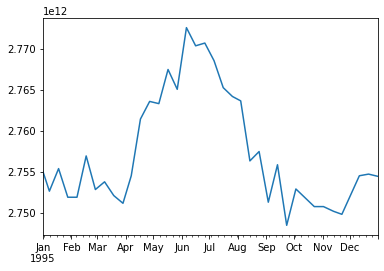

In [34]:
# Generate sample data
water_level_org = pd.read_csv('../data/DAHITI_Data/Lake_Victoria.csv')
ids = [str(i) for i in np.array(ds['ID'][:])]

for j in np.arange(1995,2010):
    
    ##
    time_index = pd.date_range(start=str(j)+'-01-01', end=str(j)+'-12-31', freq='D')
    data_array1 = xr.DataArray(-9999.0, coords=[time_index, ids], dims=['time', 'ID'])
    data_array2 = xr.DataArray(-9999.0, coords=[time_index, ids], dims=['time', 'ID'])
    dataset = xr.Dataset({'target_vol': data_array1,'abs_inj':data_array2}) 
    dataset['ID'] = dataset['ID'].astype(int)
    dataset['target_vol'] = dataset['target_vol'].astype(float)

    ## adding the target volume for lake vicotoria
    water_level = water_level_org.copy()
    water_level = water_level.drop(columns = 'error')
    water_level['date'] = pd.to_datetime(water_level['date'])  # Convert 'Date' column to datetime type
    water_level = water_level.set_index('date')  # Set 'Date' column as the index
    water_level = water_level.resample('D').asfreq()
    water_level['water_level'] = water_level['water_level'].interpolate(method='linear')
    water_level = water_level.reindex(time_index)
    water_level['water_level'] = water_level['water_level'].fillna(1135)
    water_level['storage'] = (water_level['water_level']-1135)*6.716622*10**10+2.76*10**12
    water_level['storage'].plot()

    ## pass the water level for lake victoria to the dataset
    ID = dataset['ID'][:]
    idx = np.where(ID== 7000016)[0].item() # lake victoria ID in 
    dataset['target_vol'][:,idx][:] = np.array(water_level['storage'])
    
    ## save the xarray dataset as netcdf file
    if os.path.isfile('./output/WM_'+str(j)+'.nc'):
        os.remove('./output/WM_'+str(j)+'.nc')
    dataset.to_netcdf('./output/WM_'+str(j)+'.nc',\
                      encoding = {var: {'_FillValue': -9999} for var in dataset.data_vars})
    
    